<a href="https://colab.research.google.com/github/kakaandriano0-hash/natural-style/blob/main/Tugas_Per4_Model_DCGAN_KakaAndrianoMutu_41236730.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [3]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 99% 0.99G/1.00G [00:16<00:00, 148MB/s]
100% 1.00G/1.00G [00:16<00:00, 65.1MB/s]
Dataset downloaded and extracted to /content/dataset/


In [4]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [5]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [6]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [7]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - d_loss: 0.4822 - g_loss: 0.7289

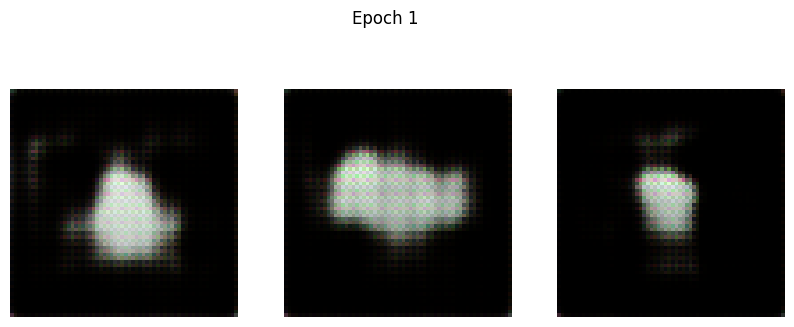

100/100 ━━━━━━━━━━━━━━━━━━━━ 48s 273ms/step - d_loss: 0.4829 - g_loss: 0.7292
Epoch 2/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6752 - g_loss: 0.7178

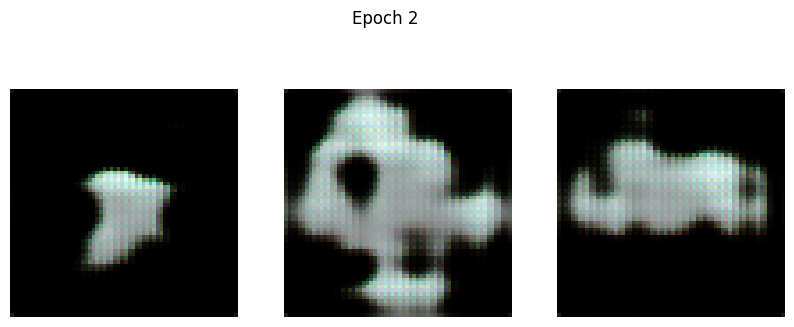

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - d_loss: 0.6752 - g_loss: 0.7177
Epoch 3/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6703 - g_loss: 0.7103

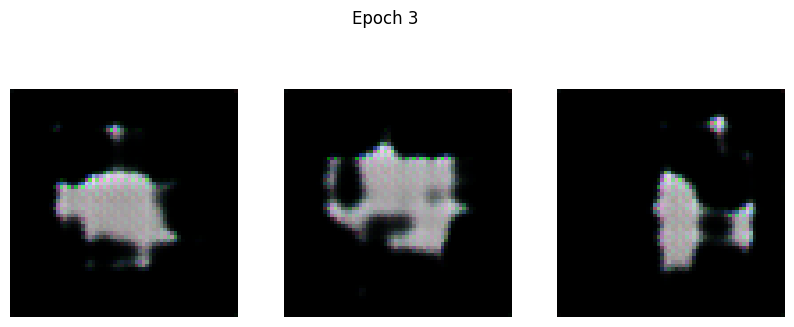

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 0.6702 - g_loss: 0.7104
Epoch 4/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6542 - g_loss: 0.7759

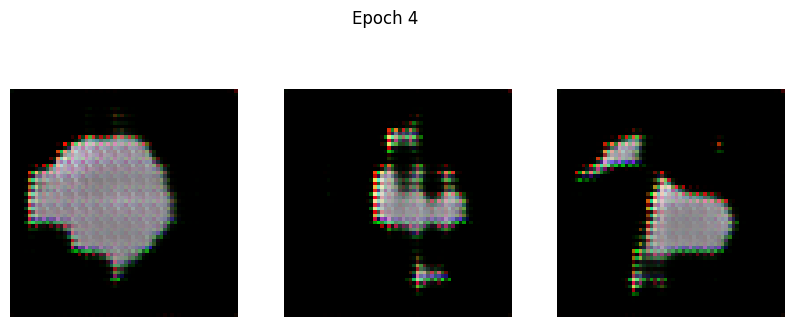

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6542 - g_loss: 0.7759
Epoch 5/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6594 - g_loss: 0.7971

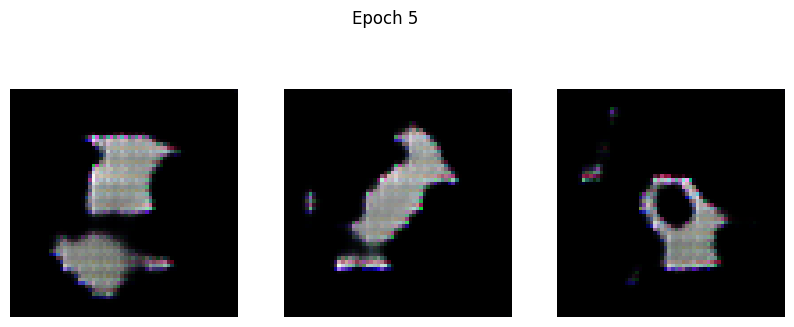

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 0.6594 - g_loss: 0.7971
Epoch 6/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6500 - g_loss: 0.7817

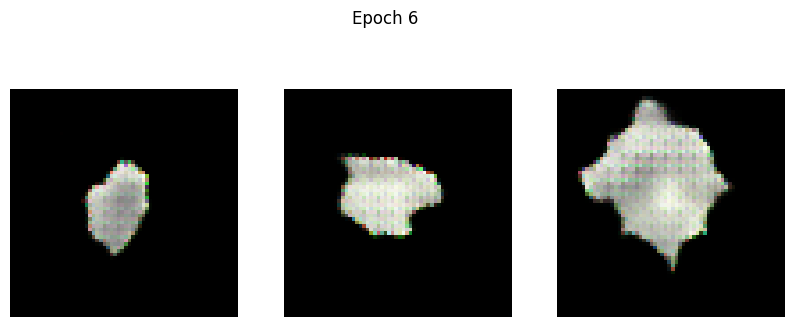

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6500 - g_loss: 0.7817
Epoch 7/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6573 - g_loss: 0.7855

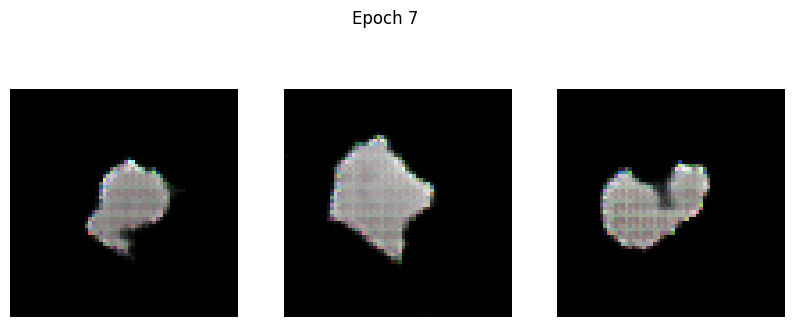

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6574 - g_loss: 0.7853
Epoch 8/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6493 - g_loss: 0.7590

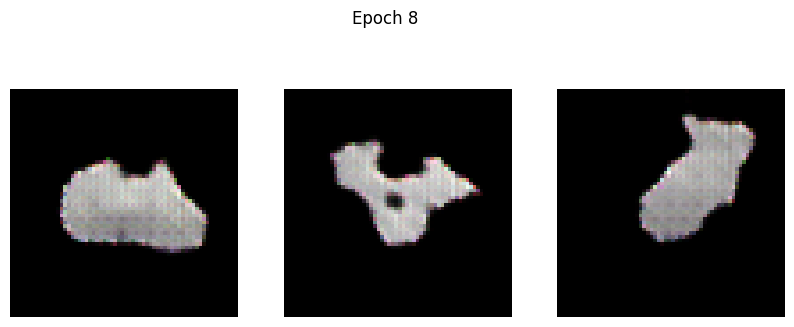

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6494 - g_loss: 0.7590
Epoch 9/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6595 - g_loss: 0.7430

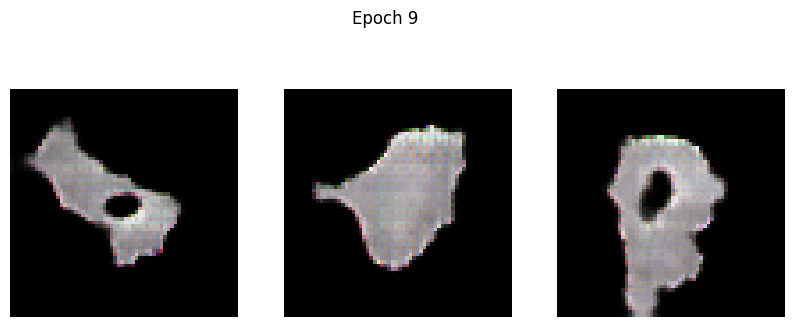

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6595 - g_loss: 0.7431
Epoch 10/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6607 - g_loss: 0.7394

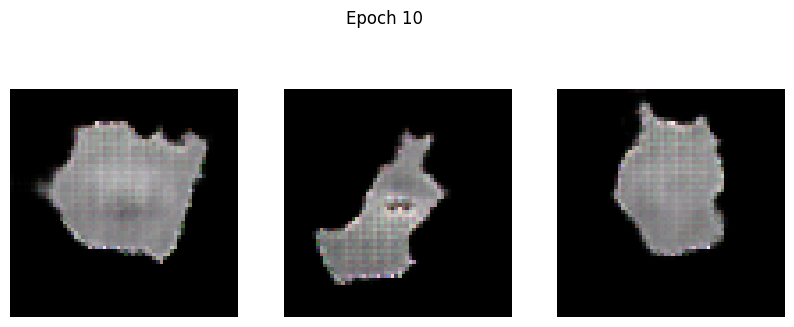

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6606 - g_loss: 0.7395
Epoch 11/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6514 - g_loss: 0.7866

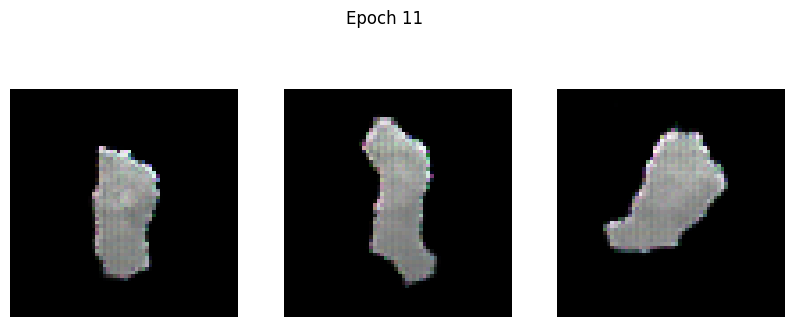

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6514 - g_loss: 0.7866
Epoch 12/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6351 - g_loss: 0.8090

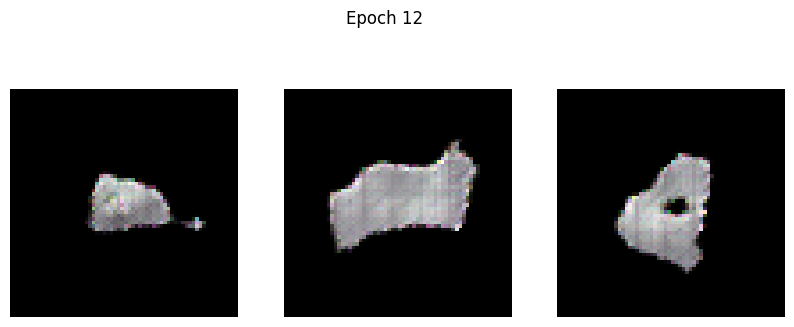

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6351 - g_loss: 0.8092
Epoch 13/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6186 - g_loss: 0.8843

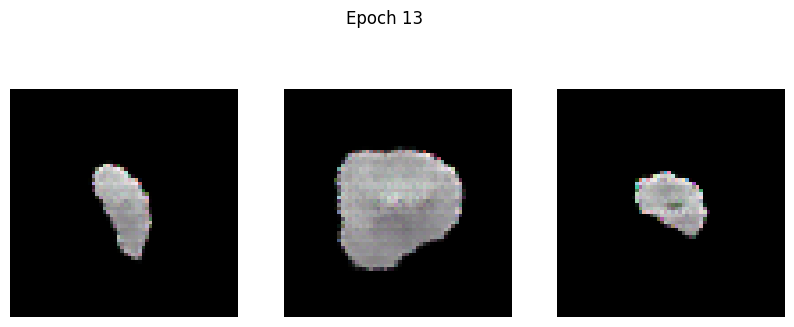

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6186 - g_loss: 0.8843
Epoch 14/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6033 - g_loss: 0.9175

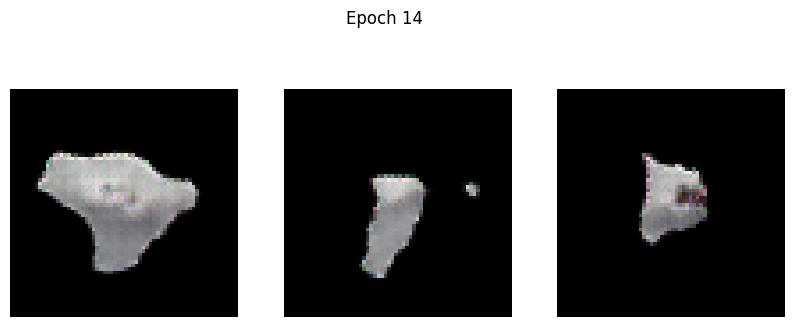

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6033 - g_loss: 0.9175
Epoch 15/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.5983 - g_loss: 0.9354

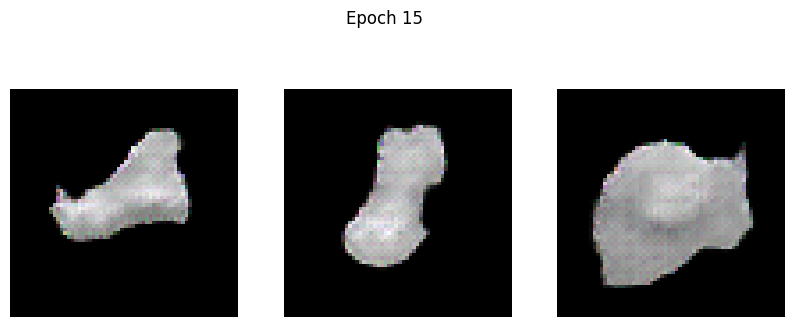

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5983 - g_loss: 0.9355
Epoch 16/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5704 - g_loss: 0.9527

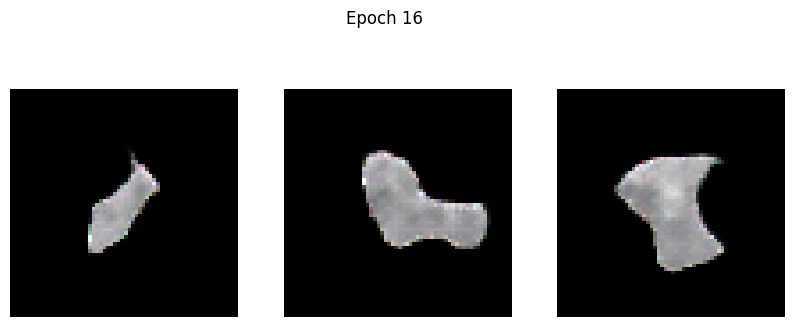

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5704 - g_loss: 0.9530
Epoch 17/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5550 - g_loss: 0.9913

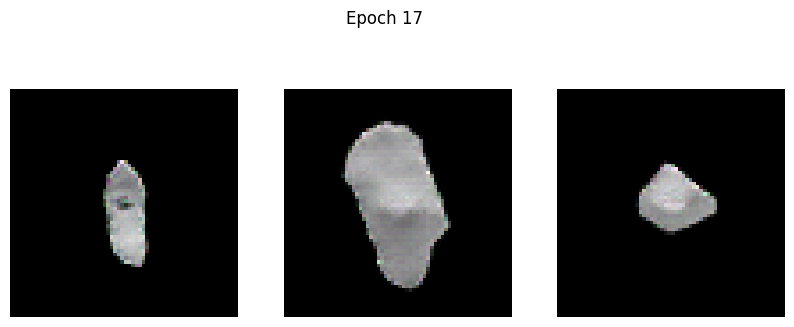

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.5550 - g_loss: 0.9911
Epoch 18/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5474 - g_loss: 1.0253

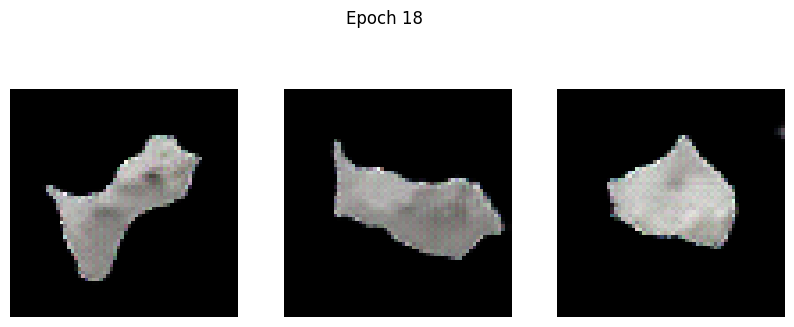

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5474 - g_loss: 1.0253
Epoch 19/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5538 - g_loss: 1.0425

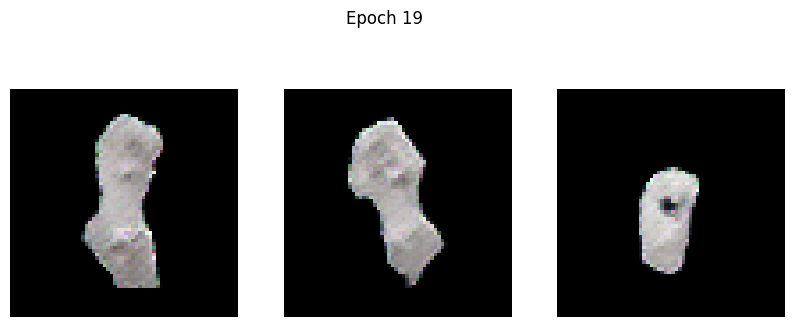

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5537 - g_loss: 1.0426
Epoch 20/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5231 - g_loss: 1.0639

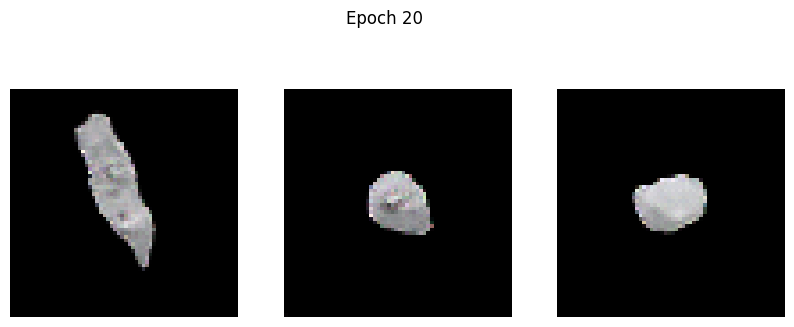

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5231 - g_loss: 1.0639
Epoch 21/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5114 - g_loss: 1.1136

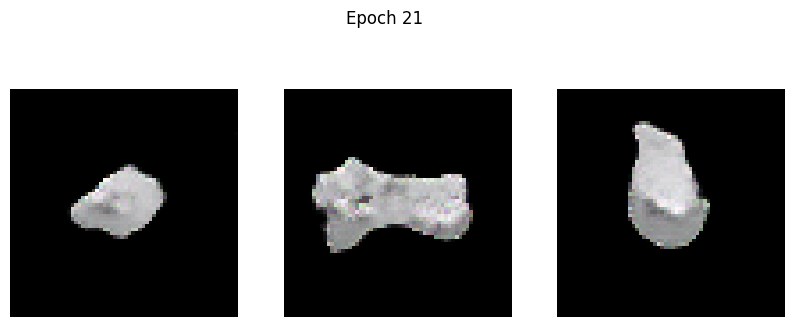

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5115 - g_loss: 1.1136
Epoch 22/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5184 - g_loss: 1.1275

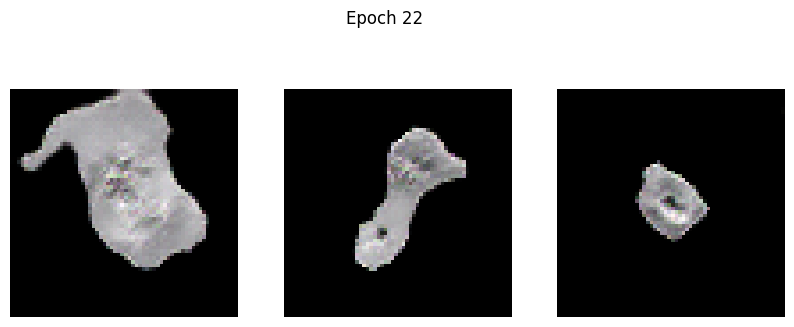

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5183 - g_loss: 1.1276
Epoch 23/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4821 - g_loss: 1.1876

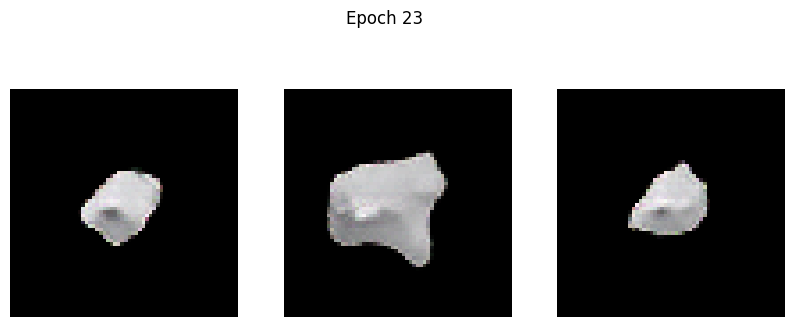

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4822 - g_loss: 1.1876
Epoch 24/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5053 - g_loss: 1.2020

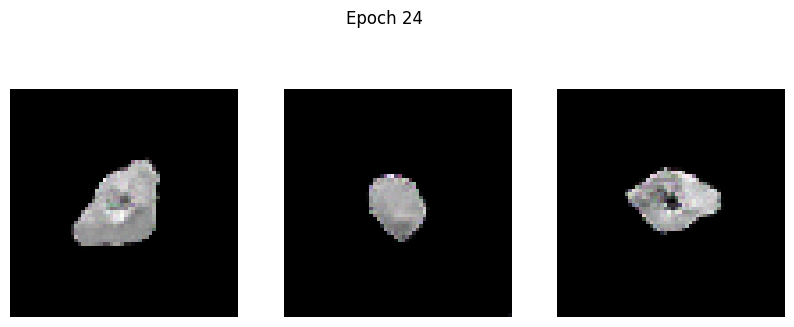

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5051 - g_loss: 1.2020
Epoch 25/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4694 - g_loss: 1.2321

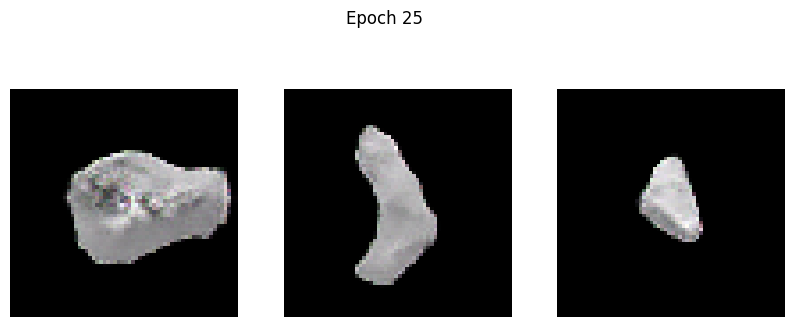

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4694 - g_loss: 1.2323
Epoch 26/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4577 - g_loss: 1.2935

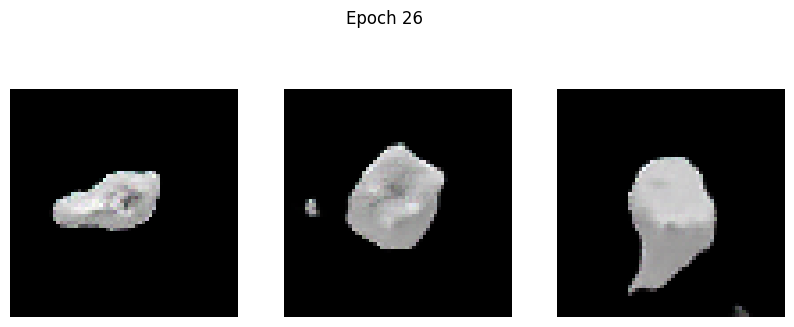

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4577 - g_loss: 1.2937
Epoch 27/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4255 - g_loss: 1.2810

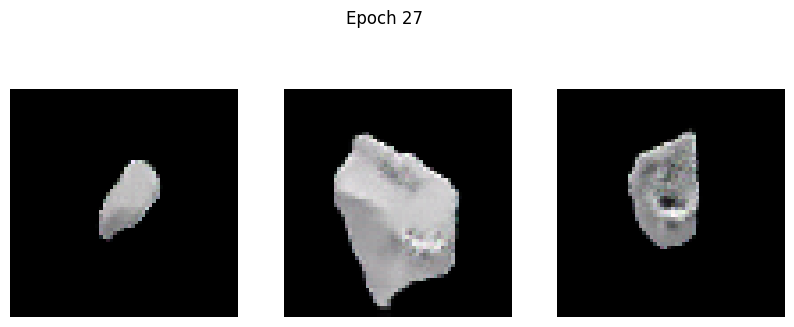

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4256 - g_loss: 1.2814
Epoch 28/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4475 - g_loss: 1.3841

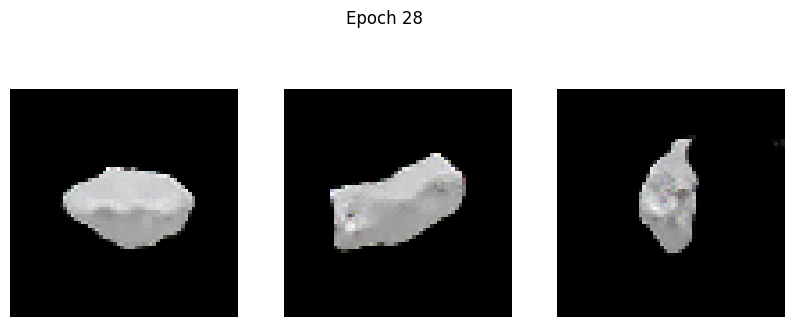

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4475 - g_loss: 1.3839
Epoch 29/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4078 - g_loss: 1.3566

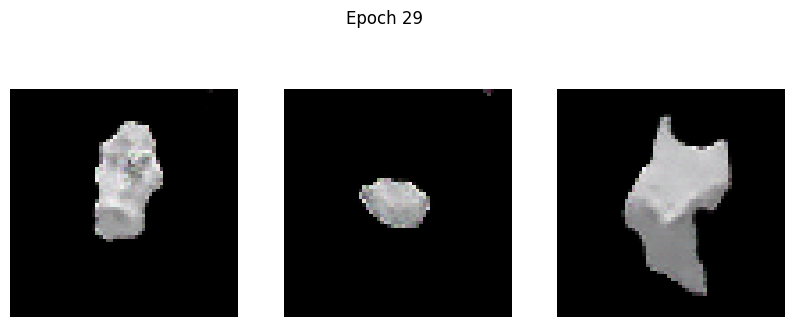

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4079 - g_loss: 1.3568
Epoch 30/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4147 - g_loss: 1.4409

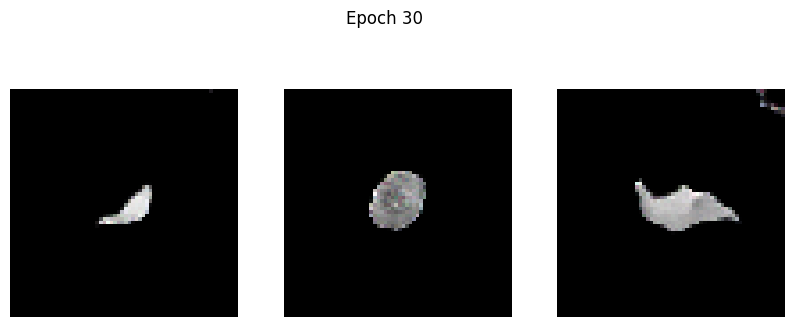

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4146 - g_loss: 1.4408
Epoch 31/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4341 - g_loss: 1.5299

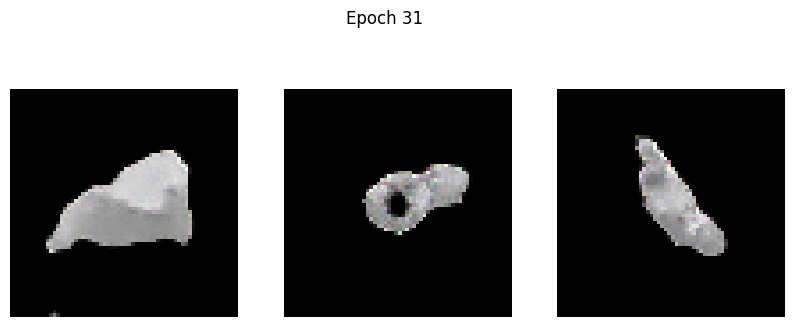

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4340 - g_loss: 1.5296
Epoch 32/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4036 - g_loss: 1.4750

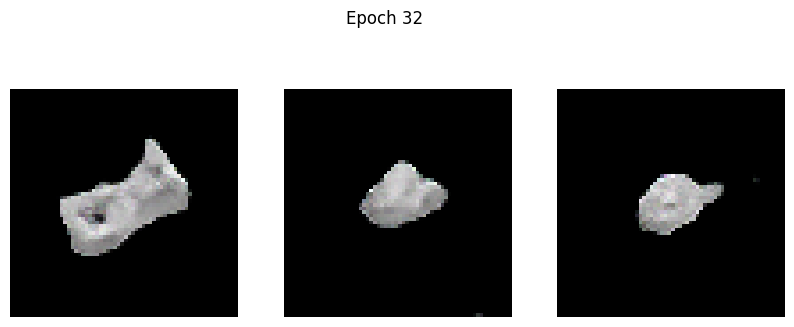

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4035 - g_loss: 1.4751
Epoch 33/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4222 - g_loss: 1.5525

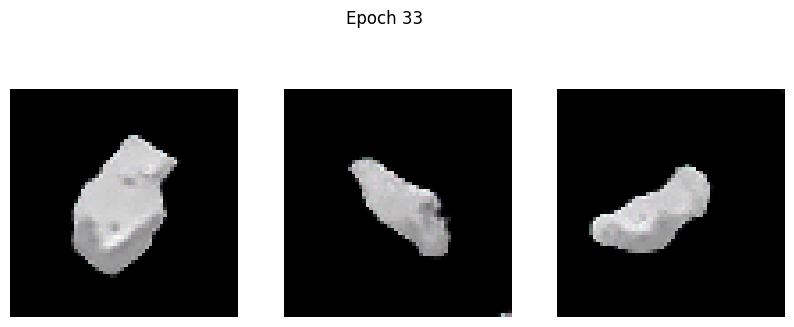

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4222 - g_loss: 1.5523
Epoch 34/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3735 - g_loss: 1.5281

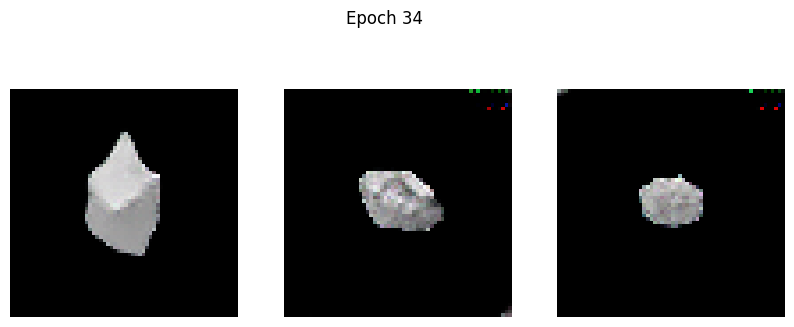

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3736 - g_loss: 1.5282
Epoch 35/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3737 - g_loss: 1.6119

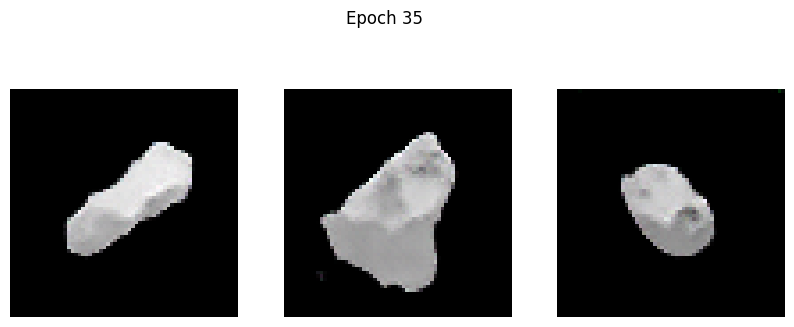

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3738 - g_loss: 1.6116
Epoch 36/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3612 - g_loss: 1.5770

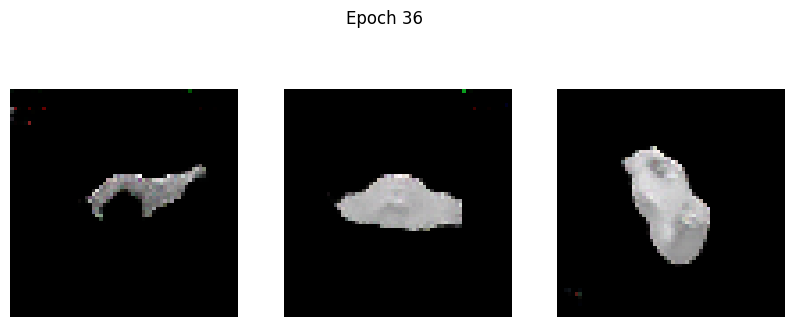

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3615 - g_loss: 1.5773
Epoch 37/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3388 - g_loss: 1.5747

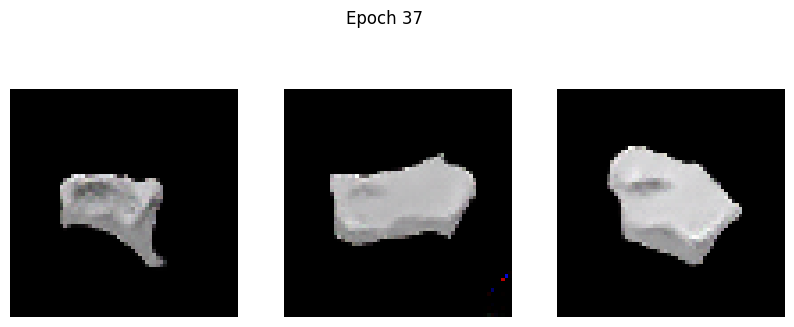

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3389 - g_loss: 1.5750
Epoch 38/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3914 - g_loss: 1.6458

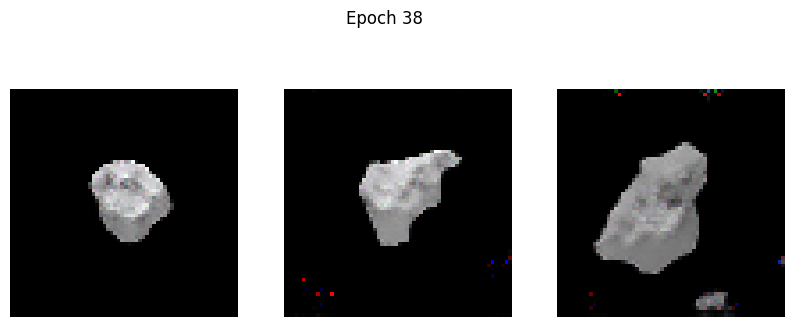

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3918 - g_loss: 1.6464
Epoch 39/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3274 - g_loss: 1.5602

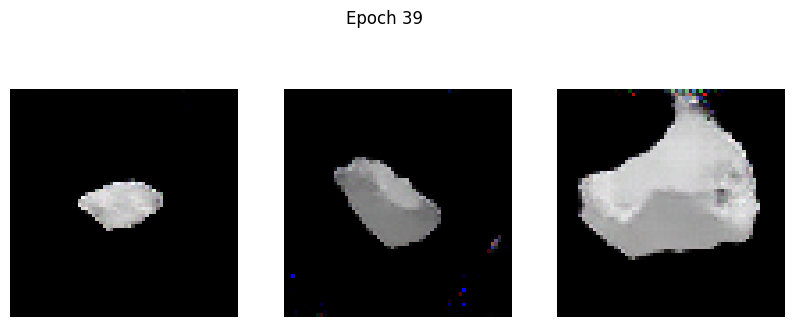

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3275 - g_loss: 1.5603
Epoch 40/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3606 - g_loss: 1.6373

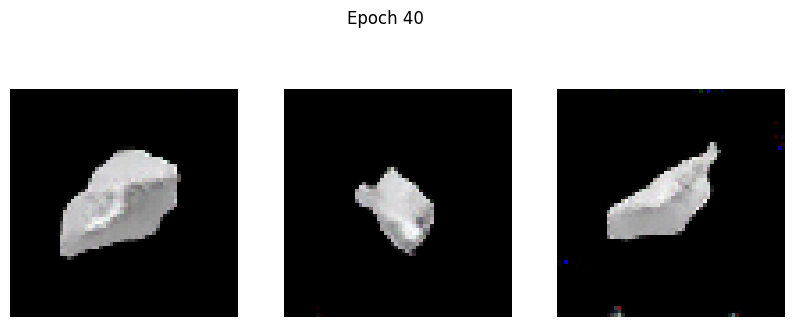

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3606 - g_loss: 1.6375
Epoch 41/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3613 - g_loss: 1.6798

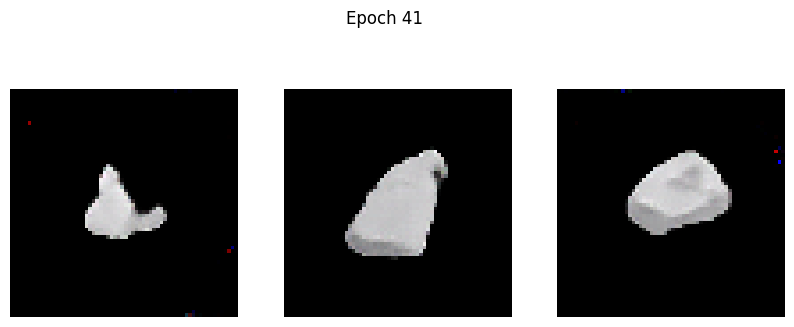

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3611 - g_loss: 1.6798
Epoch 42/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3479 - g_loss: 1.7695

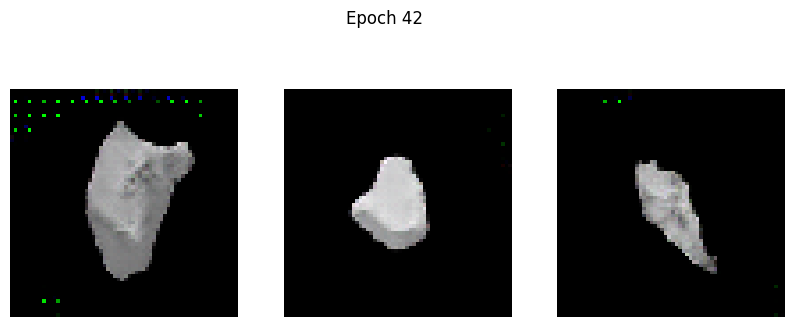

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3485 - g_loss: 1.7704
Epoch 43/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4023 - g_loss: 1.6719

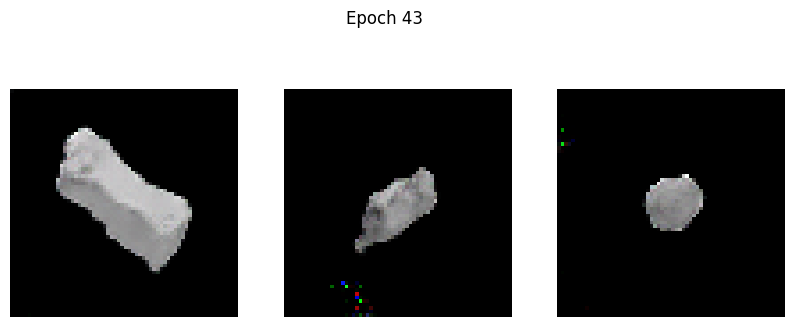

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4018 - g_loss: 1.6717
Epoch 44/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3267 - g_loss: 1.7174

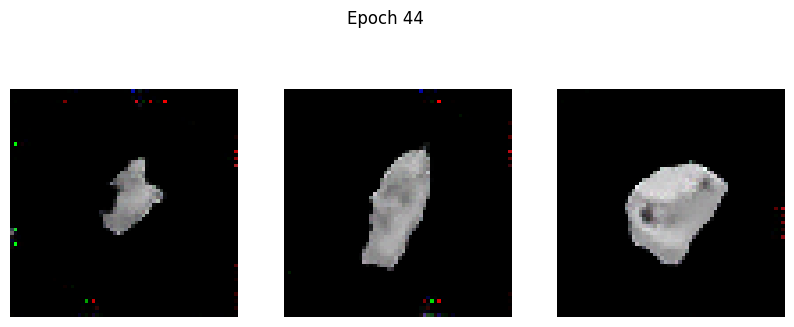

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3268 - g_loss: 1.7177
Epoch 45/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3219 - g_loss: 1.6796

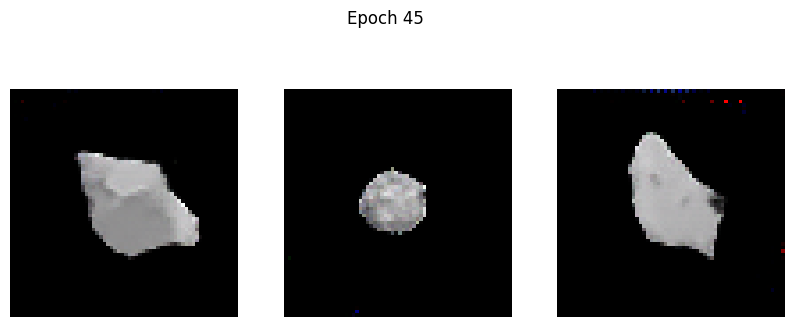

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3221 - g_loss: 1.6802
Epoch 46/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3461 - g_loss: 1.8182

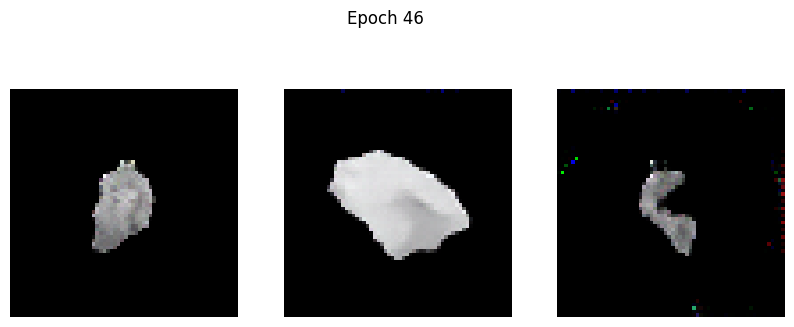

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3459 - g_loss: 1.8177
Epoch 47/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3571 - g_loss: 1.8797

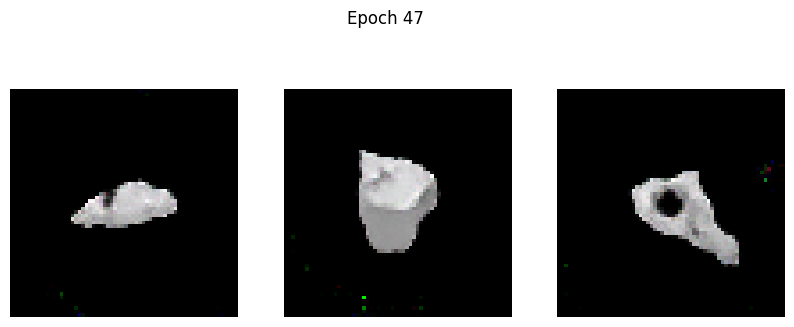

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3572 - g_loss: 1.8794
Epoch 48/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3124 - g_loss: 1.7506

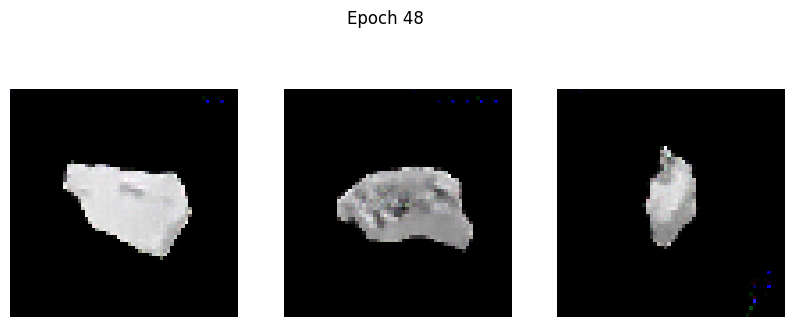

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3125 - g_loss: 1.7510
Epoch 49/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3401 - g_loss: 1.7794

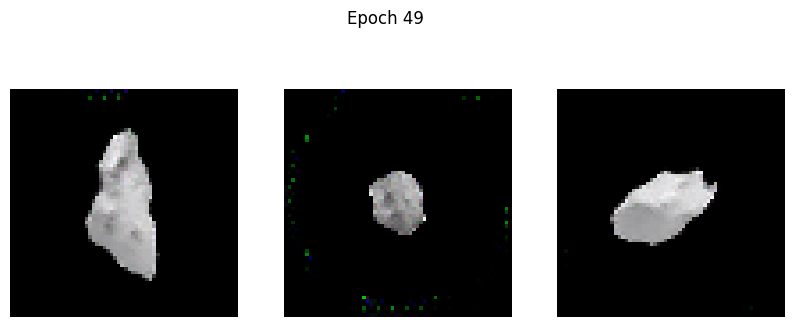

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3399 - g_loss: 1.7799
Epoch 50/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3059 - g_loss: 1.8116

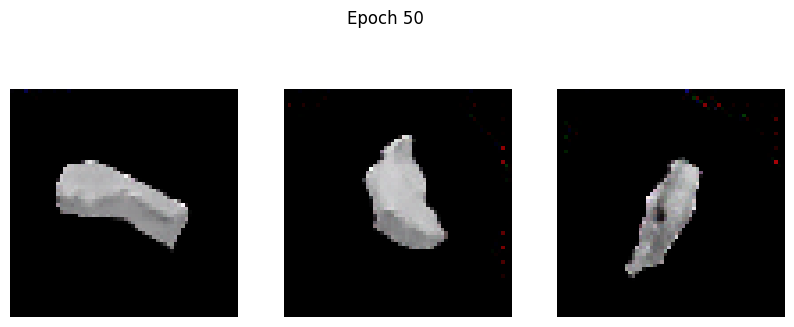

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3059 - g_loss: 1.8121
Epoch 51/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3111 - g_loss: 1.8675

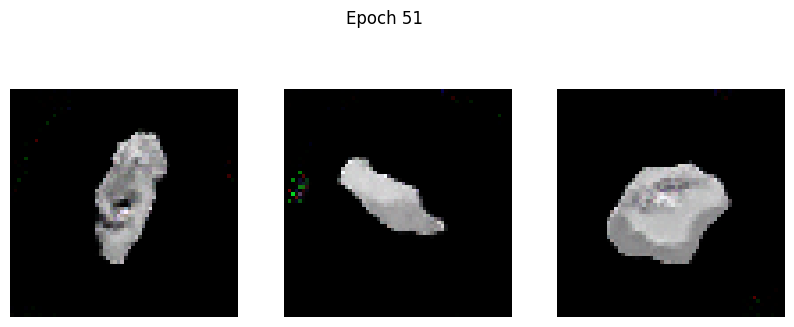

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.3112 - g_loss: 1.8677
Epoch 52/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3044 - g_loss: 1.9710

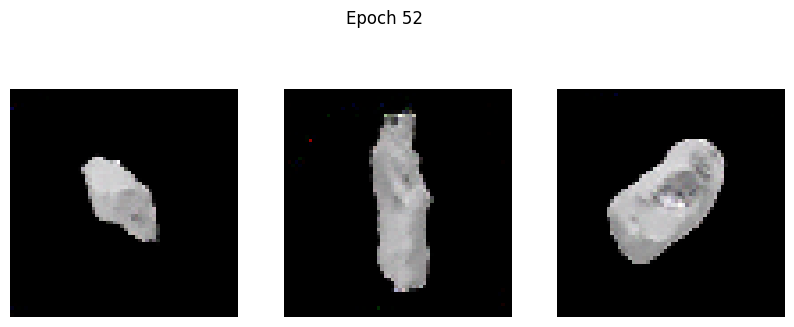

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3044 - g_loss: 1.9708
Epoch 53/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.3182 - g_loss: 1.9457

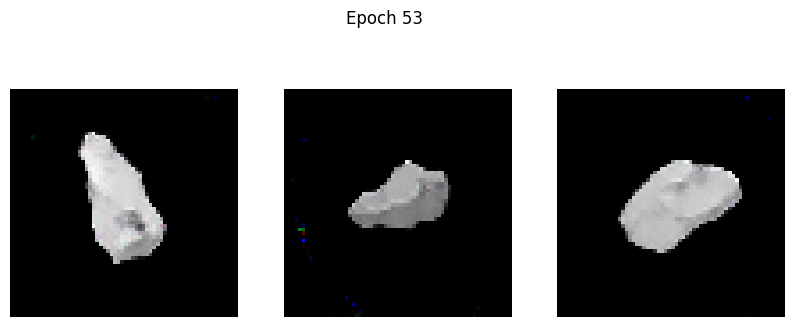

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.3185 - g_loss: 1.9464
Epoch 54/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2731 - g_loss: 1.9147

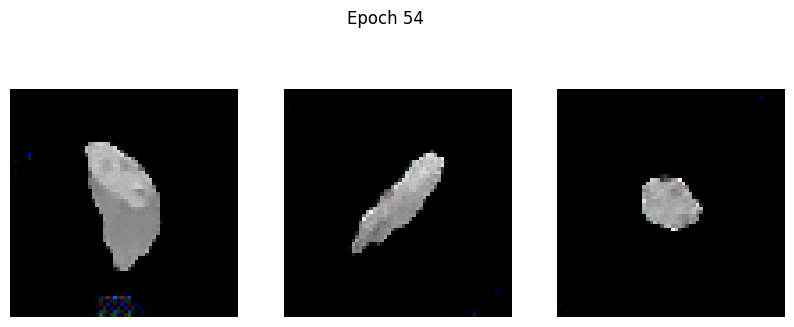

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2734 - g_loss: 1.9149
Epoch 55/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2605 - g_loss: 1.8962

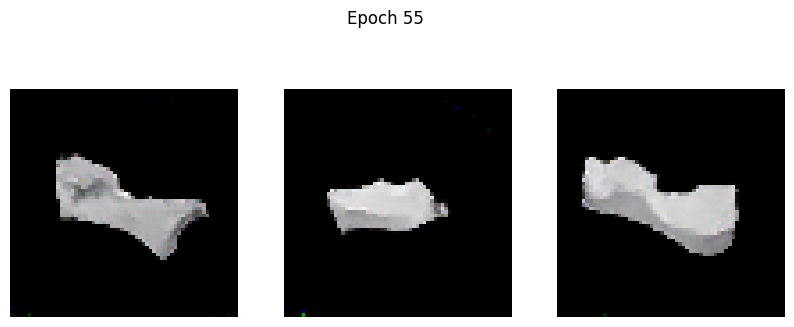

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2606 - g_loss: 1.8966
Epoch 56/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2827 - g_loss: 2.0139

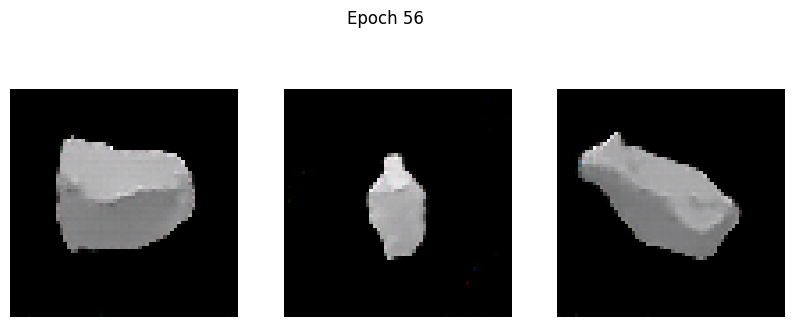

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2829 - g_loss: 2.0138
Epoch 57/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2697 - g_loss: 1.9837

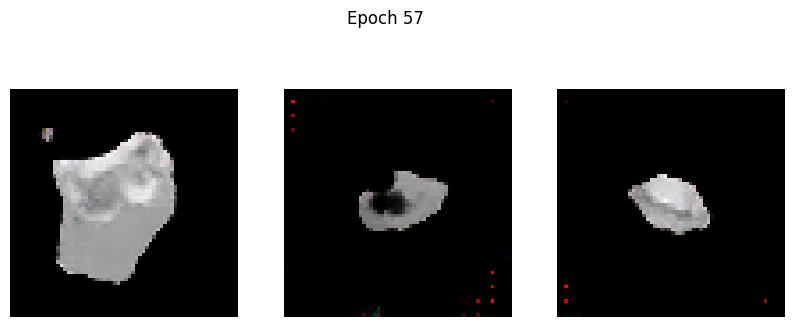

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2698 - g_loss: 1.9842
Epoch 58/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3587 - g_loss: 2.2096

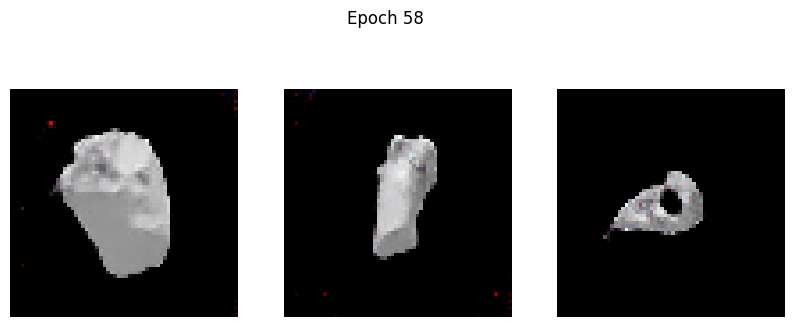

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3587 - g_loss: 2.2087
Epoch 59/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2790 - g_loss: 1.9530

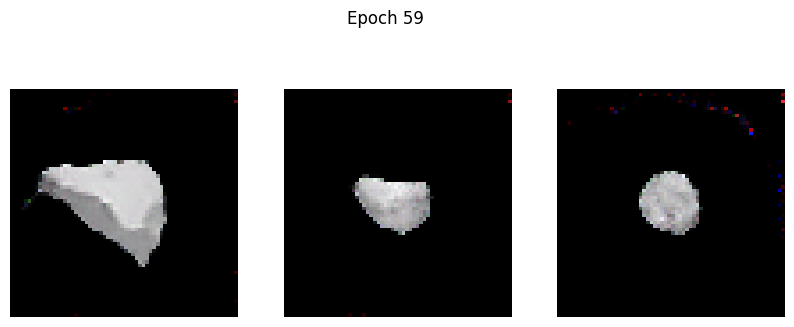

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2790 - g_loss: 1.9534
Epoch 60/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3532 - g_loss: 2.0716

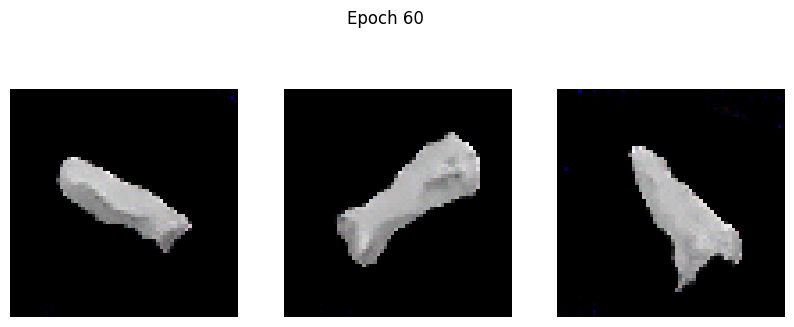

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3527 - g_loss: 2.0712
Epoch 61/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3723 - g_loss: 2.4886

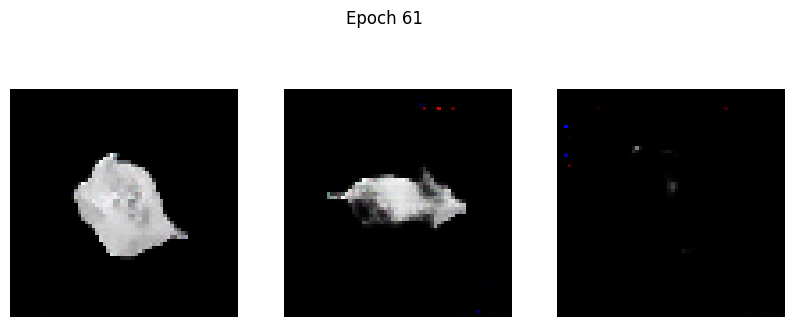

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3719 - g_loss: 2.4934
Epoch 62/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2254 - g_loss: 2.2920

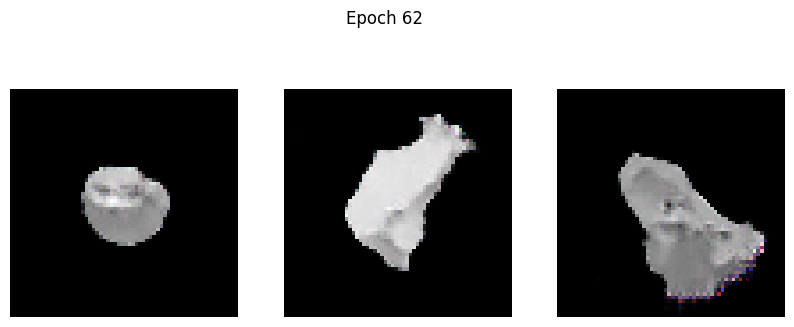

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2256 - g_loss: 2.2902
Epoch 63/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2720 - g_loss: 2.0161

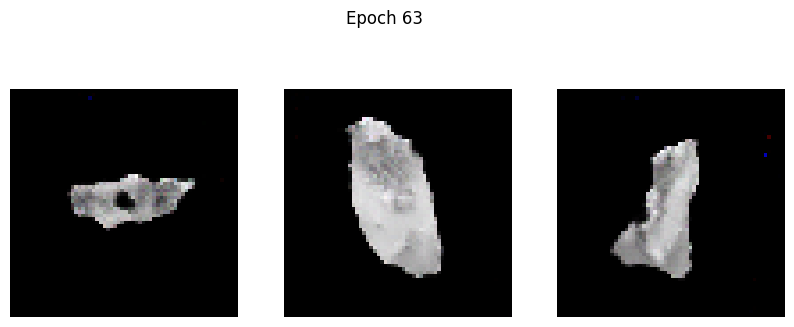

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2720 - g_loss: 2.0163
Epoch 64/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2551 - g_loss: 2.0355

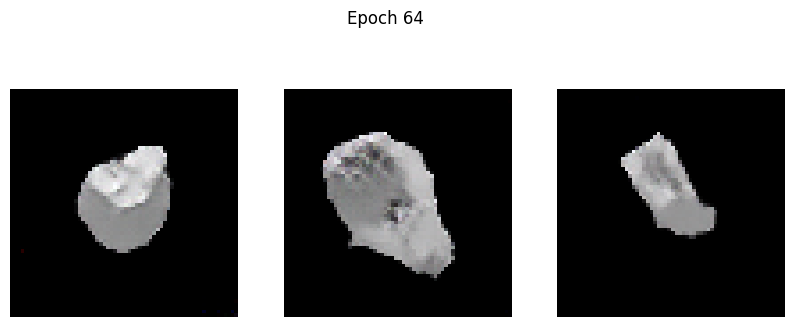

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2551 - g_loss: 2.0355
Epoch 65/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2598 - g_loss: 2.0862

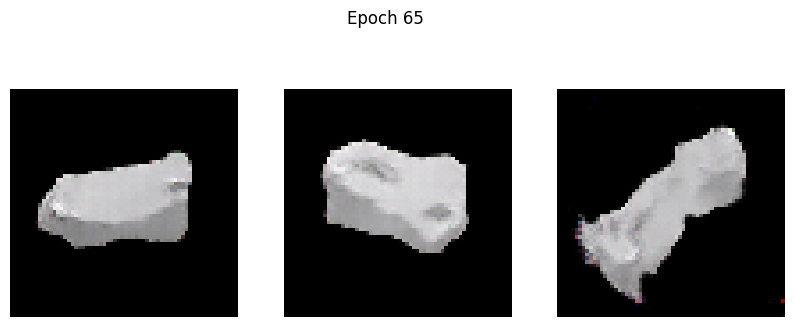

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2600 - g_loss: 2.0868
Epoch 66/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2625 - g_loss: 2.0723

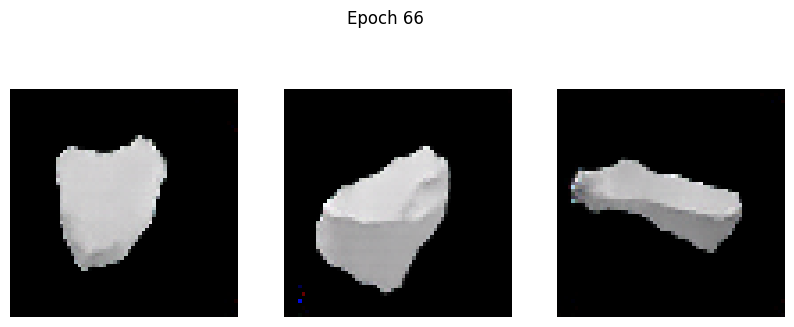

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2627 - g_loss: 2.0727
Epoch 67/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2578 - g_loss: 2.0955

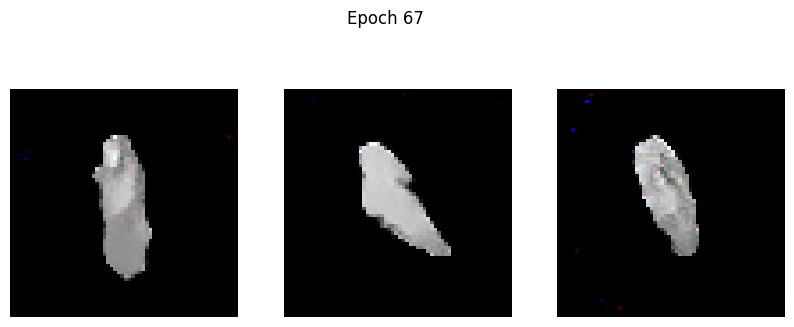

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2579 - g_loss: 2.0958
Epoch 68/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2942 - g_loss: 2.1823

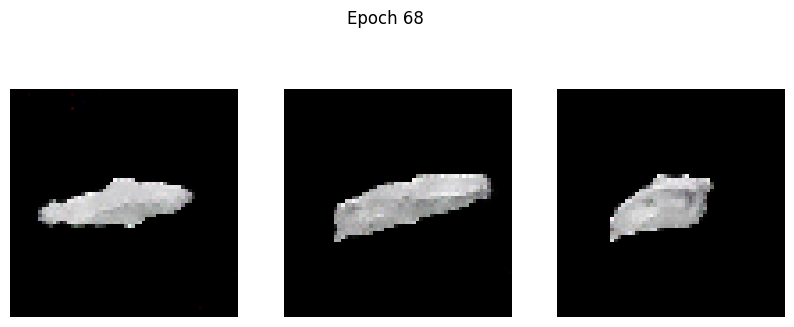

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2941 - g_loss: 2.1822
Epoch 69/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2533 - g_loss: 2.1638

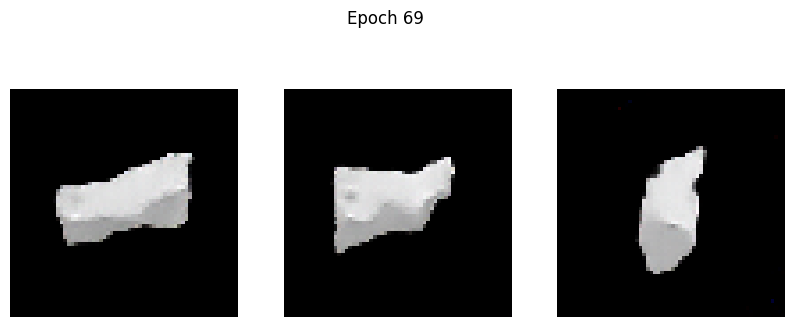

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2533 - g_loss: 2.1638
Epoch 70/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3653 - g_loss: 2.4017

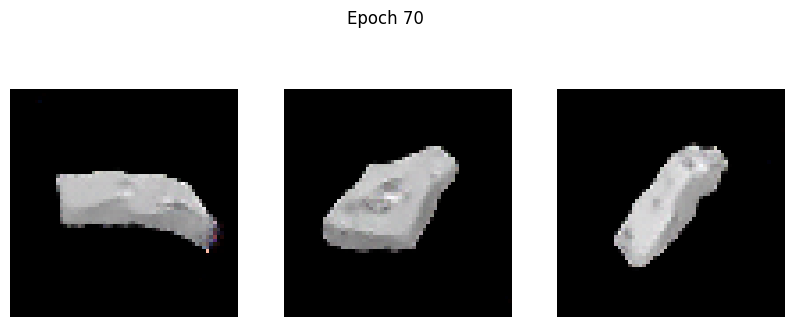

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.3650 - g_loss: 2.4004
Epoch 71/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2416 - g_loss: 2.1339

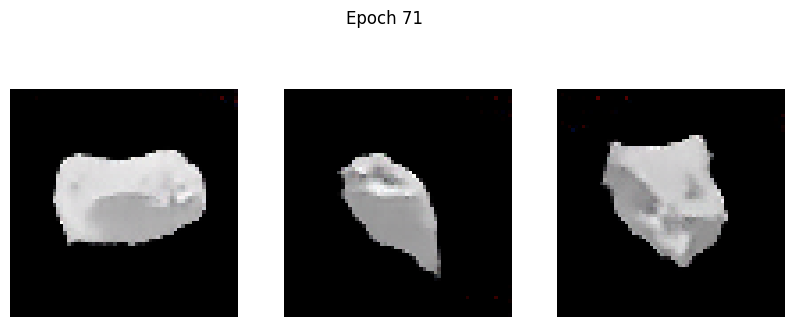

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2416 - g_loss: 2.1342
Epoch 72/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2457 - g_loss: 2.2276

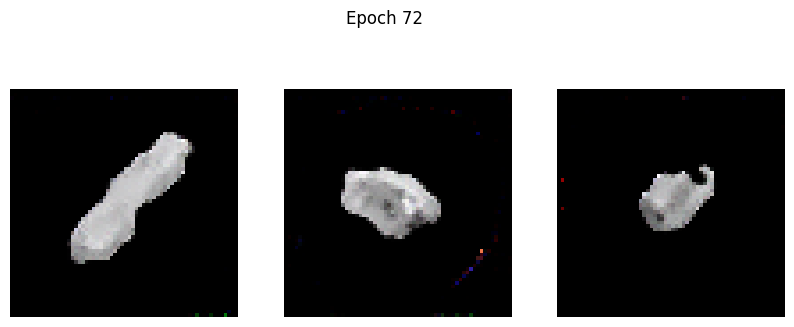

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2460 - g_loss: 2.2277
Epoch 73/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2445 - g_loss: 2.2602

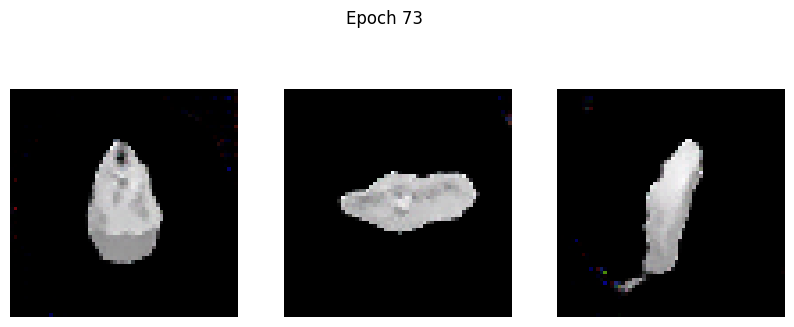

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2446 - g_loss: 2.2603
Epoch 74/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2565 - g_loss: 2.2054

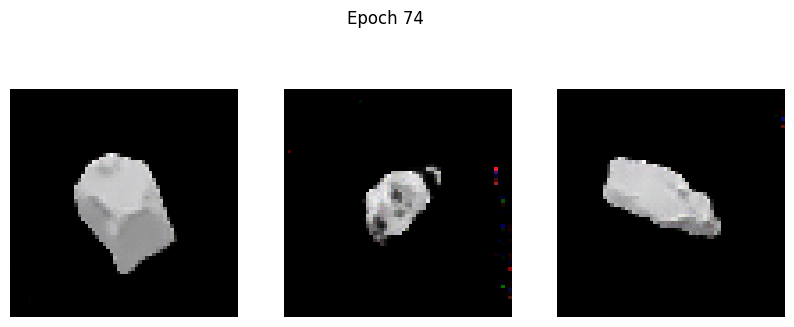

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2564 - g_loss: 2.2056
Epoch 75/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3066 - g_loss: 2.3888

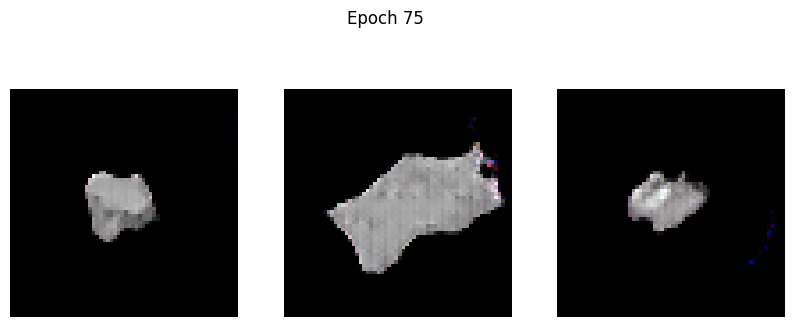

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3079 - g_loss: 2.3923
Epoch 76/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3932 - g_loss: 2.1461

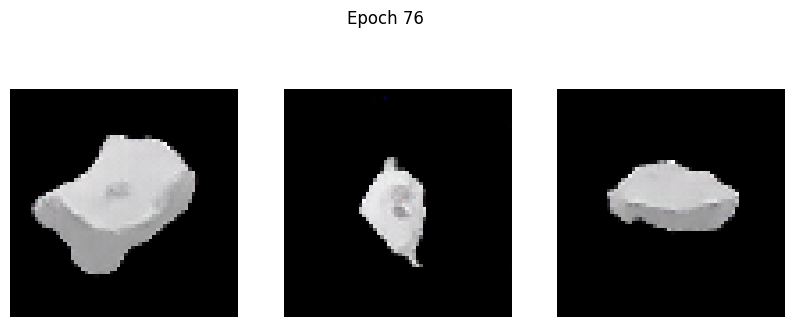

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3922 - g_loss: 2.1453
Epoch 77/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2200 - g_loss: 2.1043

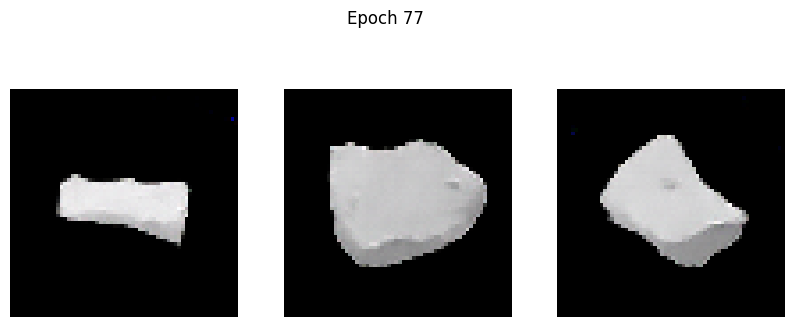

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2199 - g_loss: 2.1045
Epoch 78/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2131 - g_loss: 2.2354

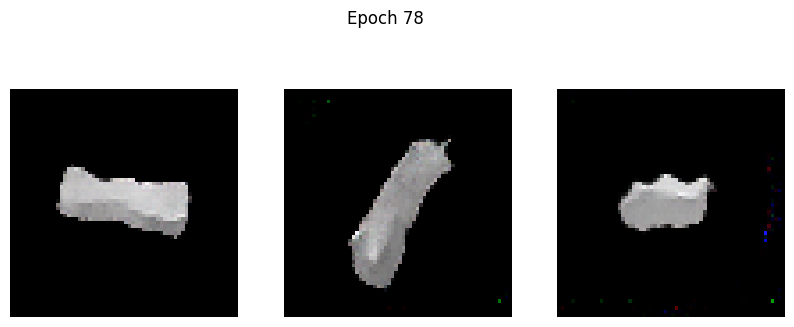

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2132 - g_loss: 2.2354
Epoch 79/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2164 - g_loss: 2.2378

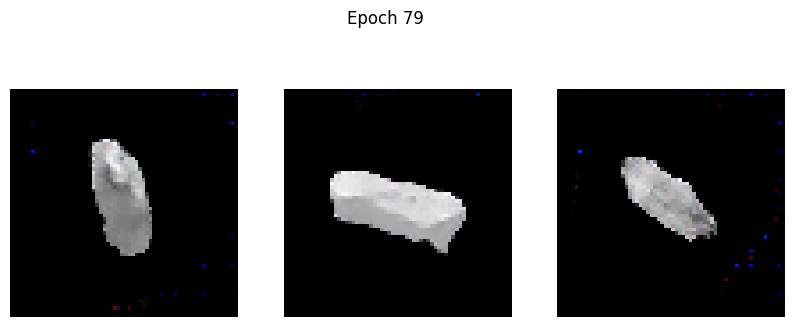

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2166 - g_loss: 2.2381
Epoch 80/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2781 - g_loss: 2.3437

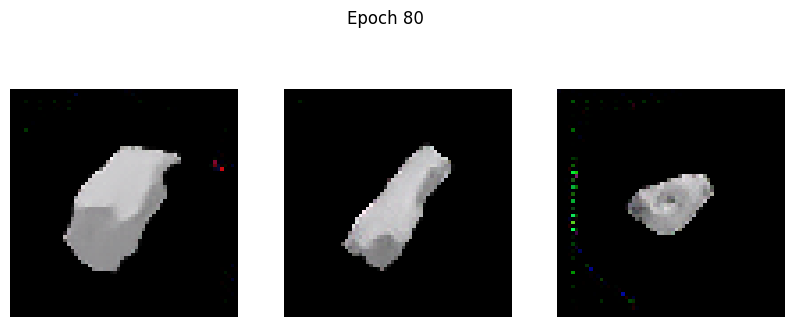

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2782 - g_loss: 2.3442
Epoch 81/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2060 - g_loss: 2.2644

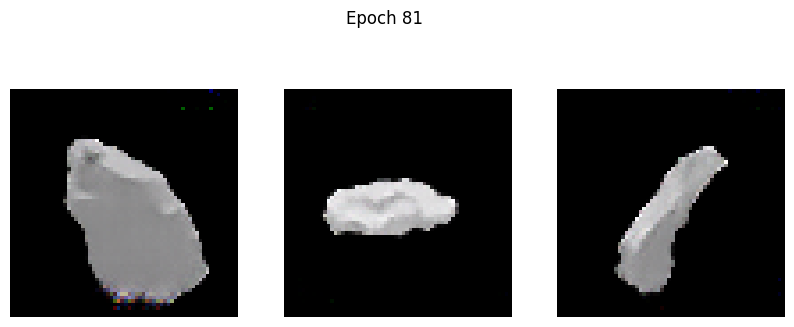

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2062 - g_loss: 2.2647
Epoch 82/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2633 - g_loss: 2.4370

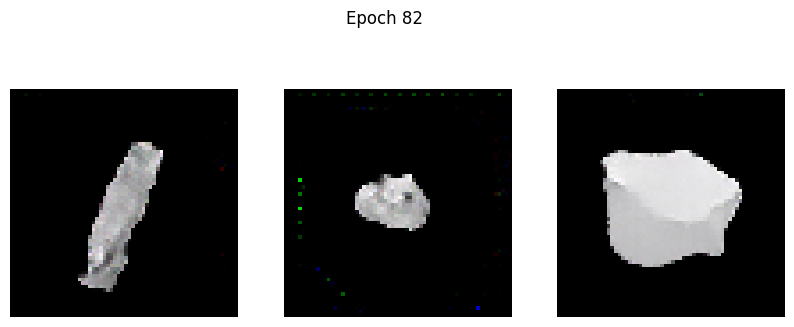

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2630 - g_loss: 2.4360
Epoch 83/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2821 - g_loss: 2.4179

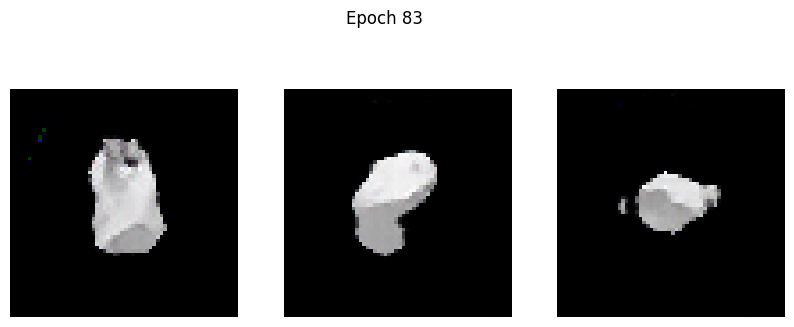

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2819 - g_loss: 2.4173
Epoch 84/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2012 - g_loss: 2.3624

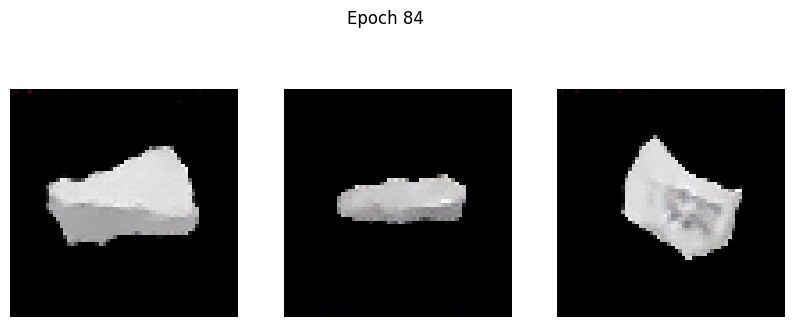

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2015 - g_loss: 2.3628
Epoch 85/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1897 - g_loss: 2.3631

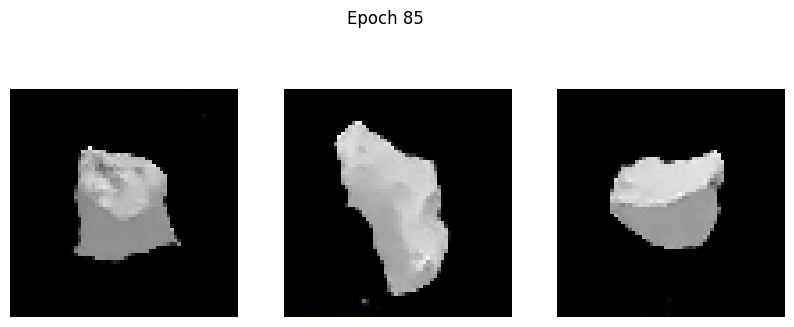

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1902 - g_loss: 2.3636
Epoch 86/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2199 - g_loss: 2.4361

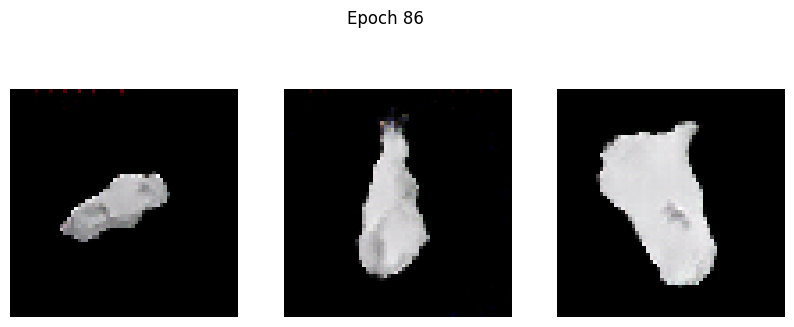

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2200 - g_loss: 2.4361
Epoch 87/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2197 - g_loss: 2.4500

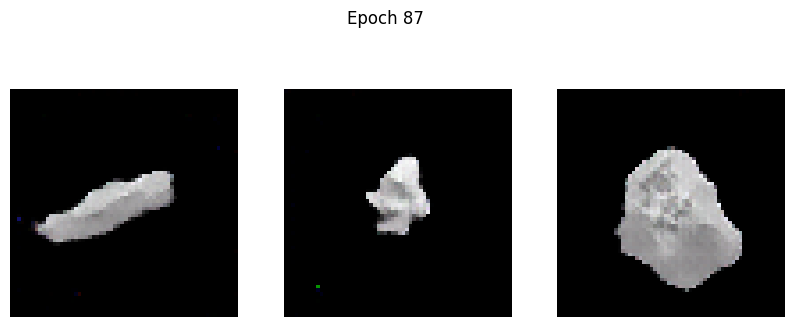

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2211 - g_loss: 2.4530
Epoch 88/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3168 - g_loss: 2.5077

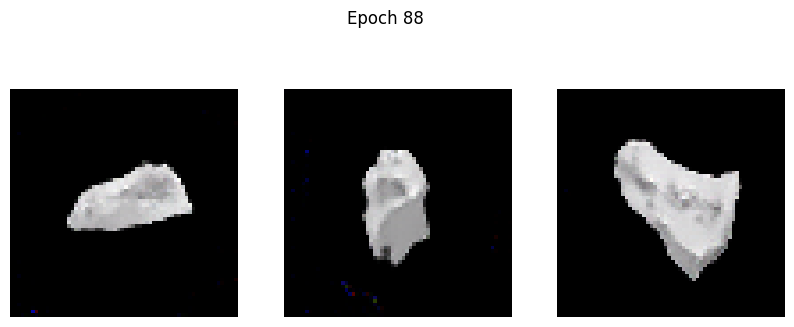

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3160 - g_loss: 2.5060
Epoch 89/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2004 - g_loss: 2.3518

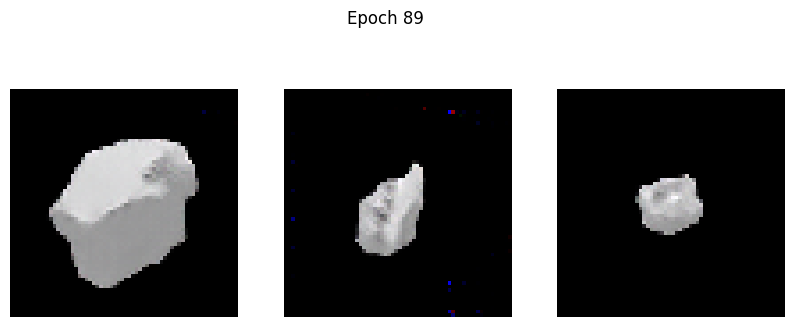

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2005 - g_loss: 2.3519
Epoch 90/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1952 - g_loss: 2.3968

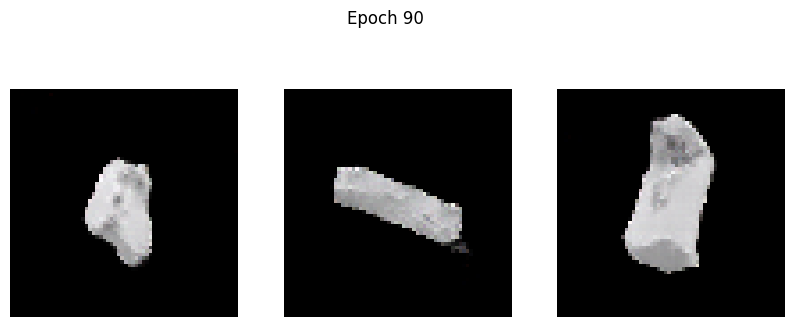

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1955 - g_loss: 2.3970
Epoch 91/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2816 - g_loss: 2.5265

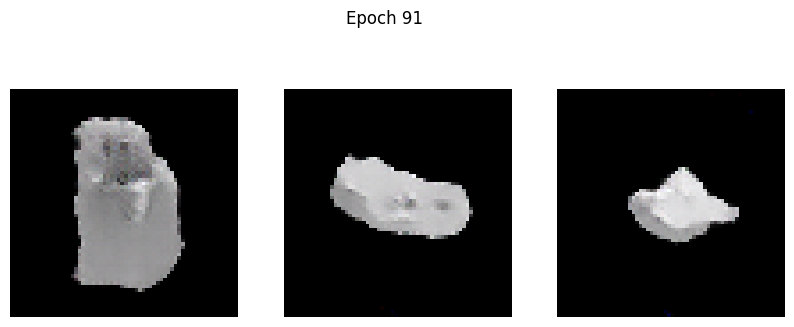

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2811 - g_loss: 2.5257
Epoch 92/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1857 - g_loss: 2.4937

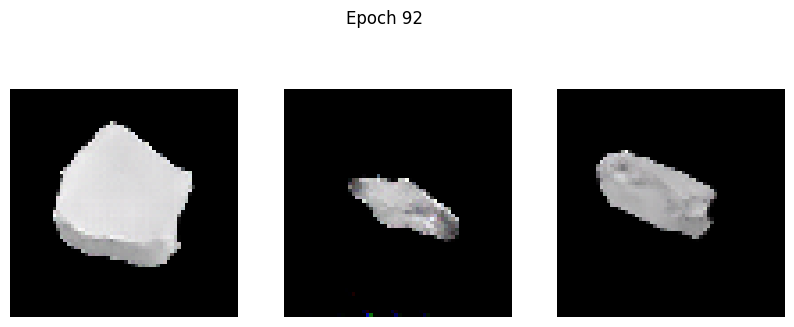

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1862 - g_loss: 2.4939
Epoch 93/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1997 - g_loss: 2.4242

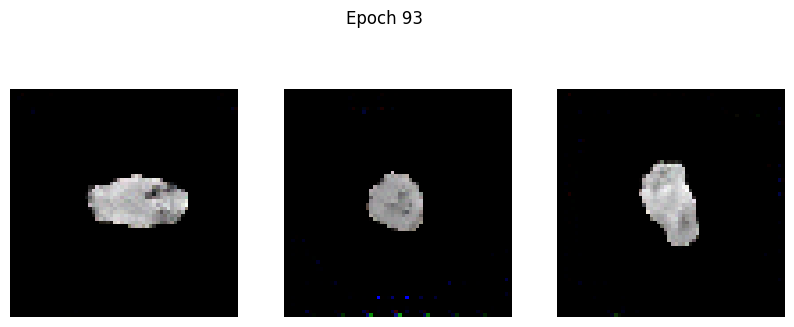

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1997 - g_loss: 2.4246
Epoch 94/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2136 - g_loss: 2.5450

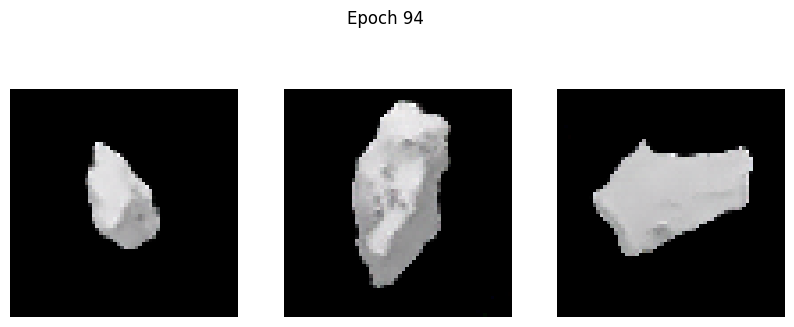

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2137 - g_loss: 2.5447
Epoch 95/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2162 - g_loss: 2.5139

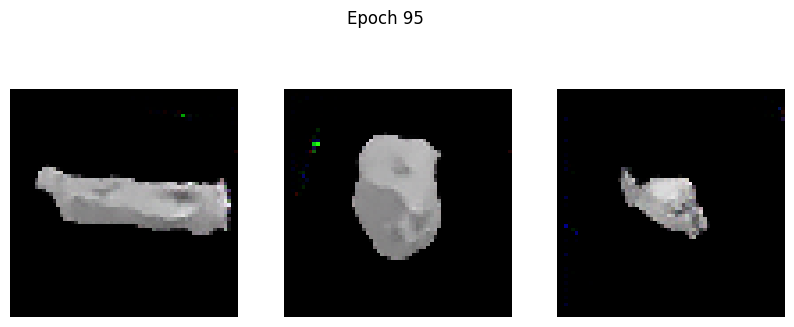

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2163 - g_loss: 2.5145
Epoch 96/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2119 - g_loss: 2.5986

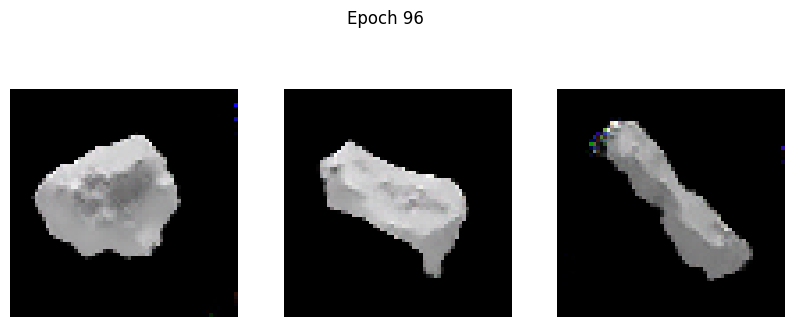

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2122 - g_loss: 2.5985
Epoch 97/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1852 - g_loss: 2.5099

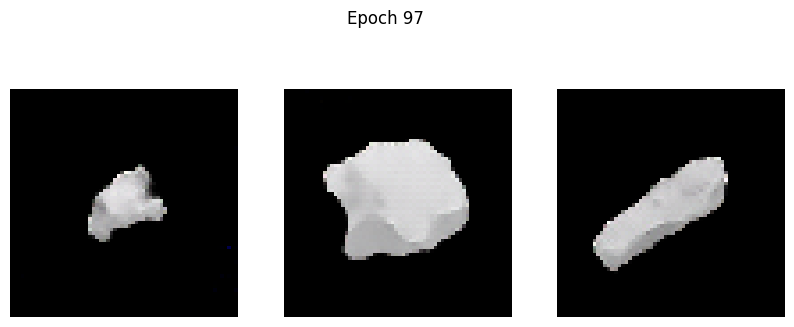

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1862 - g_loss: 2.5109
Epoch 98/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2085 - g_loss: 2.4405

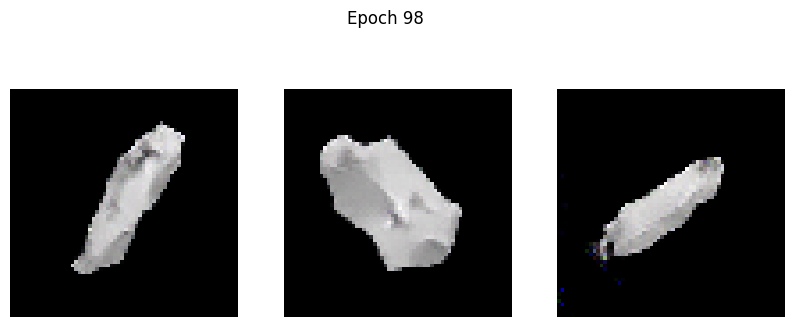

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2084 - g_loss: 2.4410
Epoch 99/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1780 - g_loss: 2.5072

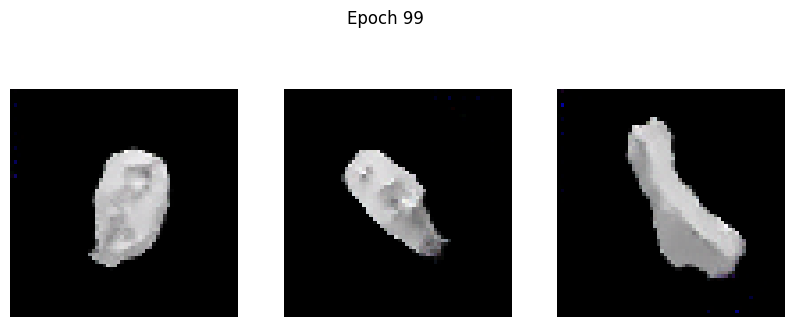

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1784 - g_loss: 2.5076
Epoch 100/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1783 - g_loss: 2.5917

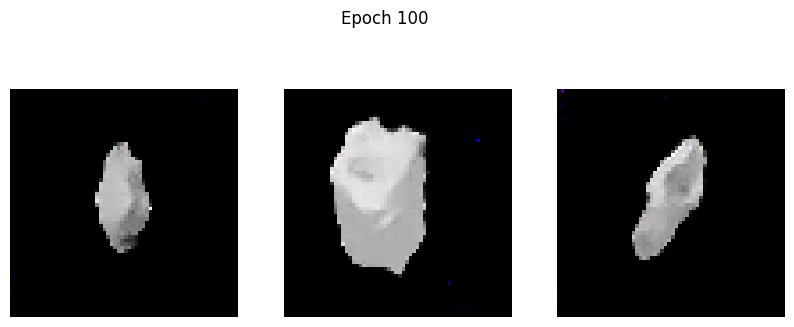

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1783 - g_loss: 2.5917
Epoch 101/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2134 - g_loss: 2.6605

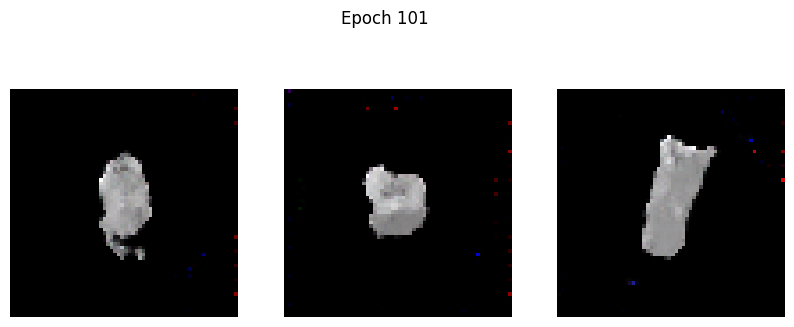

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2134 - g_loss: 2.6602
Epoch 102/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3413 - g_loss: 2.8291

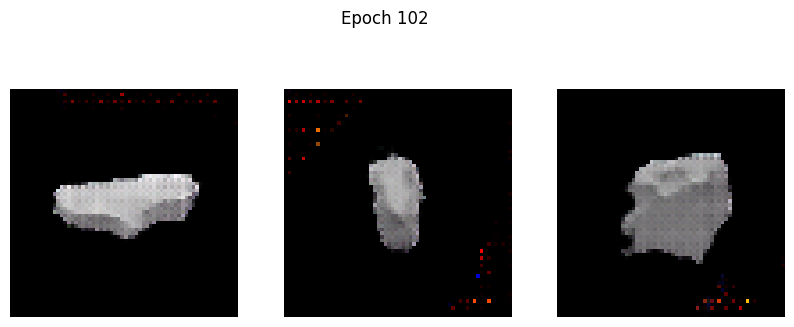

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3446 - g_loss: 2.8324
Epoch 103/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2593 - g_loss: 2.2133

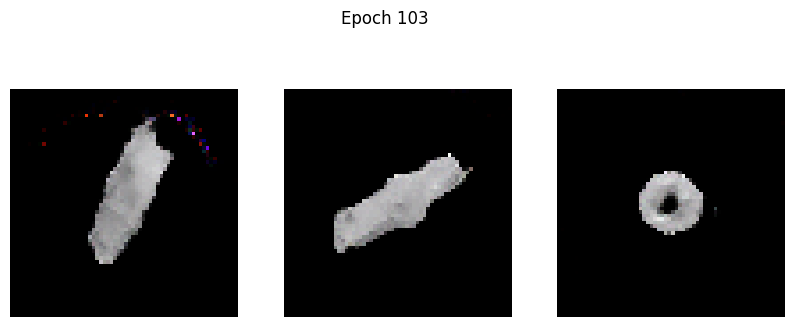

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2590 - g_loss: 2.2128
Epoch 104/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1988 - g_loss: 2.2568

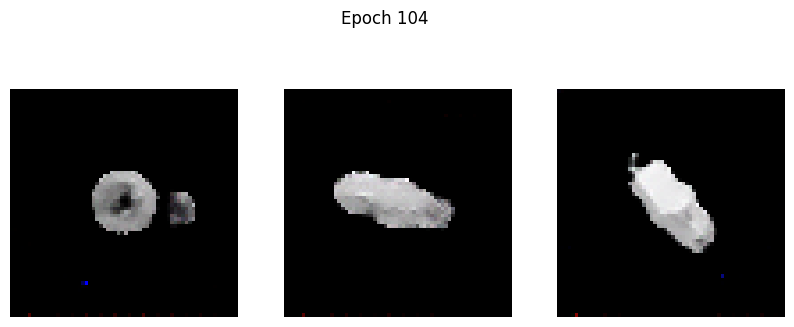

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1987 - g_loss: 2.2571
Epoch 105/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1881 - g_loss: 2.4266

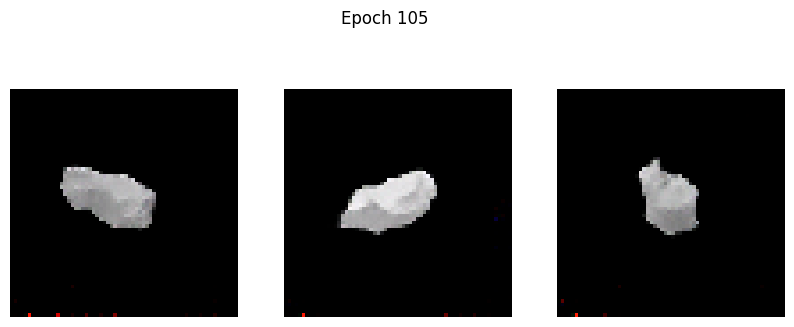

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1882 - g_loss: 2.4268
Epoch 106/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1722 - g_loss: 2.4230

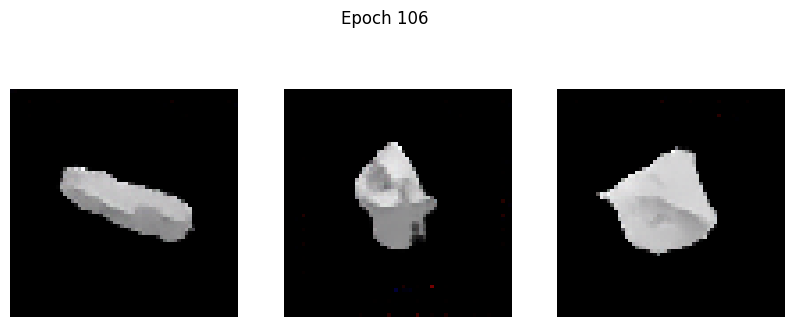

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1722 - g_loss: 2.4231
Epoch 107/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2010 - g_loss: 2.5752

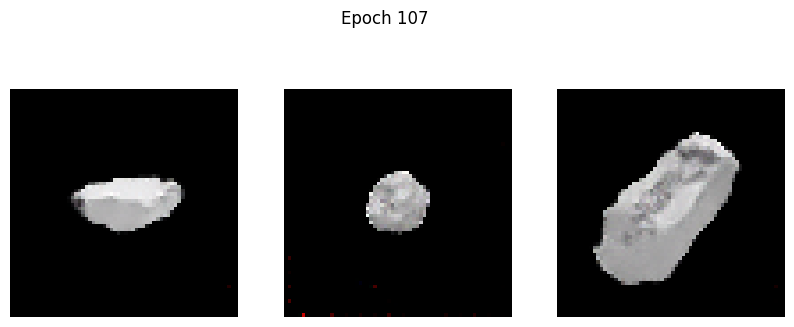

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2011 - g_loss: 2.5751
Epoch 108/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2860 - g_loss: 2.6224

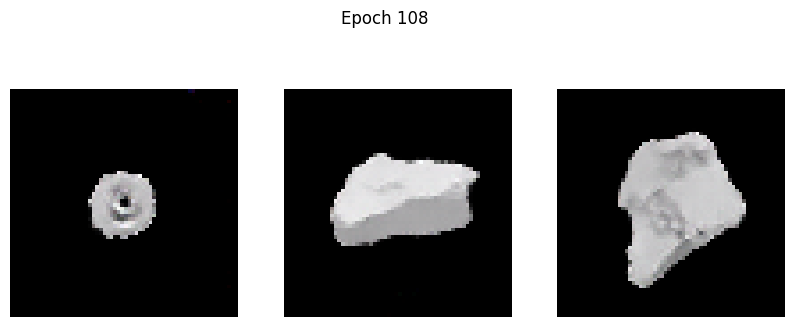

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2856 - g_loss: 2.6217
Epoch 109/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1751 - g_loss: 2.5672

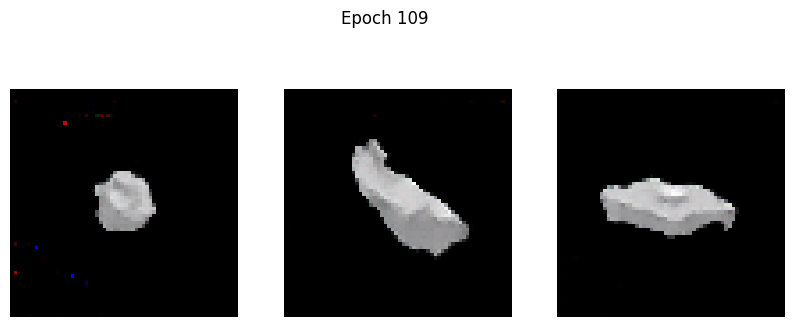

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1753 - g_loss: 2.5672
Epoch 110/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1775 - g_loss: 2.6785

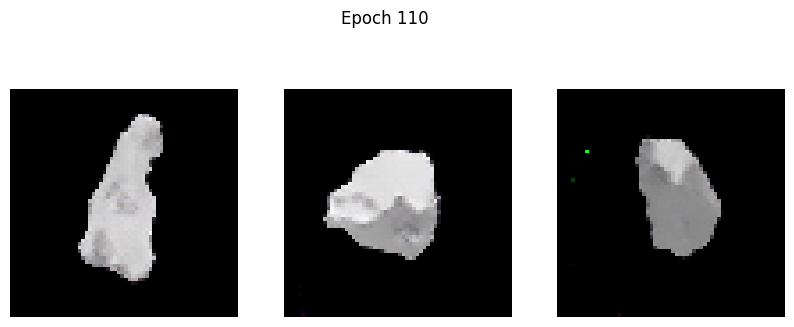

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1778 - g_loss: 2.6790
Epoch 111/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1703 - g_loss: 2.4844

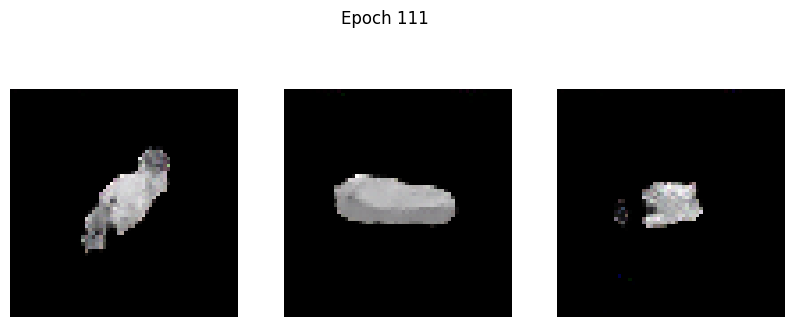

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1705 - g_loss: 2.4852
Epoch 112/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1847 - g_loss: 2.6664

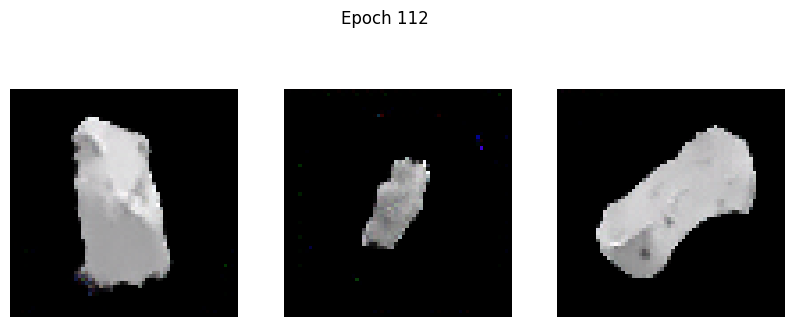

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1849 - g_loss: 2.6664
Epoch 113/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1831 - g_loss: 2.7108

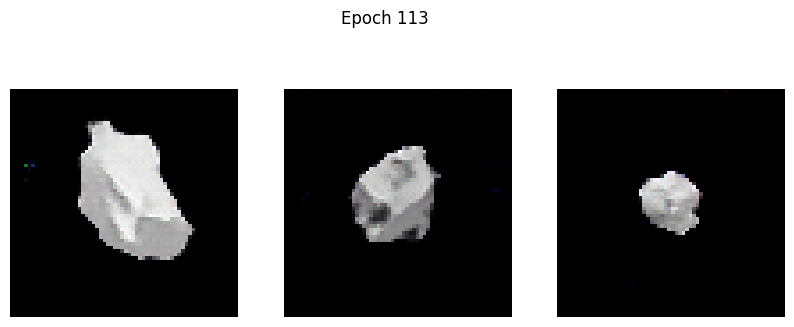

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1843 - g_loss: 2.7124
Epoch 114/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2725 - g_loss: 2.6992

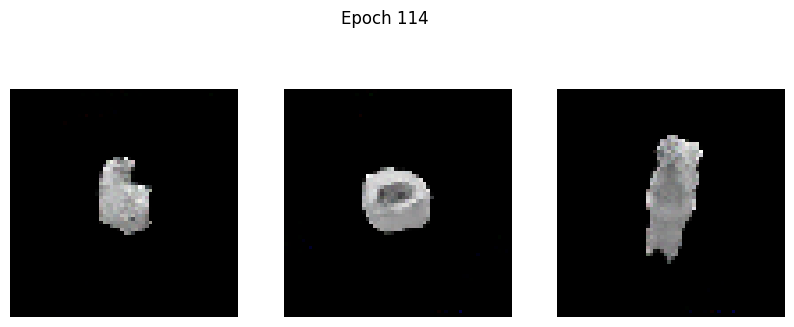

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2718 - g_loss: 2.6980
Epoch 115/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1672 - g_loss: 2.5873

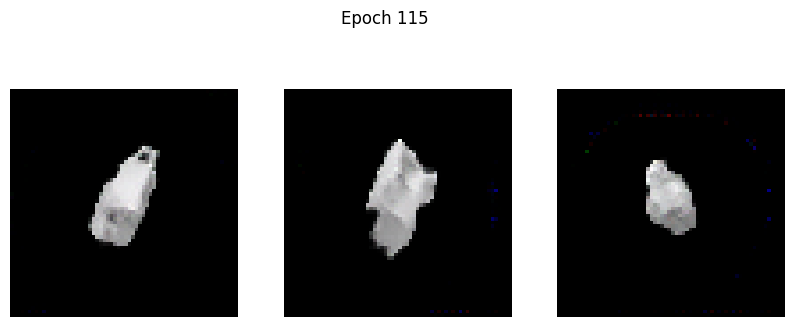

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1672 - g_loss: 2.5878
Epoch 116/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2349 - g_loss: 2.7152

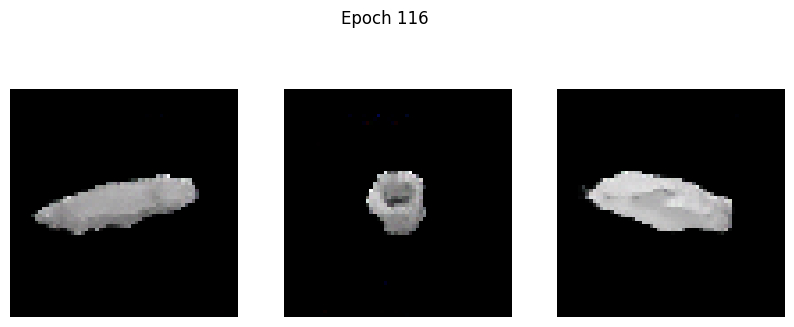

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2347 - g_loss: 2.7152
Epoch 117/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1927 - g_loss: 2.8604

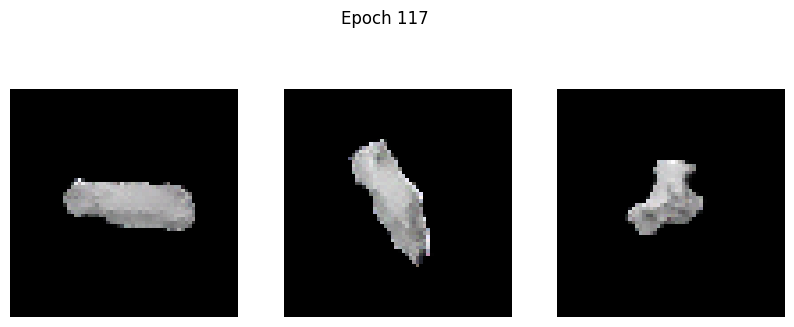

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1926 - g_loss: 2.8597
Epoch 118/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2842 - g_loss: 2.9263

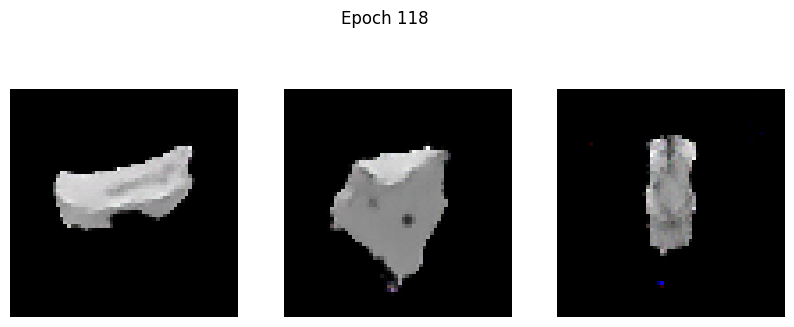

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2847 - g_loss: 2.9265
Epoch 119/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1607 - g_loss: 2.5332

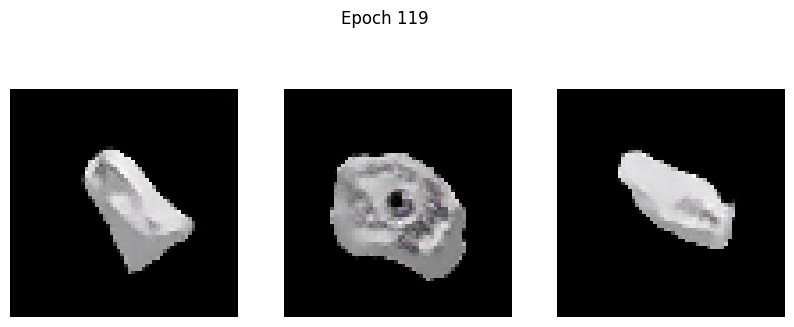

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1608 - g_loss: 2.5339
Epoch 120/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1633 - g_loss: 2.6716

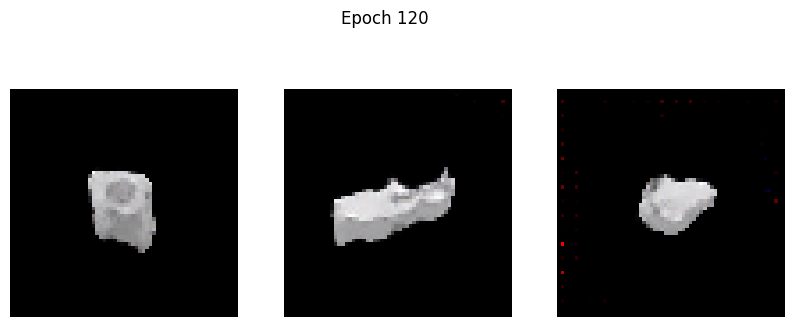

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1633 - g_loss: 2.6717
Epoch 121/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2560 - g_loss: 2.7948

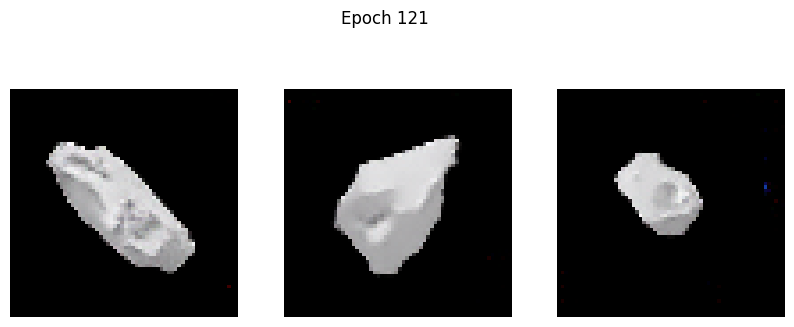

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2557 - g_loss: 2.7940
Epoch 122/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1578 - g_loss: 2.7162

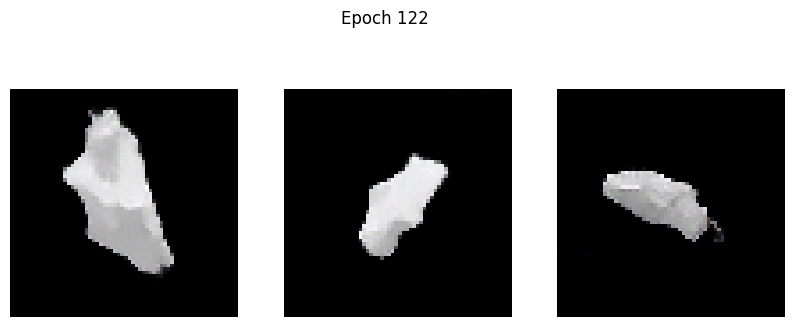

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1579 - g_loss: 2.7164
Epoch 123/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1581 - g_loss: 2.7254

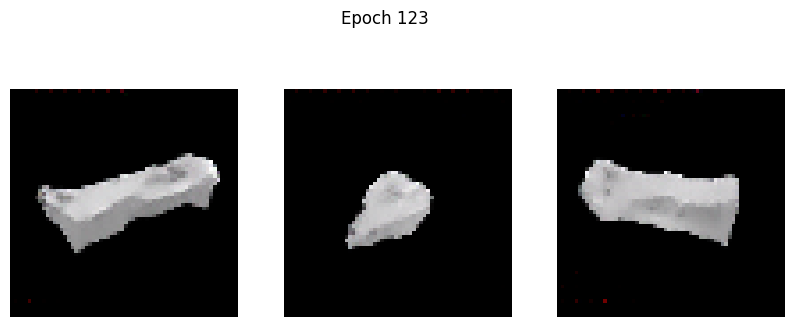

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1582 - g_loss: 2.7258
Epoch 124/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2101 - g_loss: 2.8420

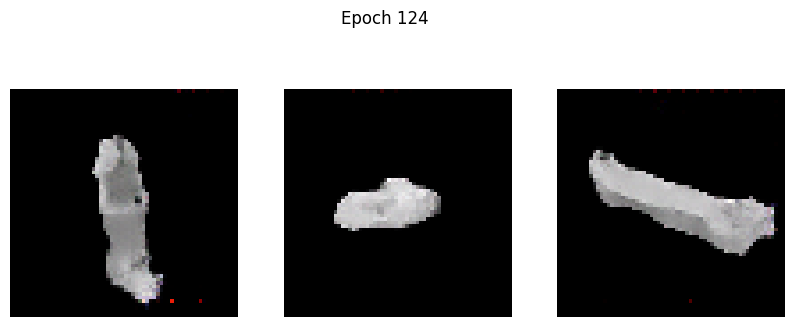

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2104 - g_loss: 2.8421
Epoch 125/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1410 - g_loss: 2.7630

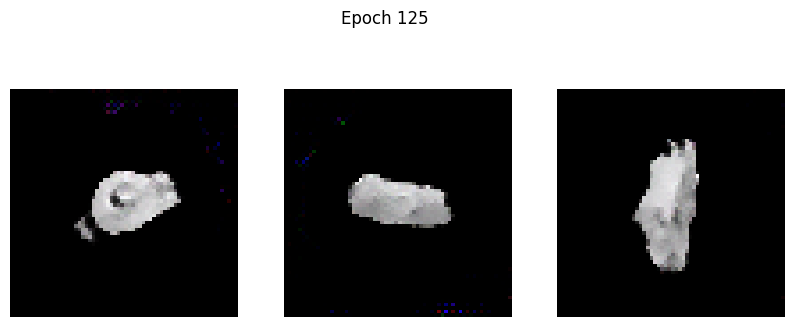

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1413 - g_loss: 2.7632
Epoch 126/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1925 - g_loss: 2.7959

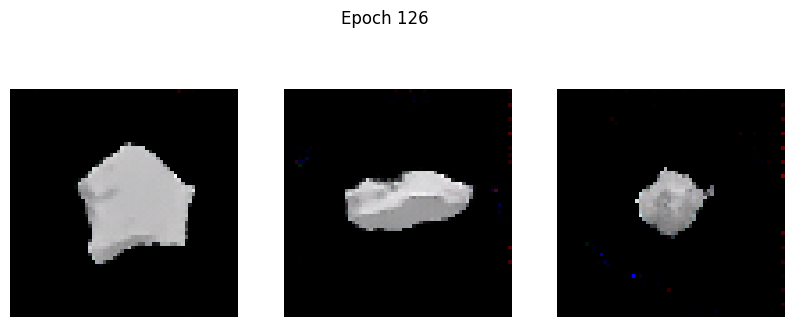

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1926 - g_loss: 2.7963
Epoch 127/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1924 - g_loss: 2.8837

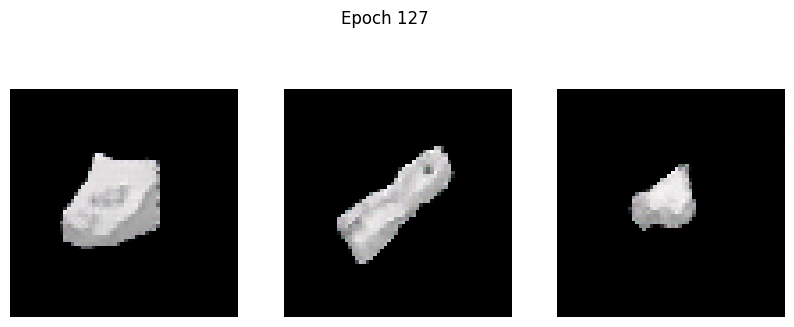

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1929 - g_loss: 2.8847
Epoch 128/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2305 - g_loss: 2.8366

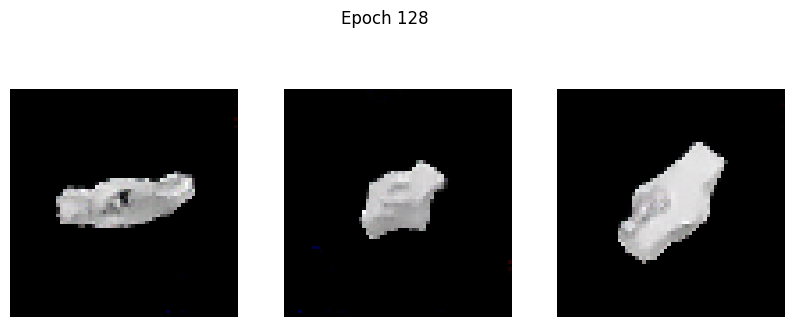

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2302 - g_loss: 2.8356
Epoch 129/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1496 - g_loss: 2.8000

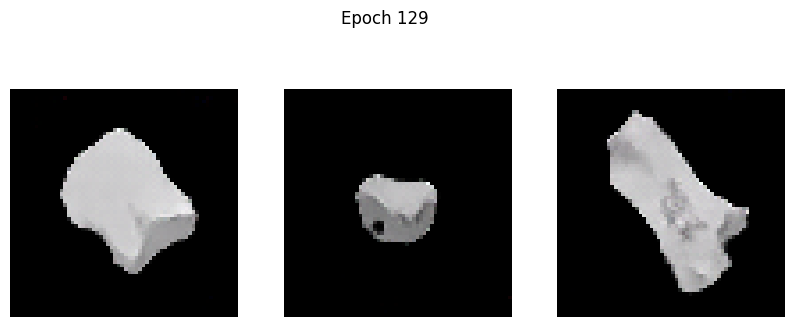

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1498 - g_loss: 2.8004
Epoch 130/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3728 - g_loss: 3.0135

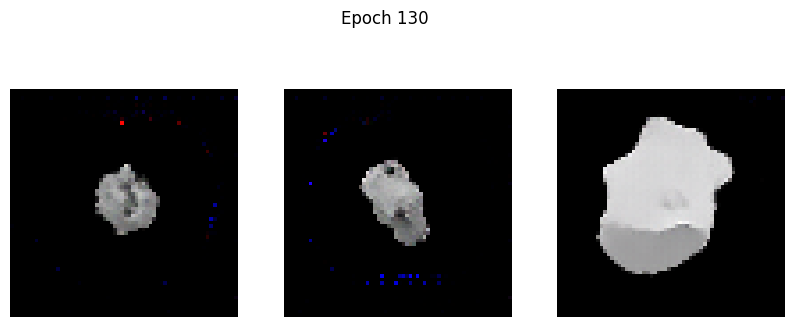

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3714 - g_loss: 3.0117
Epoch 131/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1614 - g_loss: 2.8524

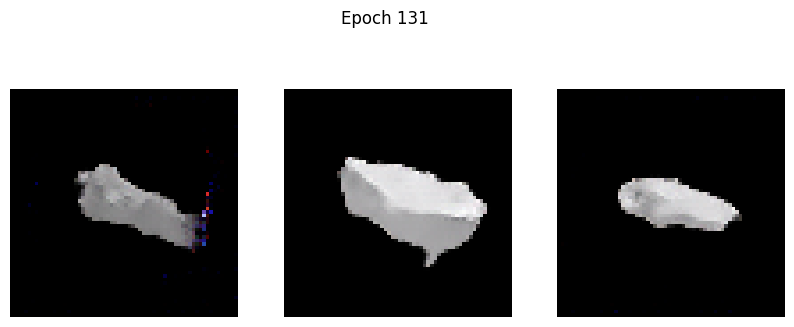

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1614 - g_loss: 2.8522
Epoch 132/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1723 - g_loss: 2.8340

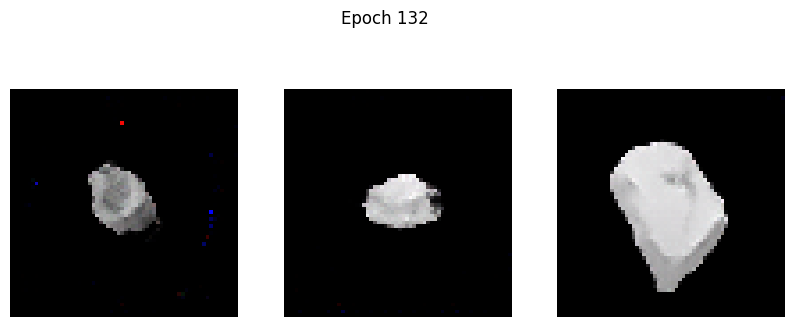

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1722 - g_loss: 2.8343
Epoch 133/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1922 - g_loss: 2.9739

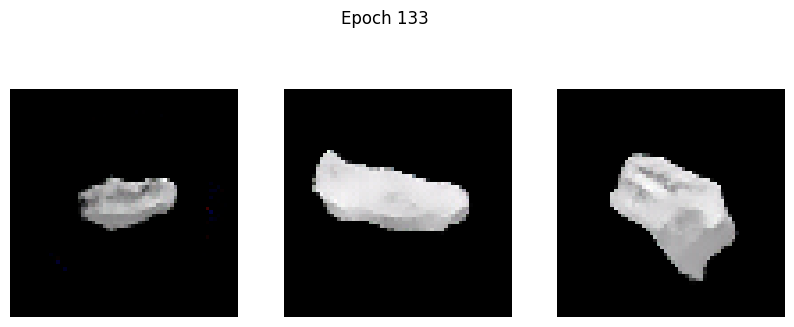

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1935 - g_loss: 2.9754
Epoch 134/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2006 - g_loss: 2.8322

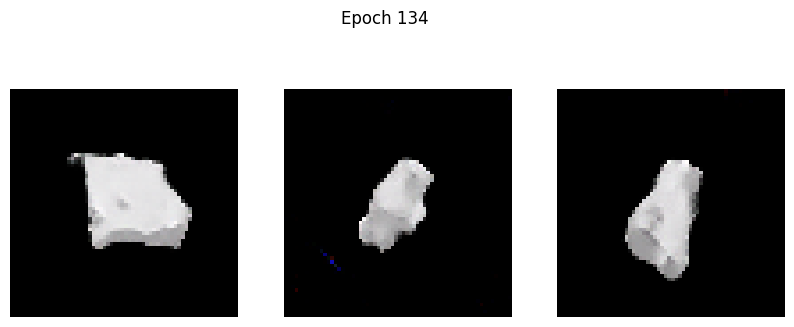

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.2002 - g_loss: 2.8320
Epoch 135/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1585 - g_loss: 2.8457

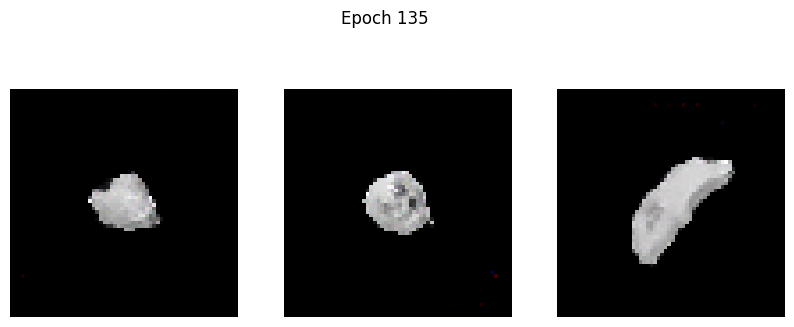

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1585 - g_loss: 2.8460
Epoch 136/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1377 - g_loss: 2.9084

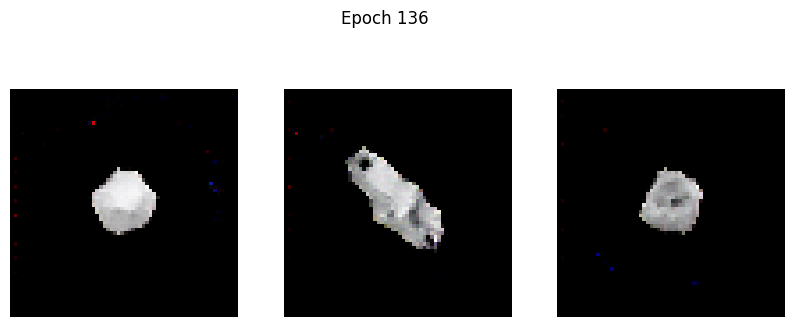

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1382 - g_loss: 2.9090
Epoch 137/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3170 - g_loss: 2.9973

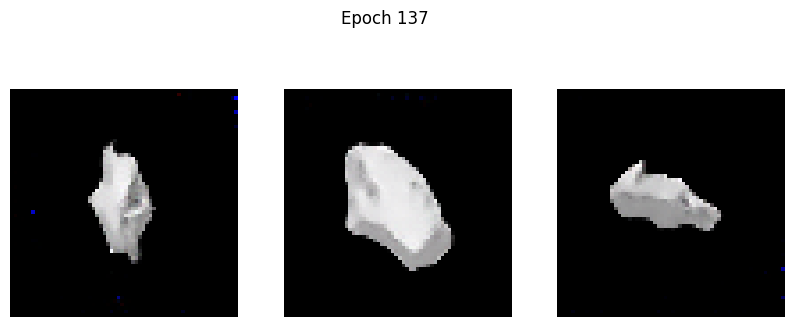

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3158 - g_loss: 2.9961
Epoch 138/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1489 - g_loss: 2.8698

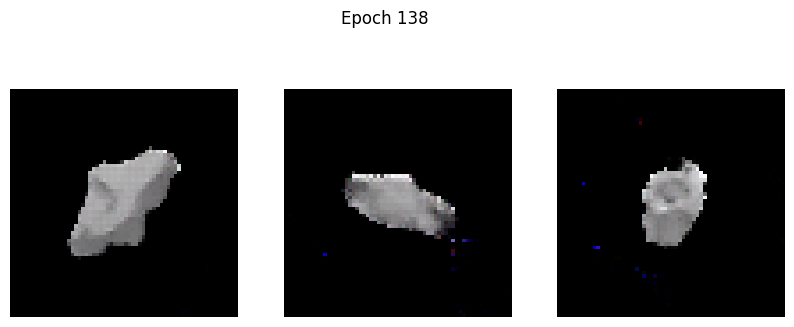

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1509 - g_loss: 2.8741
Epoch 139/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4298 - g_loss: 3.2114

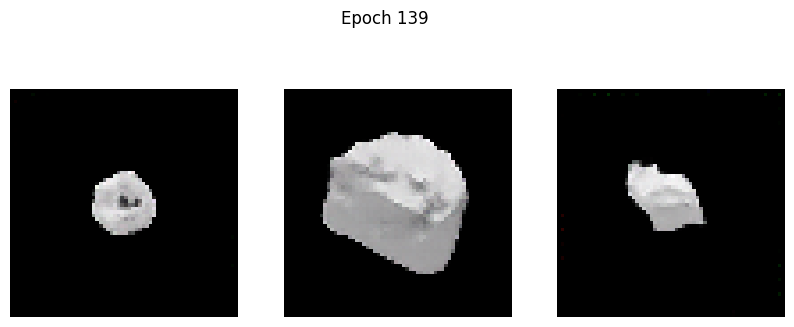

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.4280 - g_loss: 3.2076
Epoch 140/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1531 - g_loss: 2.6897

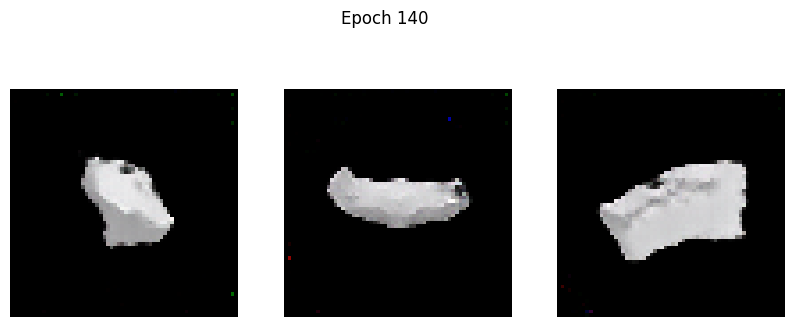

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1531 - g_loss: 2.6902
Epoch 141/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1352 - g_loss: 2.7845

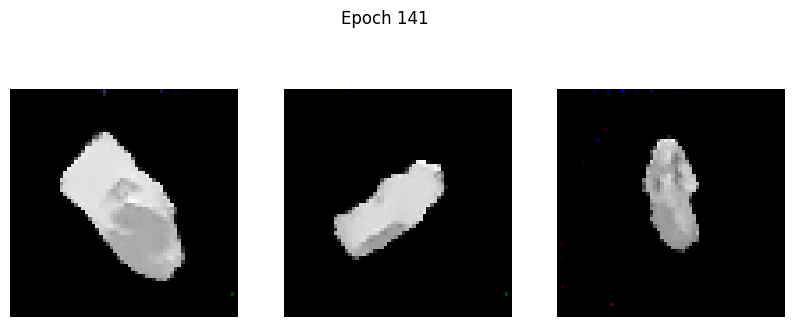

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1352 - g_loss: 2.7848
Epoch 142/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1756 - g_loss: 2.9389

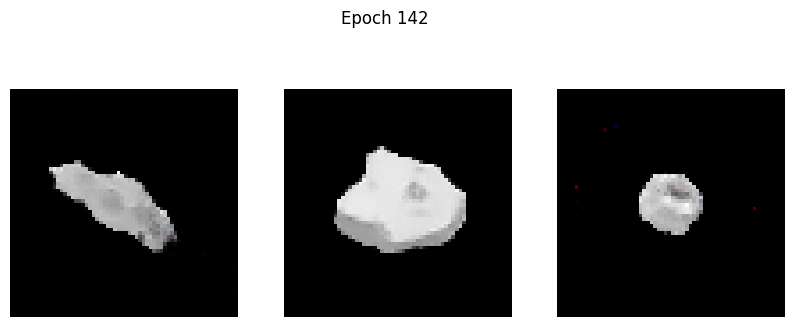

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1754 - g_loss: 2.9388
Epoch 143/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1486 - g_loss: 2.8805

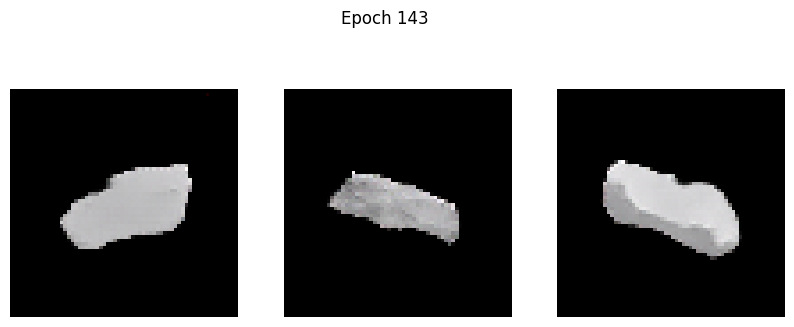

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1486 - g_loss: 2.8809
Epoch 144/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6558 - g_loss: 4.3987

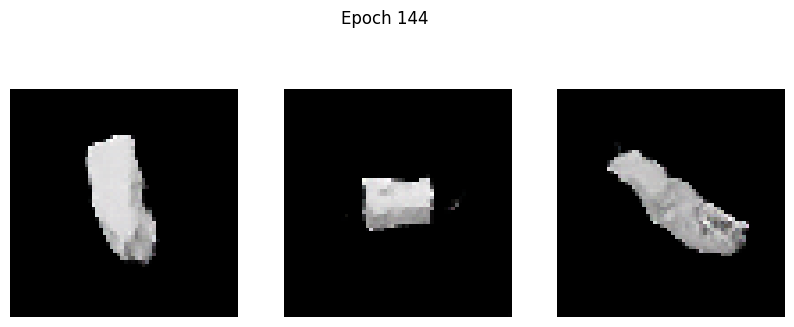

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6545 - g_loss: 4.3943
Epoch 145/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1427 - g_loss: 2.6778

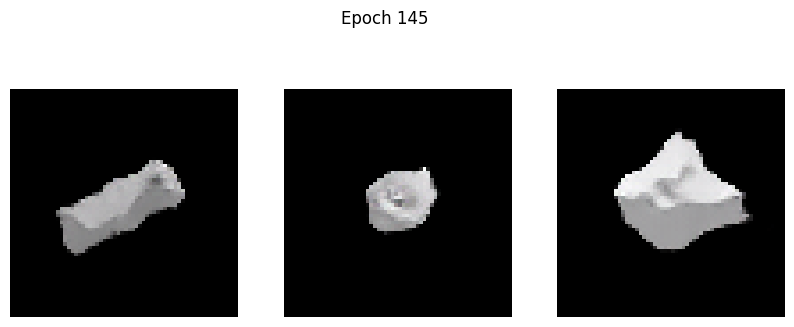

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1427 - g_loss: 2.6784
Epoch 146/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1379 - g_loss: 2.8110

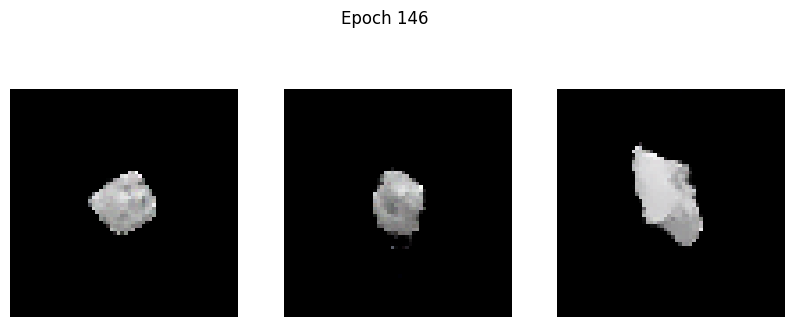

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1381 - g_loss: 2.8113
Epoch 147/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1474 - g_loss: 2.9178

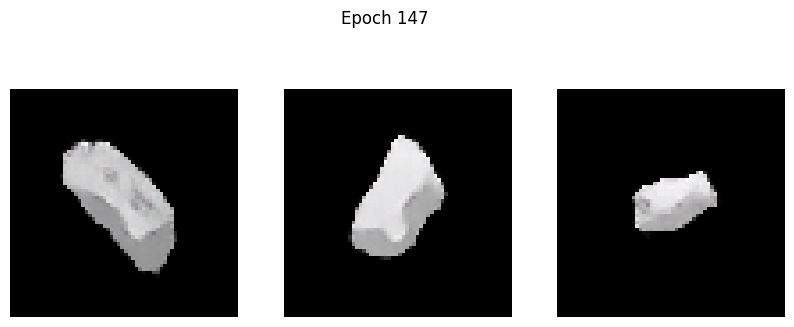

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1473 - g_loss: 2.9176
Epoch 148/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1828 - g_loss: 2.9916

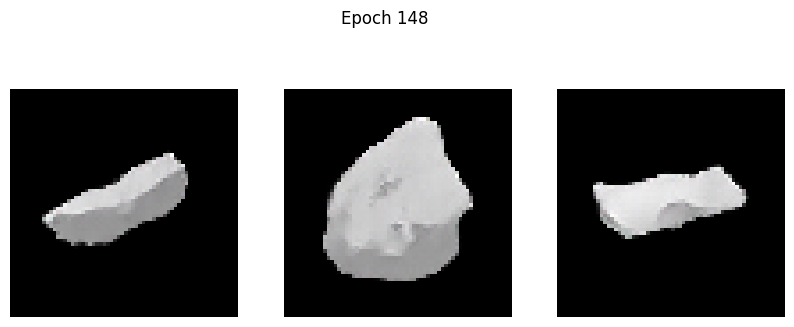

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1827 - g_loss: 2.9913
Epoch 149/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2382 - g_loss: 3.0298

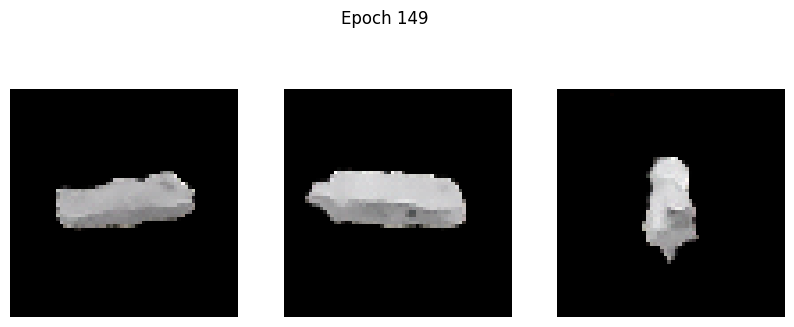

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2378 - g_loss: 3.0291
Epoch 150/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1782 - g_loss: 2.9755

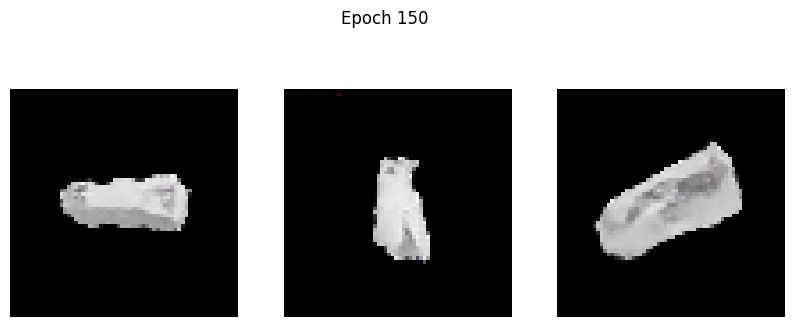

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1778 - g_loss: 2.9756
Epoch 151/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1618 - g_loss: 3.0499

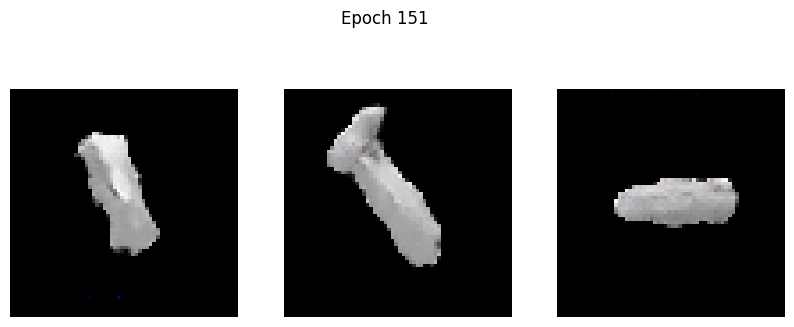

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1617 - g_loss: 3.0500
Epoch 152/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1926 - g_loss: 3.1139

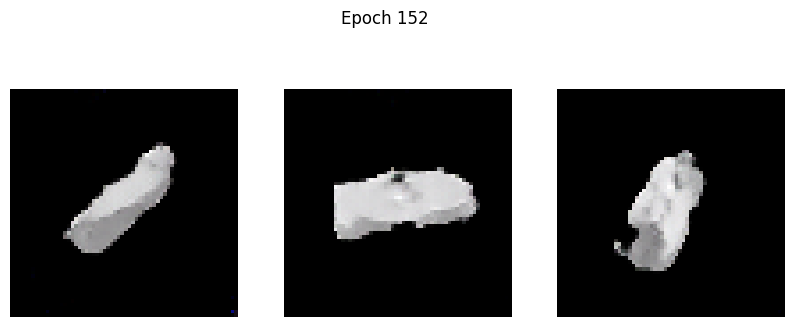

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1933 - g_loss: 3.1150
Epoch 153/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1559 - g_loss: 3.0395

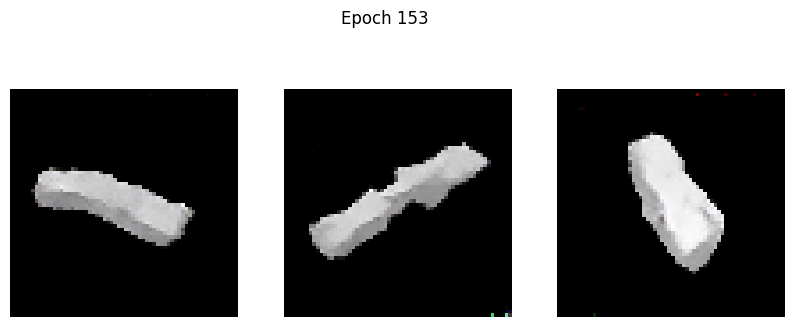

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1557 - g_loss: 3.0388
Epoch 154/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1261 - g_loss: 3.0251

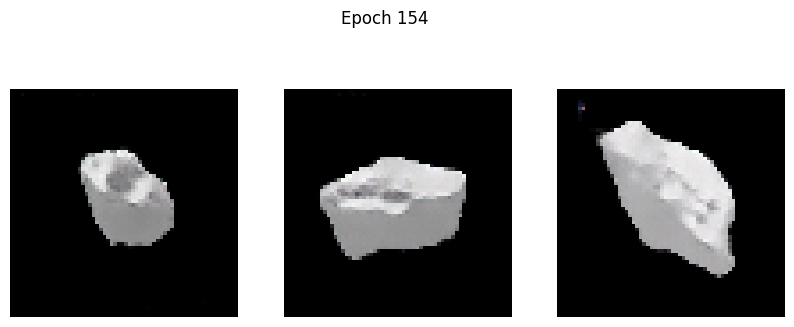

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1263 - g_loss: 3.0254
Epoch 155/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1908 - g_loss: 3.0276

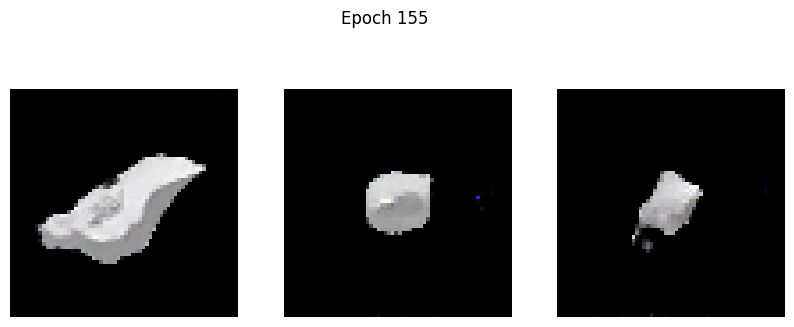

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1906 - g_loss: 3.0281
Epoch 156/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1889 - g_loss: 3.1058

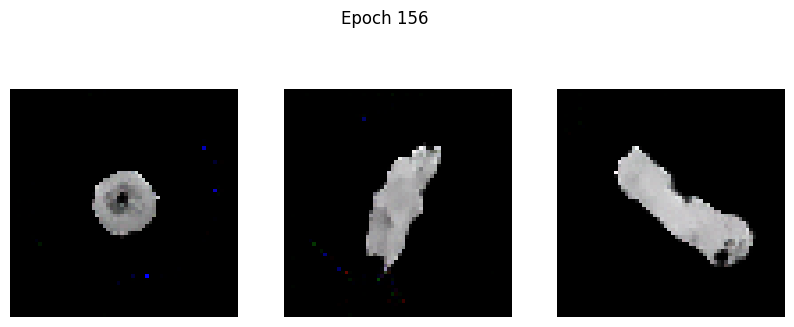

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1894 - g_loss: 3.1061
Epoch 157/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1223 - g_loss: 2.9839

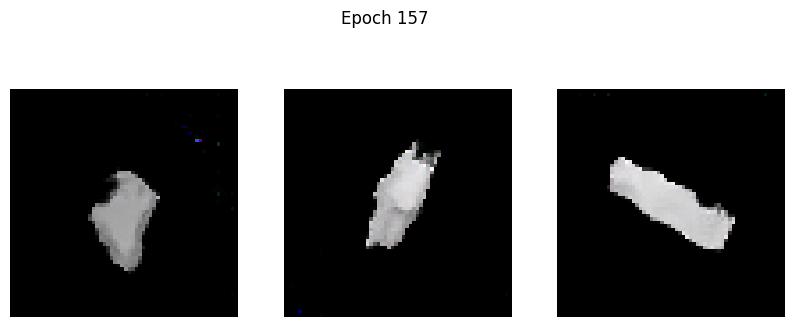

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1225 - g_loss: 2.9839
Epoch 158/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1235 - g_loss: 3.0108

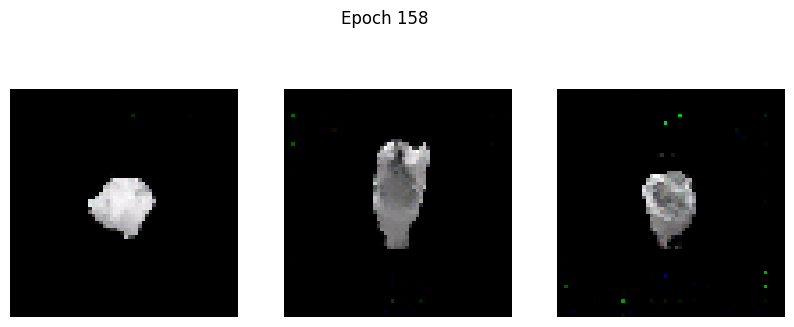

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1238 - g_loss: 3.0118
Epoch 159/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1466 - g_loss: 3.0806

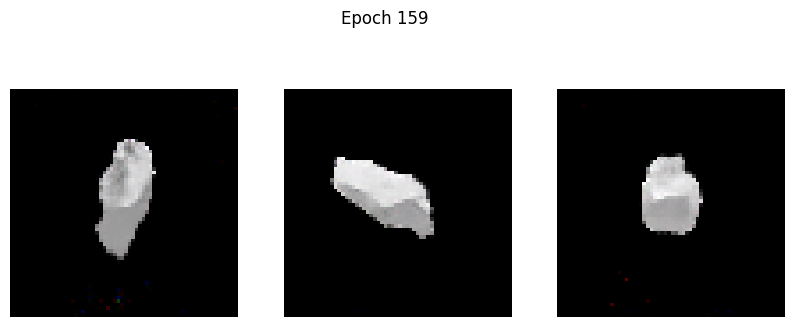

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1466 - g_loss: 3.0804
Epoch 160/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1278 - g_loss: 3.1421

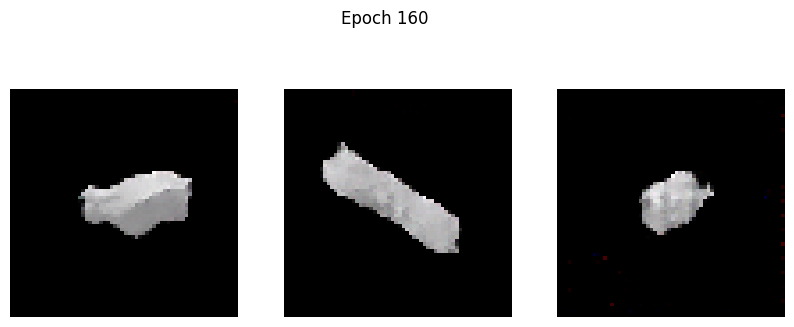

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1280 - g_loss: 3.1422
Epoch 161/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3915 - g_loss: 3.6254

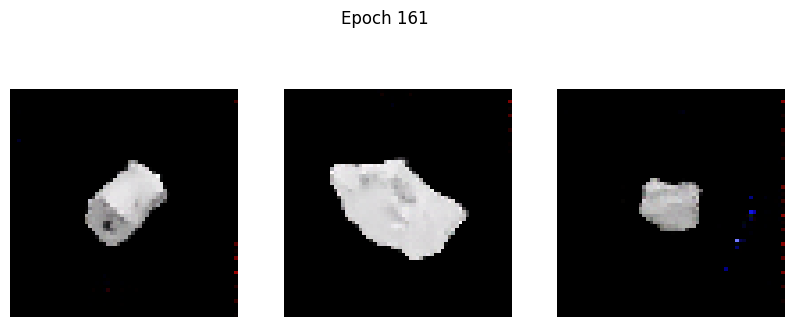

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3907 - g_loss: 3.6228
Epoch 162/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1314 - g_loss: 3.0266

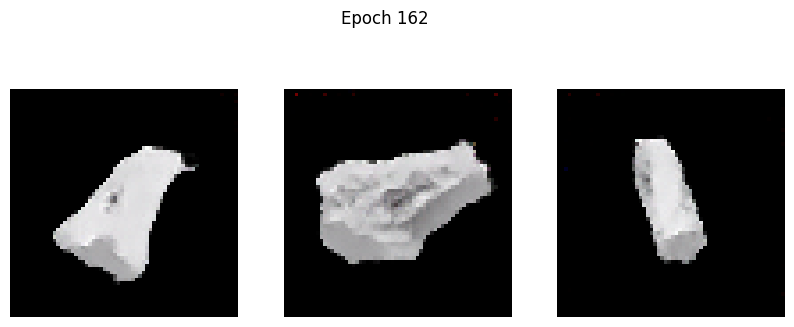

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1314 - g_loss: 3.0268
Epoch 163/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1495 - g_loss: 3.1793

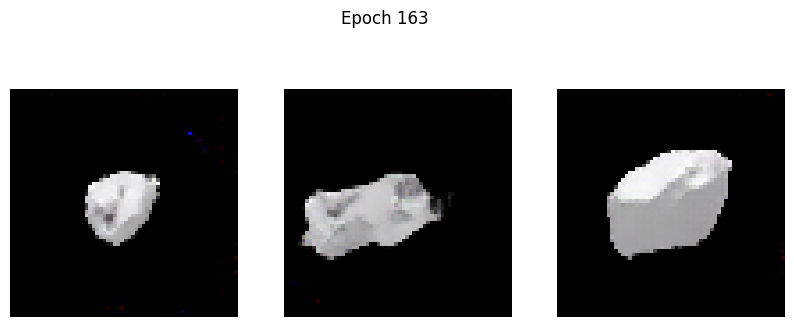

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1496 - g_loss: 3.1790
Epoch 164/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1688 - g_loss: 3.1949

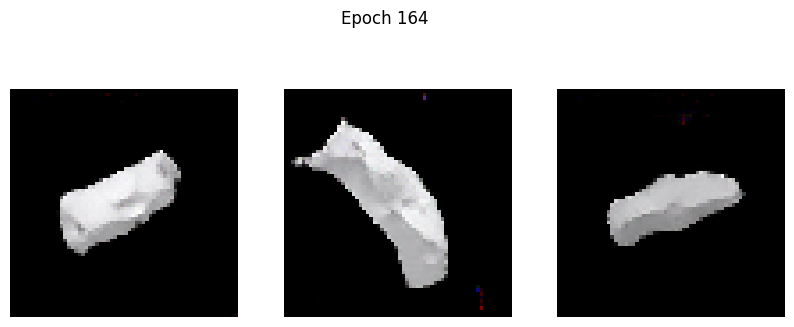

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1701 - g_loss: 3.1964
Epoch 165/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1311 - g_loss: 2.9357

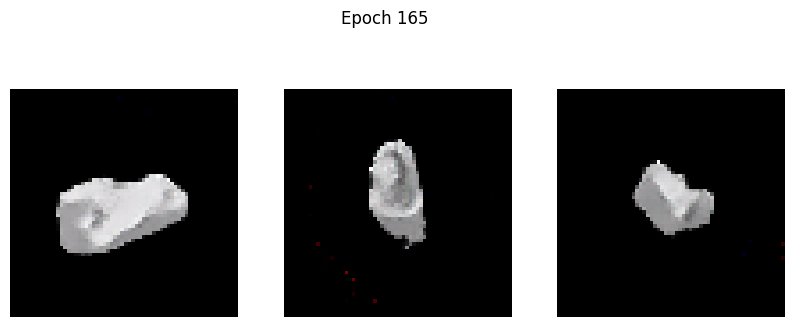

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1310 - g_loss: 2.9363
Epoch 166/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1045 - g_loss: 3.0128

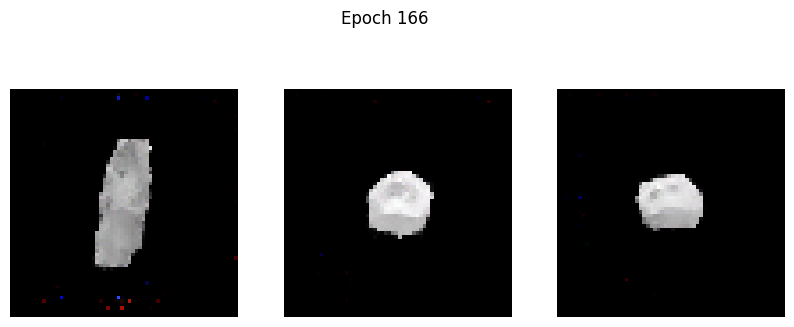

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1046 - g_loss: 3.0134
Epoch 167/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1316 - g_loss: 3.1145

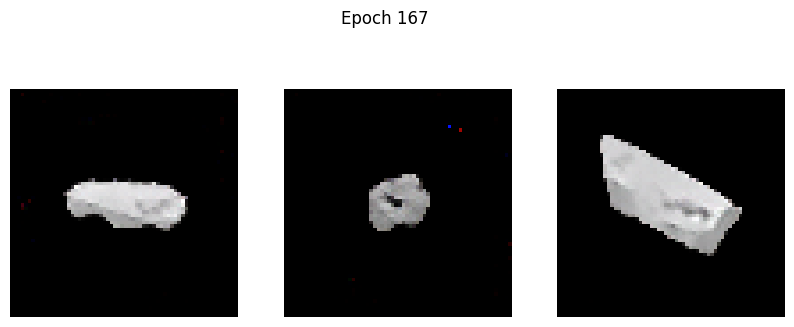

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1318 - g_loss: 3.1155
Epoch 168/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2502 - g_loss: 3.2570

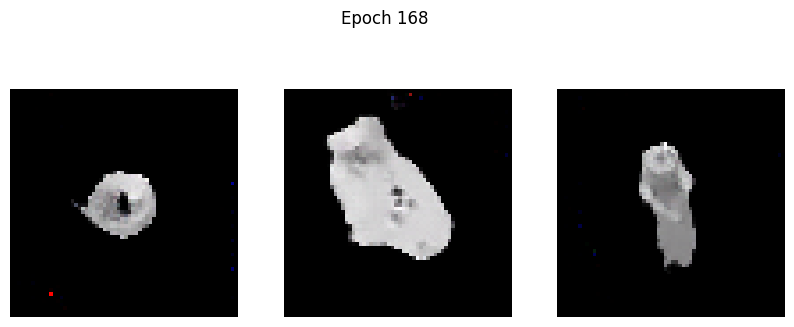

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2496 - g_loss: 3.2564
Epoch 169/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1391 - g_loss: 3.1473

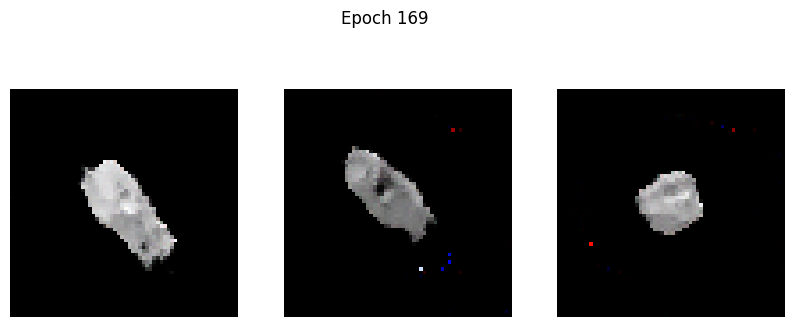

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1400 - g_loss: 3.1482
Epoch 170/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1610 - g_loss: 3.0203

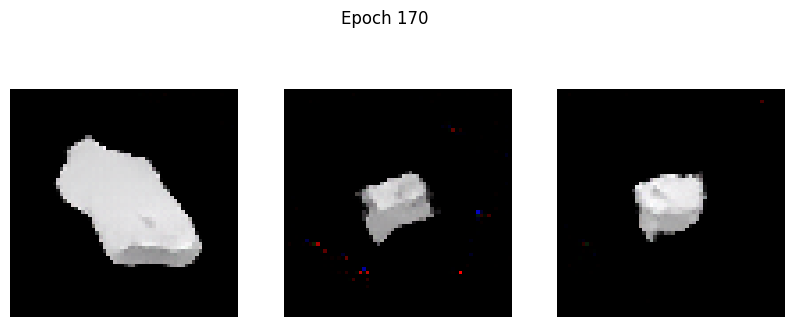

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1608 - g_loss: 3.0206
Epoch 171/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1665 - g_loss: 3.2172

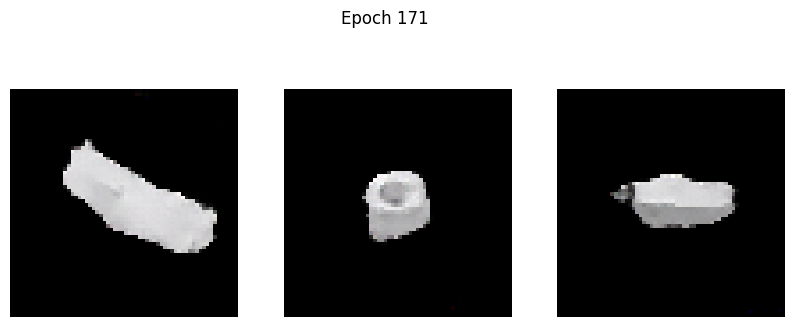

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1664 - g_loss: 3.2169
Epoch 172/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1161 - g_loss: 3.1382

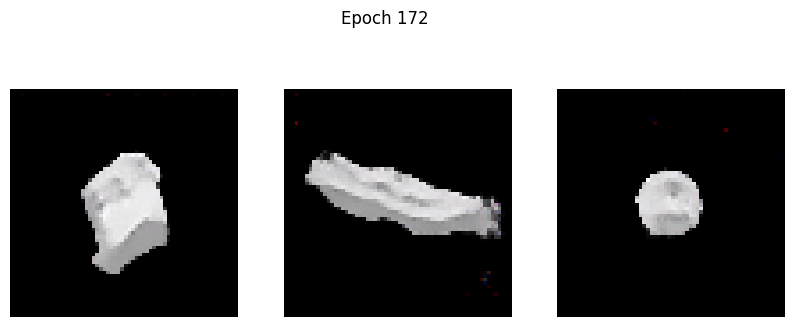

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1161 - g_loss: 3.1383
Epoch 173/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1502 - g_loss: 3.3457

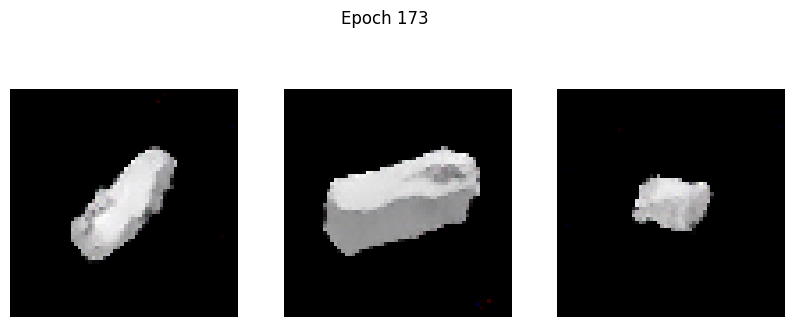

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1509 - g_loss: 3.3460
Epoch 174/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2178 - g_loss: 3.1521

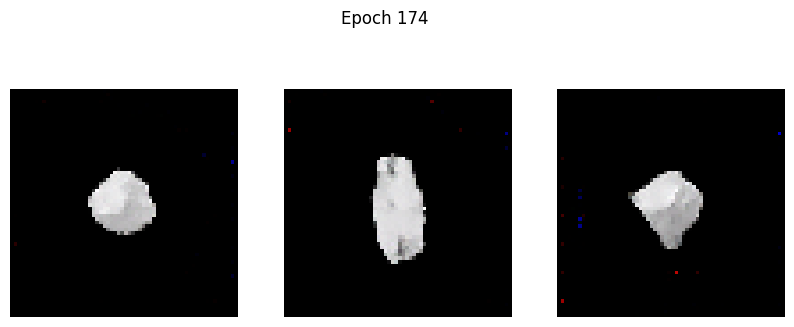

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2174 - g_loss: 3.1521
Epoch 175/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1197 - g_loss: 3.2073

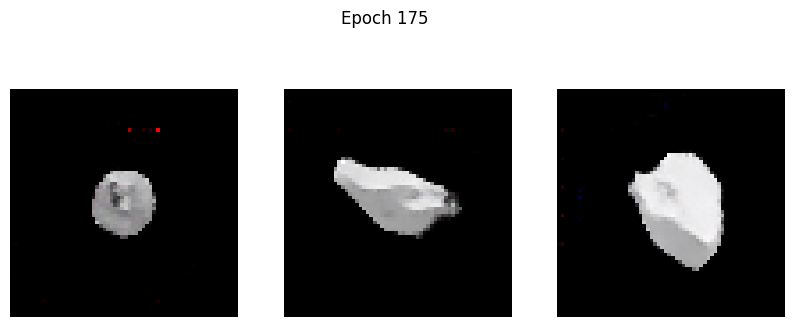

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1197 - g_loss: 3.2075
Epoch 176/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1895 - g_loss: 3.3305

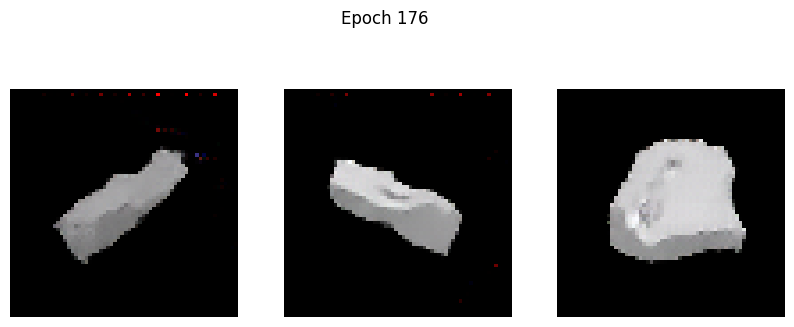

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1904 - g_loss: 3.3317
Epoch 177/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1355 - g_loss: 3.0956

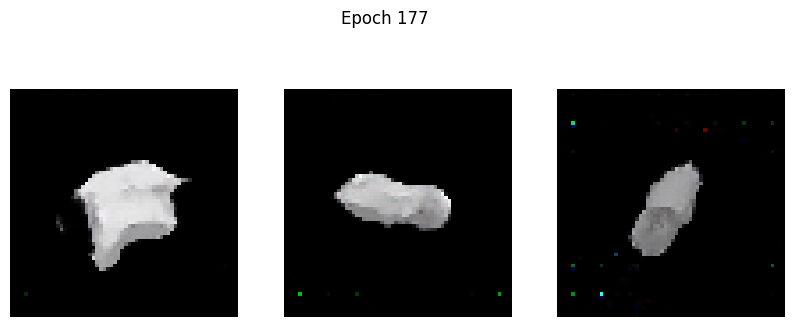

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1354 - g_loss: 3.0960
Epoch 178/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0960 - g_loss: 3.1925

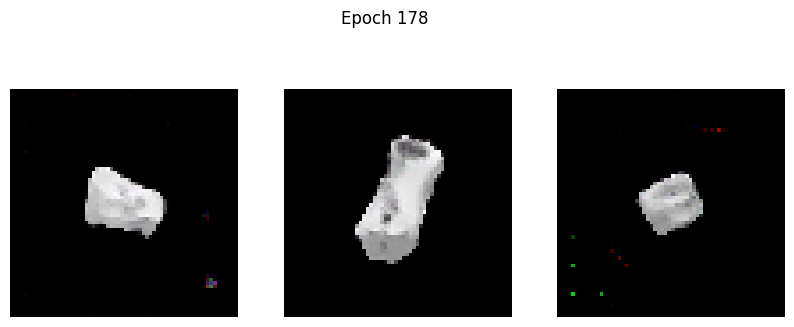

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0960 - g_loss: 3.1925
Epoch 179/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1861 - g_loss: 3.5719

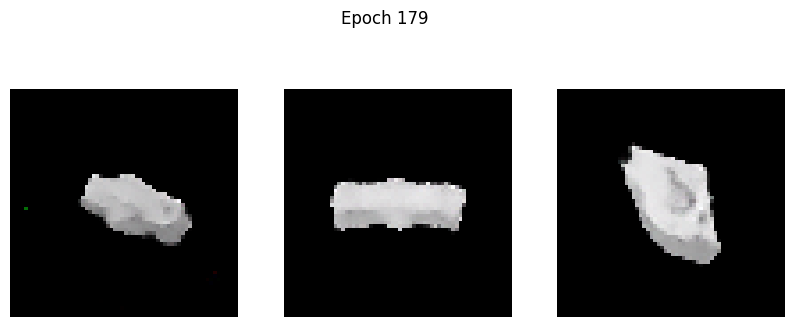

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1867 - g_loss: 3.5715
Epoch 180/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1165 - g_loss: 3.1740

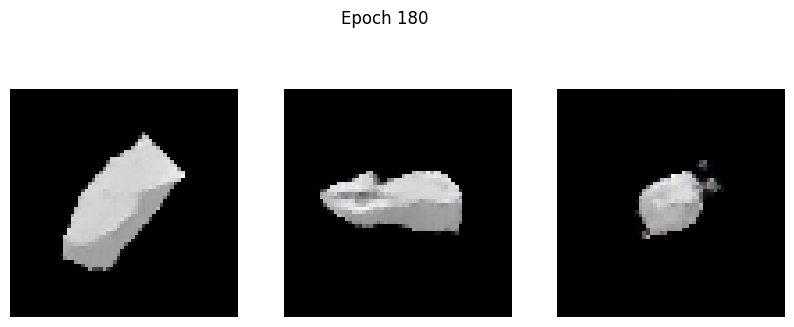

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1167 - g_loss: 3.1742
Epoch 181/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1032 - g_loss: 3.2278

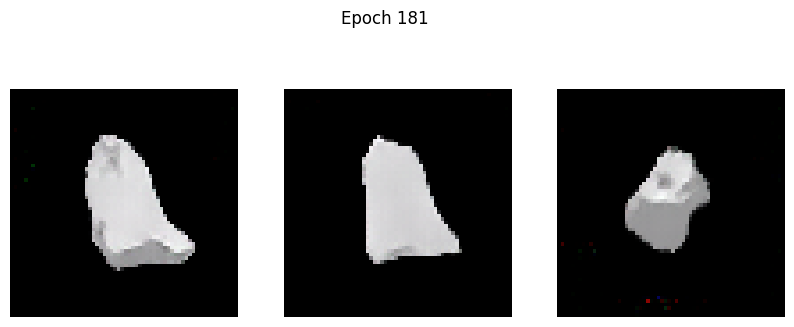

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1032 - g_loss: 3.2274
Epoch 182/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1249 - g_loss: 3.2897

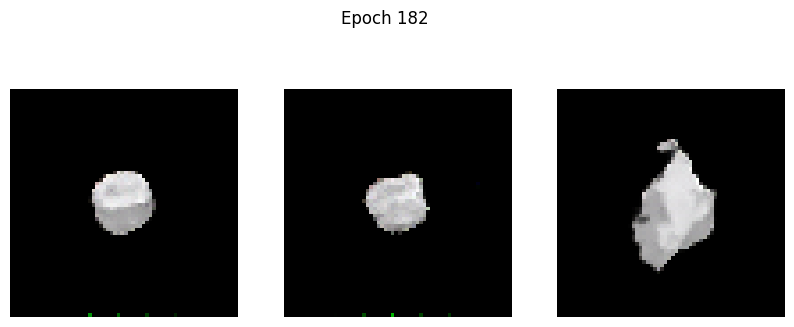

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1254 - g_loss: 3.2906
Epoch 183/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2518 - g_loss: 3.5539

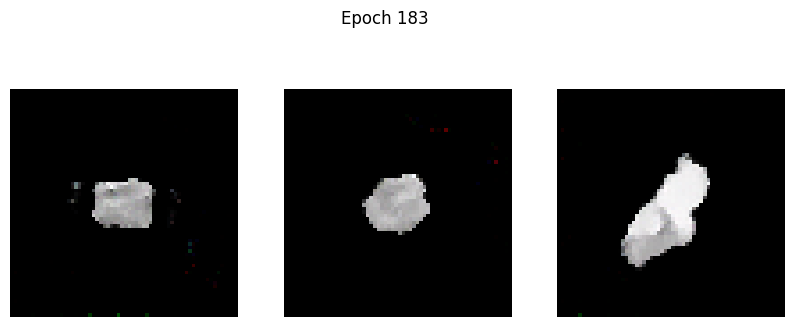

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2508 - g_loss: 3.5515
Epoch 184/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1698 - g_loss: 3.3815

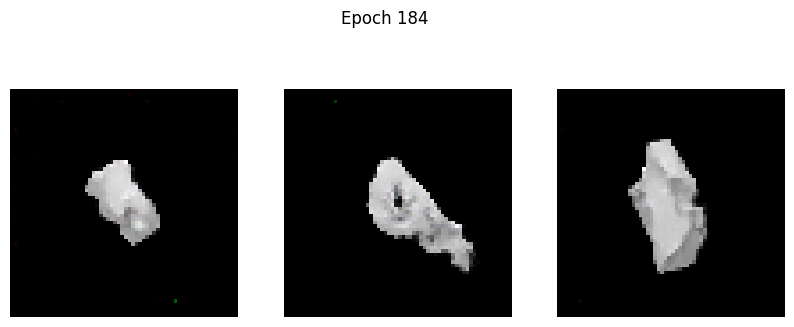

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - d_loss: 0.1698 - g_loss: 3.3812
Epoch 185/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1244 - g_loss: 3.3145

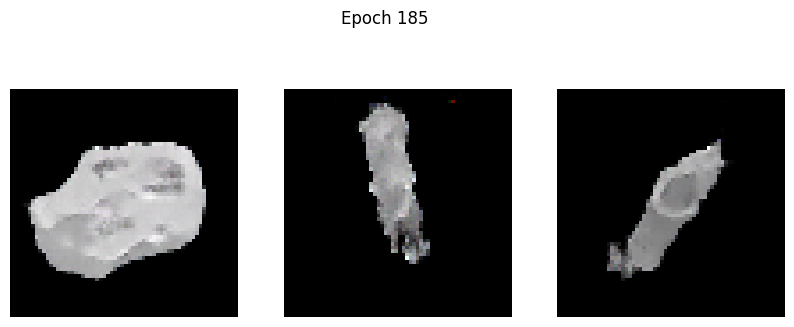

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1245 - g_loss: 3.3152
Epoch 186/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.3960 - g_loss: 3.5070

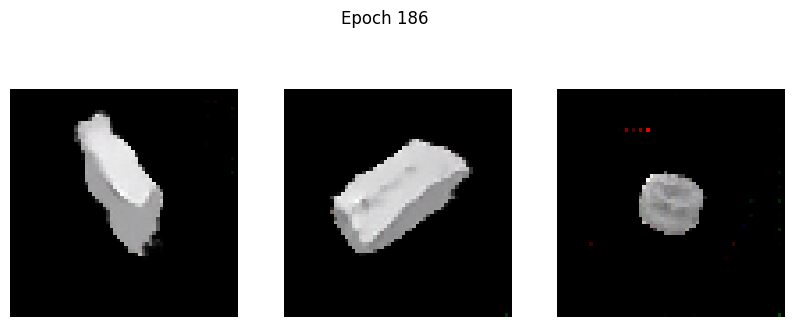

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.3945 - g_loss: 3.5054
Epoch 187/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1047 - g_loss: 3.1703

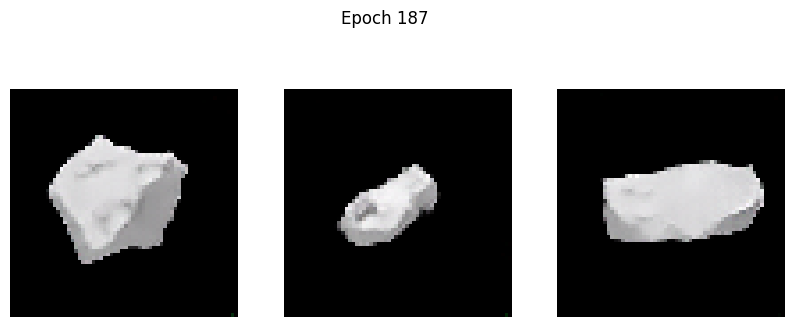

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1047 - g_loss: 3.1709
Epoch 188/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1123 - g_loss: 3.3995

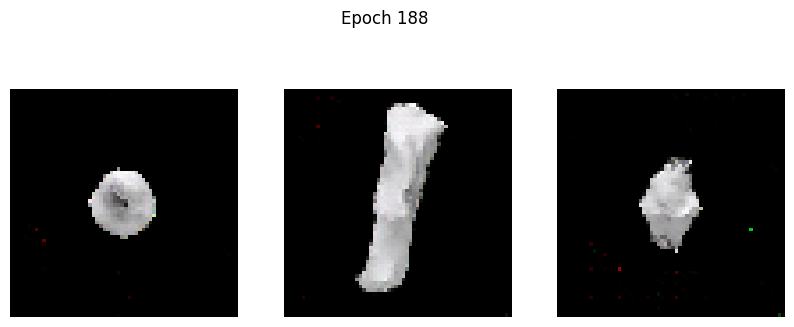

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1124 - g_loss: 3.3991
Epoch 189/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1403 - g_loss: 3.3123

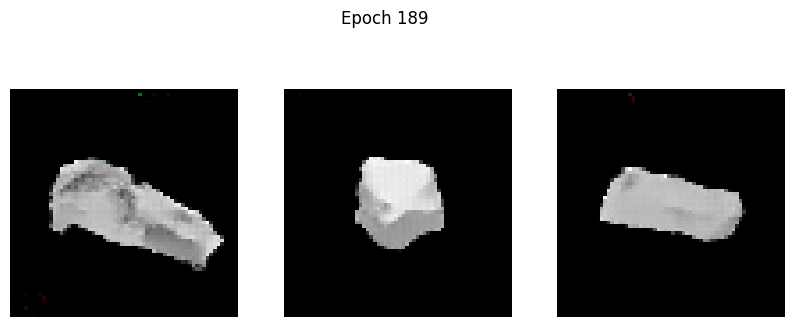

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1410 - g_loss: 3.3137
Epoch 190/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1312 - g_loss: 3.3152

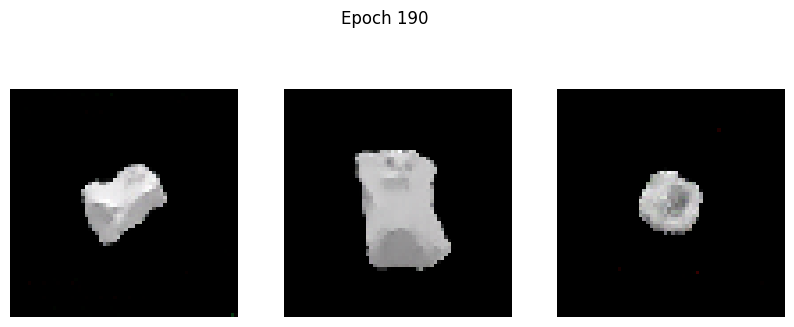

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1310 - g_loss: 3.3150
Epoch 191/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0982 - g_loss: 3.3331

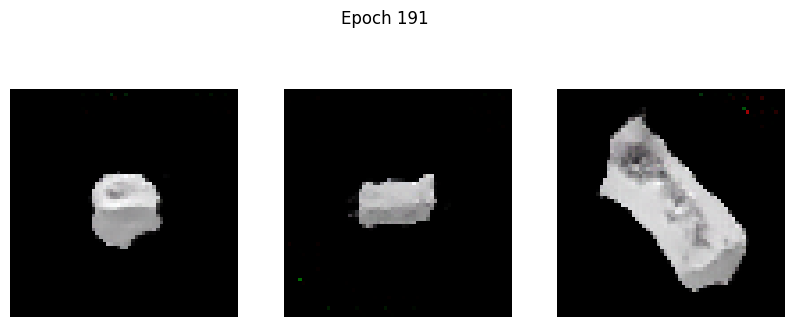

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0982 - g_loss: 3.3339
Epoch 192/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1373 - g_loss: 3.3270

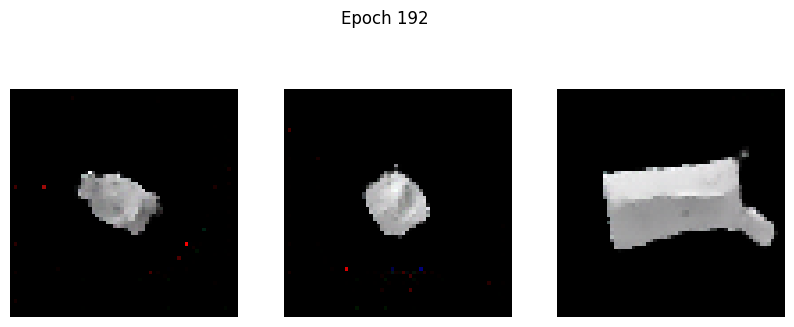

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1370 - g_loss: 3.3278
Epoch 193/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6478 - g_loss: 4.8799

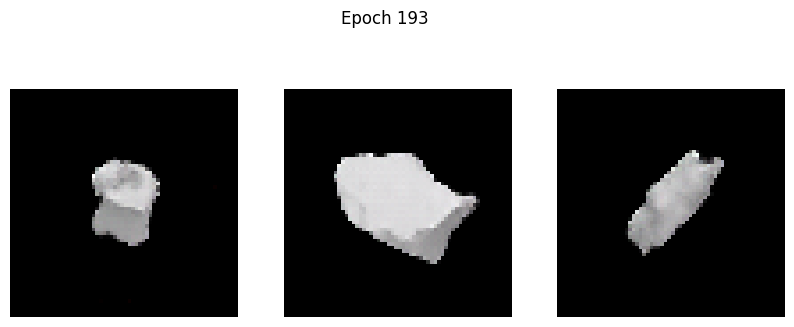

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6463 - g_loss: 4.8746
Epoch 194/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1222 - g_loss: 3.2534

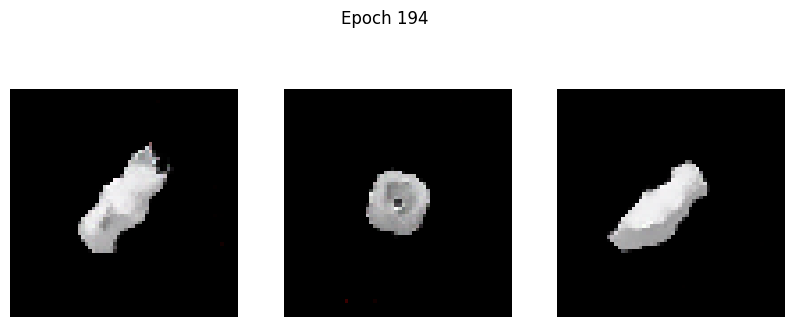

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1222 - g_loss: 3.2531
Epoch 195/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1047 - g_loss: 3.2647

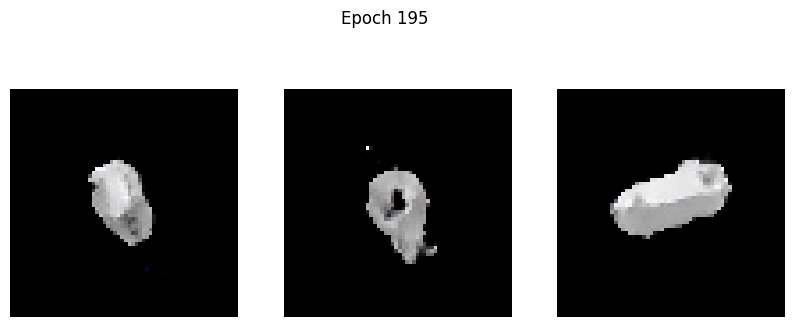

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1047 - g_loss: 3.2647
Epoch 196/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1016 - g_loss: 3.4040

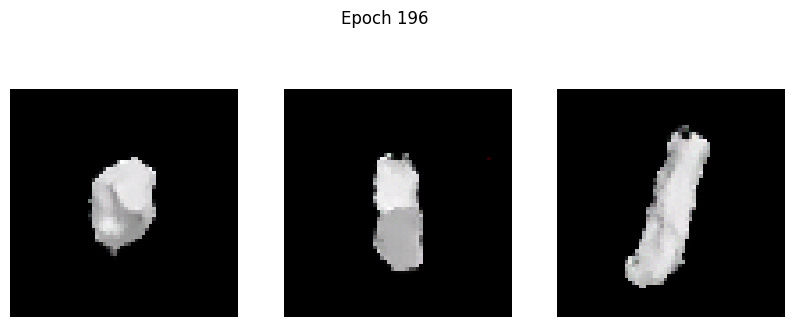

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.1016 - g_loss: 3.4041
Epoch 197/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0867 - g_loss: 3.3587

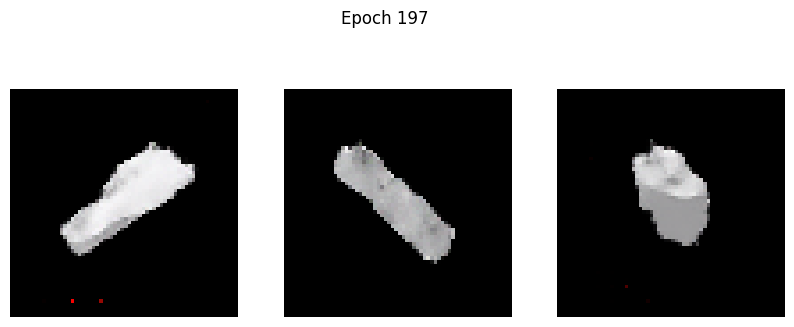

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0869 - g_loss: 3.3591
Epoch 198/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0951 - g_loss: 3.5179

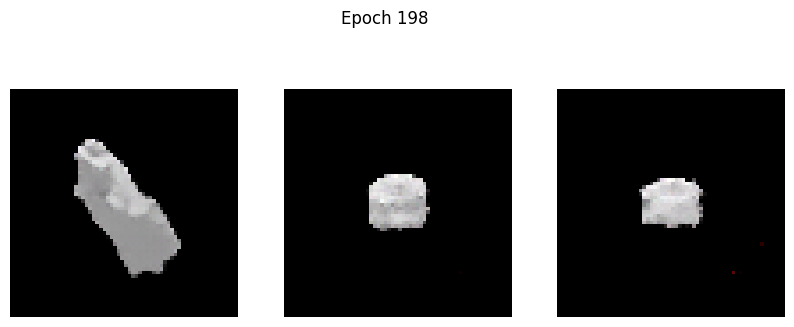

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0953 - g_loss: 3.5173
Epoch 199/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3925 - g_loss: 3.7815

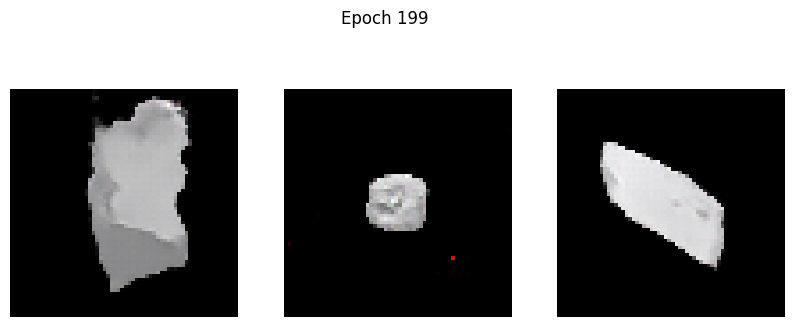

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3912 - g_loss: 3.7790
Epoch 200/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1108 - g_loss: 3.3480

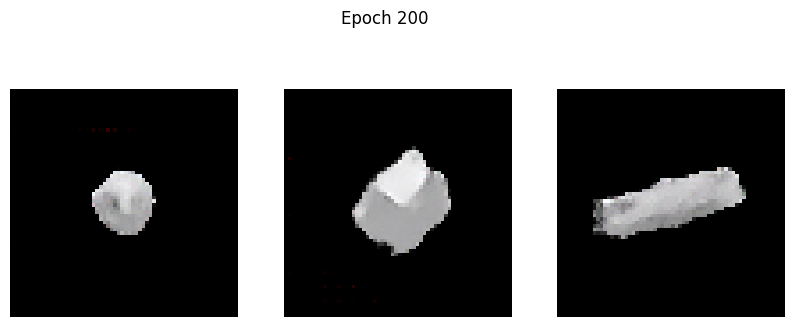

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1107 - g_loss: 3.3481
Epoch 201/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1112 - g_loss: 3.4834

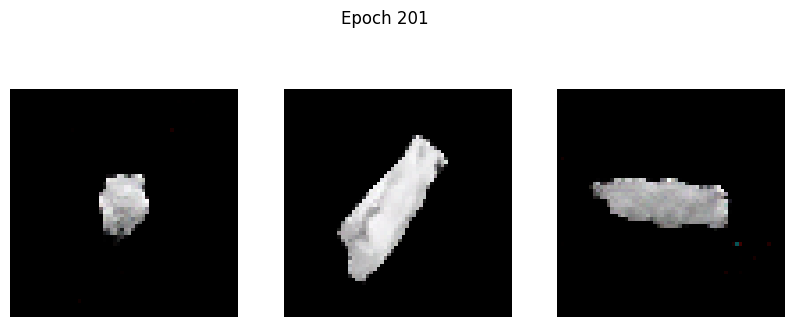

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1113 - g_loss: 3.4841
Epoch 202/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0895 - g_loss: 3.4726

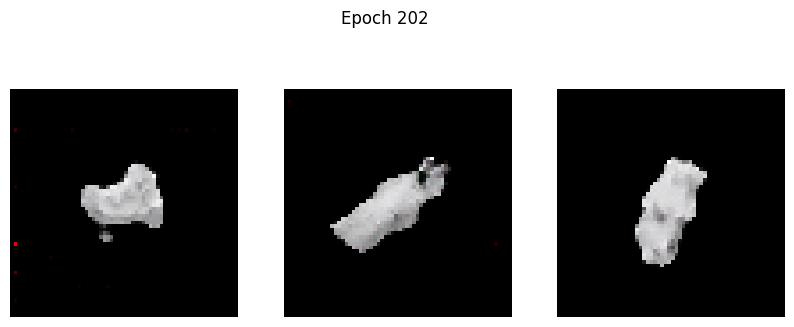

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0895 - g_loss: 3.4727
Epoch 203/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1674 - g_loss: 3.5859

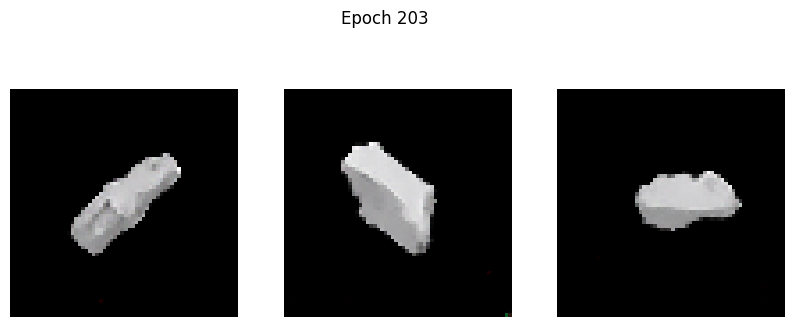

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1673 - g_loss: 3.5851
Epoch 204/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1060 - g_loss: 3.4441

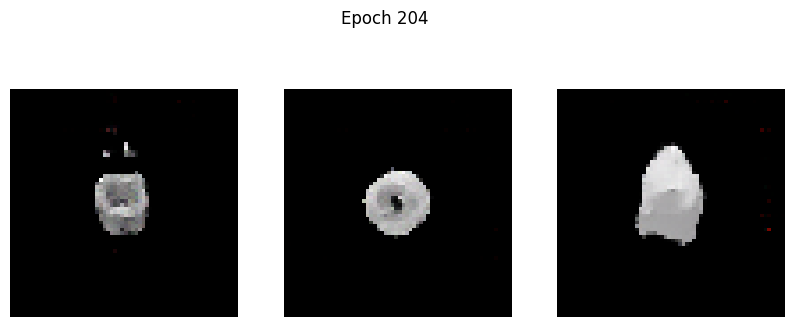

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1060 - g_loss: 3.4443
Epoch 205/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0890 - g_loss: 3.4689

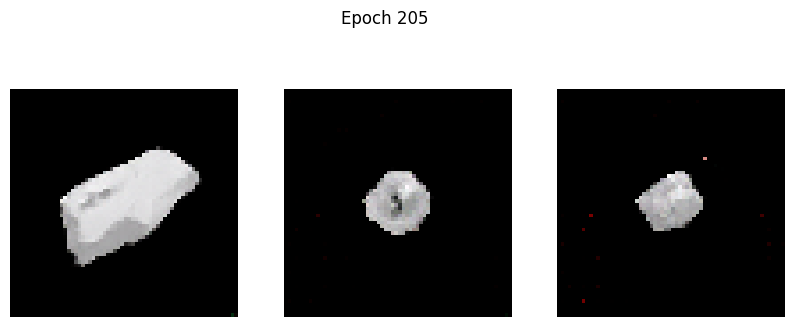

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0892 - g_loss: 3.4690
Epoch 206/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1540 - g_loss: 3.6186

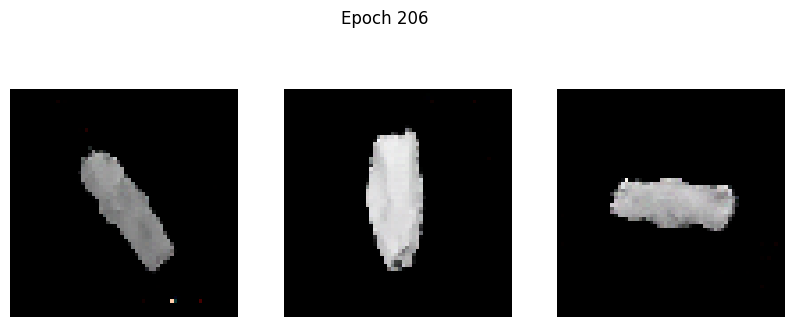

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1550 - g_loss: 3.6201
Epoch 207/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1410 - g_loss: 3.5742

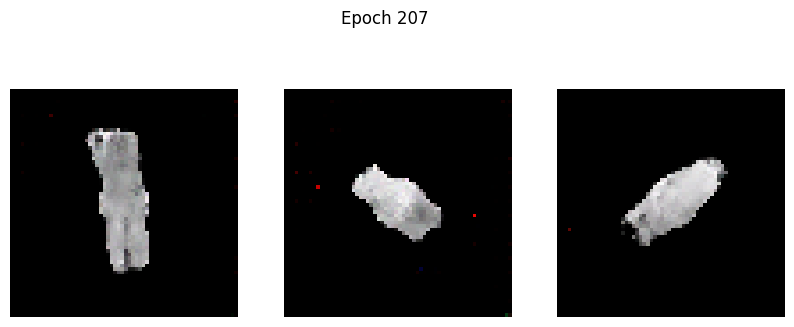

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1408 - g_loss: 3.5733
Epoch 208/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4542 - g_loss: 3.9904

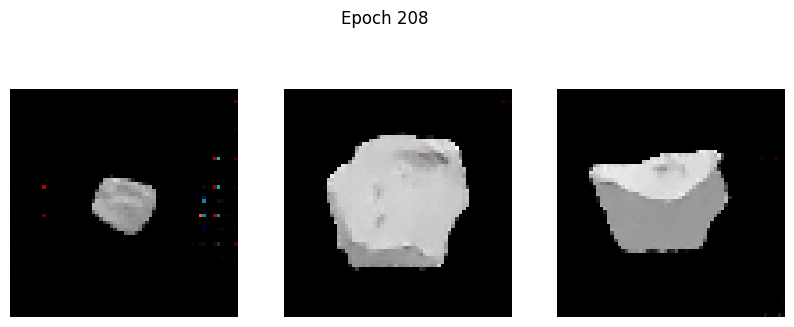

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4529 - g_loss: 3.9877
Epoch 209/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0894 - g_loss: 3.4707

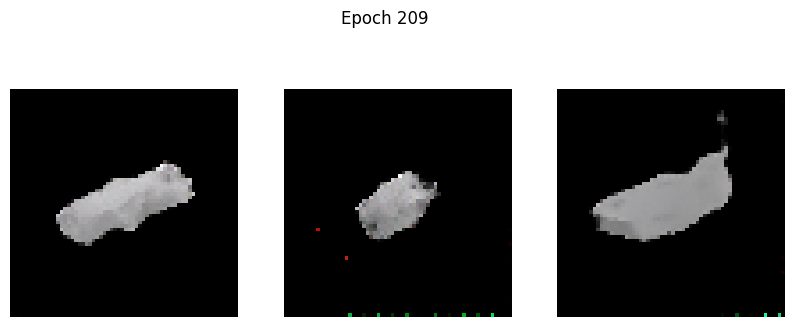

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0894 - g_loss: 3.4704
Epoch 210/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0861 - g_loss: 3.4402

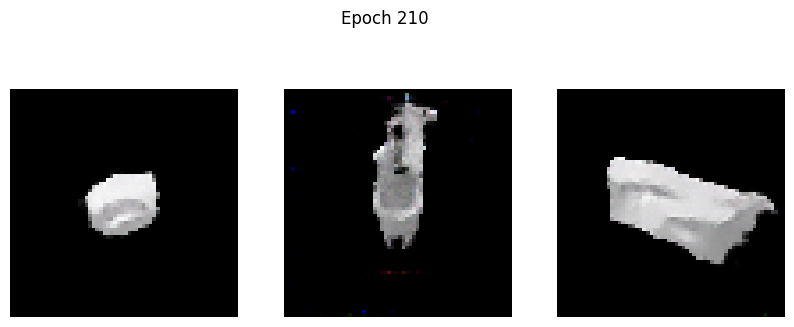

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0862 - g_loss: 3.4402
Epoch 211/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0885 - g_loss: 3.4535

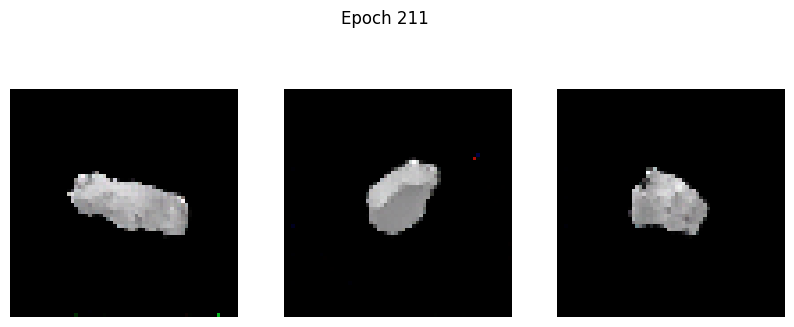

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0889 - g_loss: 3.4540
Epoch 212/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2736 - g_loss: 3.6087

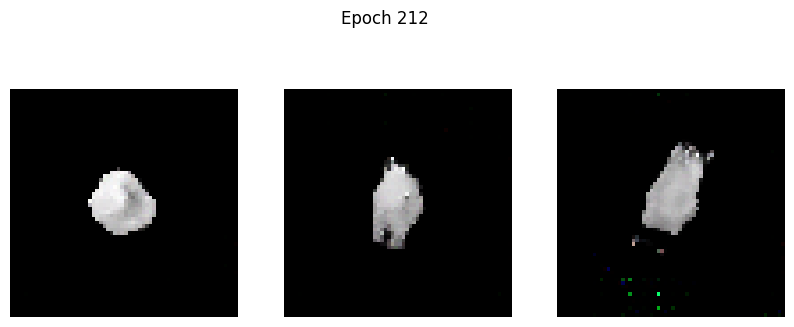

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2724 - g_loss: 3.6074
Epoch 213/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0920 - g_loss: 3.5343

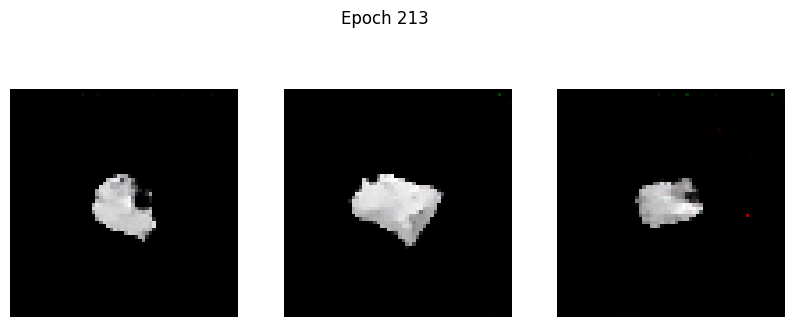

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0920 - g_loss: 3.5341
Epoch 214/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0844 - g_loss: 3.6153

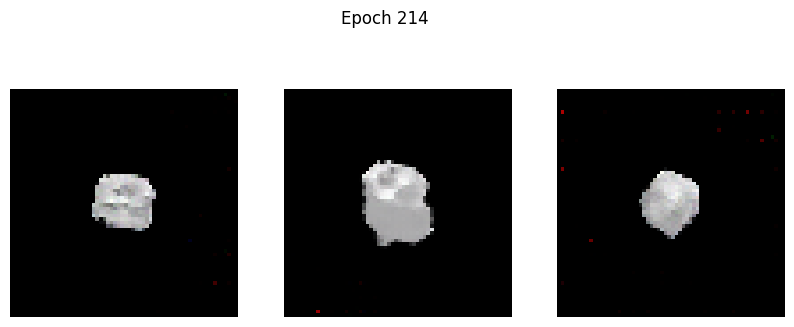

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0845 - g_loss: 3.6149
Epoch 215/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1042 - g_loss: 3.5158

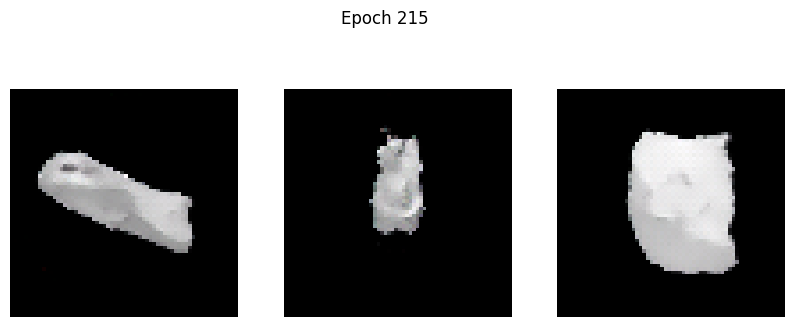

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1050 - g_loss: 3.5171
Epoch 216/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3737 - g_loss: 3.7904

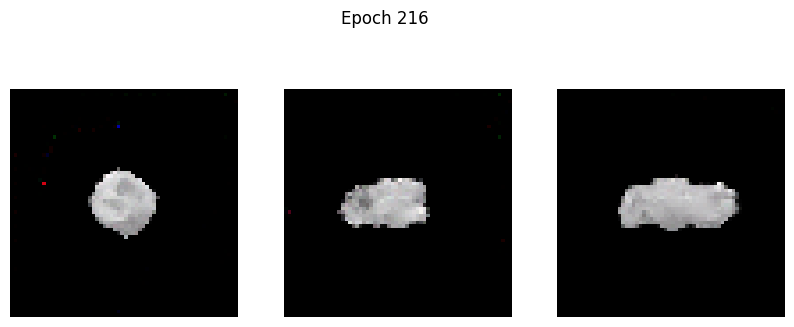

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3720 - g_loss: 3.7881
Epoch 217/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0763 - g_loss: 3.4778

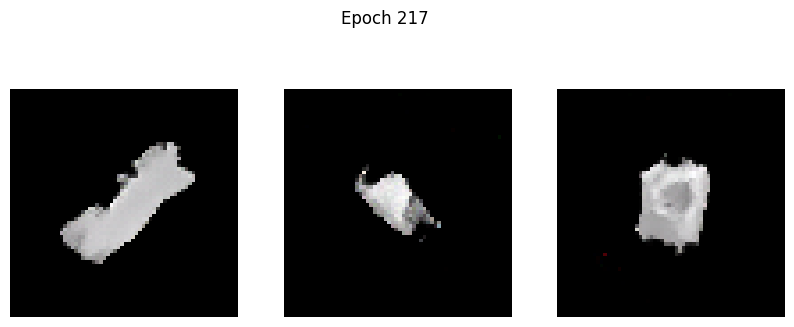

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0766 - g_loss: 3.4782
Epoch 218/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0778 - g_loss: 3.5410

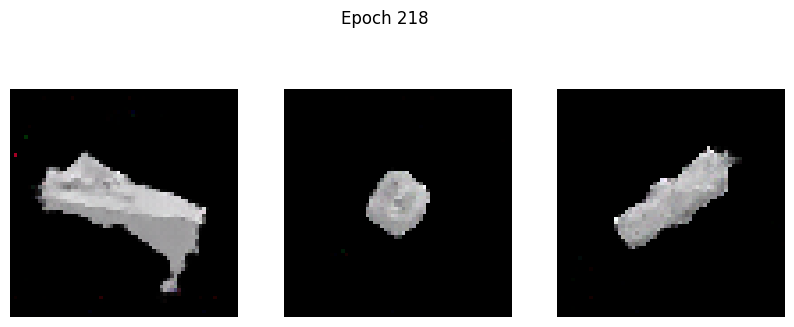

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0779 - g_loss: 3.5412
Epoch 219/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2377 - g_loss: 3.6816

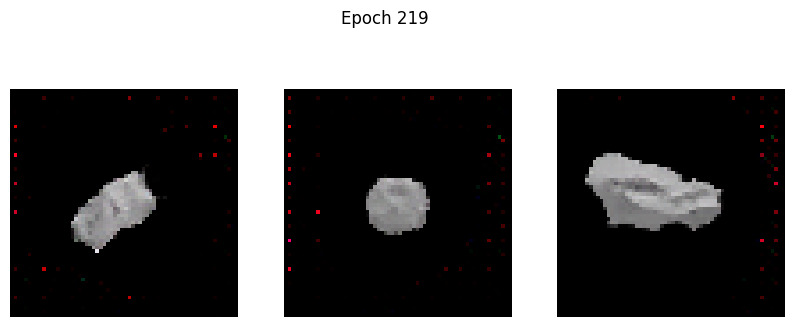

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2380 - g_loss: 3.6810
Epoch 220/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0858 - g_loss: 3.4414

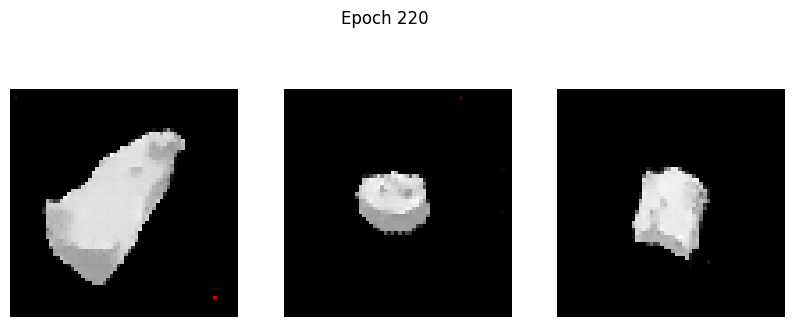

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0858 - g_loss: 3.4421
Epoch 221/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0973 - g_loss: 3.6229

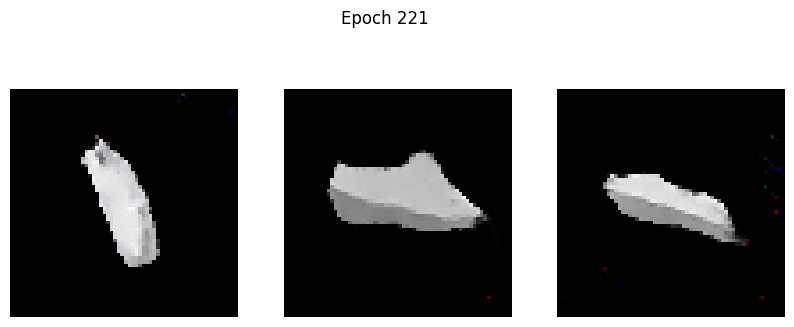

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0973 - g_loss: 3.6229
Epoch 222/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0749 - g_loss: 3.5655

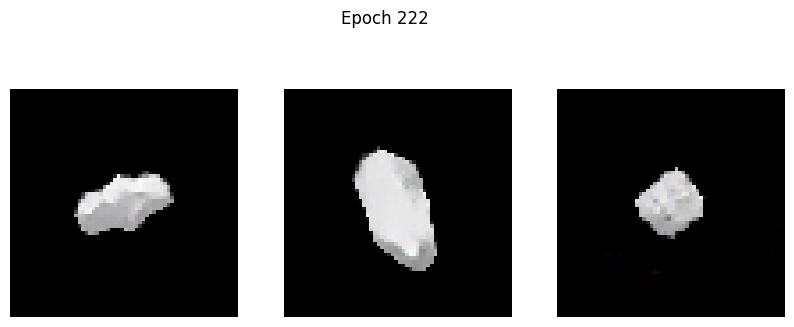

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0751 - g_loss: 3.5660
Epoch 223/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1326 - g_loss: 3.8656

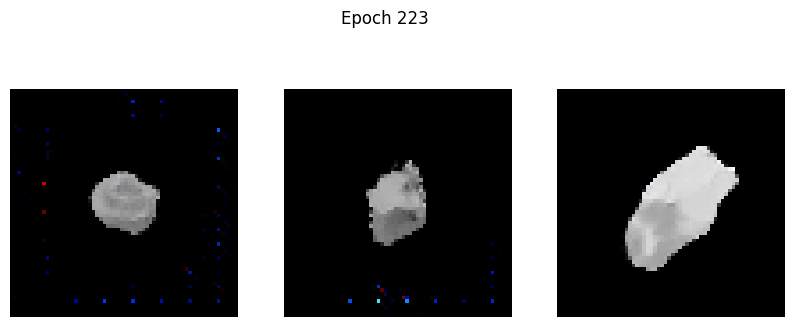

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1325 - g_loss: 3.8646
Epoch 224/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0821 - g_loss: 3.6852

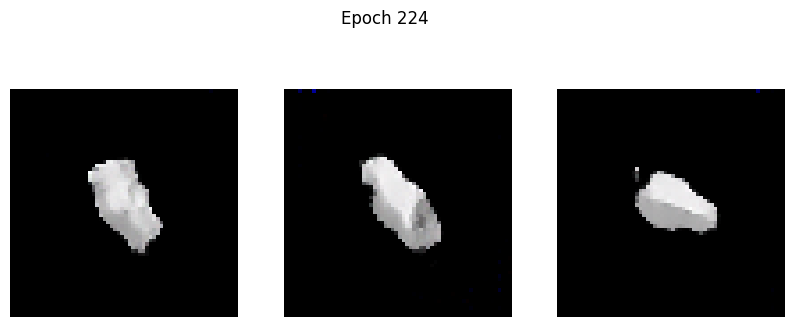

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0821 - g_loss: 3.6851
Epoch 225/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3870 - g_loss: 4.2353

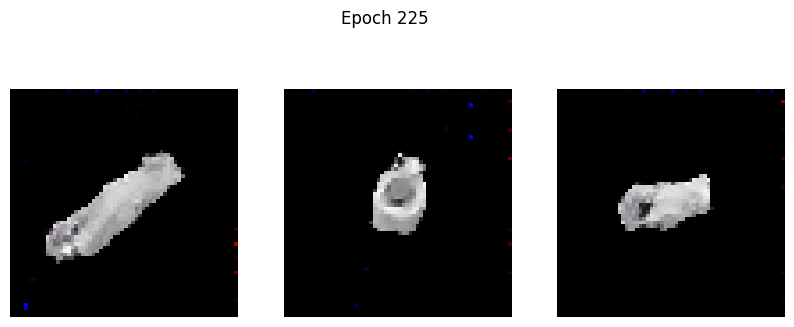

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3865 - g_loss: 4.2330
Epoch 226/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0822 - g_loss: 3.4052

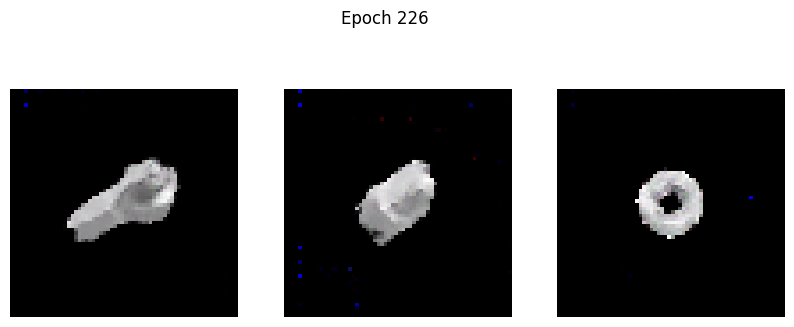

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0823 - g_loss: 3.4063
Epoch 227/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0791 - g_loss: 3.6252

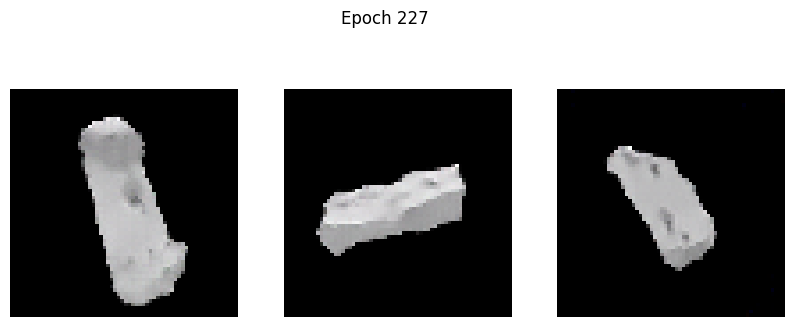

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0791 - g_loss: 3.6249
Epoch 228/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0958 - g_loss: 3.7739

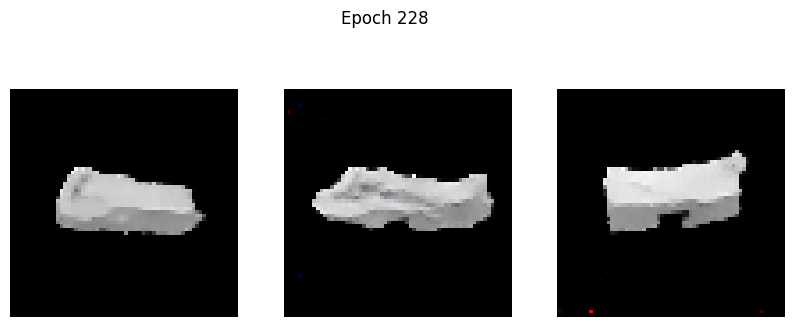

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0958 - g_loss: 3.7732
Epoch 229/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5313 - g_loss: 4.1215

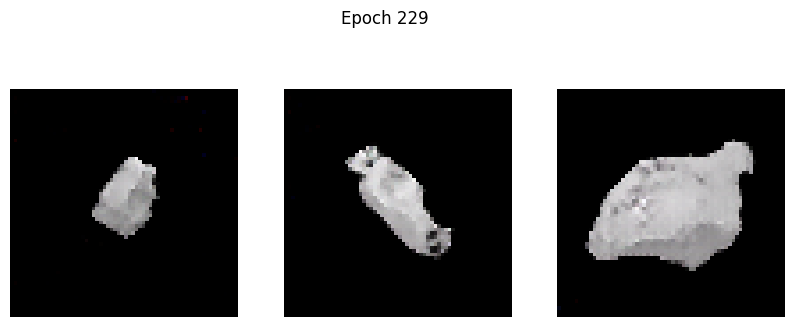

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5346 - g_loss: 4.1216
Epoch 230/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1869 - g_loss: 3.1370

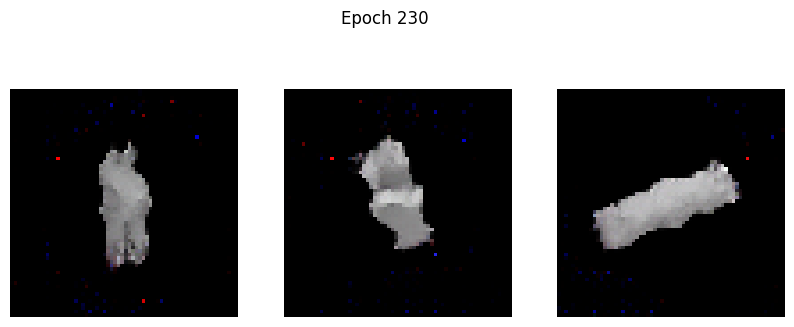

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1867 - g_loss: 3.1368
Epoch 231/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1175 - g_loss: 3.2403

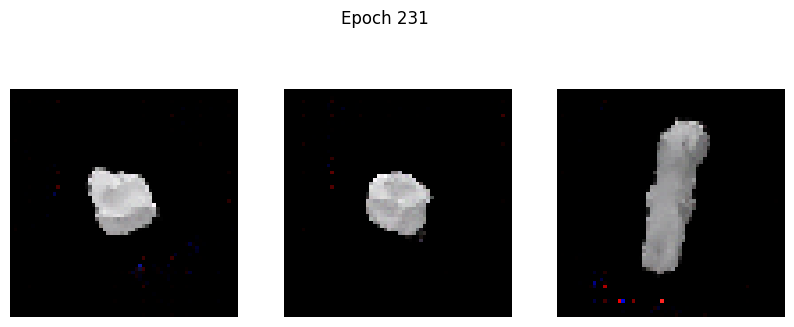

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1174 - g_loss: 3.2408
Epoch 232/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1036 - g_loss: 3.3933

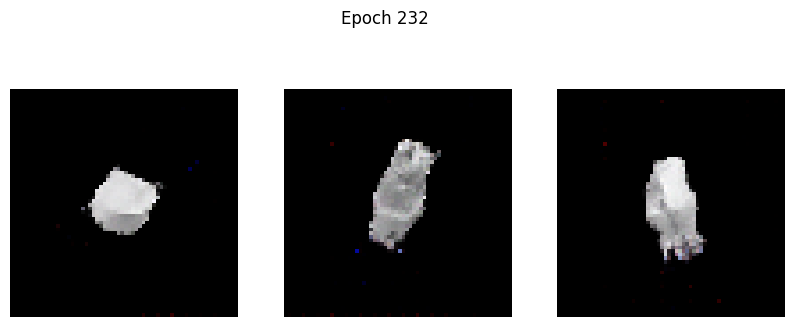

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1036 - g_loss: 3.3936
Epoch 233/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0830 - g_loss: 3.4101

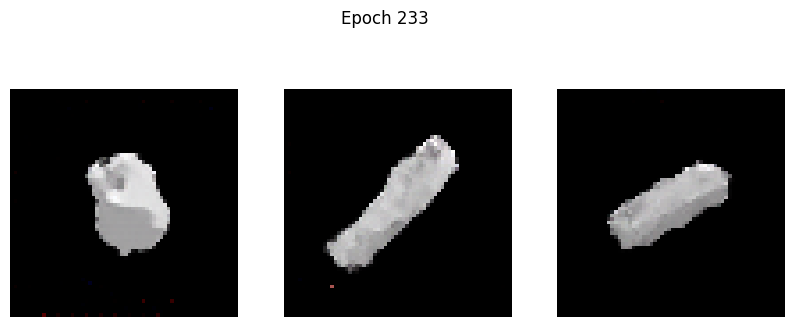

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0831 - g_loss: 3.4104
Epoch 234/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0981 - g_loss: 3.4525

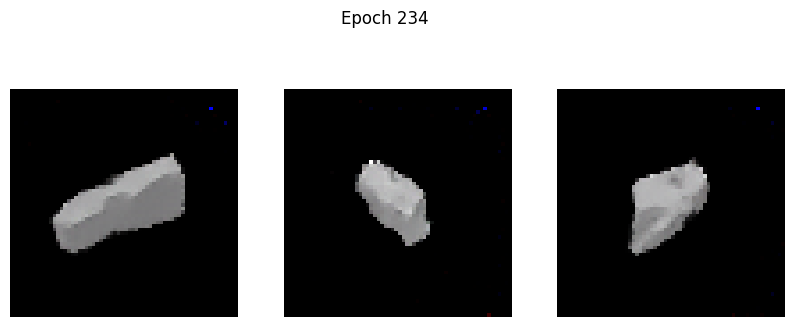

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0981 - g_loss: 3.4533
Epoch 235/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0926 - g_loss: 3.4231

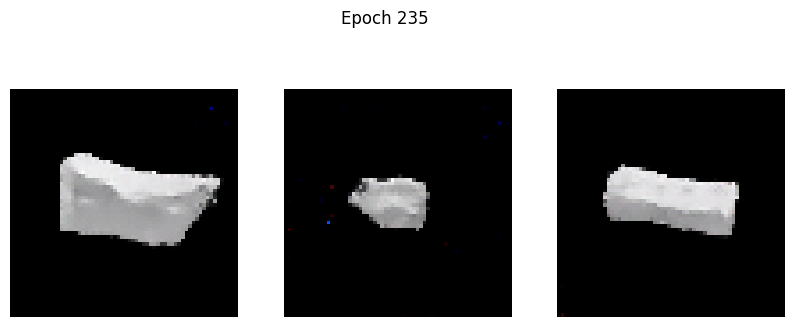

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0925 - g_loss: 3.4241
Epoch 236/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1095 - g_loss: 3.6386

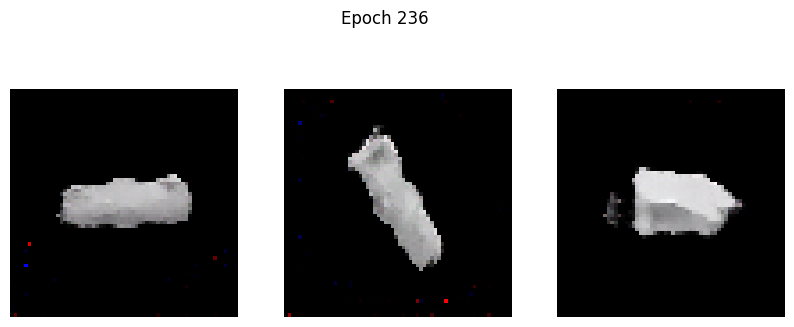

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1095 - g_loss: 3.6385
Epoch 237/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1962 - g_loss: 3.8753

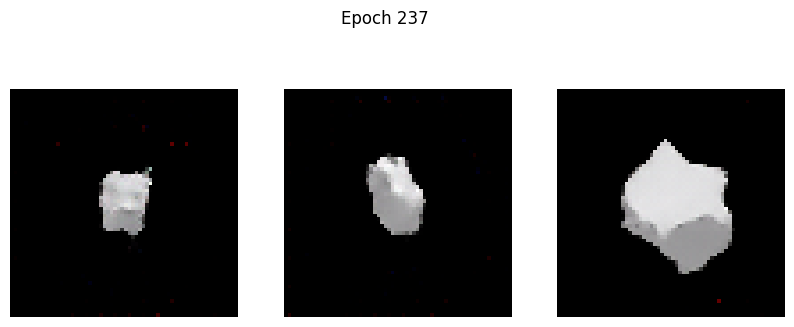

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - d_loss: 0.1956 - g_loss: 3.8733
Epoch 238/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0790 - g_loss: 3.6768

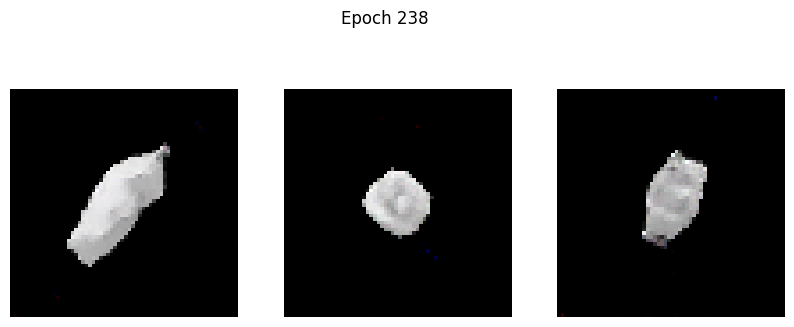

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0791 - g_loss: 3.6772
Epoch 239/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.1712 - g_loss: 3.6767

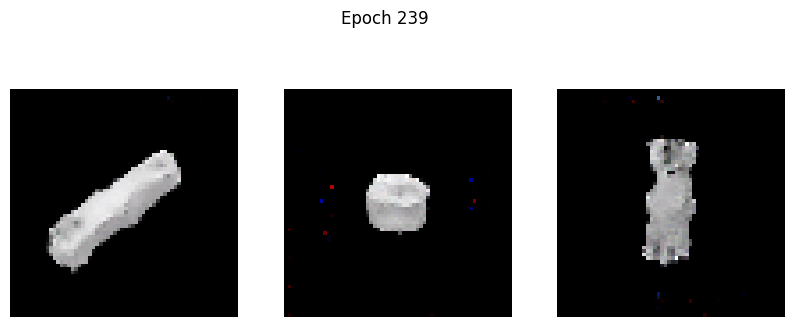

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.1712 - g_loss: 3.6773
Epoch 240/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0656 - g_loss: 3.6714

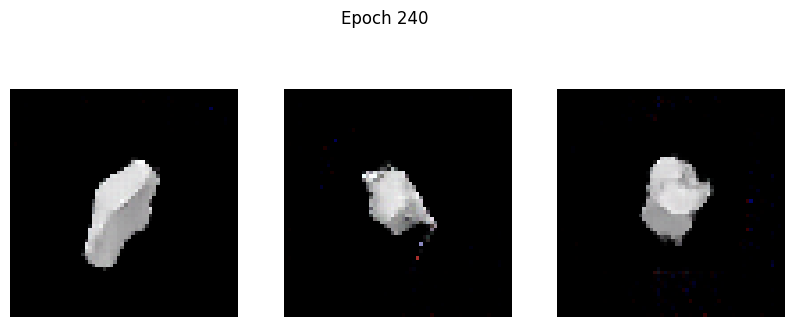

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0657 - g_loss: 3.6716
Epoch 241/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0803 - g_loss: 3.7029

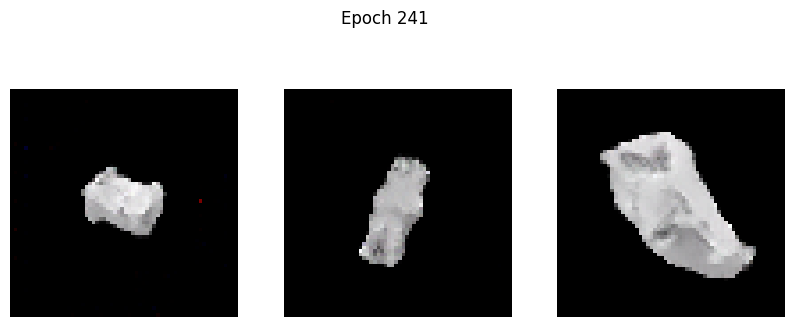

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0803 - g_loss: 3.7030
Epoch 242/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0911 - g_loss: 3.7898

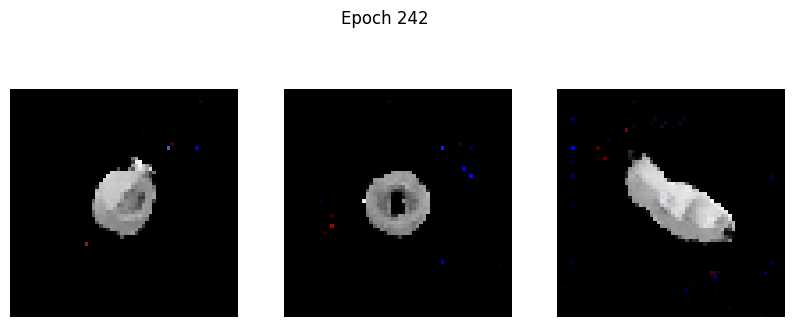

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0910 - g_loss: 3.7893
Epoch 243/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0802 - g_loss: 3.8024

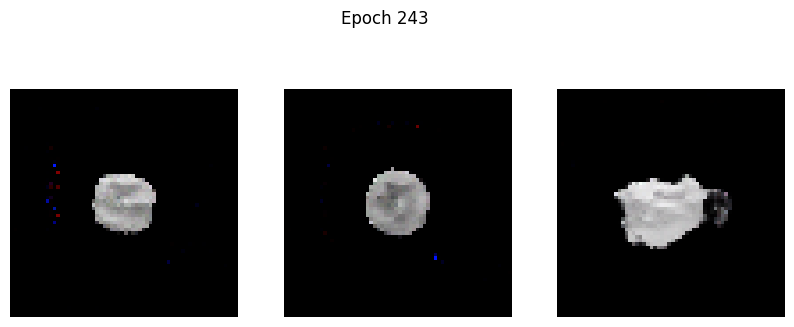

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0805 - g_loss: 3.8026
Epoch 244/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0655 - g_loss: 3.8179

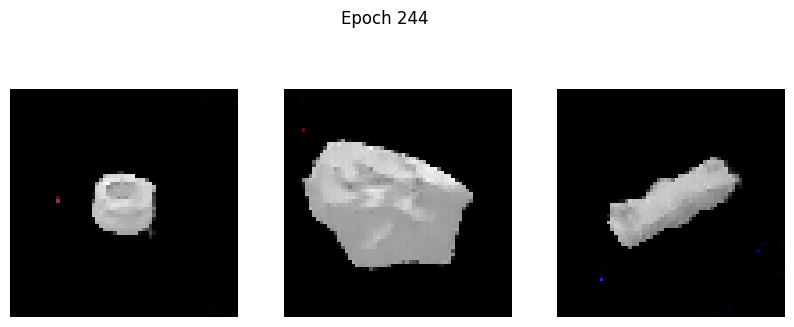

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0656 - g_loss: 3.8176
Epoch 245/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1097 - g_loss: 3.7778

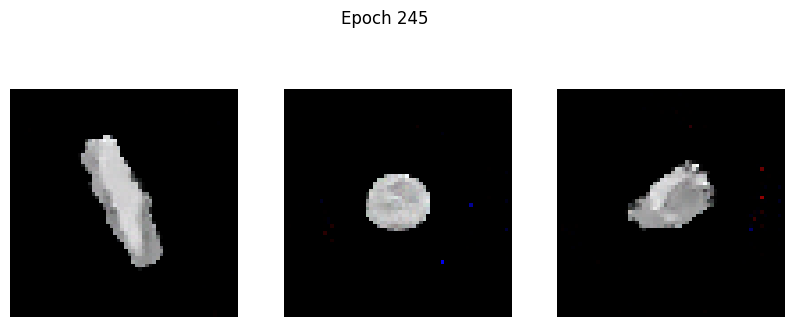

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1096 - g_loss: 3.7777
Epoch 246/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0908 - g_loss: 3.6817

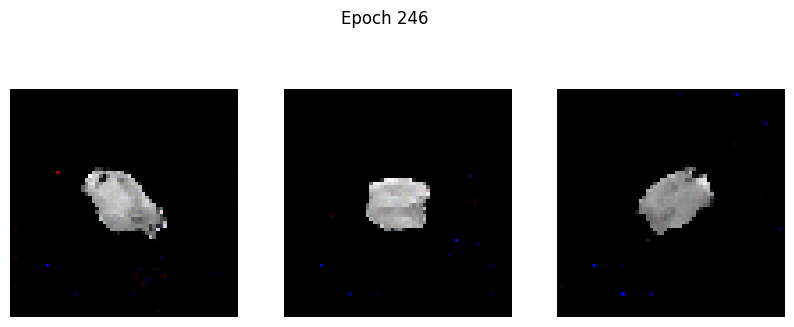

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0908 - g_loss: 3.6826
Epoch 247/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0857 - g_loss: 3.9373

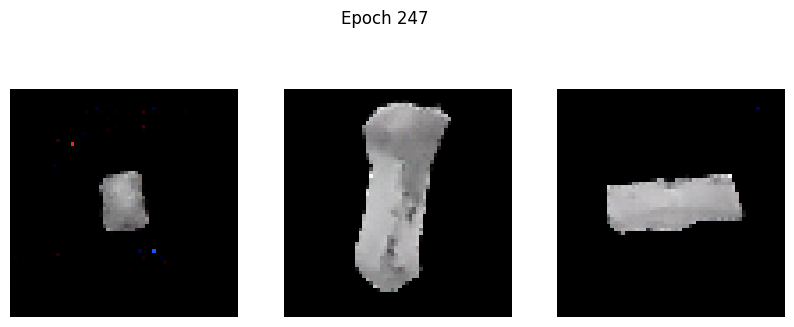

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0858 - g_loss: 3.9371
Epoch 248/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1853 - g_loss: 4.1073

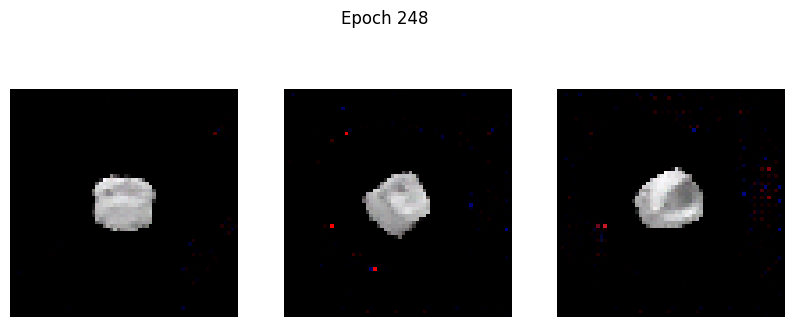

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1862 - g_loss: 4.1089
Epoch 249/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0840 - g_loss: 3.6765

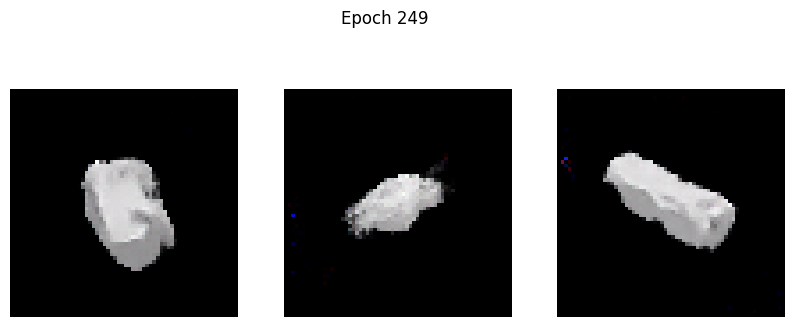

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0840 - g_loss: 3.6768
Epoch 250/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0789 - g_loss: 3.6816

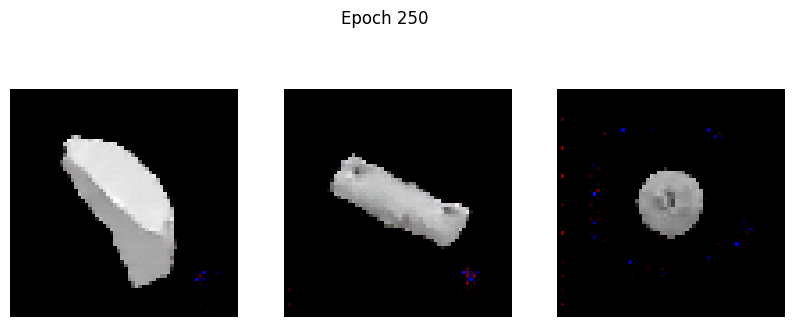

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0794 - g_loss: 3.6837
Epoch 251/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1163 - g_loss: 3.9718

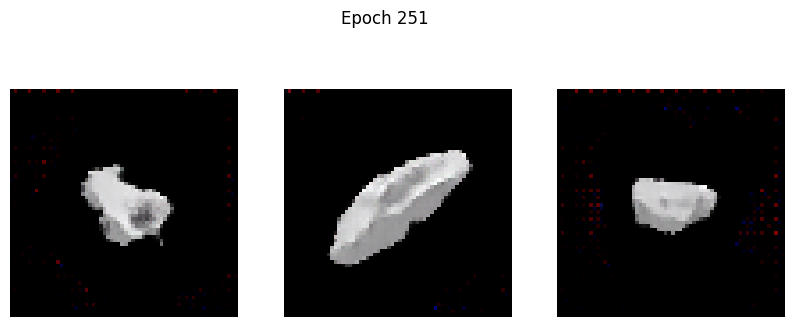

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1161 - g_loss: 3.9706
Epoch 252/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0790 - g_loss: 3.6527

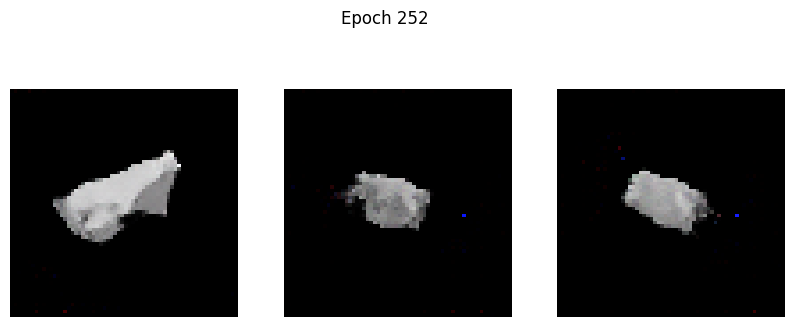

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0791 - g_loss: 3.6535
Epoch 253/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1177 - g_loss: 4.0048

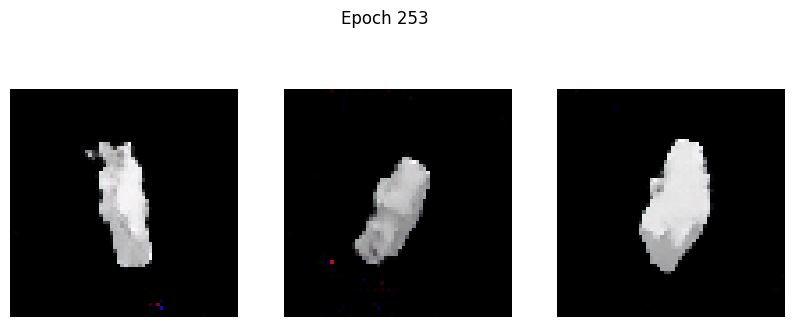

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1174 - g_loss: 4.0031
Epoch 254/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1664 - g_loss: 3.9642

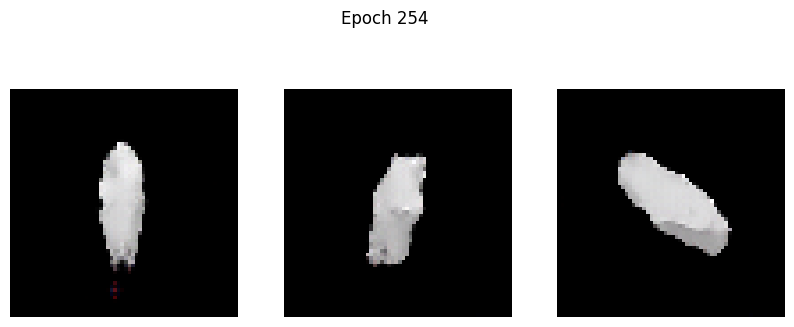

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1676 - g_loss: 3.9682
Epoch 255/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0675 - g_loss: 3.7836

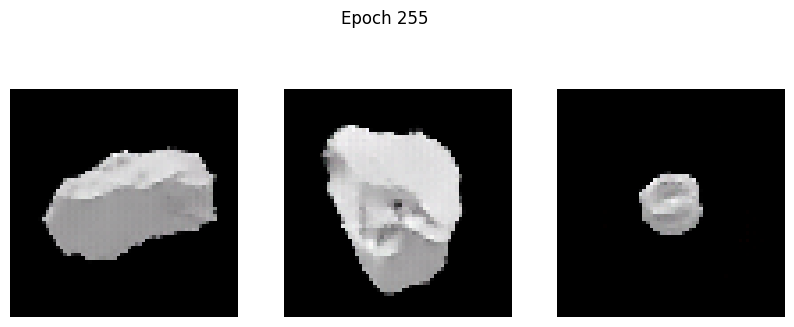

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0675 - g_loss: 3.7833
Epoch 256/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0632 - g_loss: 3.7374

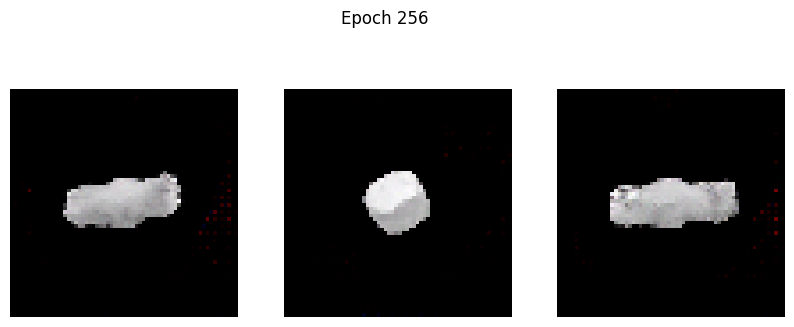

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0632 - g_loss: 3.7372
Epoch 257/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0877 - g_loss: 3.8727

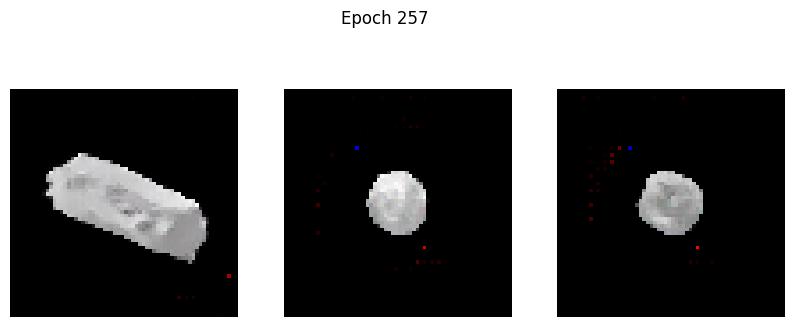

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0879 - g_loss: 3.8728
Epoch 258/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0910 - g_loss: 3.9757

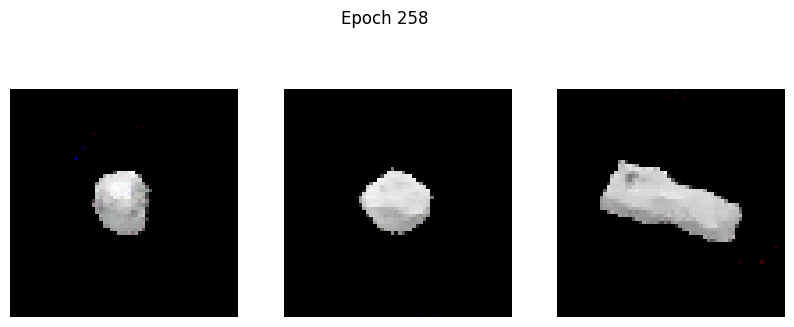

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0910 - g_loss: 3.9757
Epoch 259/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0631 - g_loss: 3.8061

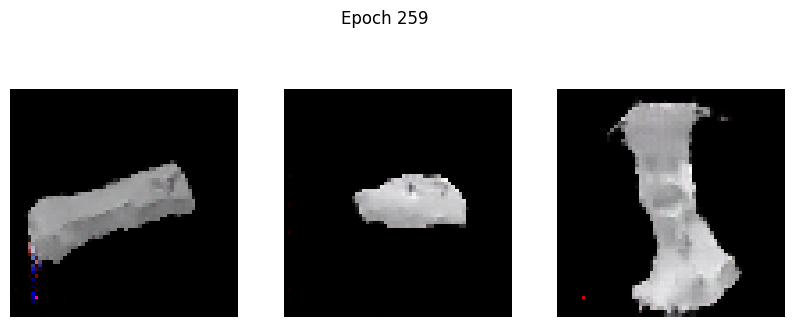

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0631 - g_loss: 3.8066
Epoch 260/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0805 - g_loss: 3.9438

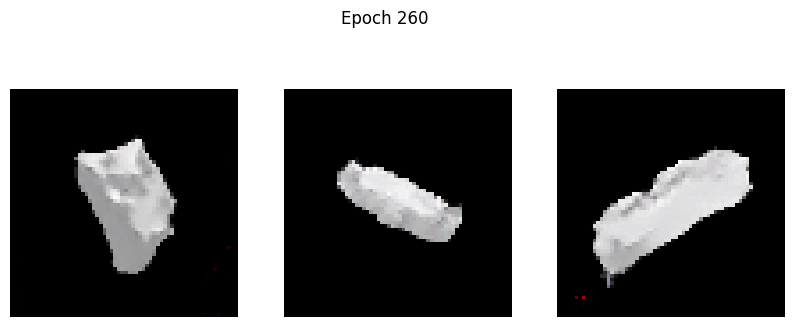

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0805 - g_loss: 3.9439
Epoch 261/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1602 - g_loss: 4.1306

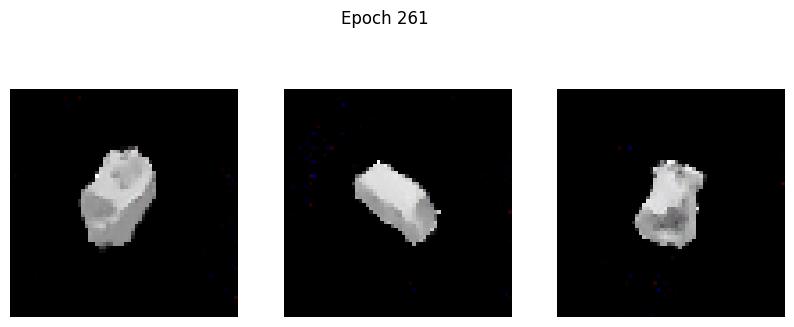

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1599 - g_loss: 4.1297
Epoch 262/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0753 - g_loss: 3.9395

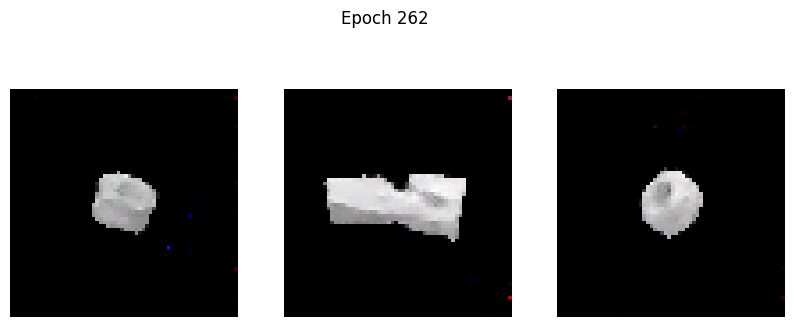

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0752 - g_loss: 3.9393
Epoch 263/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0931 - g_loss: 4.0397

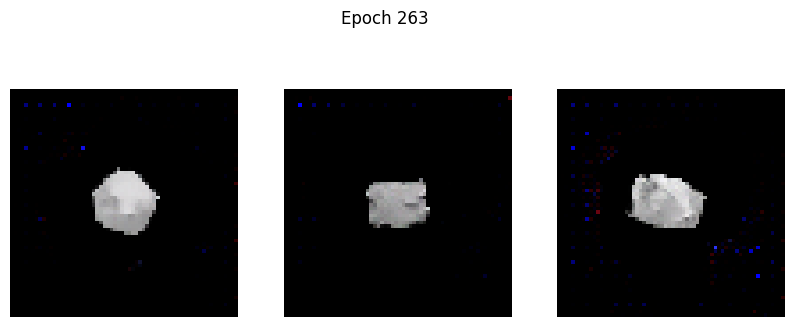

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0933 - g_loss: 4.0399
Epoch 264/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0738 - g_loss: 4.0542

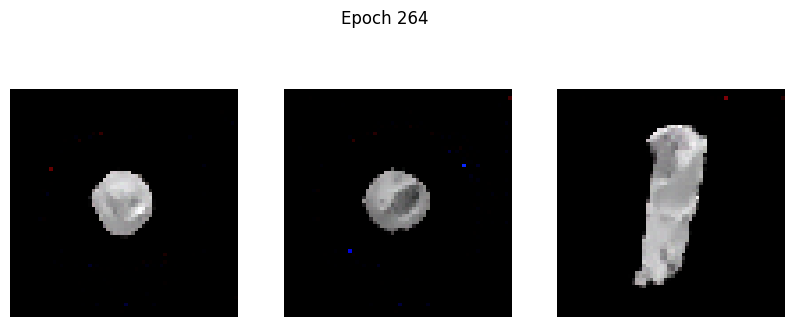

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0738 - g_loss: 4.0541
Epoch 265/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1321 - g_loss: 4.0673

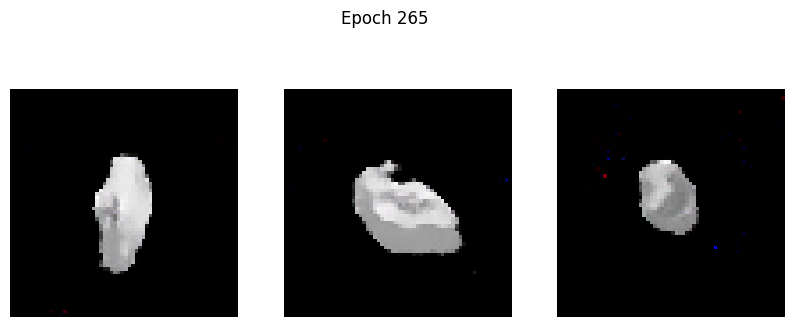

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1317 - g_loss: 4.0667
Epoch 266/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1016 - g_loss: 3.9659

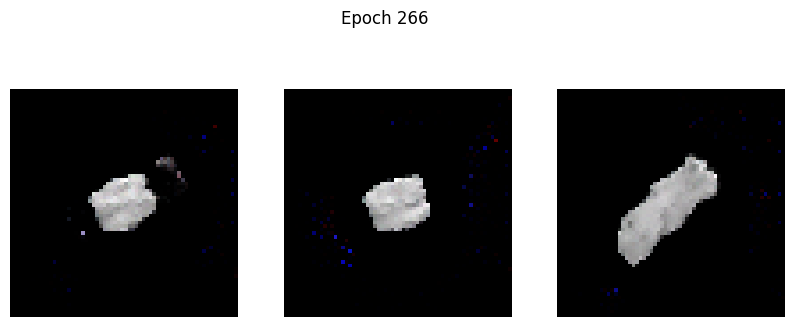

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1019 - g_loss: 3.9674
Epoch 267/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0858 - g_loss: 3.9918

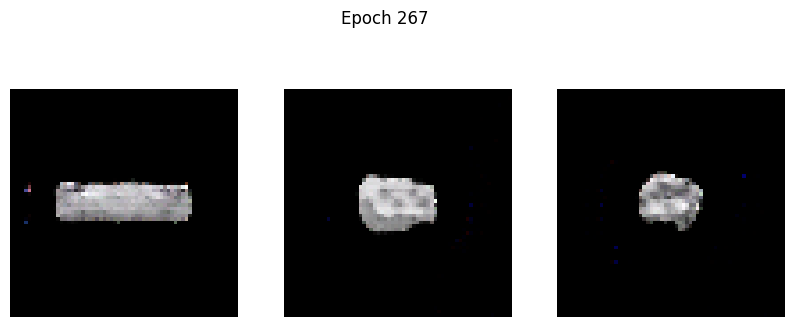

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0878 - g_loss: 3.9951
Epoch 268/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2618 - g_loss: 4.0998

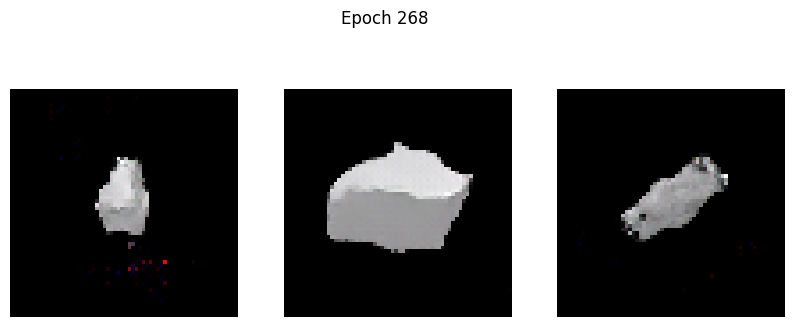

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2606 - g_loss: 4.0976
Epoch 269/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0860 - g_loss: 3.8642

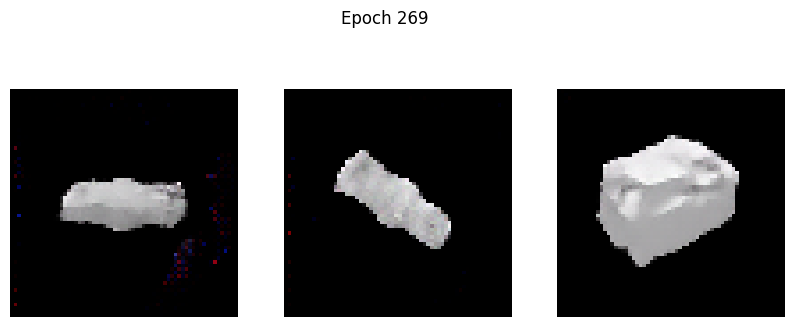

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0860 - g_loss: 3.8638
Epoch 270/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1381 - g_loss: 3.9856

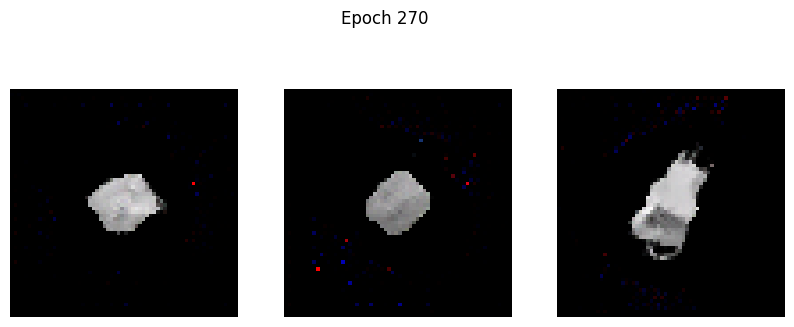

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1378 - g_loss: 3.9849
Epoch 271/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0879 - g_loss: 4.0859

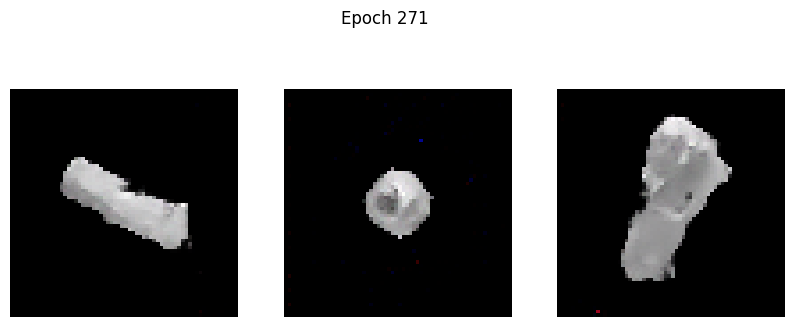

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0877 - g_loss: 4.0843
Epoch 272/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0500 - g_loss: 3.8462

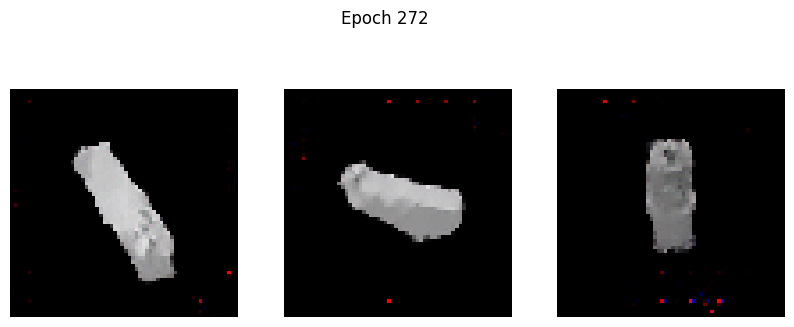

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0501 - g_loss: 3.8470
Epoch 273/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1155 - g_loss: 4.1691

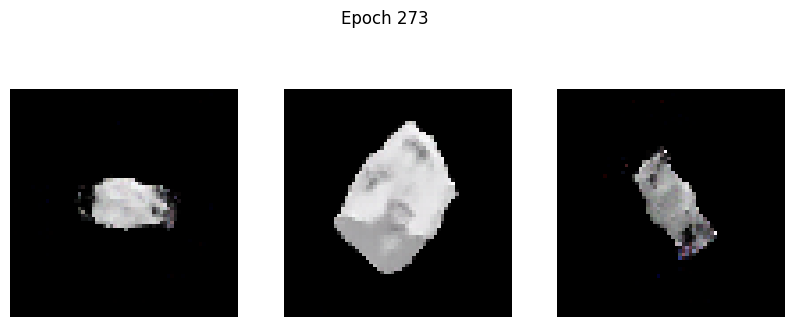

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1151 - g_loss: 4.1679
Epoch 274/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0787 - g_loss: 4.0273

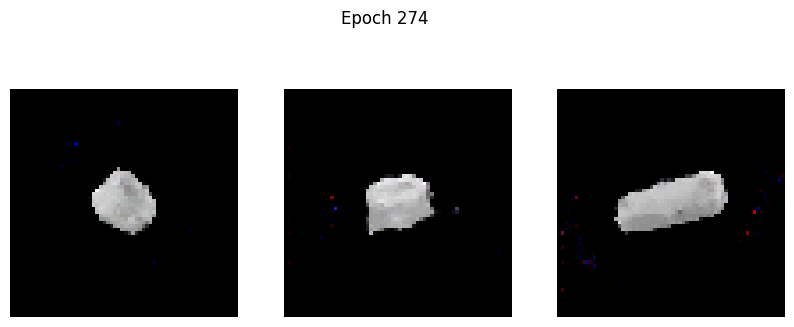

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0786 - g_loss: 4.0272
Epoch 275/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1120 - g_loss: 4.1318

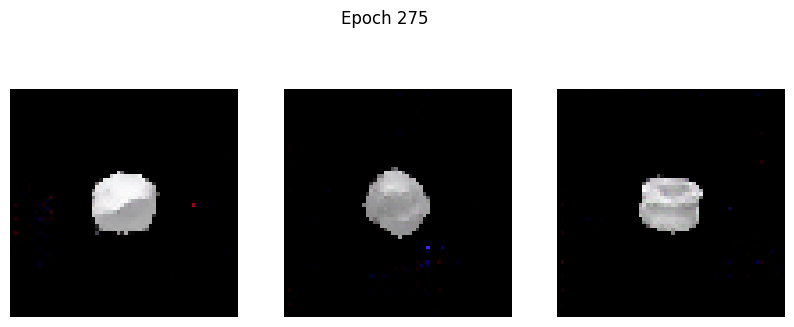

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1118 - g_loss: 4.1318
Epoch 276/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1855 - g_loss: 4.3028

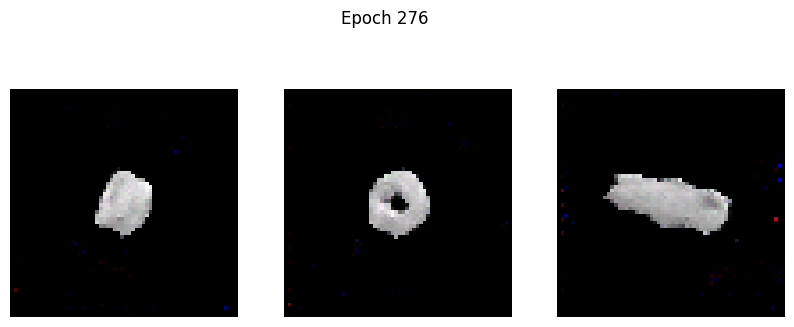

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1859 - g_loss: 4.3028
Epoch 277/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0603 - g_loss: 3.8563

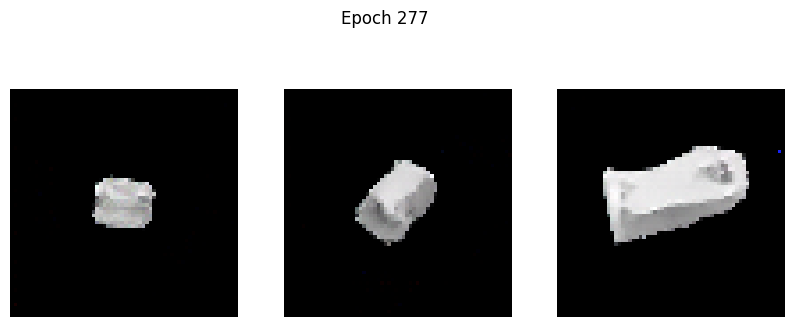

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0603 - g_loss: 3.8567
Epoch 278/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0724 - g_loss: 4.0403

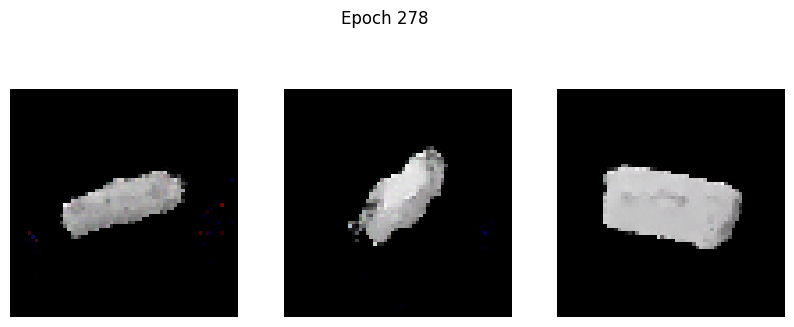

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0723 - g_loss: 4.0393
Epoch 279/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0674 - g_loss: 4.0036

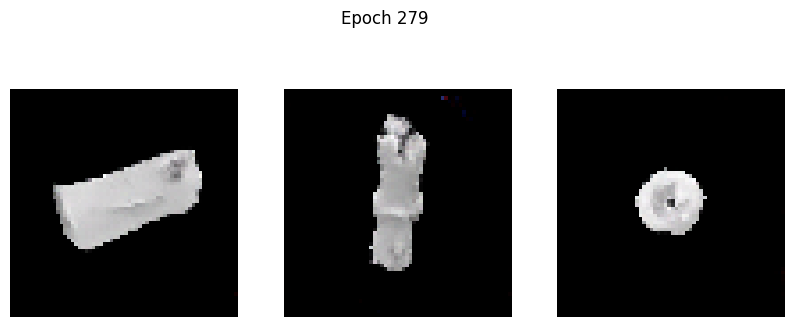

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0674 - g_loss: 4.0044
Epoch 280/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3219 - g_loss: 4.9271

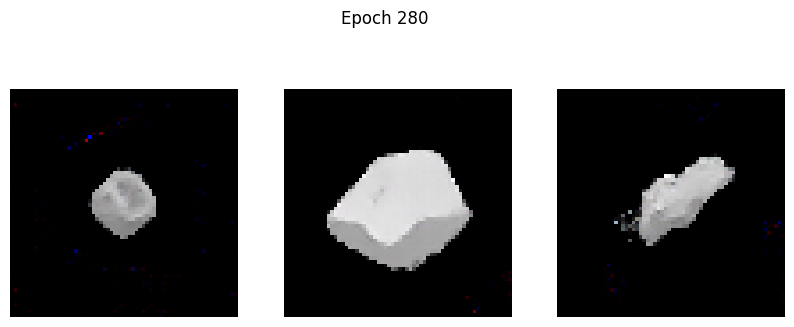

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3214 - g_loss: 4.9246
Epoch 281/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0581 - g_loss: 4.0251

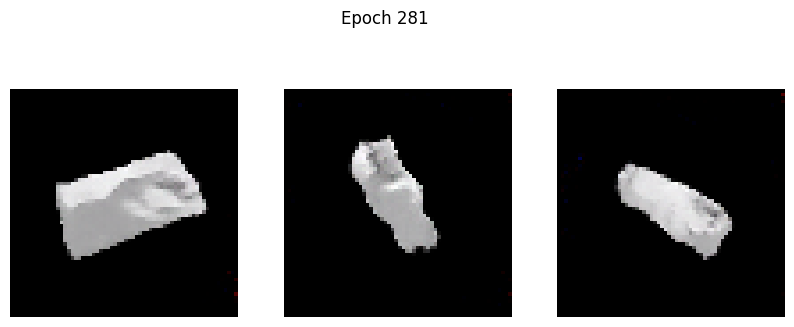

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0581 - g_loss: 4.0251
Epoch 282/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2643 - g_loss: 4.3944

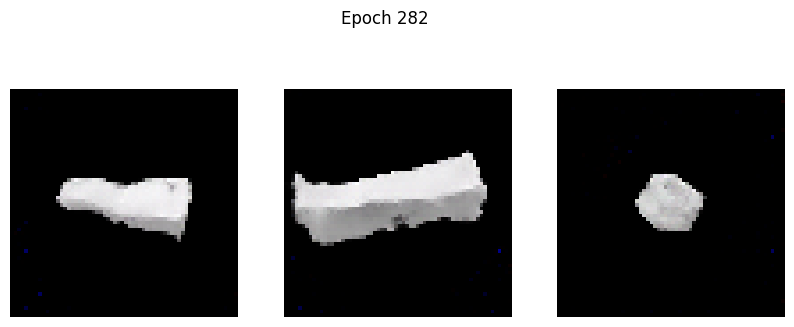

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2640 - g_loss: 4.3924
Epoch 283/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0563 - g_loss: 3.8930

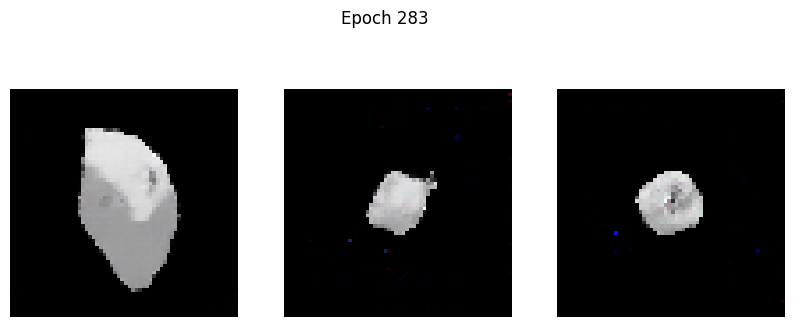

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0563 - g_loss: 3.8934
Epoch 284/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0446 - g_loss: 3.8393

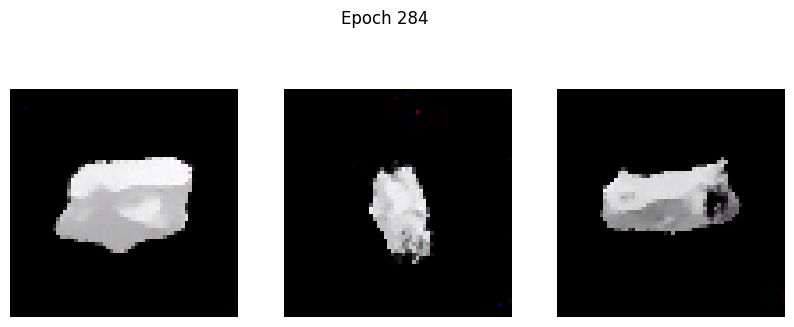

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0446 - g_loss: 3.8402
Epoch 285/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0515 - g_loss: 3.9856

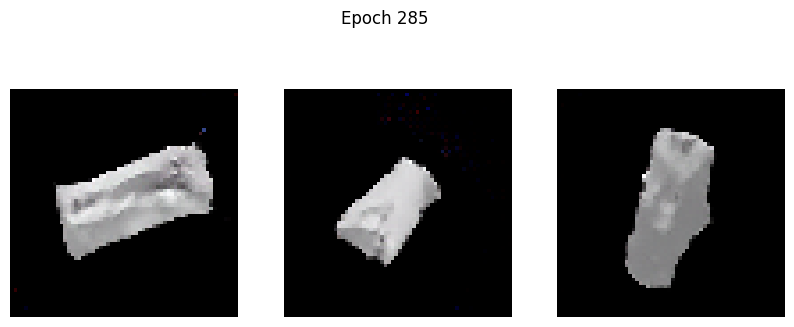

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0515 - g_loss: 3.9855
Epoch 286/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0523 - g_loss: 4.1994

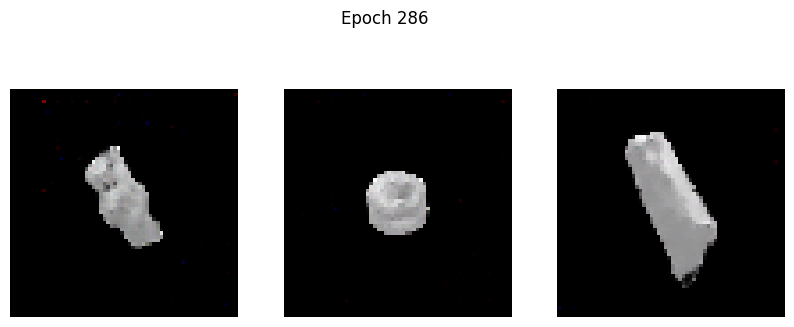

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0524 - g_loss: 4.1989
Epoch 287/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0862 - g_loss: 4.1780

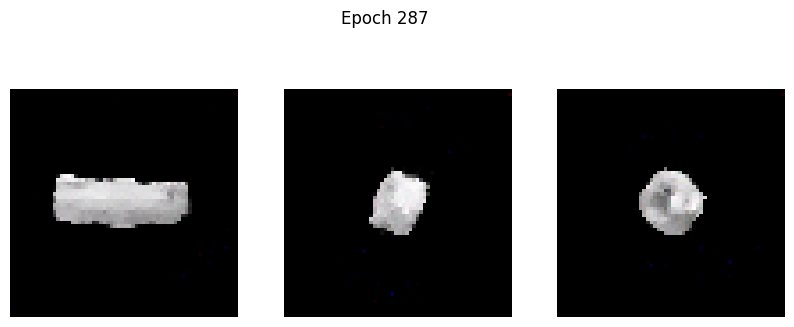

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0864 - g_loss: 4.1784
Epoch 288/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0423 - g_loss: 4.0310

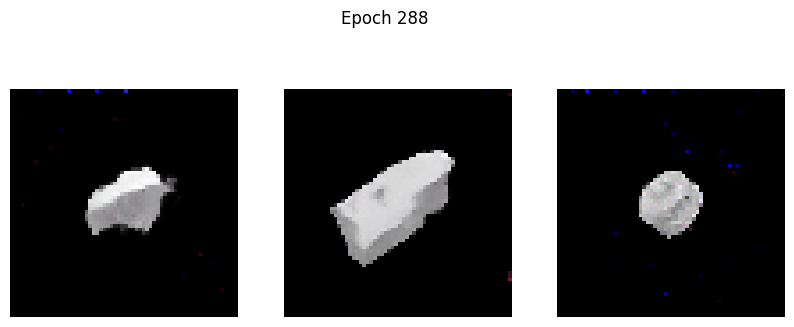

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0422 - g_loss: 4.0305
Epoch 289/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1069 - g_loss: 4.1947

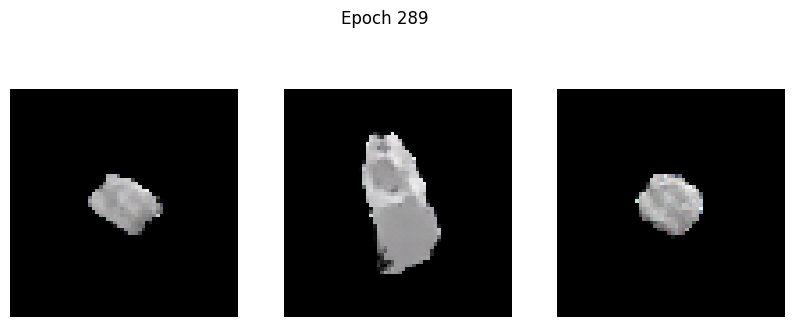

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1086 - g_loss: 4.1990
Epoch 290/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1005 - g_loss: 4.0492

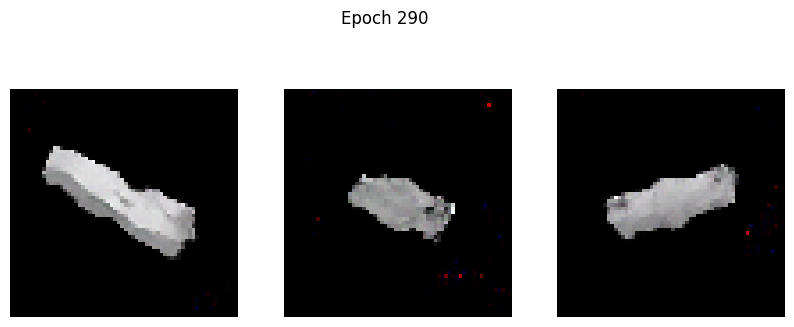

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1002 - g_loss: 4.0485
Epoch 291/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0416 - g_loss: 4.0962

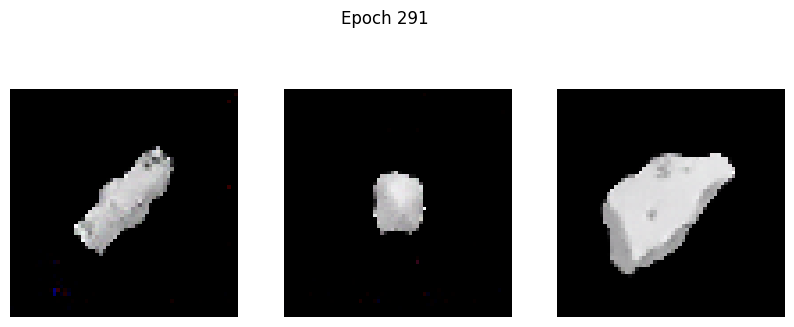

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0416 - g_loss: 4.0952
Epoch 292/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0969 - g_loss: 4.2819

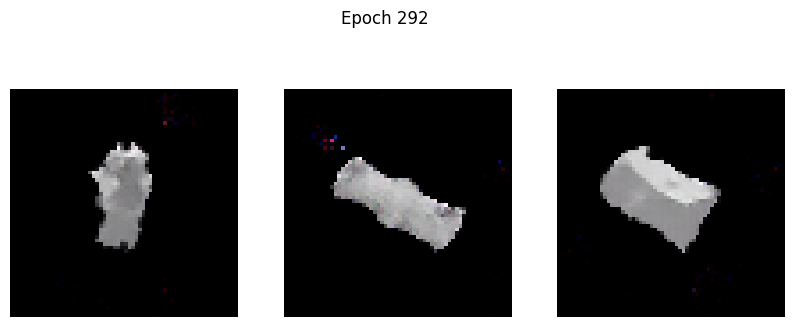

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0977 - g_loss: 4.2819
Epoch 293/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0579 - g_loss: 3.9382

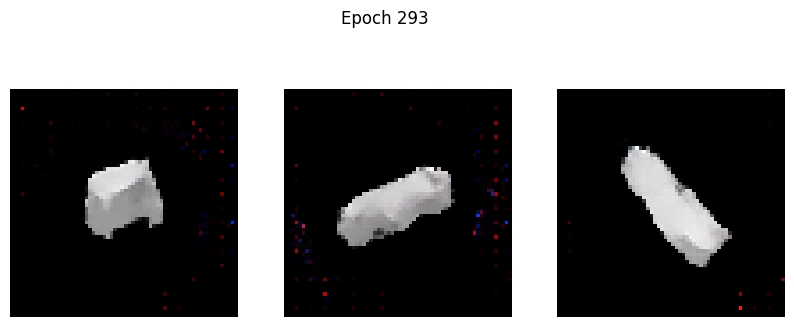

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0579 - g_loss: 3.9390
Epoch 294/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0344 - g_loss: 4.0369

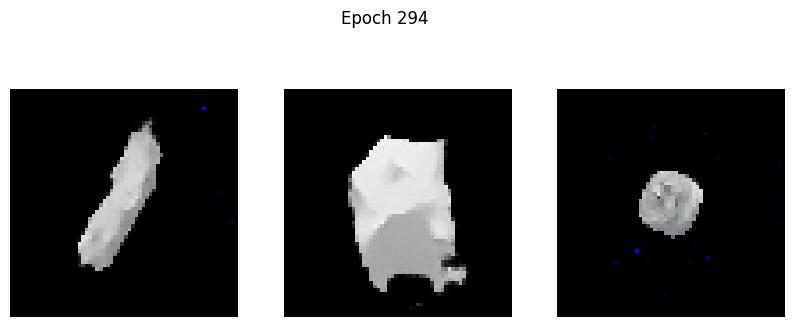

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0346 - g_loss: 4.0377
Epoch 295/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0435 - g_loss: 4.0839

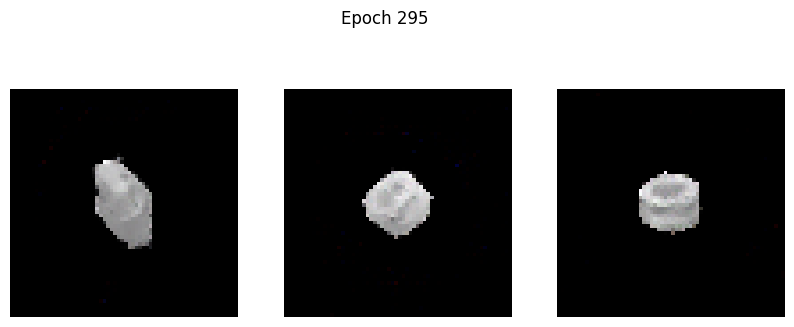

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0436 - g_loss: 4.0843
Epoch 296/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0591 - g_loss: 4.2158

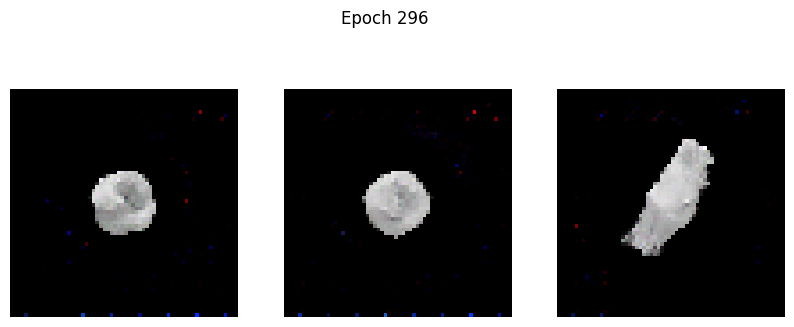

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0593 - g_loss: 4.2166
Epoch 297/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0424 - g_loss: 4.2248

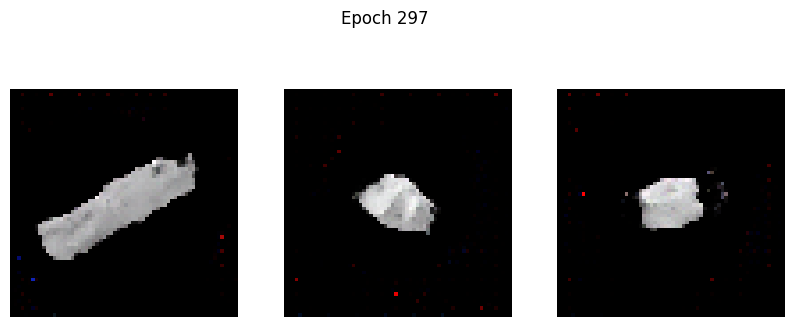

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0424 - g_loss: 4.2249
Epoch 298/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2901 - g_loss: 4.9549

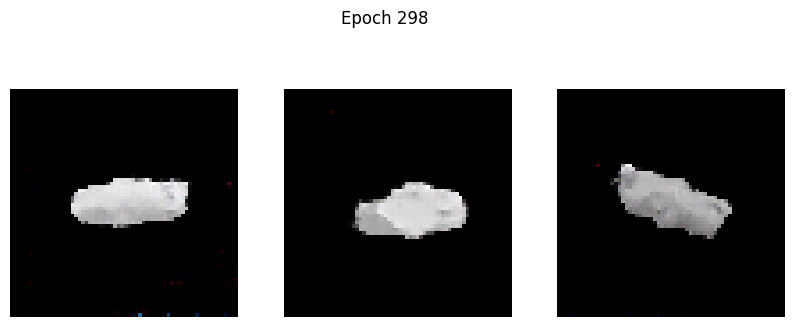

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2890 - g_loss: 4.9504
Epoch 299/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0392 - g_loss: 4.1110

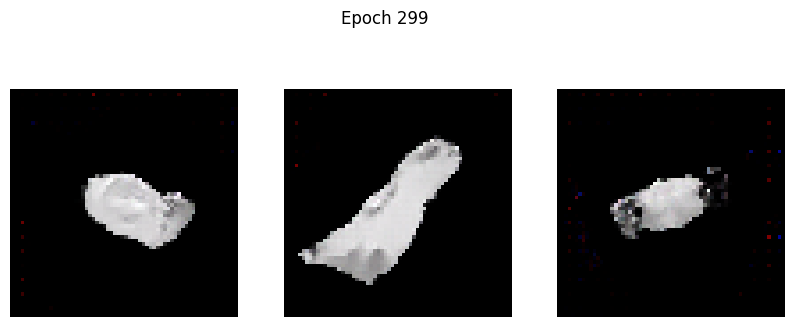

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0393 - g_loss: 4.1114
Epoch 300/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0584 - g_loss: 4.2051

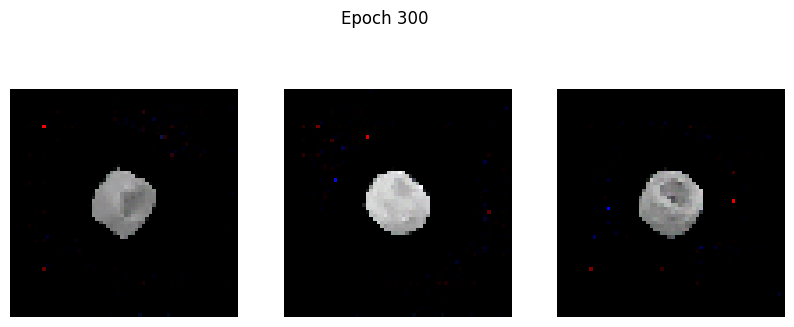

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0585 - g_loss: 4.2057
Epoch 301/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0569 - g_loss: 4.2416

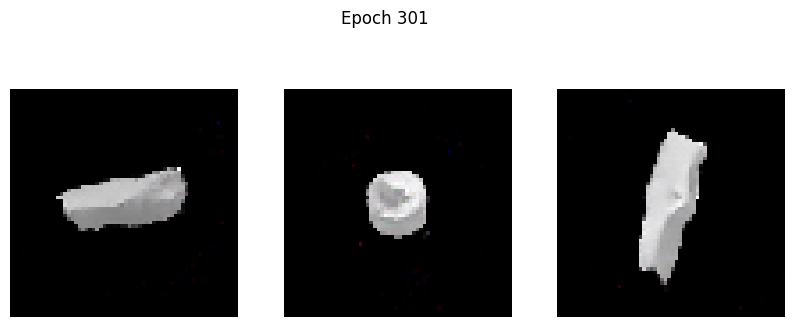

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0571 - g_loss: 4.2424
Epoch 302/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0445 - g_loss: 4.2320

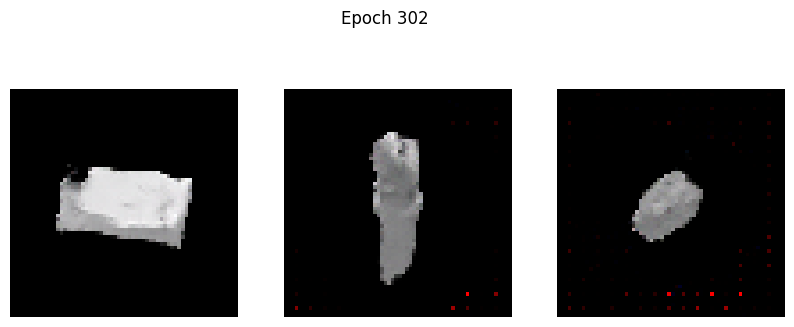

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0447 - g_loss: 4.2328
Epoch 303/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1950 - g_loss: 4.5420

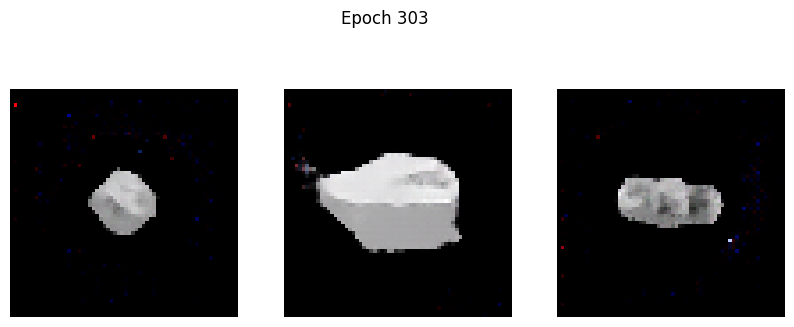

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1949 - g_loss: 4.5413
Epoch 304/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0473 - g_loss: 4.2454

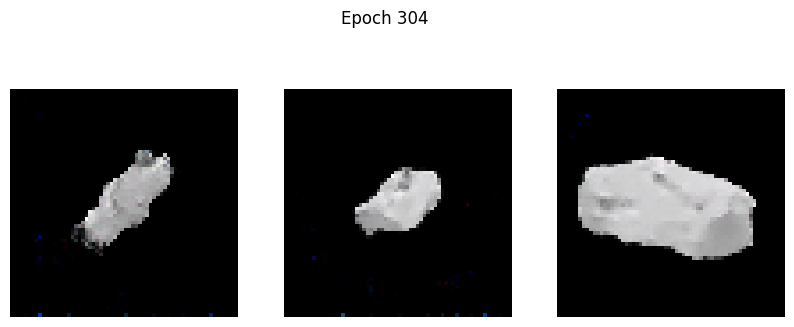

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0474 - g_loss: 4.2456
Epoch 305/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0382 - g_loss: 4.3147

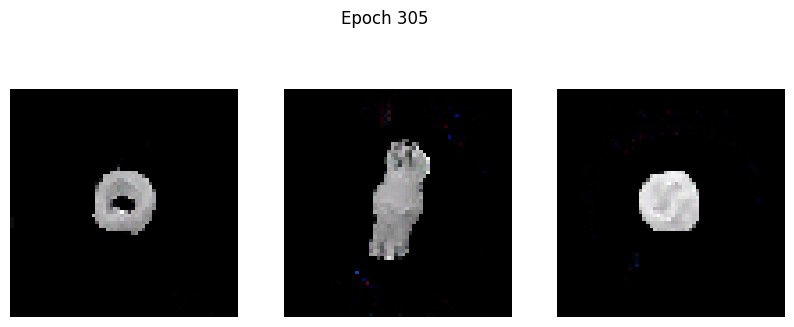

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0383 - g_loss: 4.3145
Epoch 306/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0481 - g_loss: 4.4142

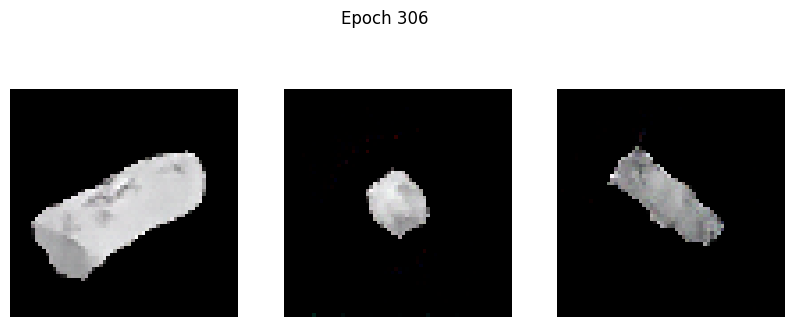

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0482 - g_loss: 4.4142
Epoch 307/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0977 - g_loss: 4.4020

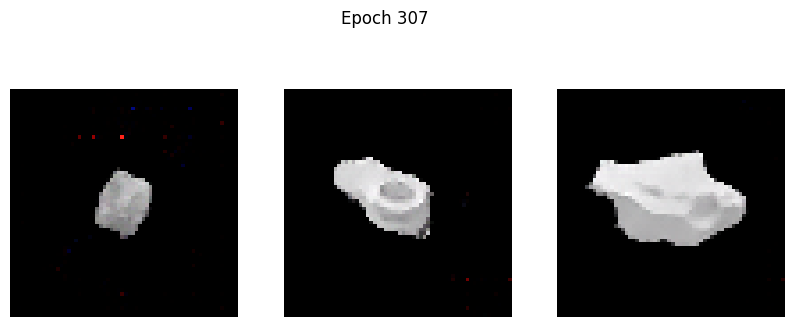

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0975 - g_loss: 4.4024
Epoch 308/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1127 - g_loss: 4.4395

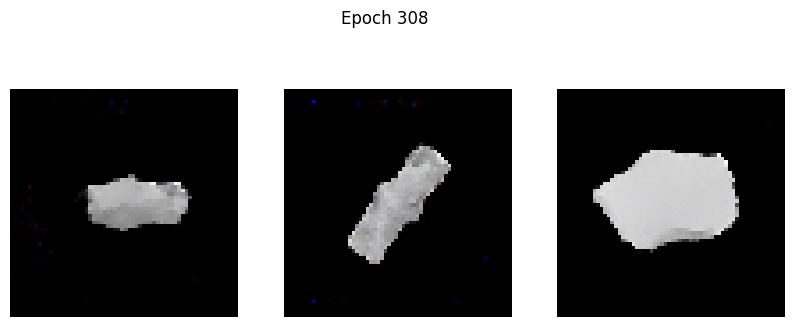

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1125 - g_loss: 4.4382
Epoch 309/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2031 - g_loss: 4.9493

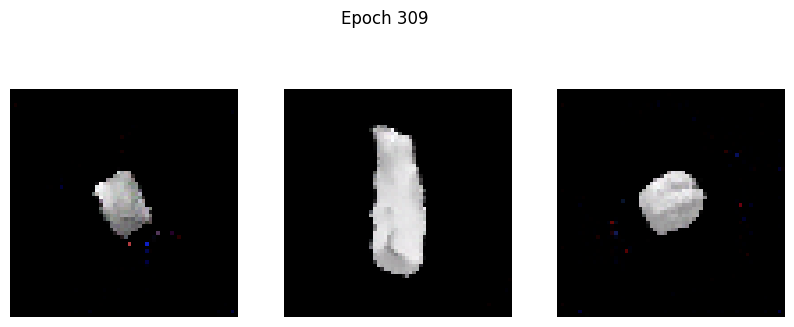

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2026 - g_loss: 4.9460
Epoch 310/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0664 - g_loss: 4.3898

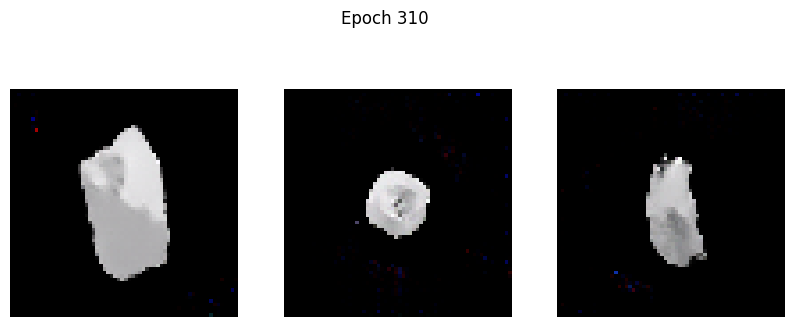

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0666 - g_loss: 4.3894
Epoch 311/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0357 - g_loss: 4.2867

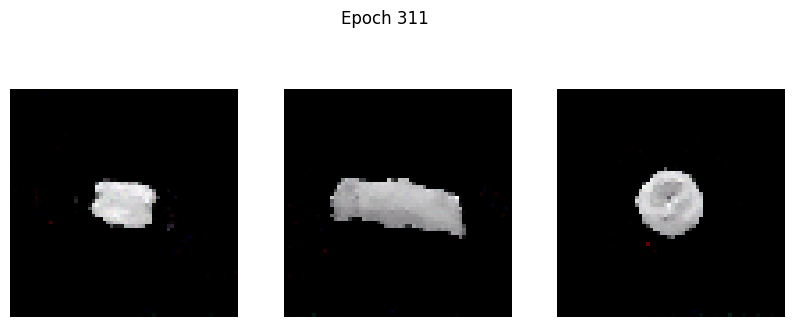

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0359 - g_loss: 4.2878
Epoch 312/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0507 - g_loss: 4.4026

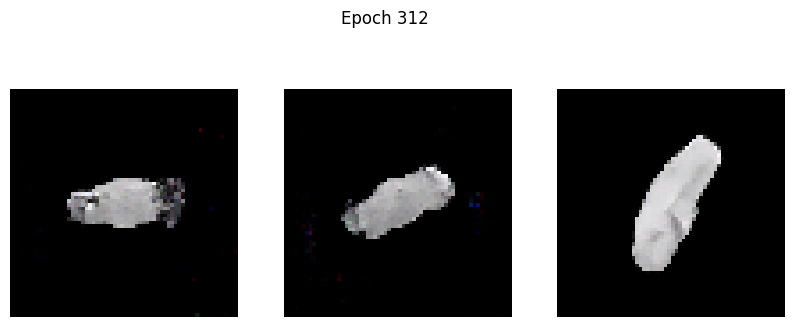

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0507 - g_loss: 4.4025
Epoch 313/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0653 - g_loss: 4.4055

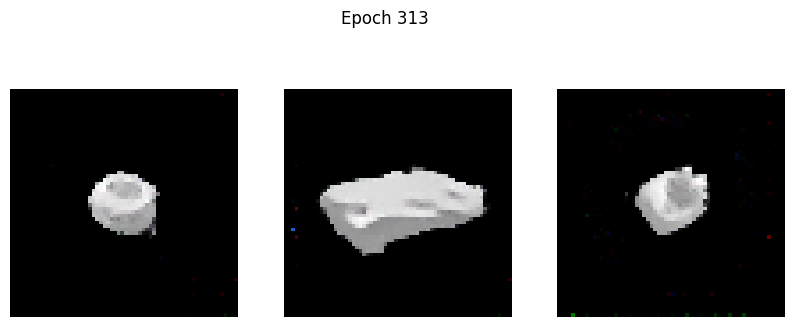

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0653 - g_loss: 4.4060
Epoch 314/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.4046 - g_loss: 4.6615

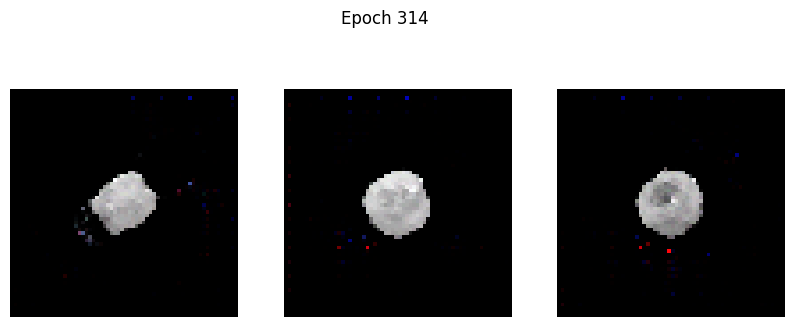

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.4027 - g_loss: 4.6591
Epoch 315/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0489 - g_loss: 4.3639

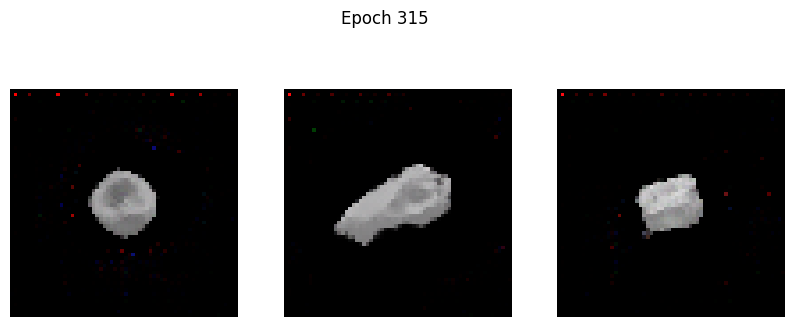

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0490 - g_loss: 4.3641
Epoch 316/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1174 - g_loss: 4.4621

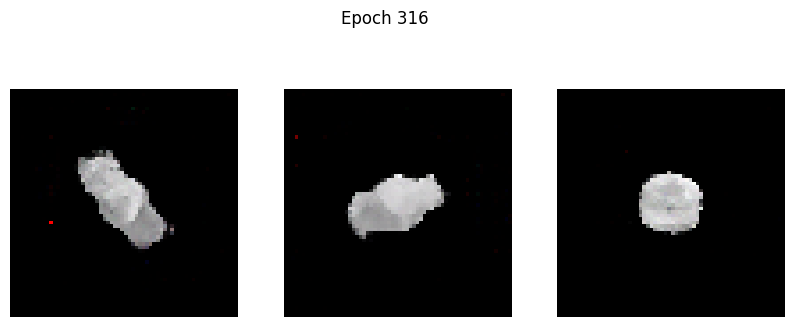

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1170 - g_loss: 4.4620
Epoch 317/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0503 - g_loss: 4.3362

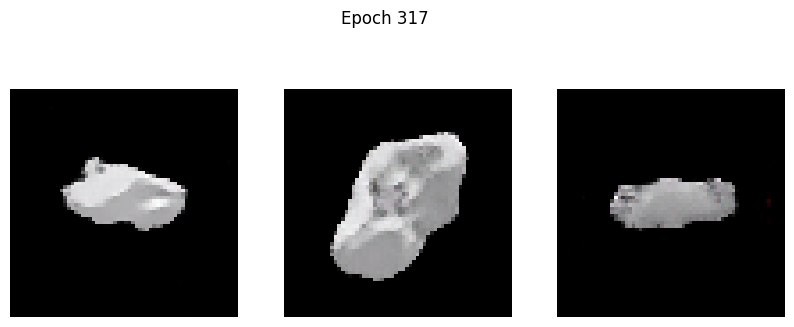

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: 0.0504 - g_loss: 4.3365
Epoch 318/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0265 - g_loss: 4.2459

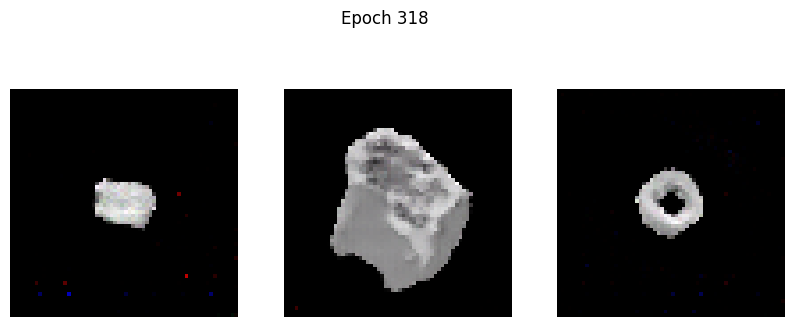

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0266 - g_loss: 4.2464
Epoch 319/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.0588 - g_loss: 4.4131

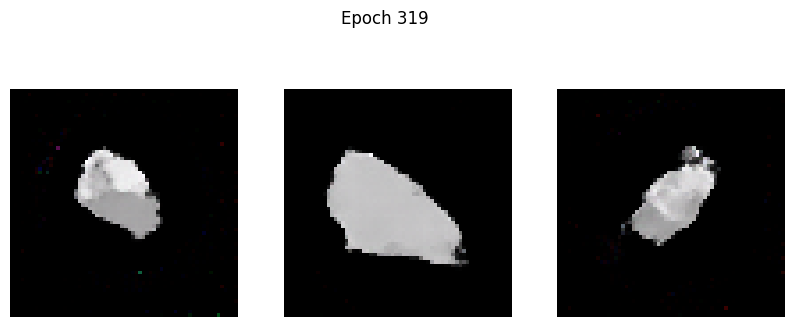

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0587 - g_loss: 4.4131
Epoch 320/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0361 - g_loss: 4.4034

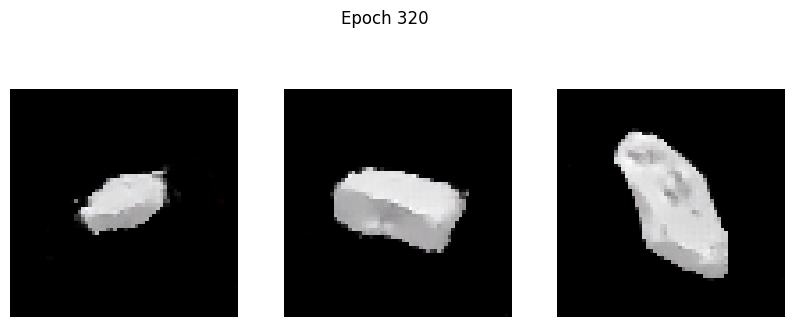

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: 0.0364 - g_loss: 4.4038
Epoch 321/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1092 - g_loss: 4.7318

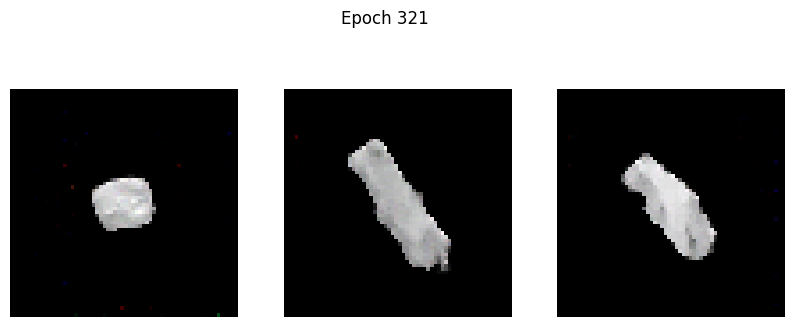

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1088 - g_loss: 4.7304
Epoch 322/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1023 - g_loss: 4.7553

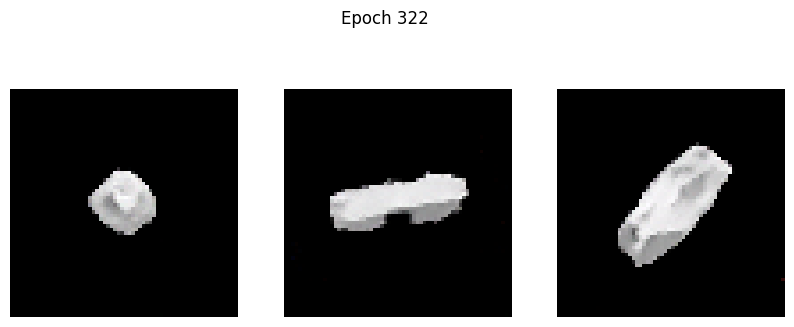

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1027 - g_loss: 4.7551
Epoch 323/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0617 - g_loss: 4.4189

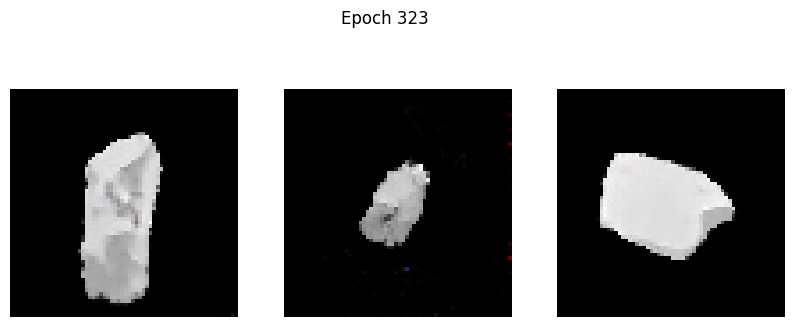

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0616 - g_loss: 4.4181
Epoch 324/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0187 - g_loss: 4.4120

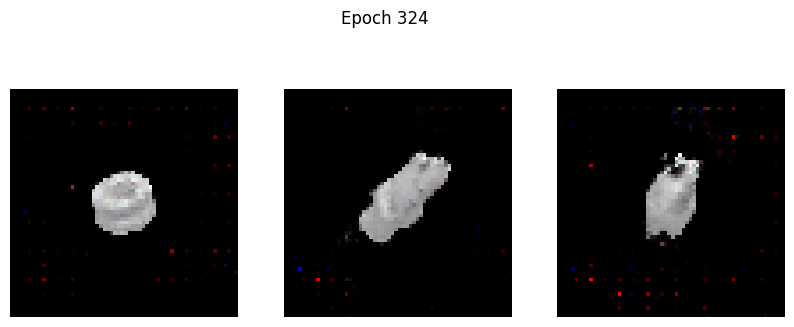

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0188 - g_loss: 4.4120
Epoch 325/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0550 - g_loss: 4.4968

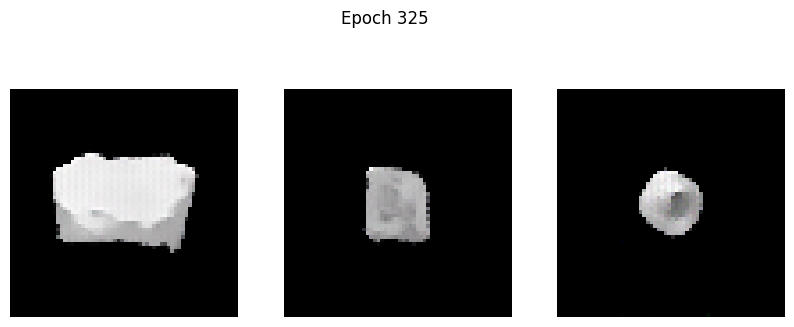

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0550 - g_loss: 4.4974
Epoch 326/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0369 - g_loss: 4.5206

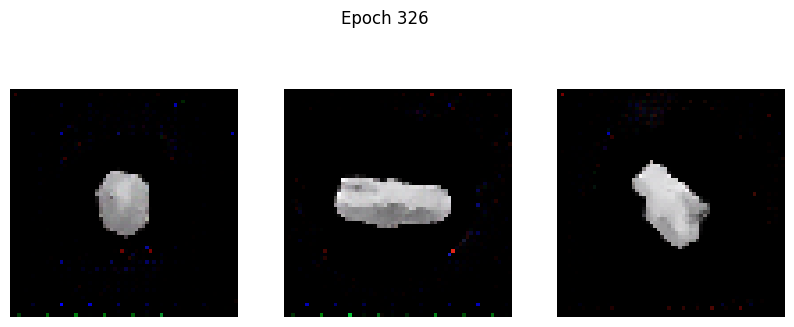

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0369 - g_loss: 4.5203
Epoch 327/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1935 - g_loss: 5.1038

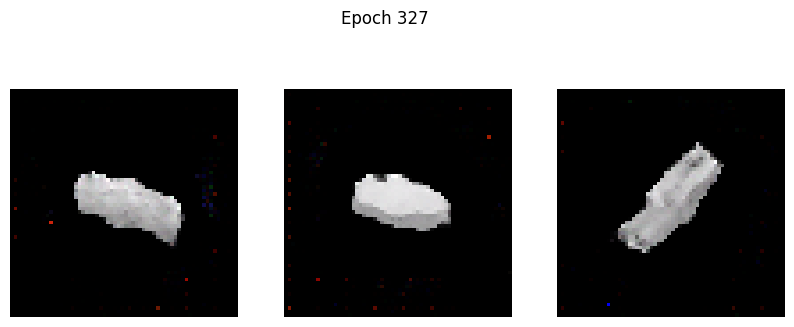

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1927 - g_loss: 5.1009
Epoch 328/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1133 - g_loss: 4.5998

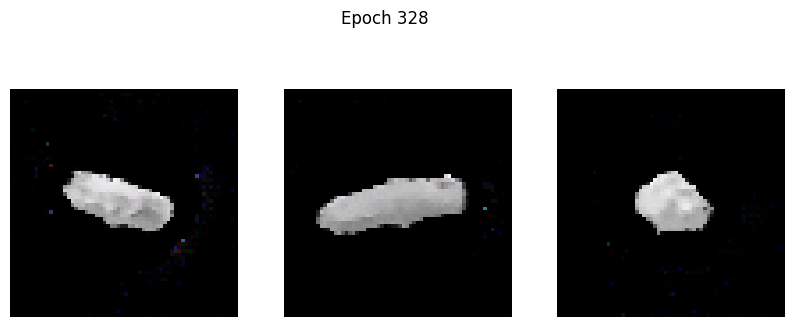

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1128 - g_loss: 4.5987
Epoch 329/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0855 - g_loss: 4.5461

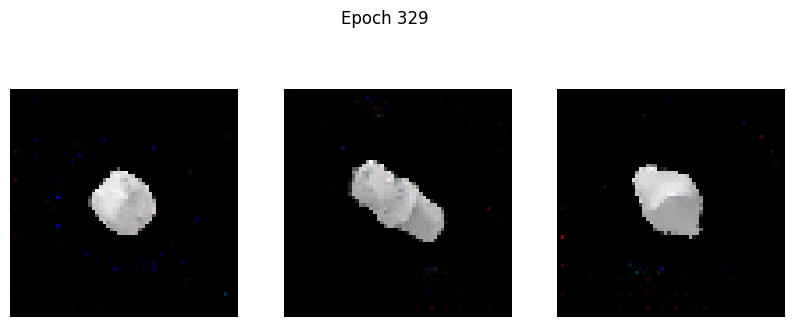

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0854 - g_loss: 4.5466
Epoch 330/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0596 - g_loss: 4.6836

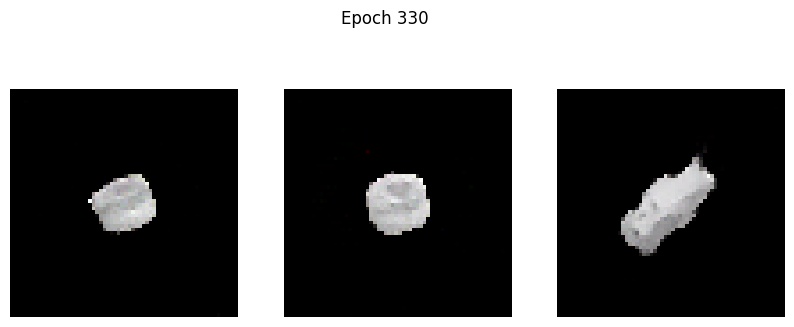

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0597 - g_loss: 4.6829
Epoch 331/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1786 - g_loss: 4.8339

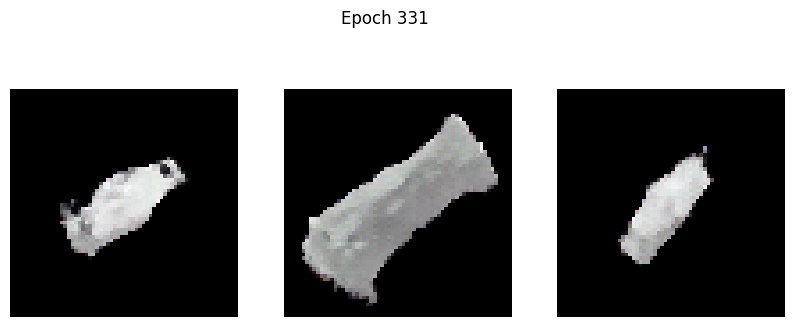

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1801 - g_loss: 4.8384
Epoch 332/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0622 - g_loss: 4.5539

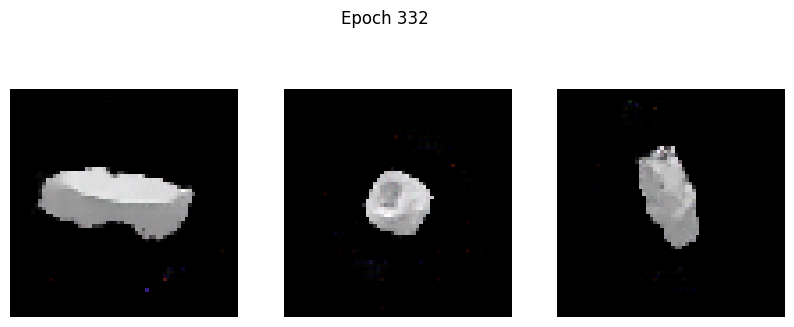

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0620 - g_loss: 4.5529
Epoch 333/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0165 - g_loss: 4.2421

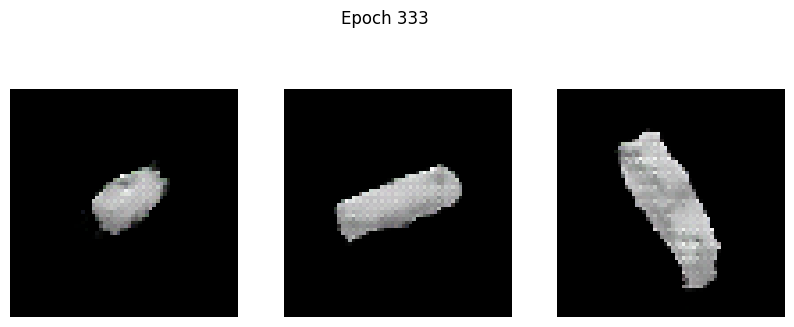

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0170 - g_loss: 4.2472
Epoch 334/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1564 - g_loss: 5.1043

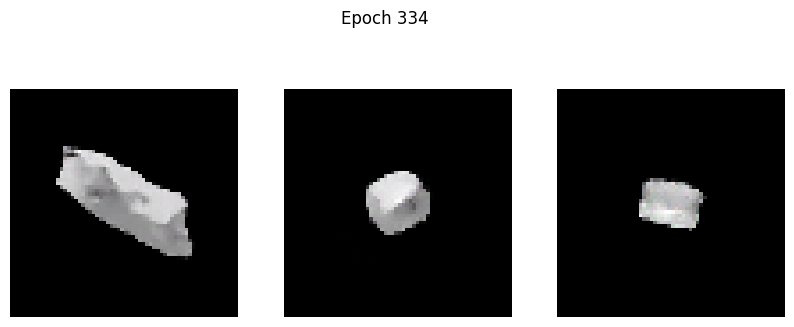

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1556 - g_loss: 5.1007
Epoch 335/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0130 - g_loss: 4.3635

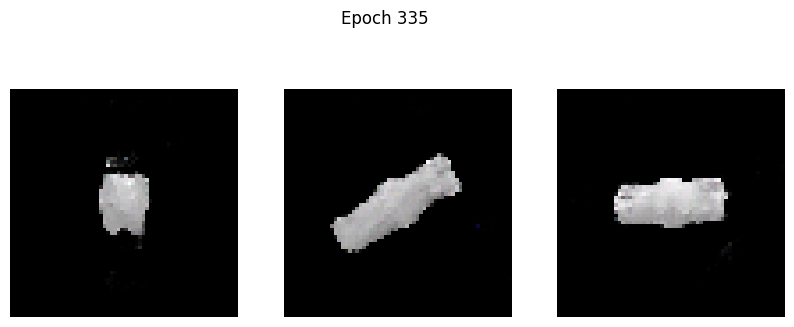

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0130 - g_loss: 4.3633
Epoch 336/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0479 - g_loss: 4.7779

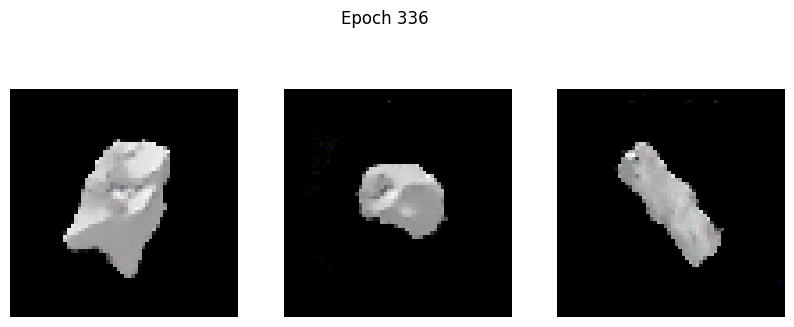

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0477 - g_loss: 4.7762
Epoch 337/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0581 - g_loss: 4.7813

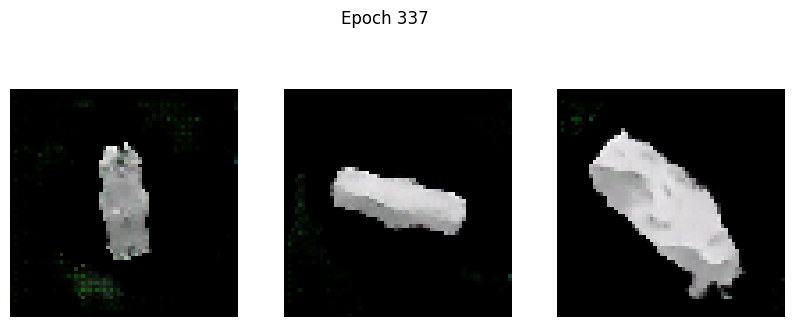

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0587 - g_loss: 4.7830
Epoch 338/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0580 - g_loss: 4.5734

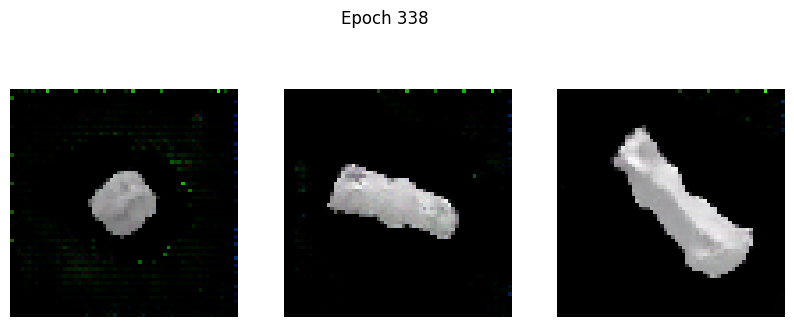

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0582 - g_loss: 4.5745
Epoch 339/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0603 - g_loss: 4.6712

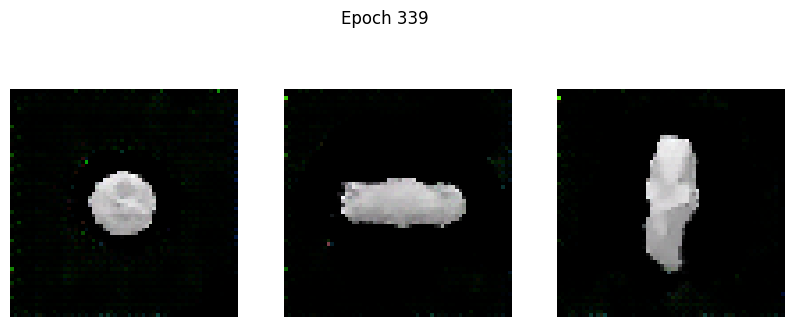

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0605 - g_loss: 4.6713
Epoch 340/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0381 - g_loss: 4.5370

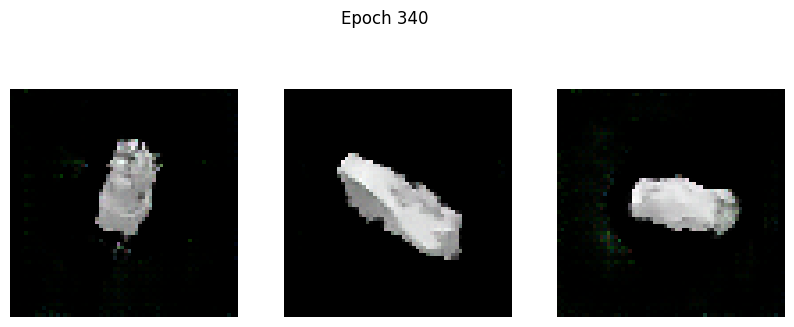

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0392 - g_loss: 4.5393
Epoch 341/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1919 - g_loss: 4.6695

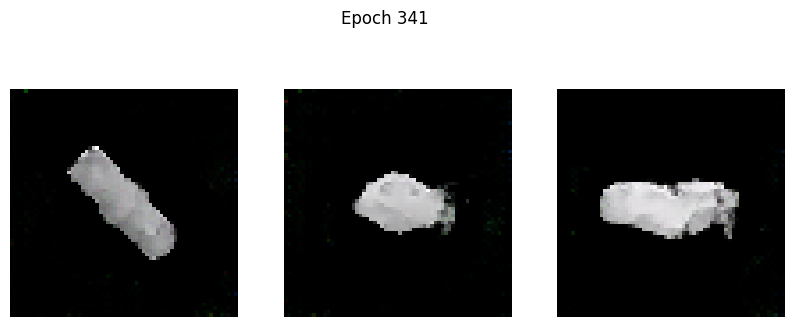

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1908 - g_loss: 4.6680
Epoch 342/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0240 - g_loss: 4.4102

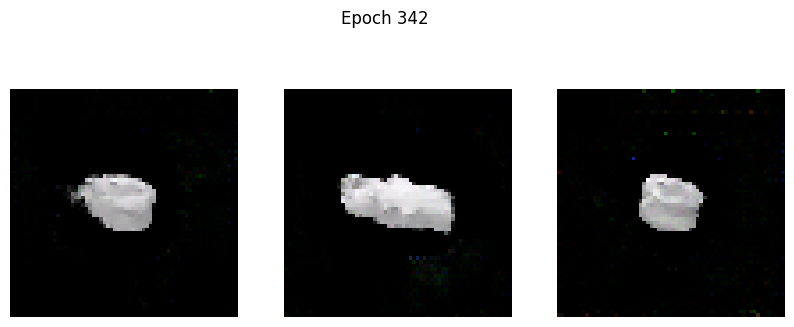

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0241 - g_loss: 4.4113
Epoch 343/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0362 - g_loss: 4.5515

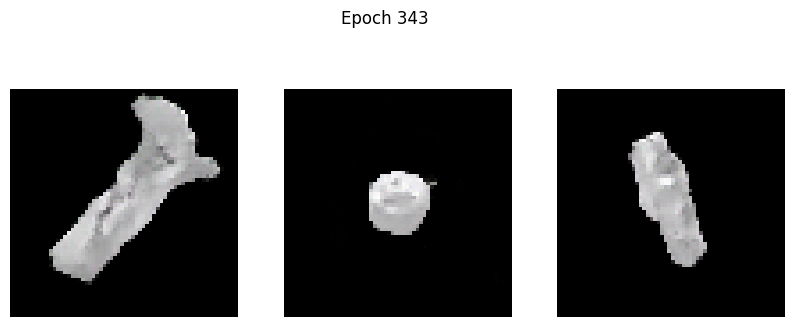

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0362 - g_loss: 4.5517
Epoch 344/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0038 - g_loss: 4.5281

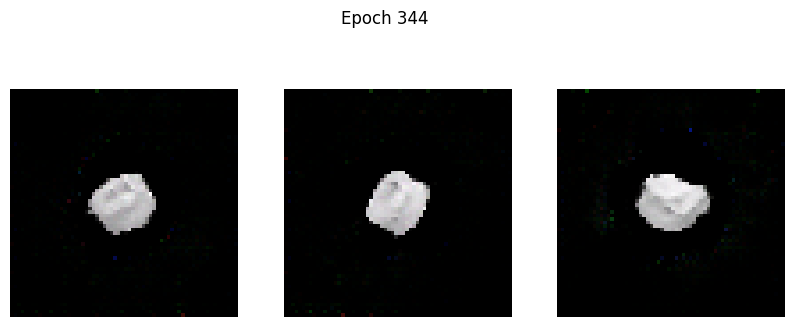

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0039 - g_loss: 4.5279
Epoch 345/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0532 - g_loss: 4.7594

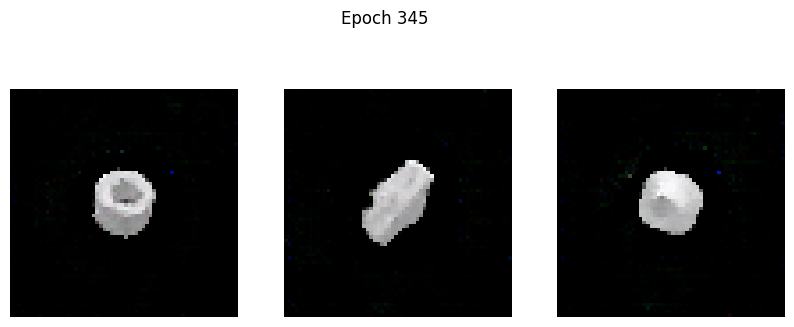

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0531 - g_loss: 4.7587
Epoch 346/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.2607 - g_loss: 5.4457

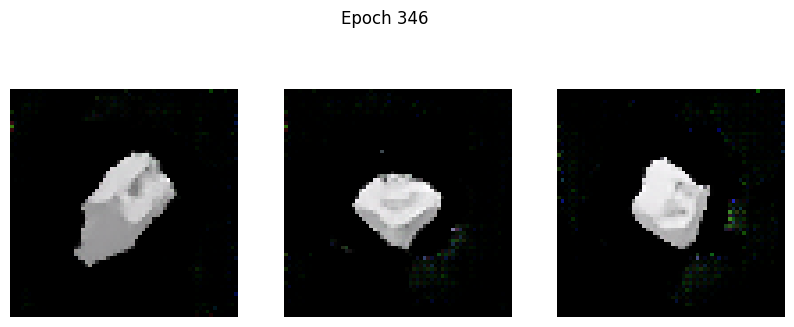

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.2596 - g_loss: 5.4417
Epoch 347/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0120 - g_loss: 4.4206

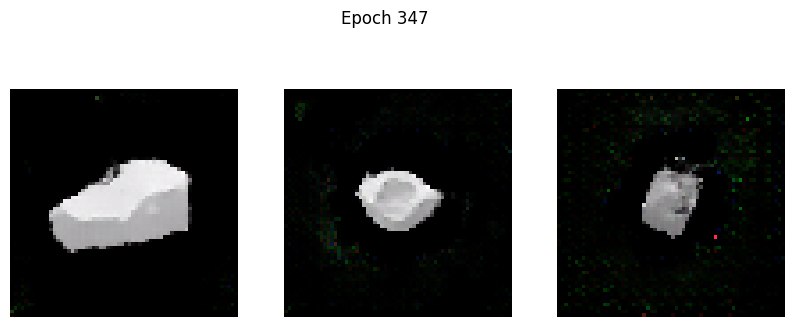

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0121 - g_loss: 4.4215
Epoch 348/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0642 - g_loss: 4.8798

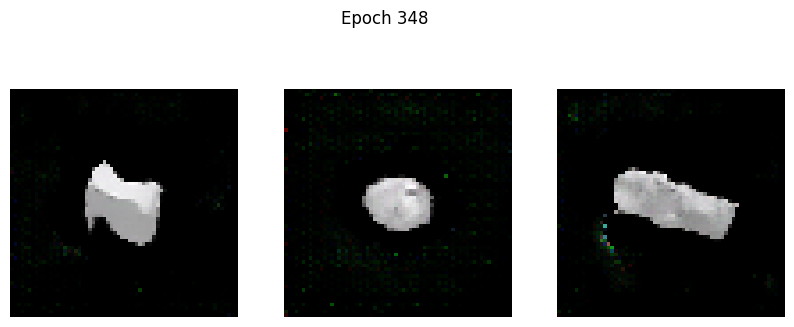

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0639 - g_loss: 4.8781
Epoch 349/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0590 - g_loss: 4.7643

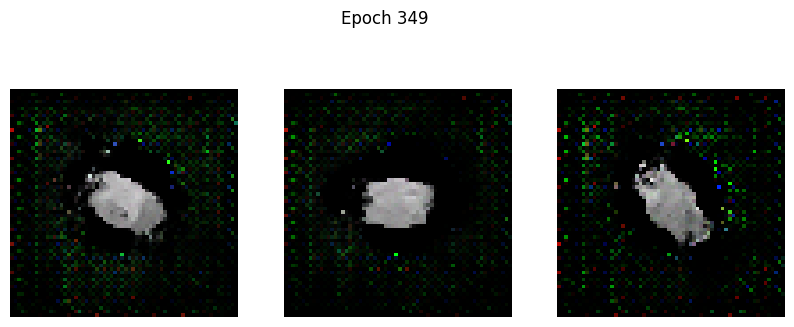

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0591 - g_loss: 4.7637
Epoch 350/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0444 - g_loss: 4.7299

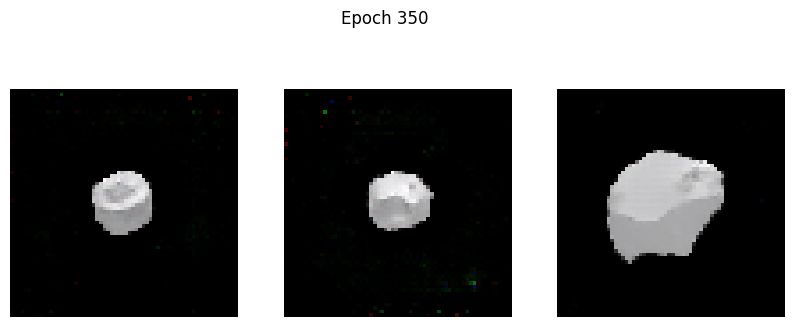

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0442 - g_loss: 4.7292
Epoch 351/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0334 - g_loss: 4.8205

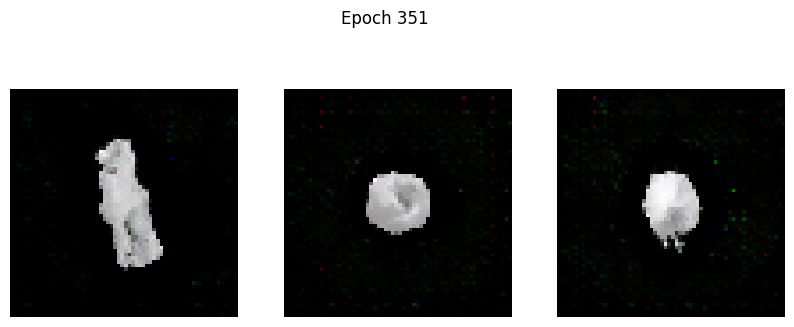

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0333 - g_loss: 4.8196
Epoch 352/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1027 - g_loss: 4.7399

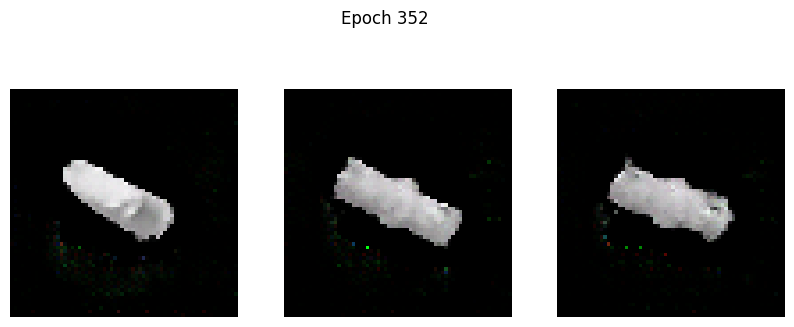

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.1030 - g_loss: 4.7411
Epoch 353/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0281 - g_loss: 4.7330

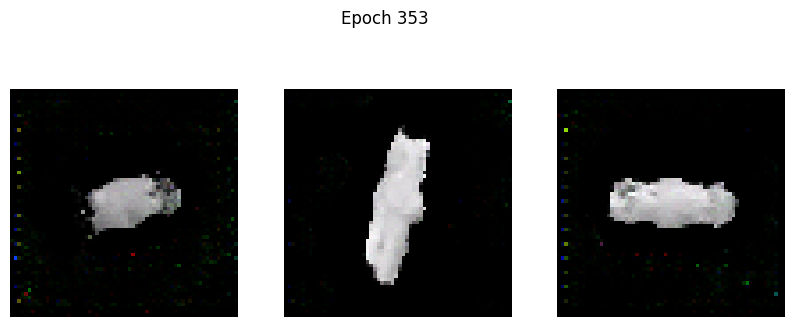

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0282 - g_loss: 4.7337
Epoch 354/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0116 - g_loss: 4.6488

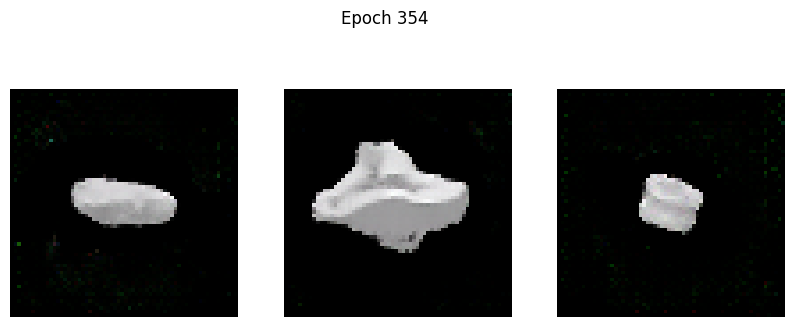

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0117 - g_loss: 4.6491
Epoch 355/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0119 - g_loss: 4.9144

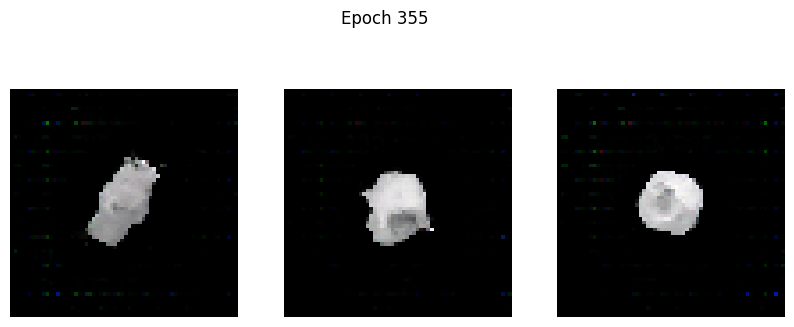

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0122 - g_loss: 4.9146
Epoch 356/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0508 - g_loss: 4.7975

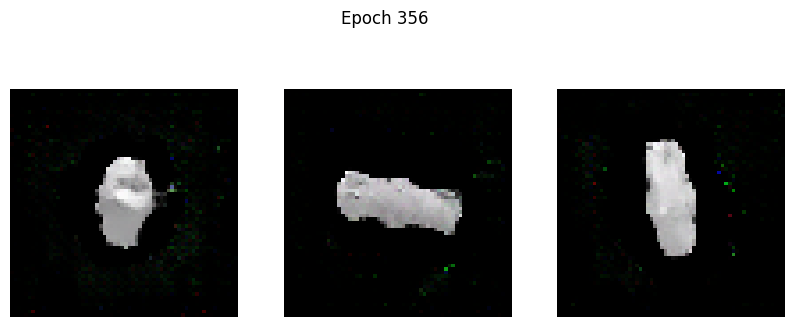

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0508 - g_loss: 4.7978
Epoch 357/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0380 - g_loss: 4.8457

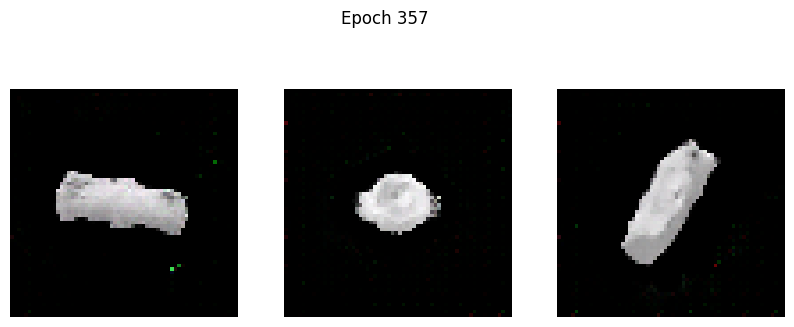

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0379 - g_loss: 4.8451
Epoch 358/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0229 - g_loss: 4.7593

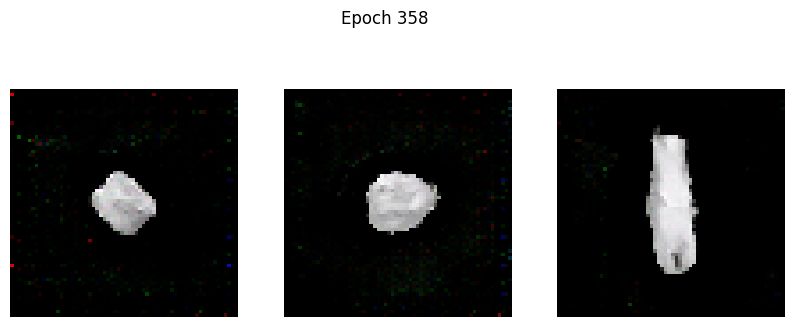

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0230 - g_loss: 4.7600
Epoch 359/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0386 - g_loss: 4.9011

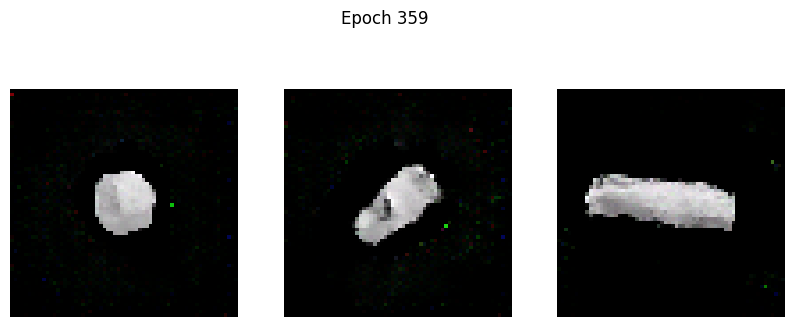

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0386 - g_loss: 4.9004
Epoch 360/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1082 - g_loss: 5.0978

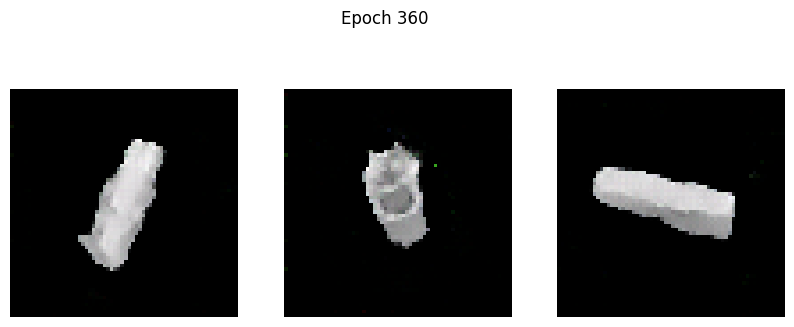

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1082 - g_loss: 5.0994
Epoch 361/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1943 - g_loss: 5.0735

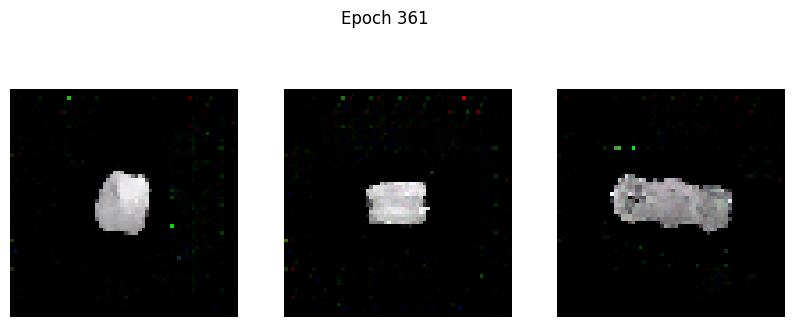

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1933 - g_loss: 5.0707
Epoch 362/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0082 - g_loss: 4.6605

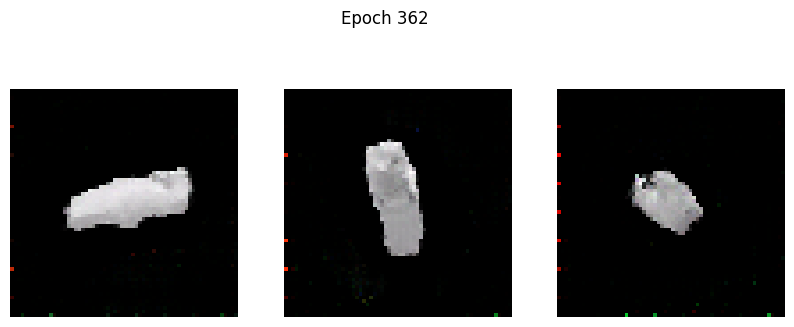

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0083 - g_loss: 4.6616
Epoch 363/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0377 - g_loss: 4.8088

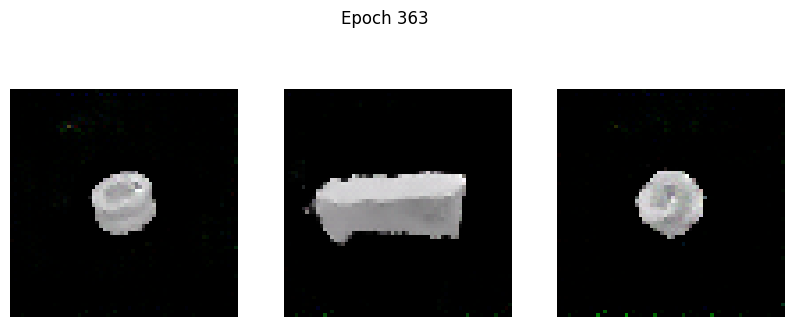

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0377 - g_loss: 4.8088
Epoch 364/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0157 - g_loss: 4.8532

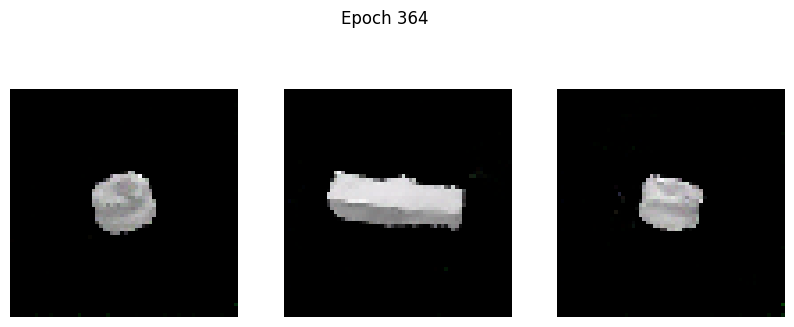

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0157 - g_loss: 4.8534
Epoch 365/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0314 - g_loss: 4.8933

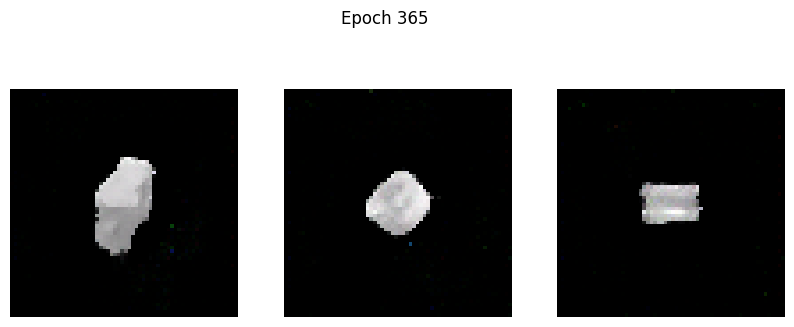

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0310 - g_loss: 4.8917
Epoch 366/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0015 - g_loss: 4.7684

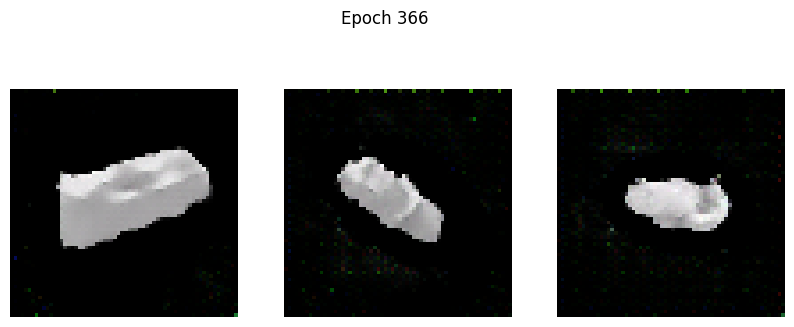

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0013 - g_loss: 4.7689
Epoch 367/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0267 - g_loss: 4.9554

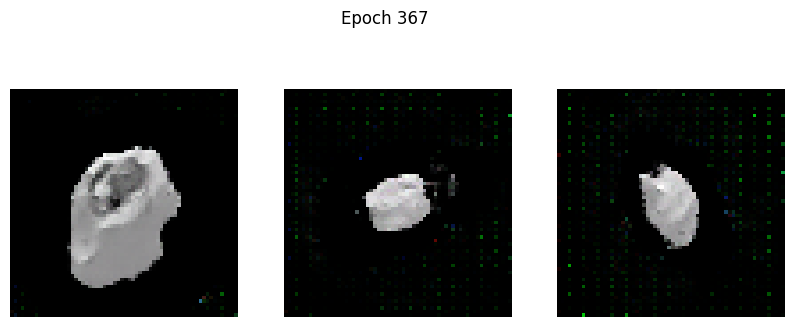

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0268 - g_loss: 4.9554
Epoch 368/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0617 - g_loss: 5.3147

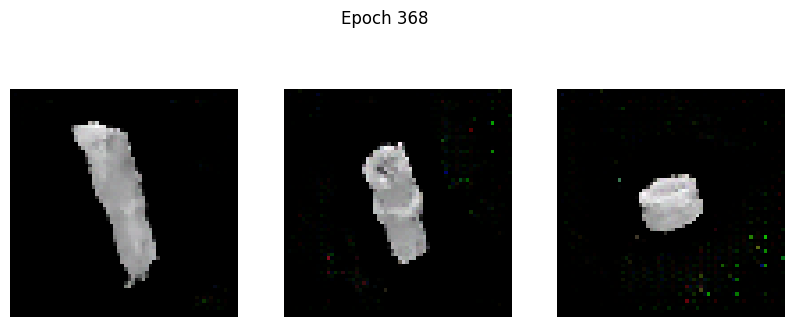

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0614 - g_loss: 5.3112
Epoch 369/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0342 - g_loss: 4.9342

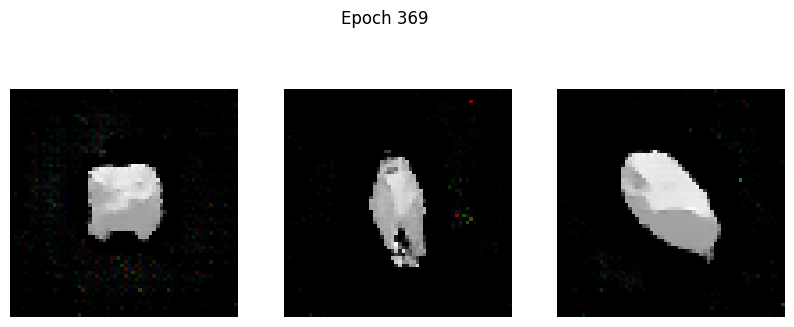

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0343 - g_loss: 4.9352
Epoch 370/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0387 - g_loss: 4.9596

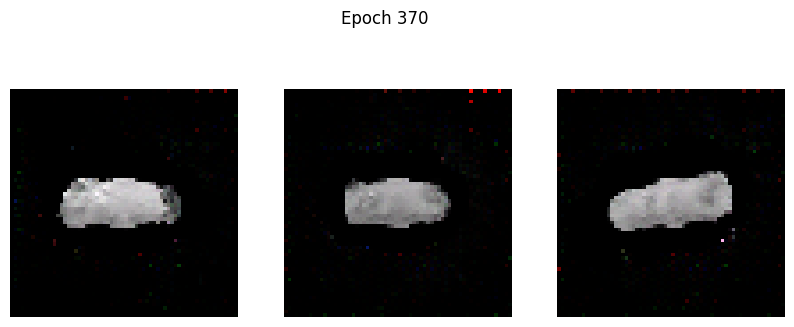

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0388 - g_loss: 4.9600
Epoch 371/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0057 - g_loss: 4.8706

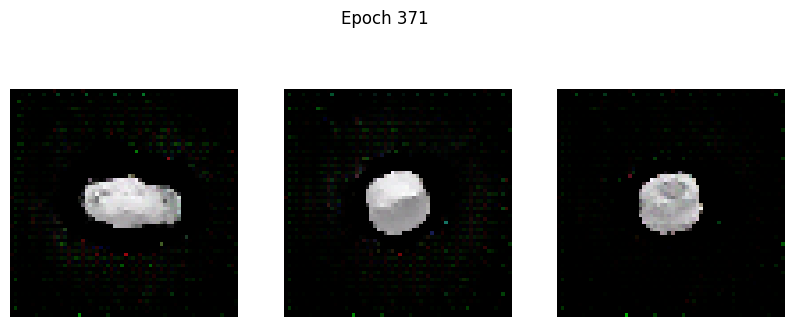

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0060 - g_loss: 4.8717
Epoch 372/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -7.4732e-05 - g_loss: 4.8346

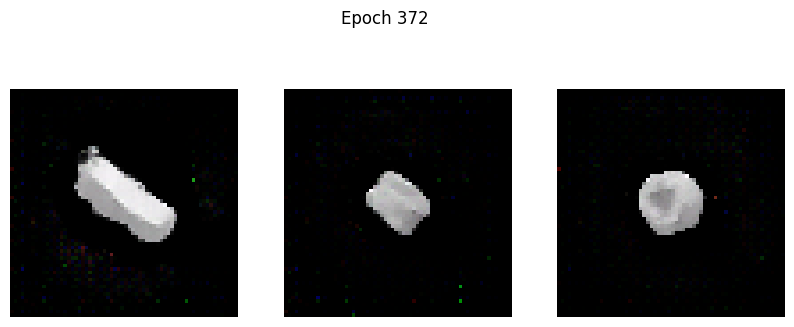

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -4.3843e-05 - g_loss: 4.8357
Epoch 373/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0688 - g_loss: 5.3235

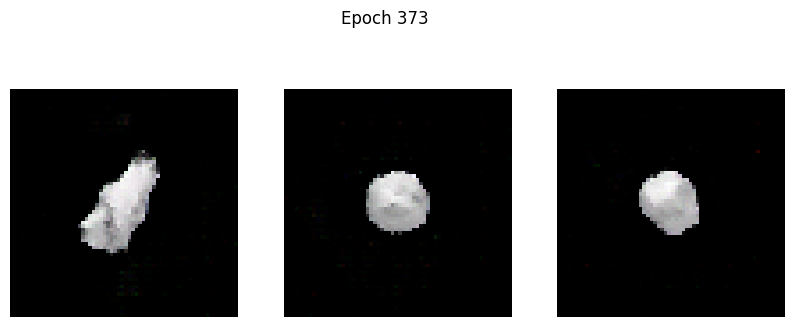

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0690 - g_loss: 5.3236
Epoch 374/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.2381 - g_loss: 5.5693

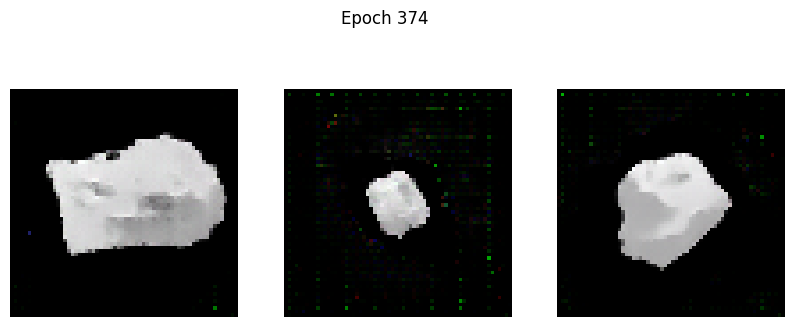

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.2367 - g_loss: 5.5647
Epoch 375/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0215 - g_loss: 5.0359

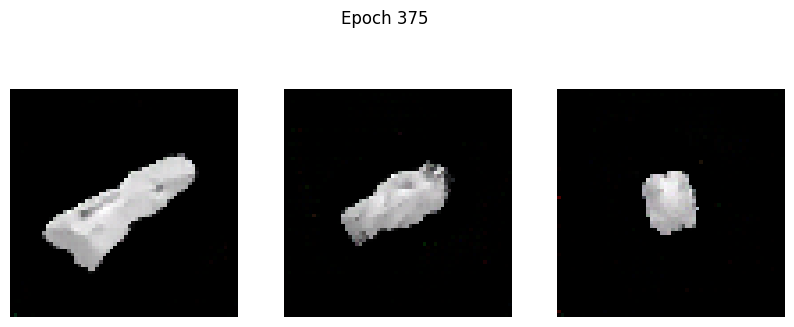

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0215 - g_loss: 5.0351
Epoch 376/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0455 - g_loss: 4.9544

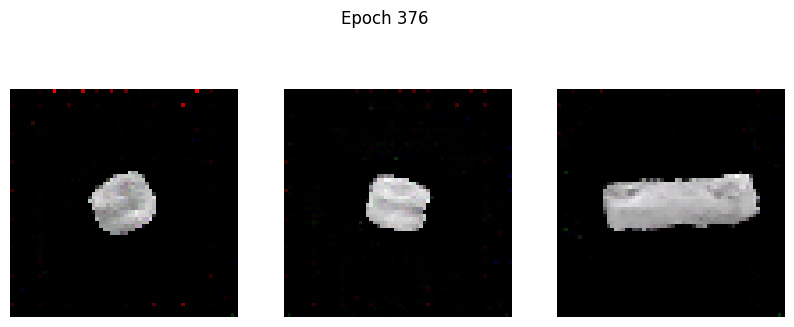

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0451 - g_loss: 4.9540
Epoch 377/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0057 - g_loss: 4.8698

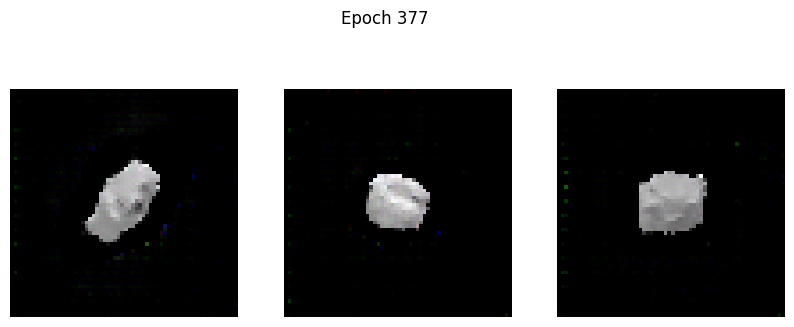

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0061 - g_loss: 4.8734
Epoch 378/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0518 - g_loss: 4.9076

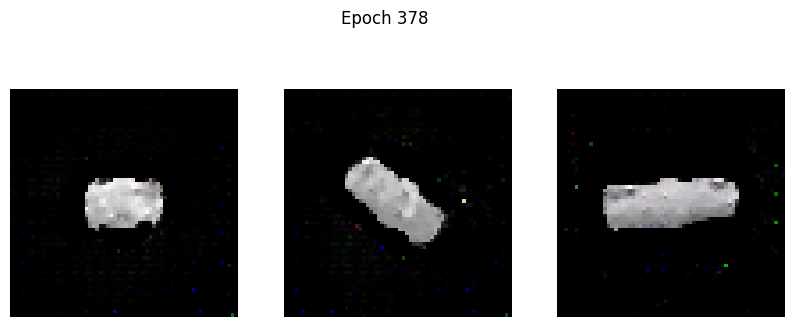

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0515 - g_loss: 4.9078
Epoch 379/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0203 - g_loss: 4.9960

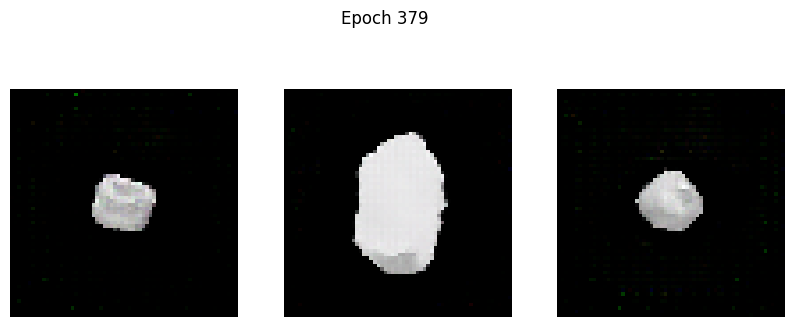

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0202 - g_loss: 4.9962
Epoch 380/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0119 - g_loss: 4.9908

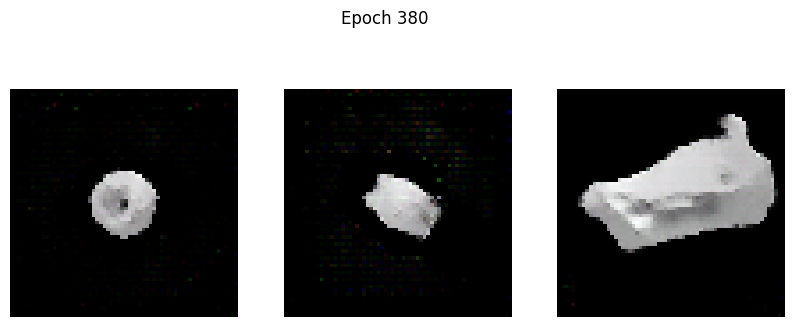

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0115 - g_loss: 4.9921
Epoch 381/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0175 - g_loss: 4.9214

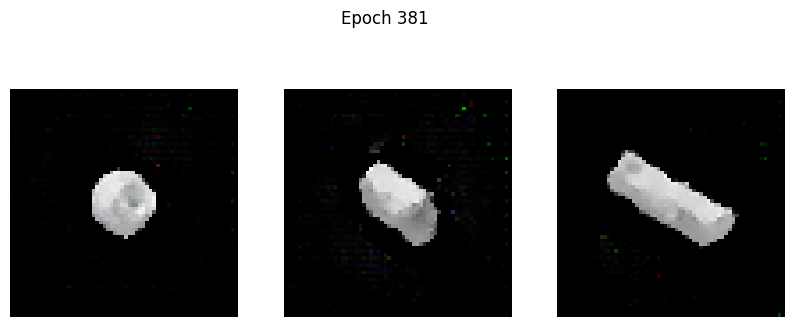

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0174 - g_loss: 4.9219
Epoch 382/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0045 - g_loss: 4.9653

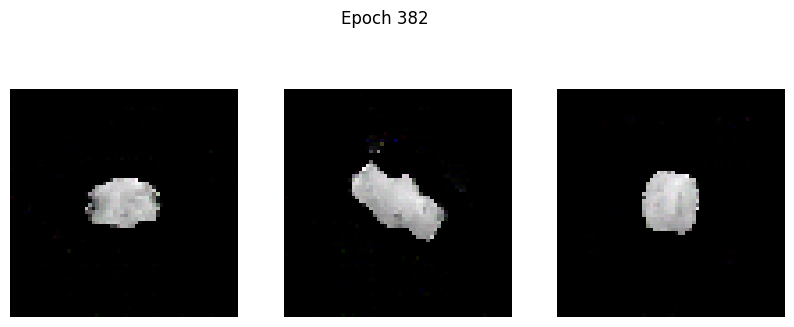

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - d_loss: -0.0043 - g_loss: 4.9656
Epoch 383/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0069 - g_loss: 5.4163

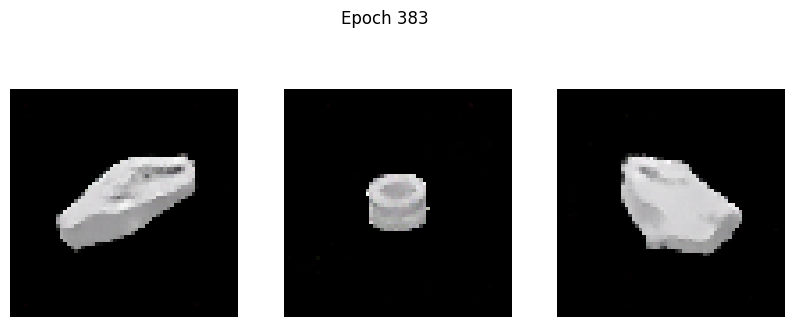

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0069 - g_loss: 5.4152
Epoch 384/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0065 - g_loss: 5.1600

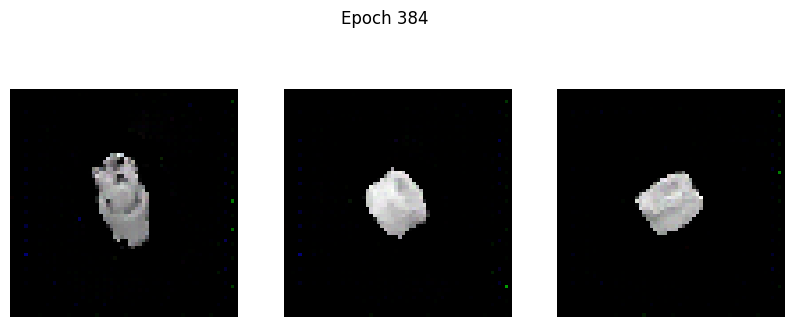

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0063 - g_loss: 5.1601
Epoch 385/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 7.9247e-04 - g_loss: 5.0939

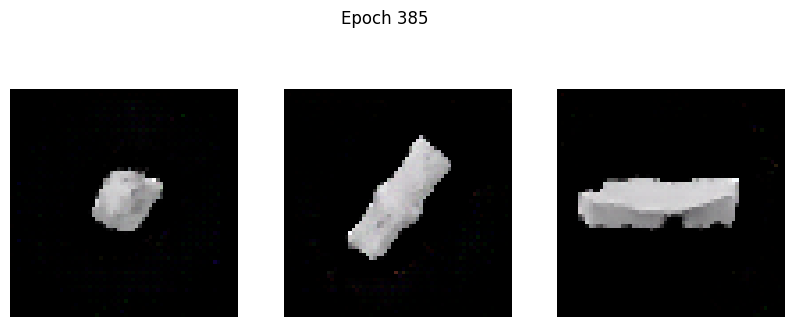

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 9.0263e-04 - g_loss: 5.0949
Epoch 386/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0616 - g_loss: 5.2592

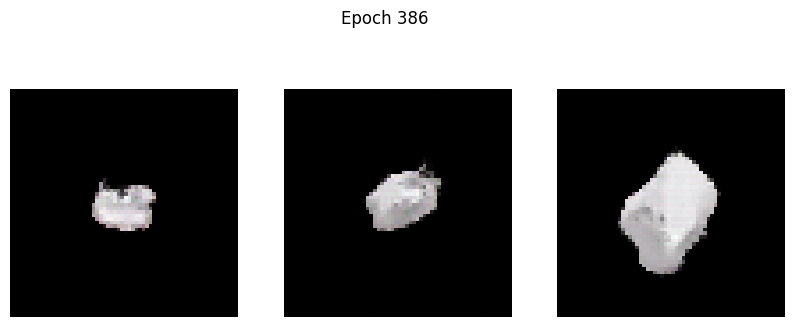

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0645 - g_loss: 5.2678
Epoch 387/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0909 - g_loss: 5.1389

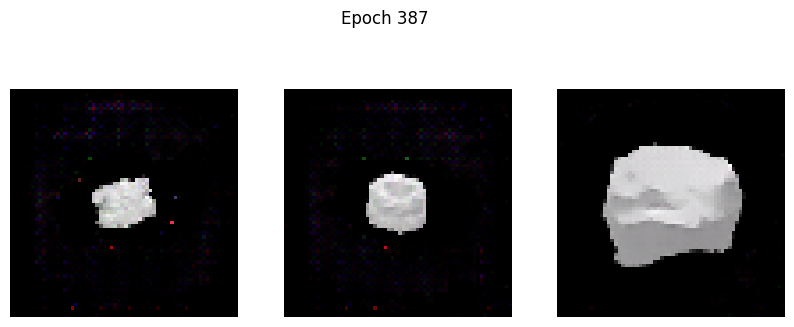

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0903 - g_loss: 5.1367
Epoch 388/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0041 - g_loss: 4.9638

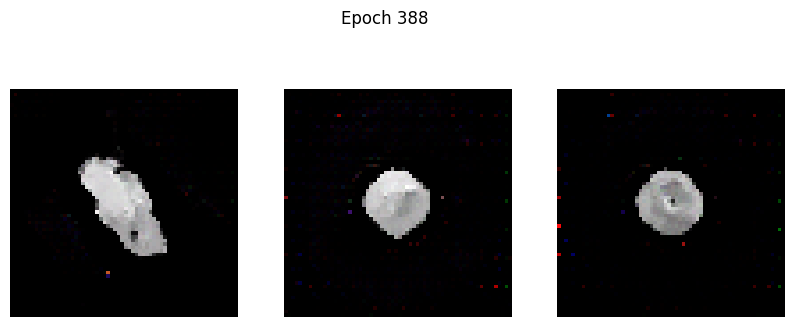

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0041 - g_loss: 4.9648
Epoch 389/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0267 - g_loss: 4.9372

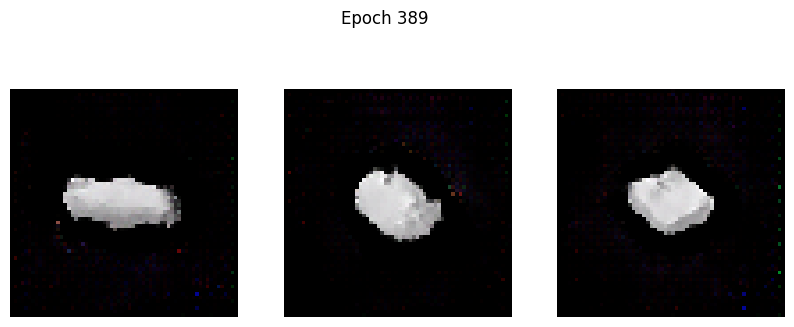

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0266 - g_loss: 4.9385
Epoch 390/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0092 - g_loss: 5.0130

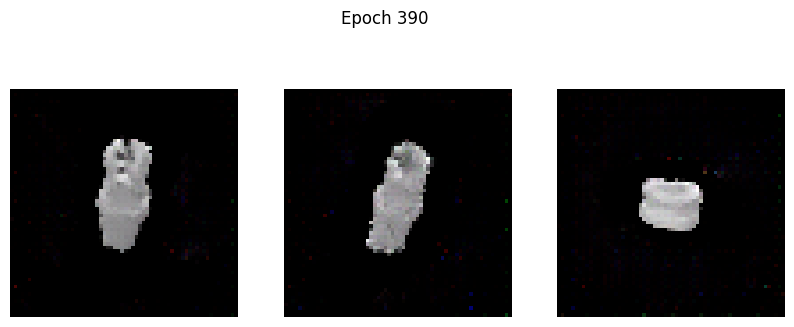

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0090 - g_loss: 5.0142
Epoch 391/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0337 - g_loss: 5.1118

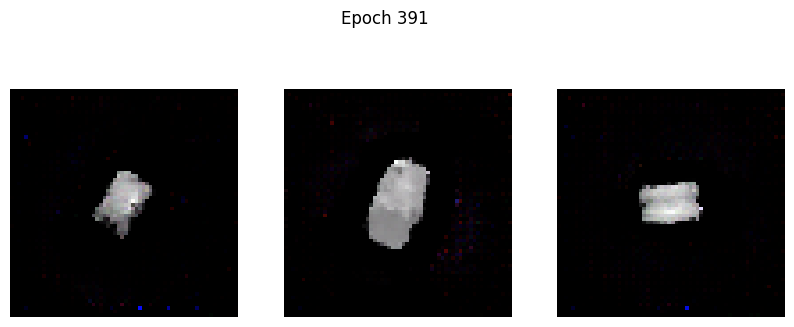

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0334 - g_loss: 5.1140
Epoch 392/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0327 - g_loss: 4.9927

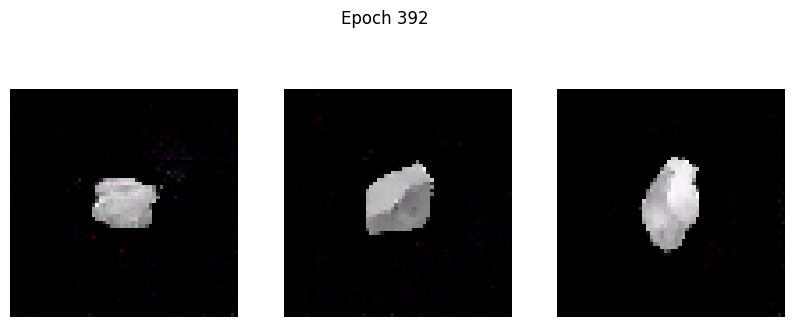

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0325 - g_loss: 4.9943
Epoch 393/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0065 - g_loss: 5.3340

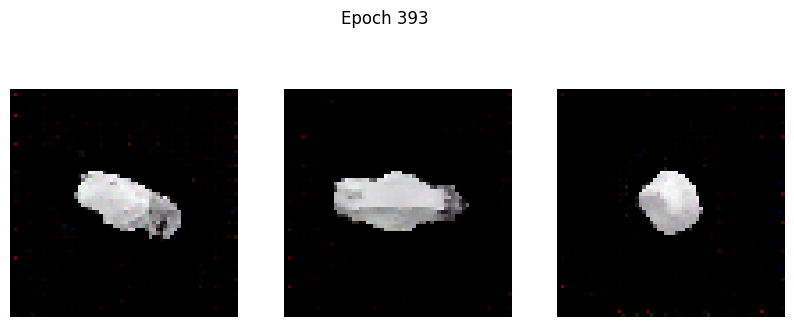

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0065 - g_loss: 5.3328
Epoch 394/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0259 - g_loss: 5.1122

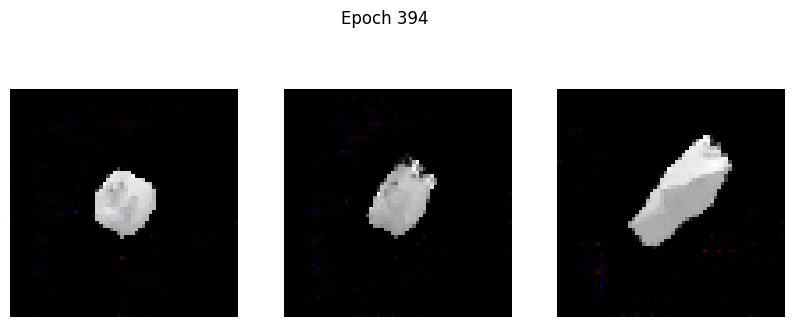

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0256 - g_loss: 5.1131
Epoch 395/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0080 - g_loss: 5.4084

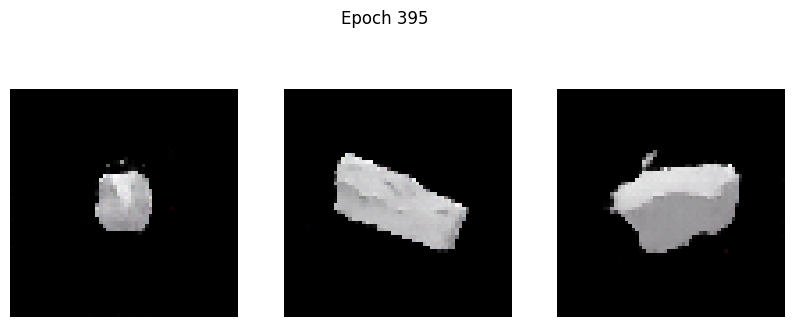

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0088 - g_loss: 5.4117
Epoch 396/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0265 - g_loss: 5.2607

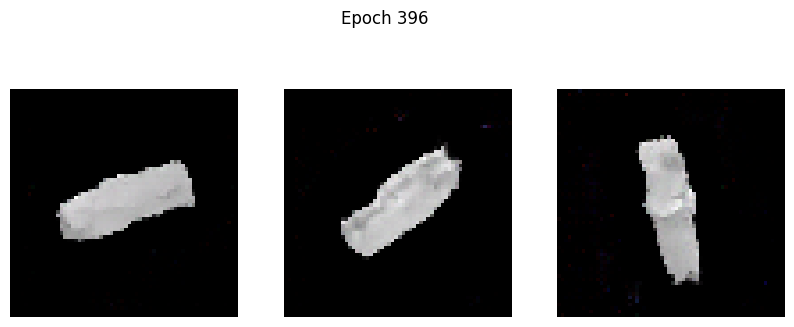

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0260 - g_loss: 5.2623
Epoch 397/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0219 - g_loss: 5.0023

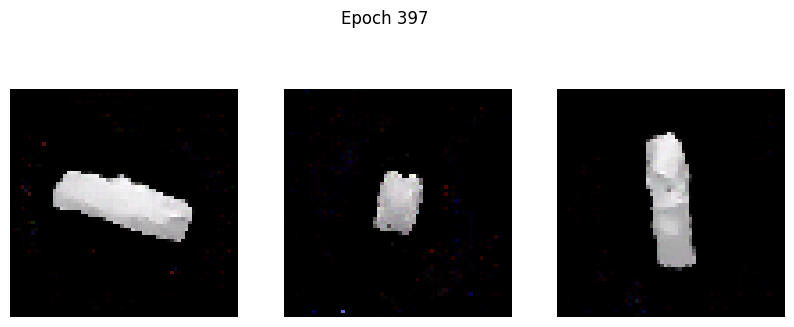

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0218 - g_loss: 5.0024
Epoch 398/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0088 - g_loss: 5.4493

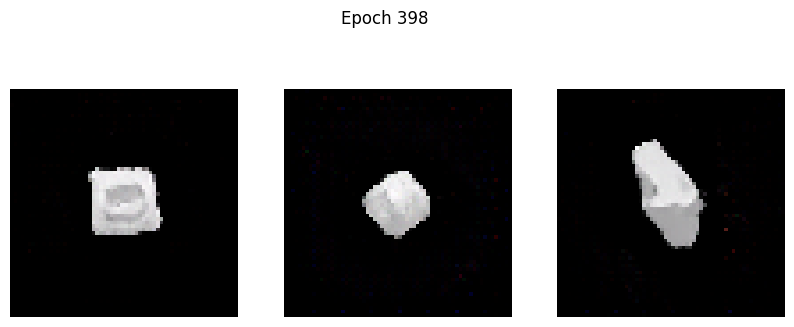

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0089 - g_loss: 5.4476
Epoch 399/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 4.9553e-04 - g_loss: 5.0945

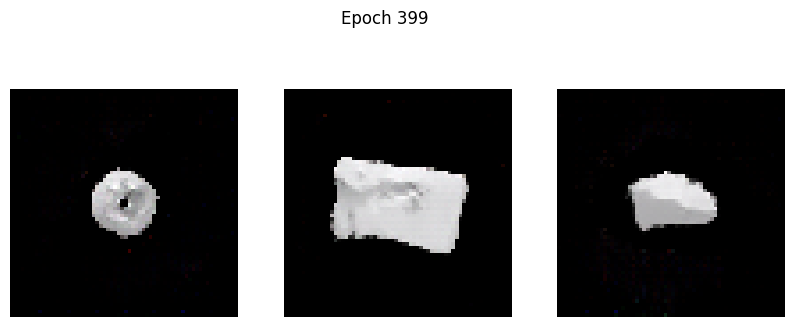

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 5.9950e-04 - g_loss: 5.0970
Epoch 400/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0416 - g_loss: 5.3029

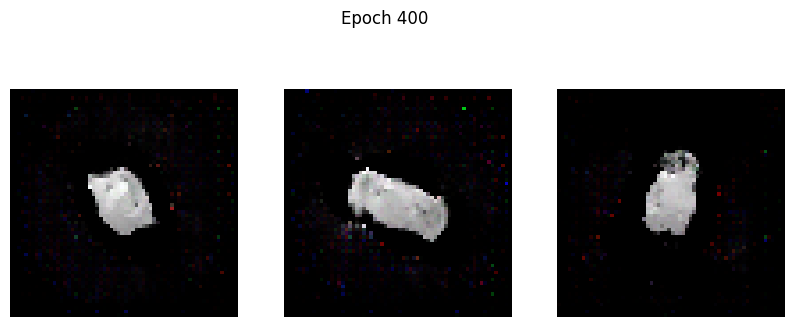

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0412 - g_loss: 5.3049
Epoch 401/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 3.6375e-04 - g_loss: 5.3684

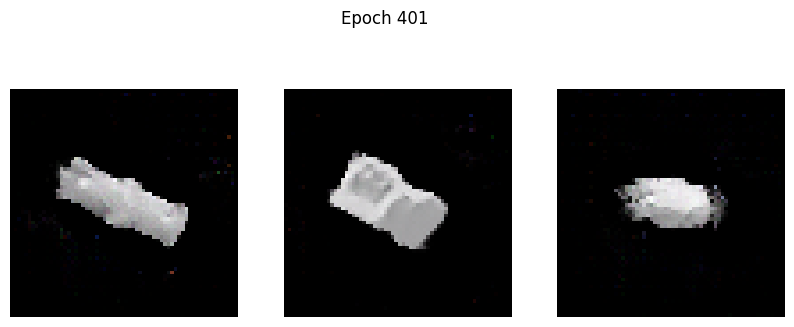

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 2.2059e-04 - g_loss: 5.3680
Epoch 402/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0402 - g_loss: 5.1878

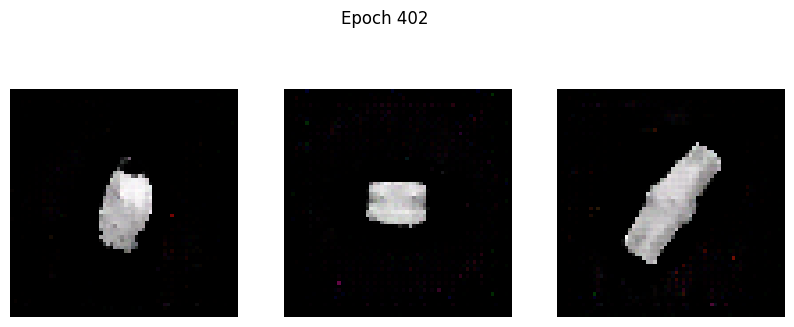

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0402 - g_loss: 5.1875
Epoch 403/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0326 - g_loss: 5.7228

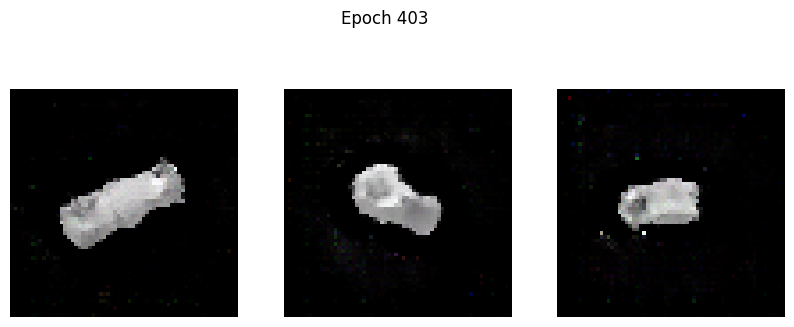

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0328 - g_loss: 5.7211
Epoch 404/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0218 - g_loss: 5.6094

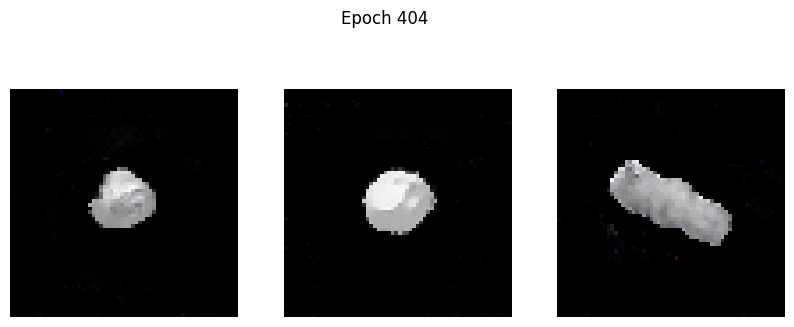

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0214 - g_loss: 5.6077
Epoch 405/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0761 - g_loss: 5.5209

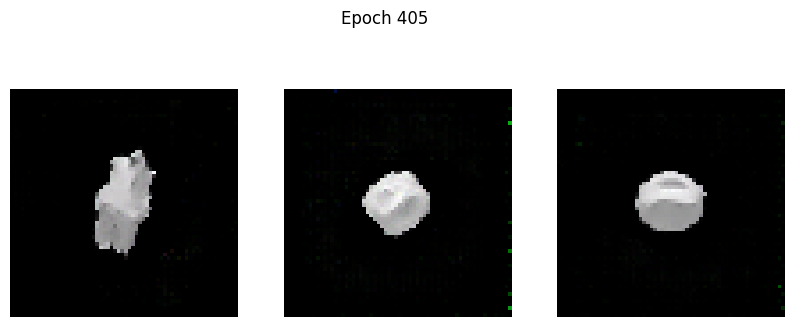

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0756 - g_loss: 5.5197
Epoch 406/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0098 - g_loss: 5.6064

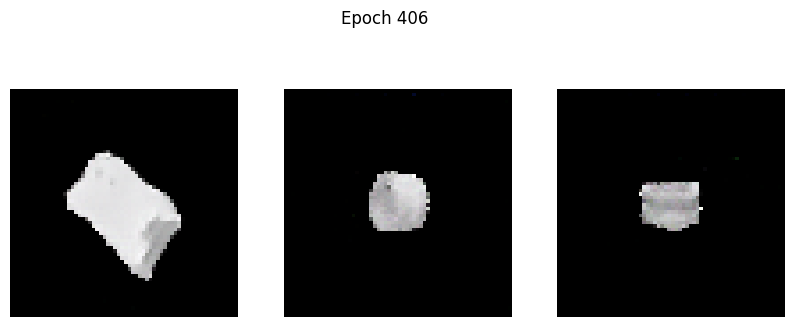

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0096 - g_loss: 5.6059
Epoch 407/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0386 - g_loss: 5.3865

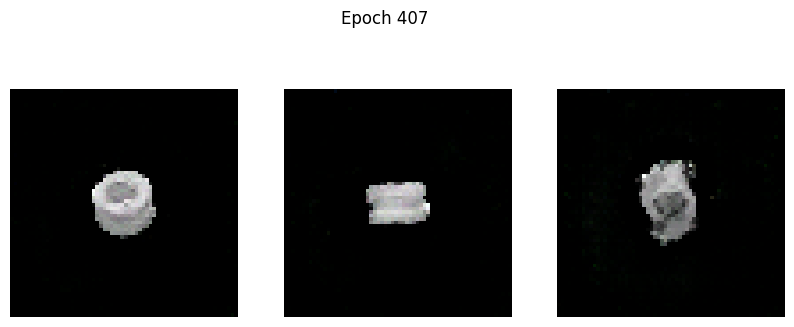

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0382 - g_loss: 5.3886
Epoch 408/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0030 - g_loss: 5.4053

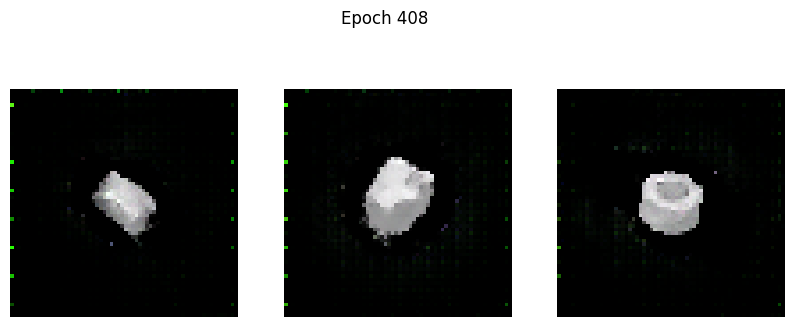

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0038 - g_loss: 5.4077
Epoch 409/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.2127 - g_loss: 5.9292

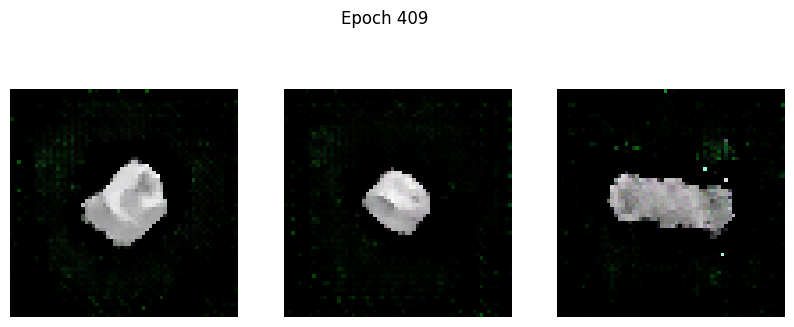

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.2114 - g_loss: 5.9265
Epoch 410/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0358 - g_loss: 5.1354

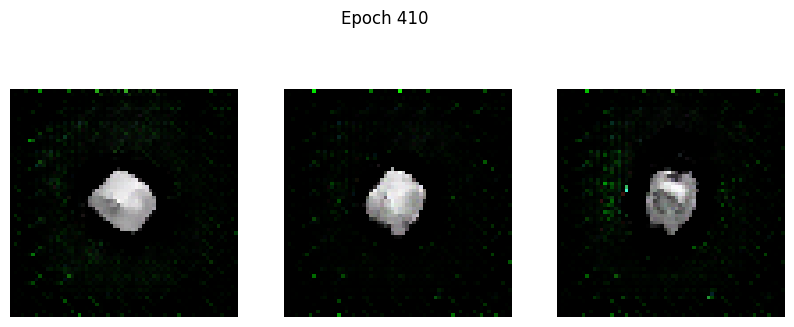

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0358 - g_loss: 5.1355
Epoch 411/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0512 - g_loss: 5.3732

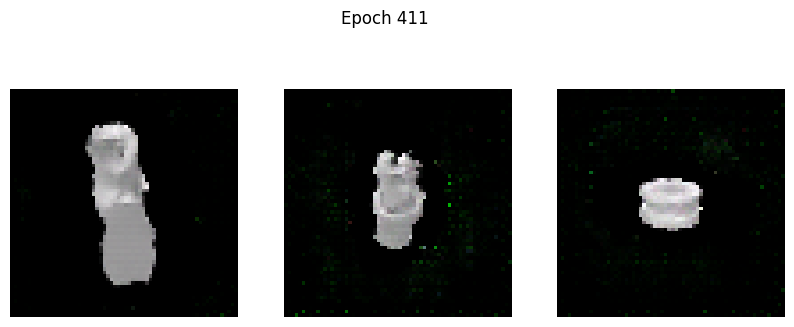

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0511 - g_loss: 5.3740
Epoch 412/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0447 - g_loss: 5.4410

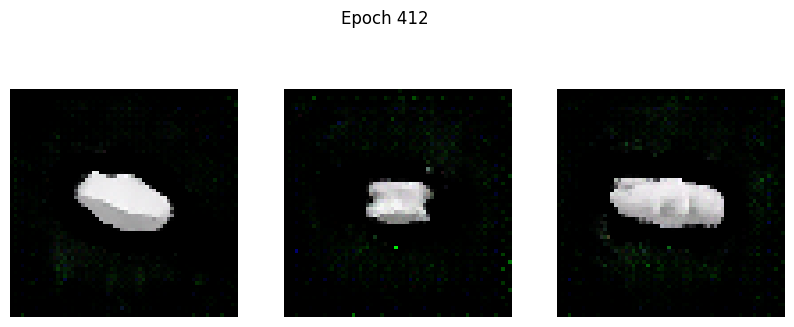

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0444 - g_loss: 5.4428
Epoch 413/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0514 - g_loss: 5.7123

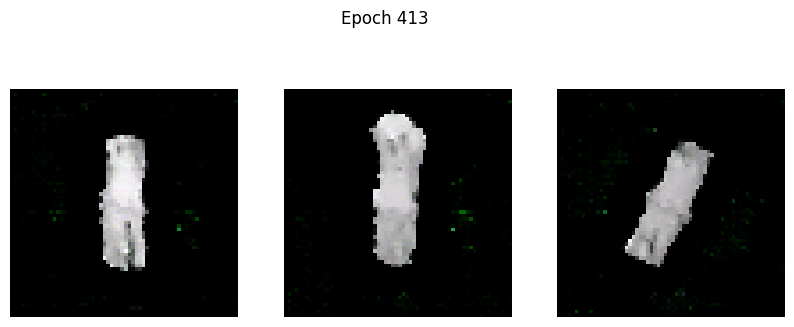

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0511 - g_loss: 5.7122
Epoch 414/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0167 - g_loss: 5.8223

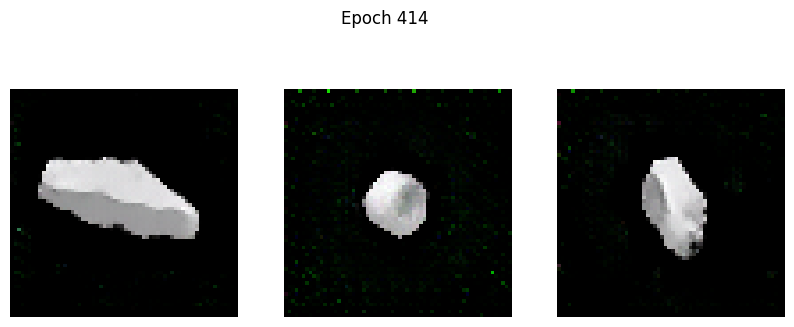

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0166 - g_loss: 5.8208
Epoch 415/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0208 - g_loss: 5.4974

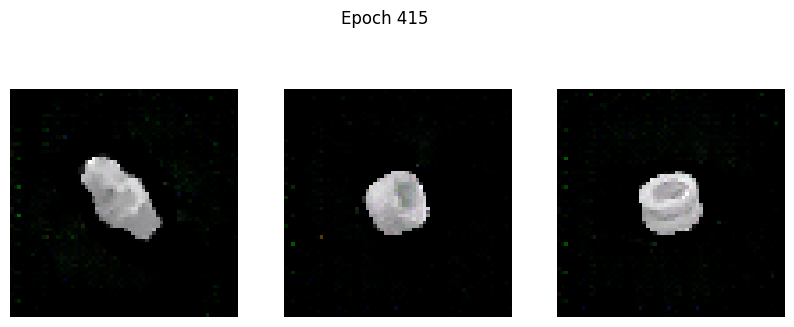

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0207 - g_loss: 5.4989
Epoch 416/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0266 - g_loss: 5.8830

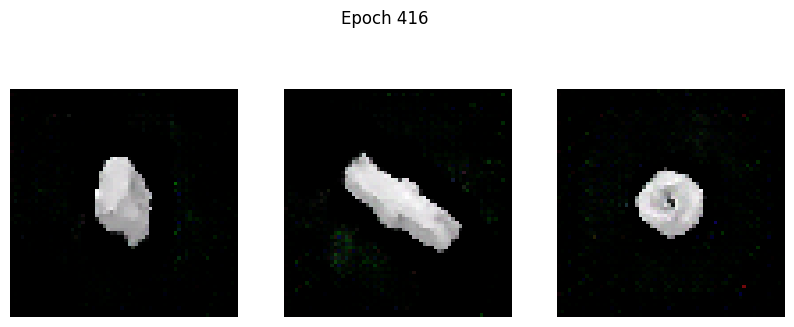

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0261 - g_loss: 5.8797
Epoch 417/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0038 - g_loss: 5.6979

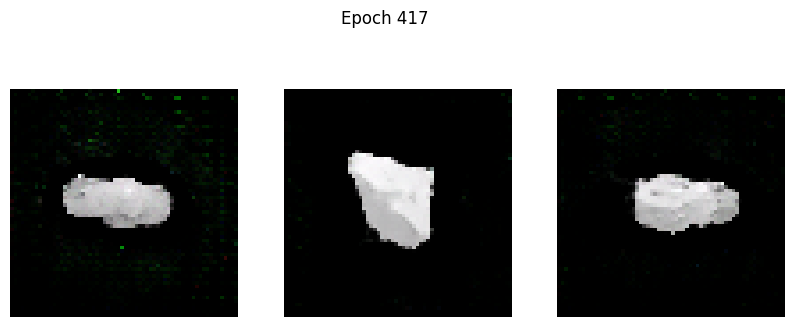

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0038 - g_loss: 5.6969
Epoch 418/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0196 - g_loss: 5.7115

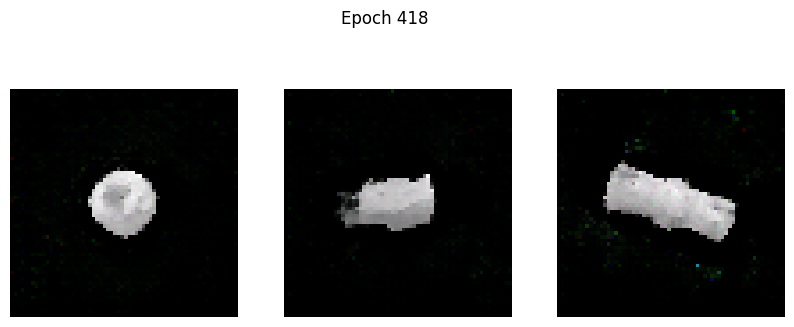

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0196 - g_loss: 5.7106
Epoch 419/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0825 - g_loss: 5.9808

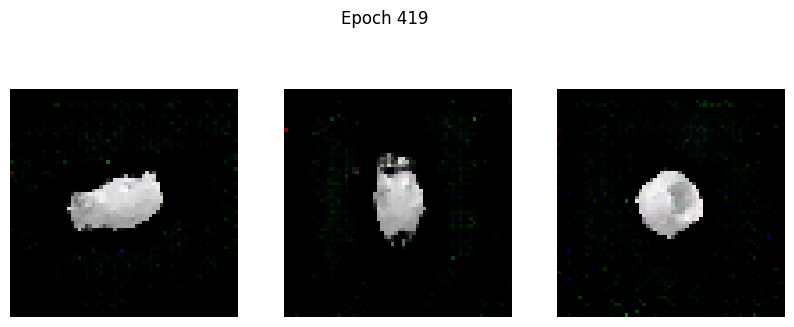

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0822 - g_loss: 5.9792
Epoch 420/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0205 - g_loss: 5.6240

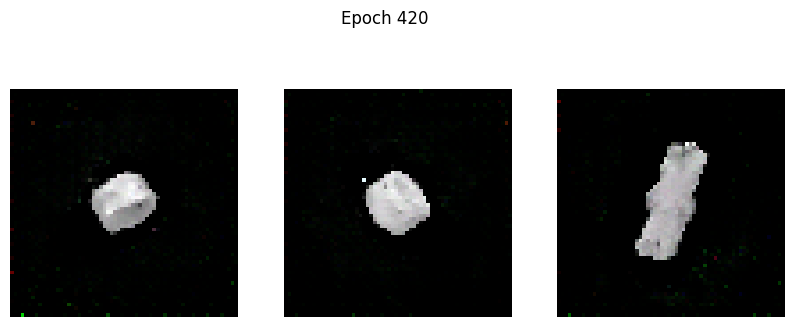

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0209 - g_loss: 5.6222
Epoch 421/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0534 - g_loss: 5.5608

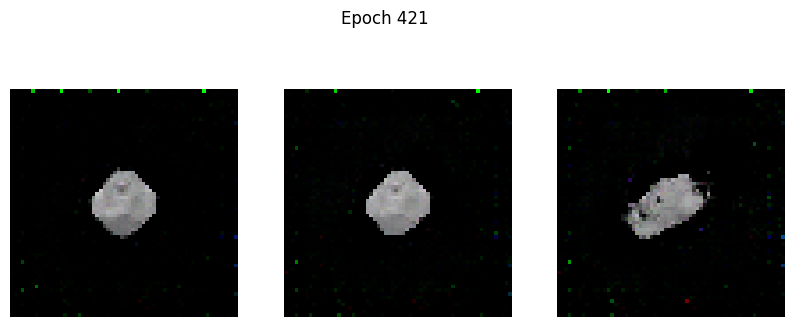

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0534 - g_loss: 5.5613
Epoch 422/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0075 - g_loss: 5.7362

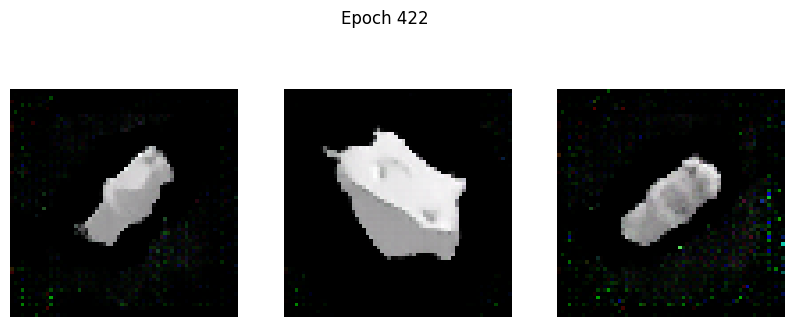

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0076 - g_loss: 5.7359
Epoch 423/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -6.5311e-04 - g_loss: 5.8600

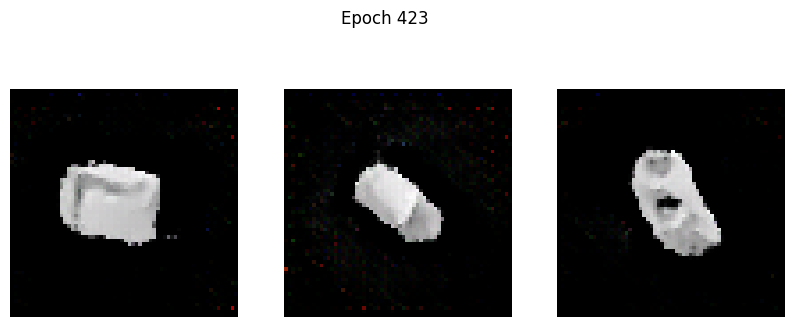

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -3.4707e-04 - g_loss: 5.8605
Epoch 424/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0295 - g_loss: 5.6799

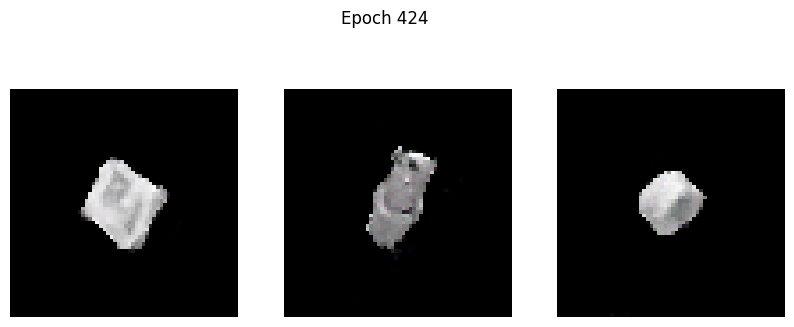

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0288 - g_loss: 5.6838
Epoch 425/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0682 - g_loss: 5.2098

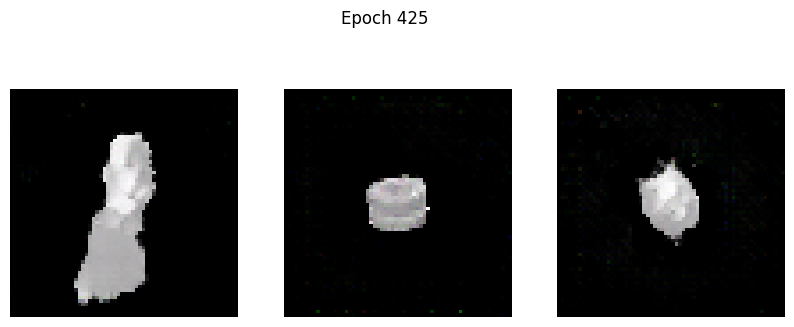

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0682 - g_loss: 5.2106
Epoch 426/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0520 - g_loss: 5.3450

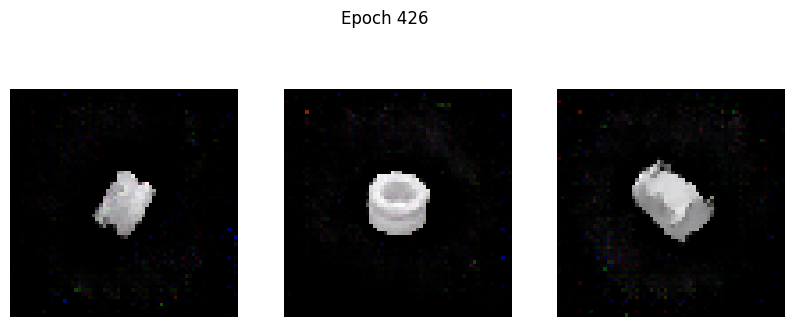

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0517 - g_loss: 5.3474
Epoch 427/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0354 - g_loss: 5.5569

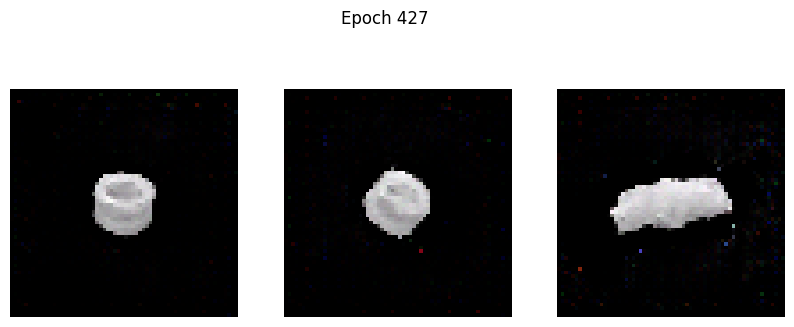

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0353 - g_loss: 5.5579
Epoch 428/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0474 - g_loss: 5.6574

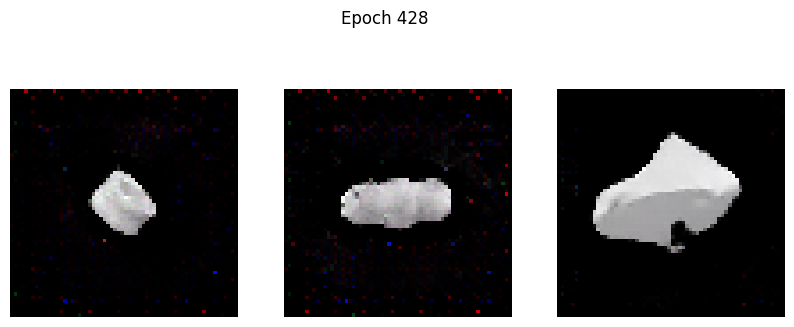

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0472 - g_loss: 5.6581
Epoch 429/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0625 - g_loss: 5.7467

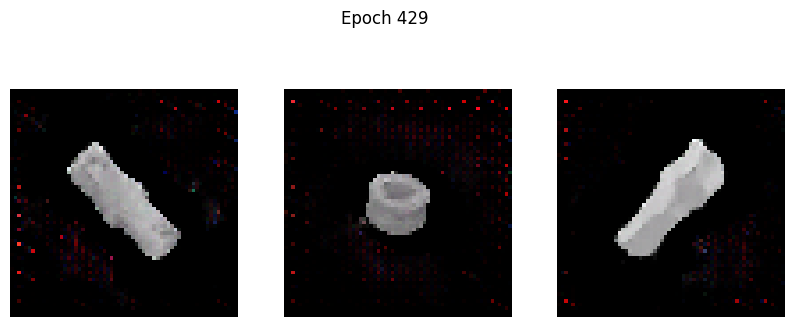

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0615 - g_loss: 5.7497
Epoch 430/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.1461 - g_loss: 6.3530

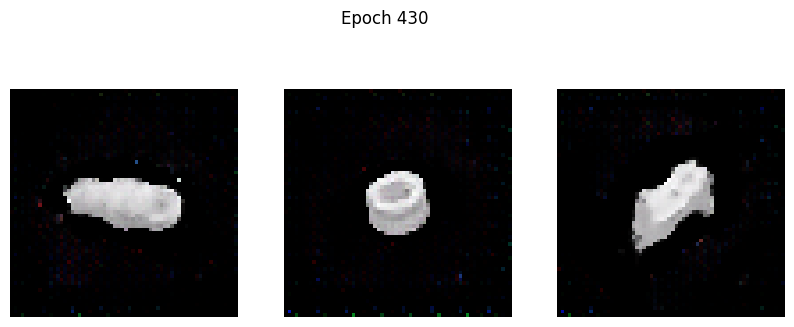

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.1449 - g_loss: 6.3478
Epoch 431/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0326 - g_loss: 5.7307

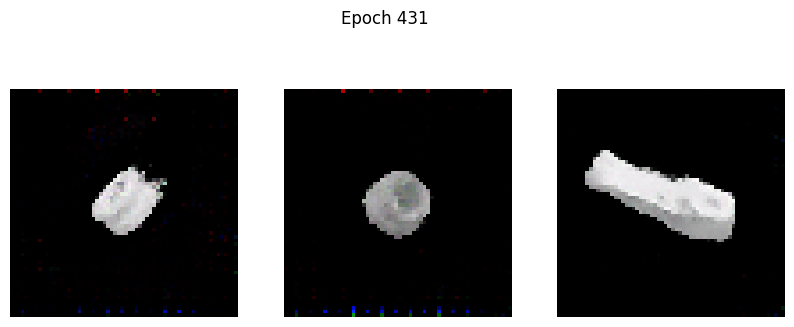

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0329 - g_loss: 5.7286
Epoch 432/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0777 - g_loss: 5.8842

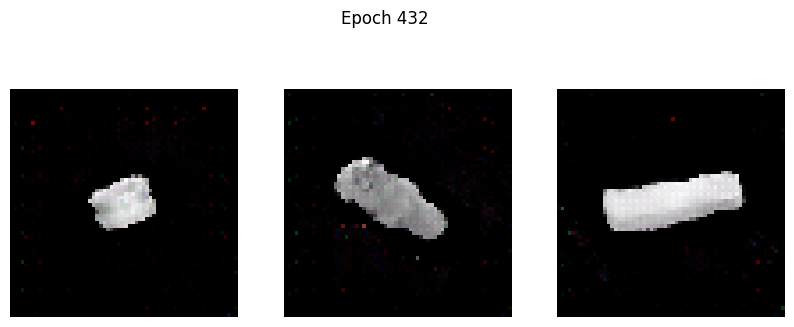

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0774 - g_loss: 5.8844
Epoch 433/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0878 - g_loss: 5.5425

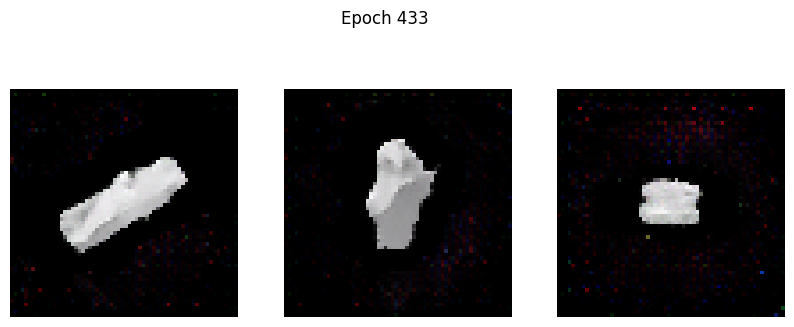

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0875 - g_loss: 5.5450
Epoch 434/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0460 - g_loss: 5.9513

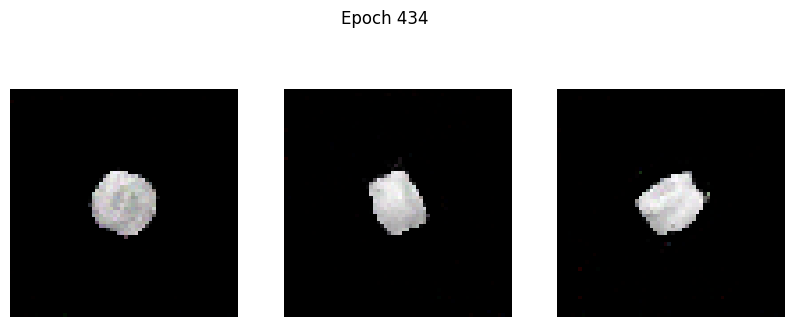

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0459 - g_loss: 5.9523
Epoch 435/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0106 - g_loss: 5.9691

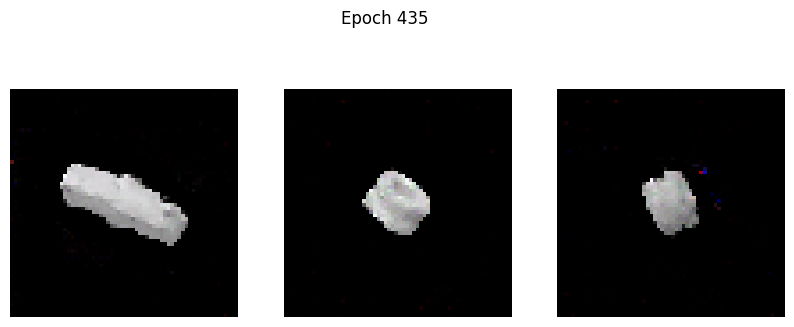

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0102 - g_loss: 5.9673
Epoch 436/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0325 - g_loss: 5.7331

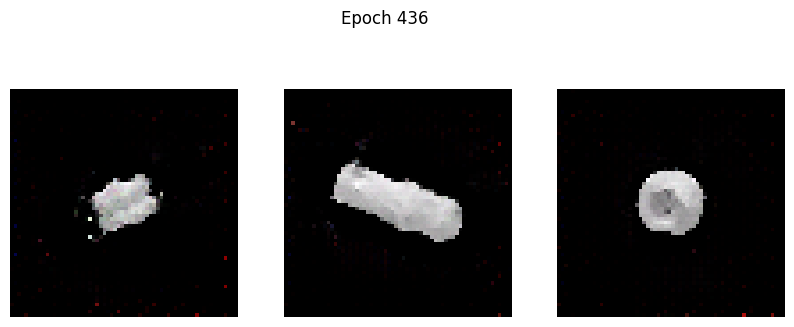

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0325 - g_loss: 5.7326
Epoch 437/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0451 - g_loss: 6.1688

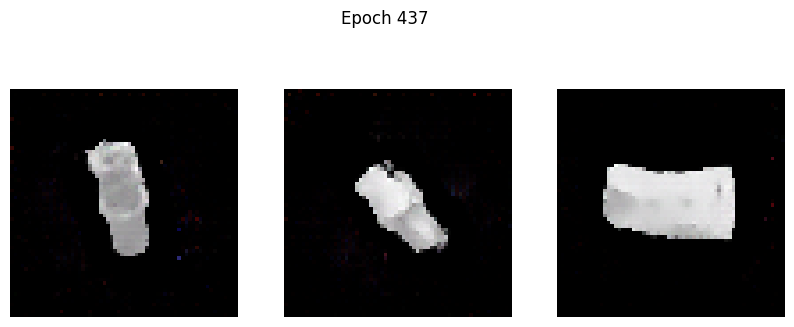

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0450 - g_loss: 6.1692
Epoch 438/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0640 - g_loss: 5.8584

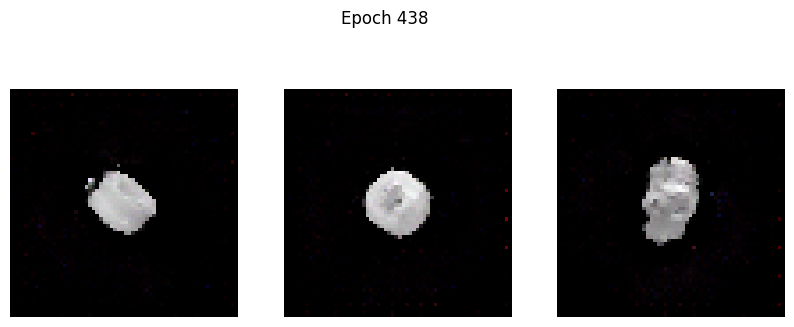

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0635 - g_loss: 5.8611
Epoch 439/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0838 - g_loss: 5.7439

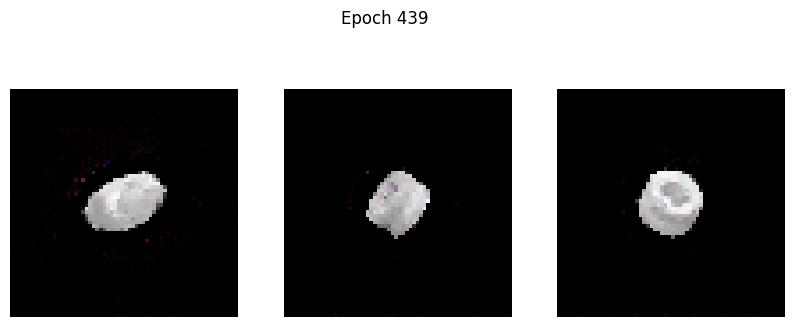

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0836 - g_loss: 5.7446
Epoch 440/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0219 - g_loss: 6.1298

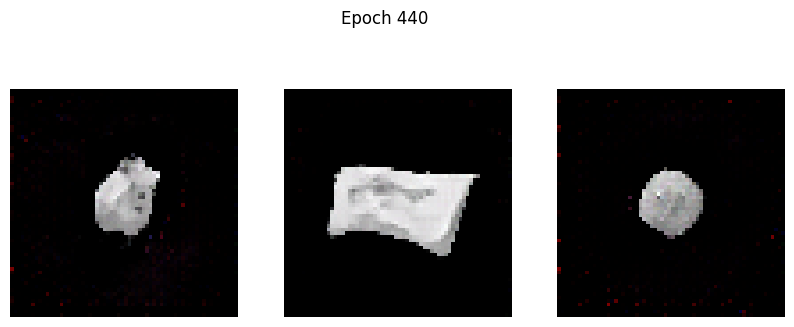

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0223 - g_loss: 6.1315
Epoch 441/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0865 - g_loss: 5.6036

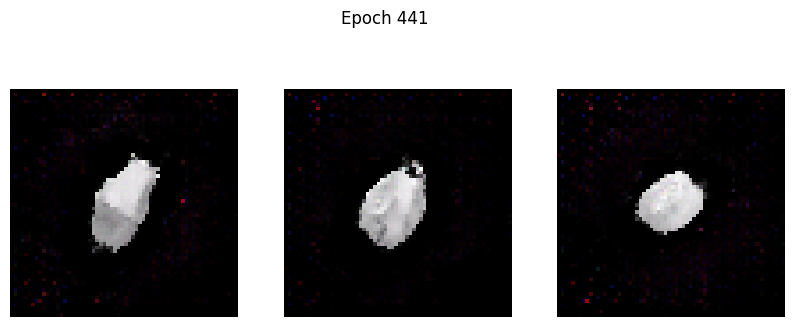

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0862 - g_loss: 5.6045
Epoch 442/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0429 - g_loss: 6.1280

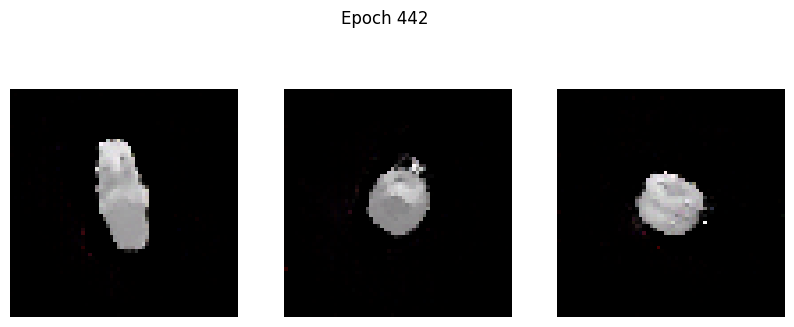

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - d_loss: -0.0427 - g_loss: 6.1274
Epoch 443/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: -0.0111 - g_loss: 5.6816

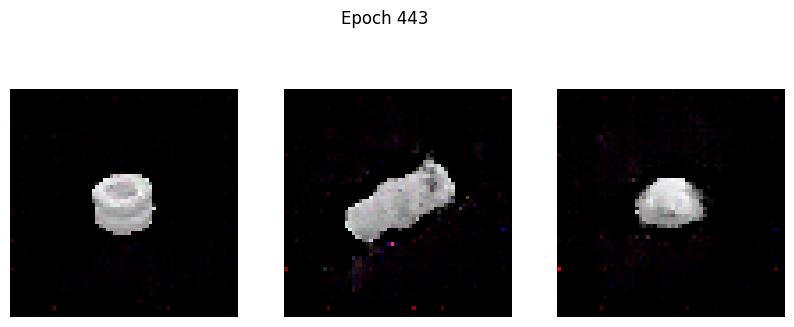

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.0115 - g_loss: 5.6810
Epoch 444/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: 0.0213 - g_loss: 6.1982

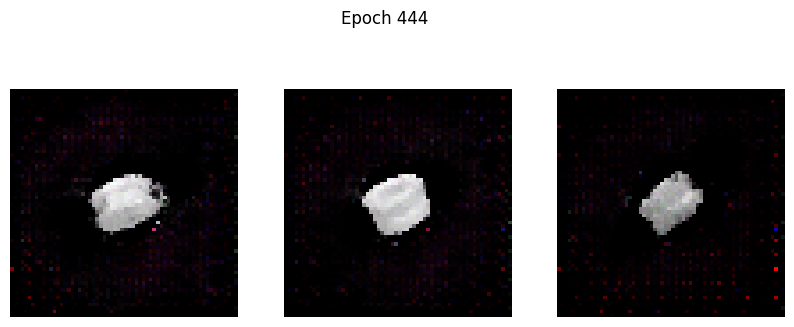

100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 137ms/step - d_loss: 0.0211 - g_loss: 6.1980
Epoch 445/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0591 - g_loss: 5.9234

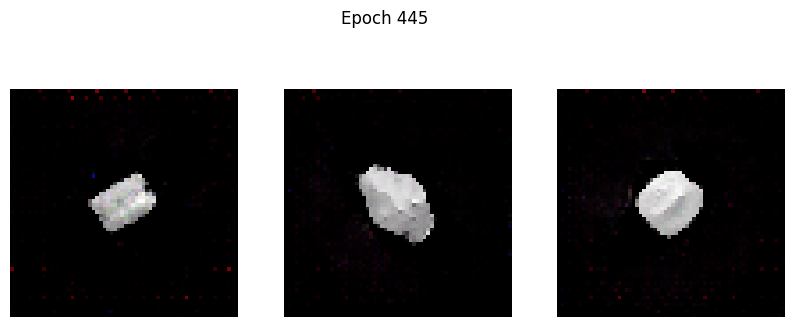

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0590 - g_loss: 5.9252
Epoch 446/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0362 - g_loss: 6.3702

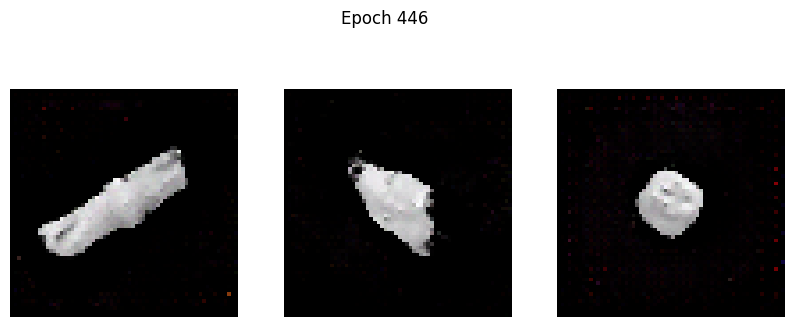

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0358 - g_loss: 6.3704
Epoch 447/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0617 - g_loss: 6.1091

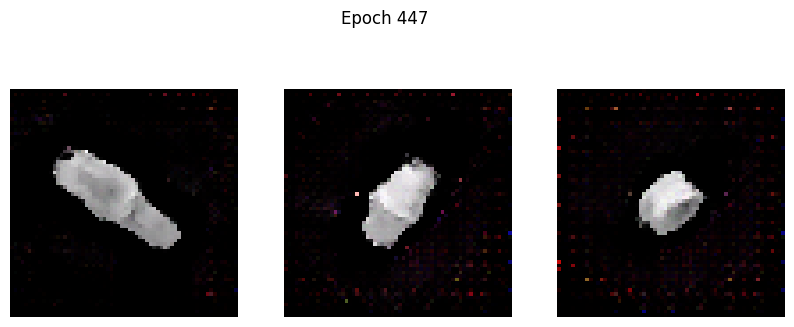

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0614 - g_loss: 6.1105
Epoch 448/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0853 - g_loss: 5.8918

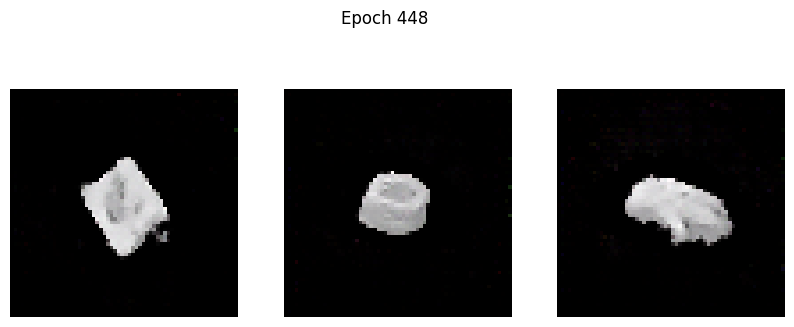

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0851 - g_loss: 5.8920
Epoch 449/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0081 - g_loss: 6.2795

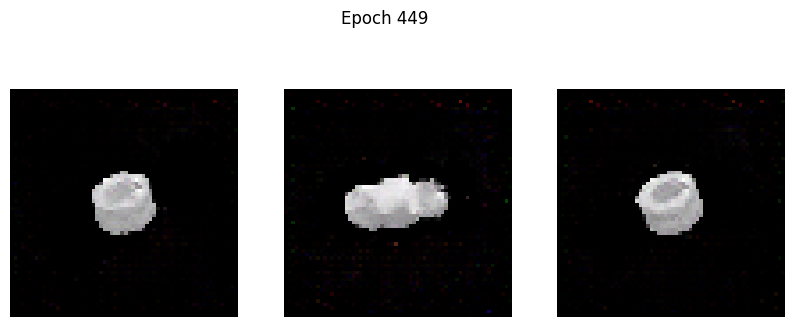

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0081 - g_loss: 6.2787
Epoch 450/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1221 - g_loss: 5.7671

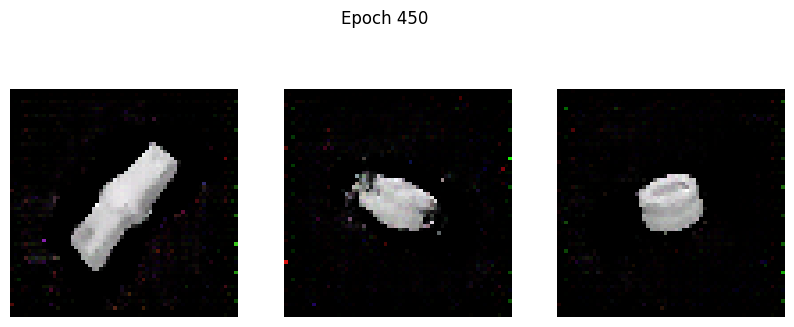

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1218 - g_loss: 5.7682
Epoch 451/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0418 - g_loss: 6.3973

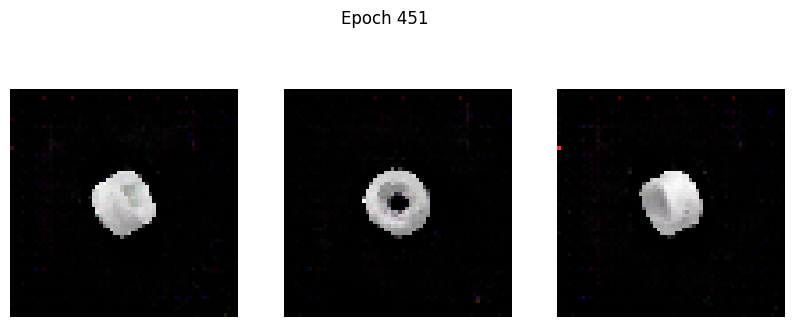

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0419 - g_loss: 6.3948
Epoch 452/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0546 - g_loss: 6.1097

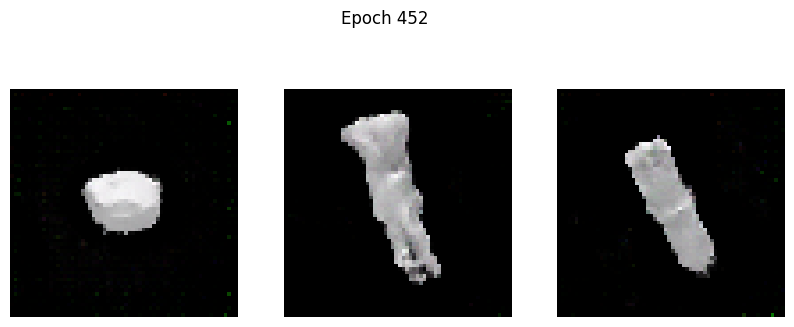

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0548 - g_loss: 6.1092
Epoch 453/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1270 - g_loss: 5.8589

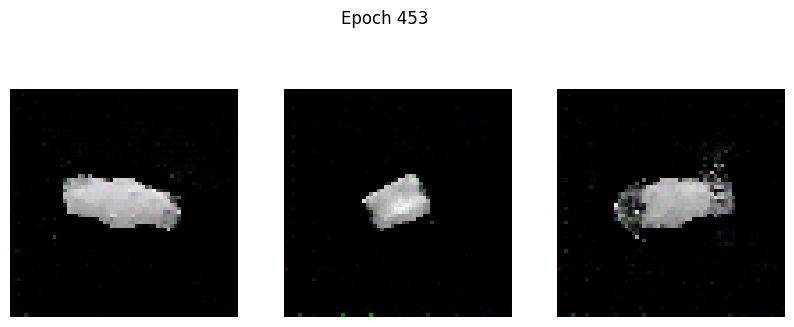

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1265 - g_loss: 5.8611
Epoch 454/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0521 - g_loss: 6.3364

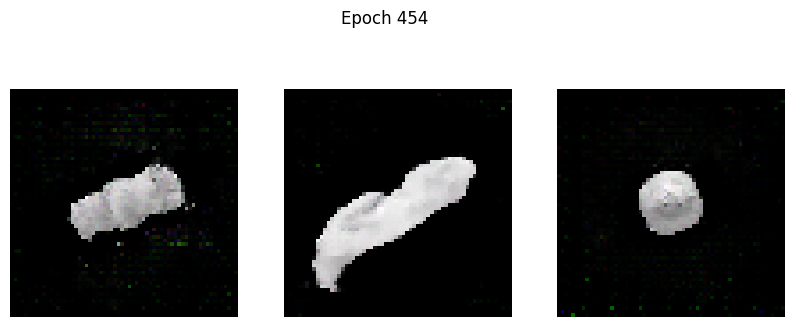

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0520 - g_loss: 6.3355
Epoch 455/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0241 - g_loss: 6.3288

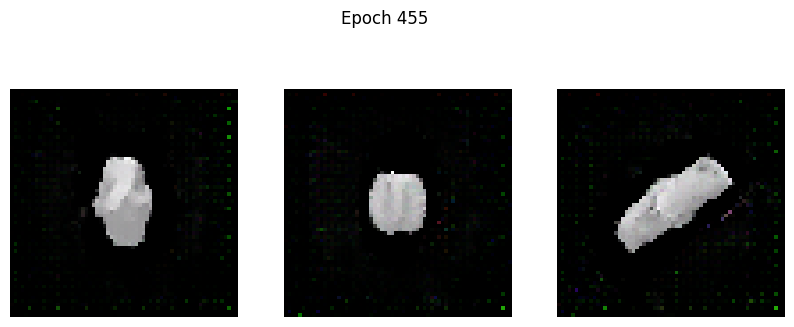

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0248 - g_loss: 6.3249
Epoch 456/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0504 - g_loss: 6.2801

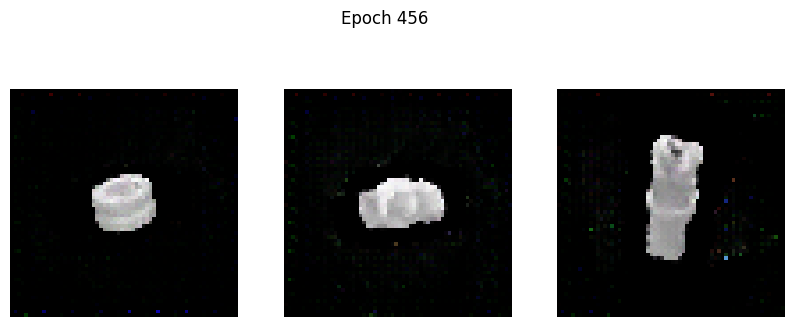

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0504 - g_loss: 6.2804
Epoch 457/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0503 - g_loss: 6.2980

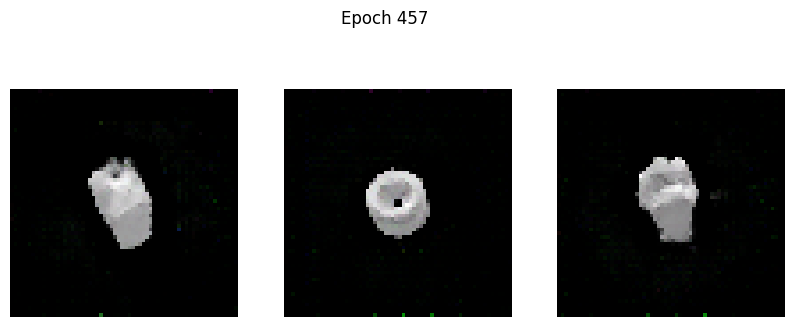

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0504 - g_loss: 6.2956
Epoch 458/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0591 - g_loss: 6.2943

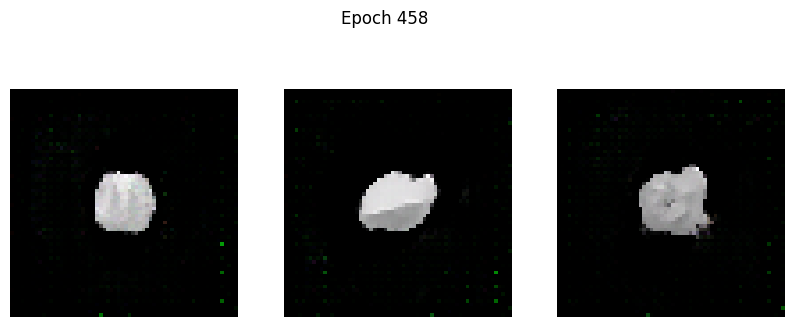

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0590 - g_loss: 6.2940
Epoch 459/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0265 - g_loss: 6.3501

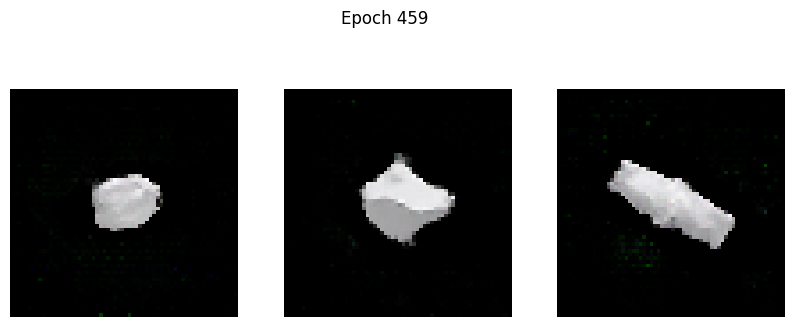

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0266 - g_loss: 6.3505
Epoch 460/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1088 - g_loss: 6.0735

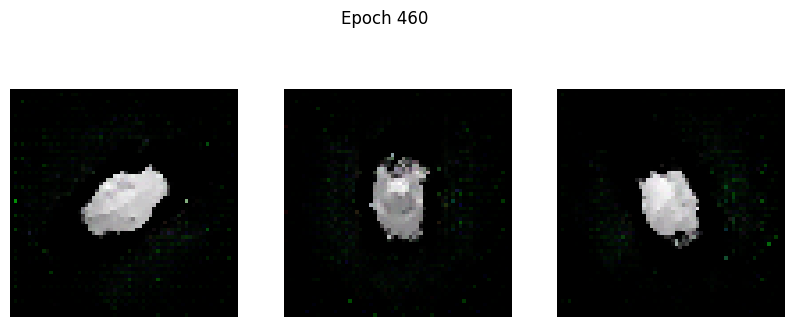

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1087 - g_loss: 6.0733
Epoch 461/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1056 - g_loss: 5.8623

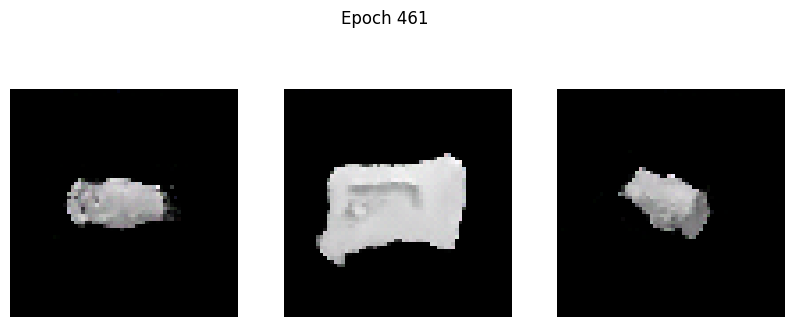

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1051 - g_loss: 5.8662
Epoch 462/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1282 - g_loss: 6.1533

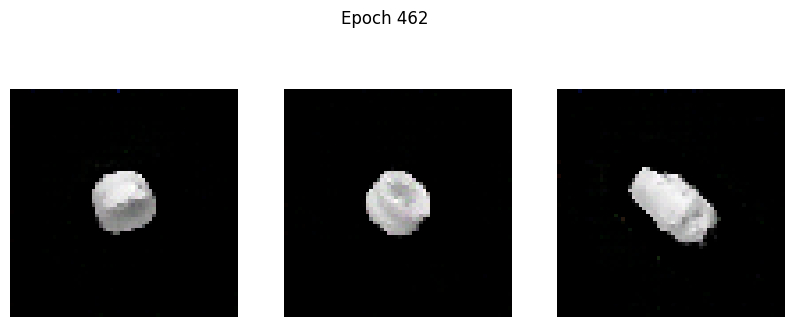

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1275 - g_loss: 6.1589
Epoch 463/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0444 - g_loss: 6.3929

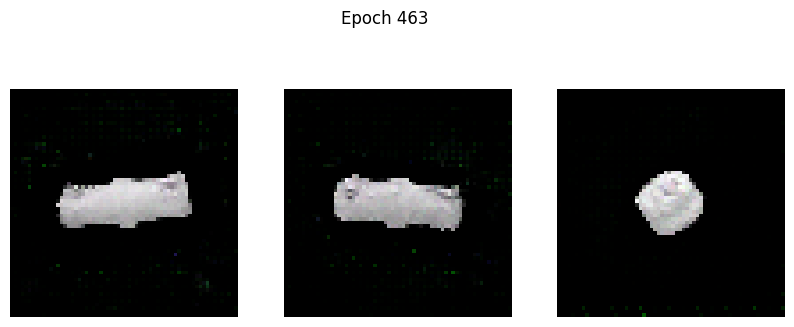

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0446 - g_loss: 6.3913
Epoch 464/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1261 - g_loss: 6.2024

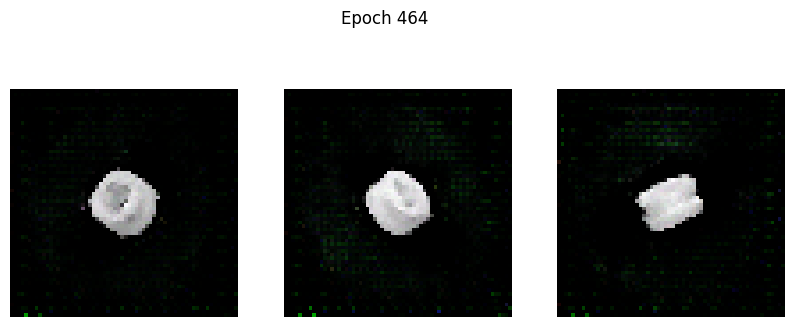

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1260 - g_loss: 6.2024
Epoch 465/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0481 - g_loss: 6.4724

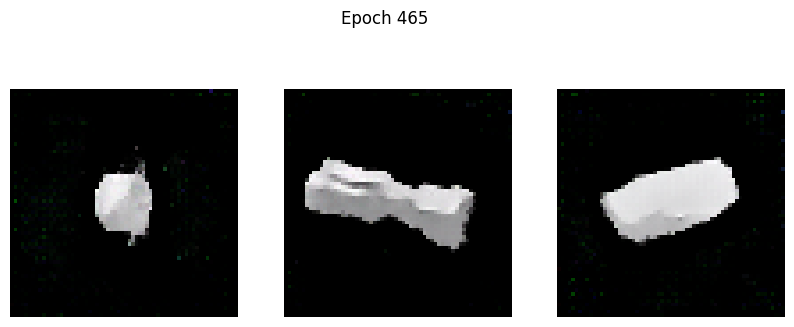

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0482 - g_loss: 6.4725
Epoch 466/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1269 - g_loss: 6.1890

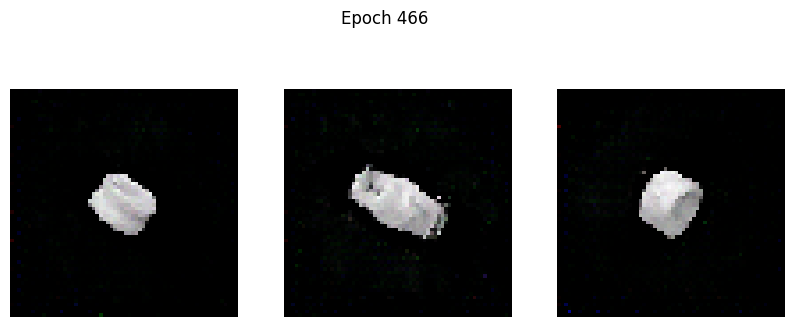

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1270 - g_loss: 6.1883
Epoch 467/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1424 - g_loss: 6.1083

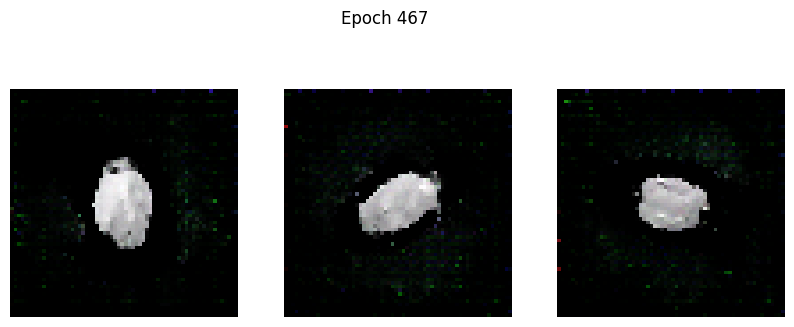

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1419 - g_loss: 6.1126
Epoch 468/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0624 - g_loss: 7.0479

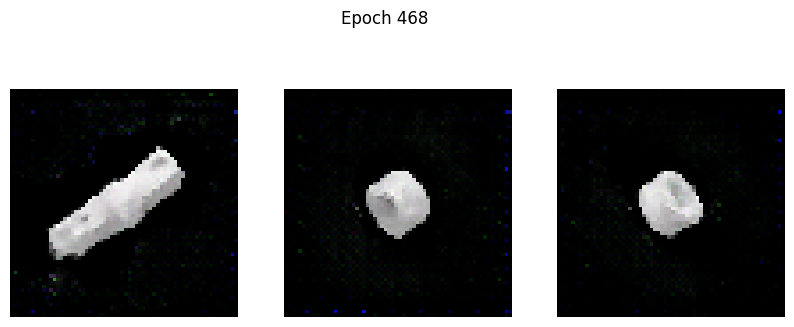

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0626 - g_loss: 7.0437
Epoch 469/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1119 - g_loss: 6.5559

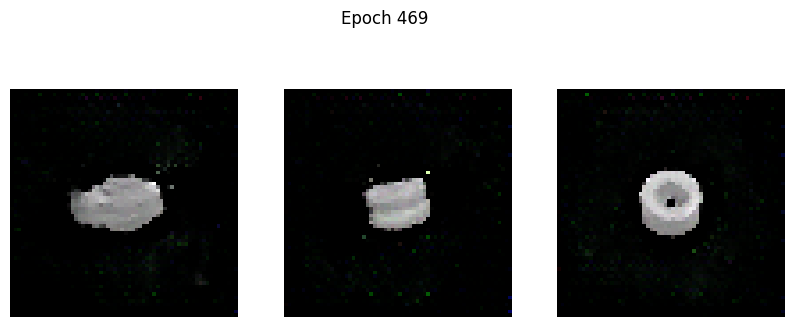

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1115 - g_loss: 6.5581
Epoch 470/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0952 - g_loss: 6.3196

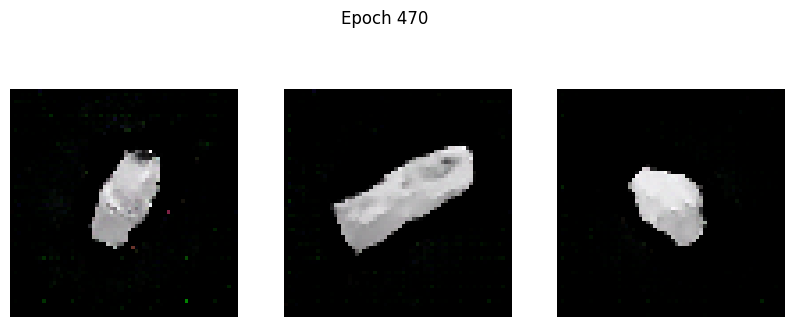

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0953 - g_loss: 6.3180
Epoch 471/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1634 - g_loss: 6.4838

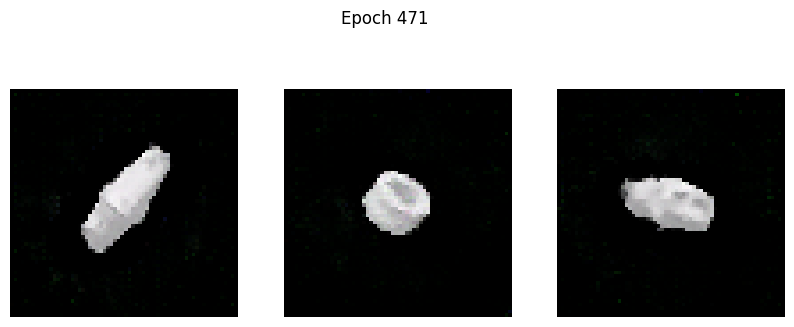

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1633 - g_loss: 6.4816
Epoch 472/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0724 - g_loss: 6.6438

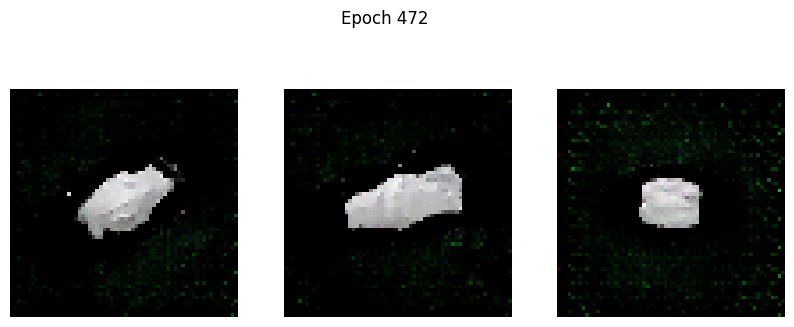

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0725 - g_loss: 6.6440
Epoch 473/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0366 - g_loss: 6.8035

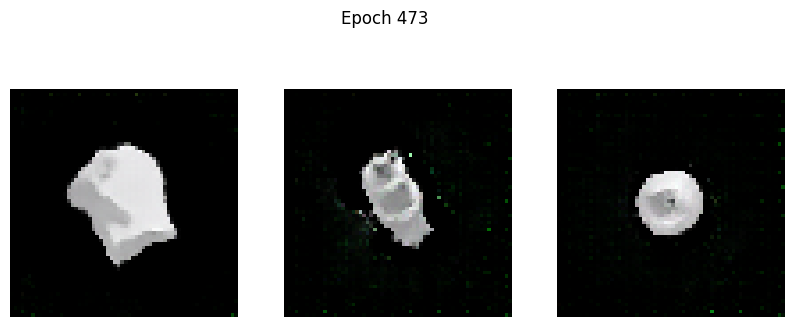

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0370 - g_loss: 6.8015
Epoch 474/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0279 - g_loss: 6.7027

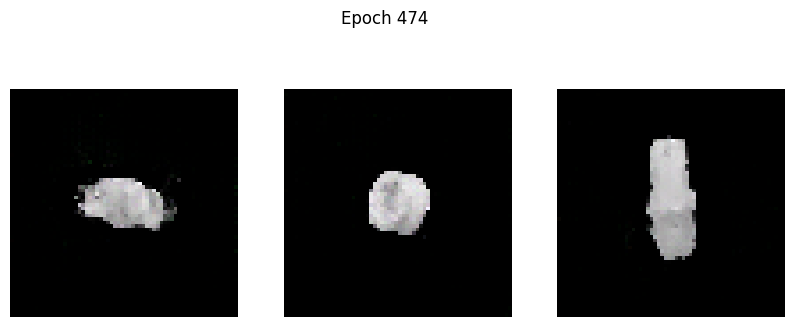

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0286 - g_loss: 6.6999
Epoch 475/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1257 - g_loss: 6.5383

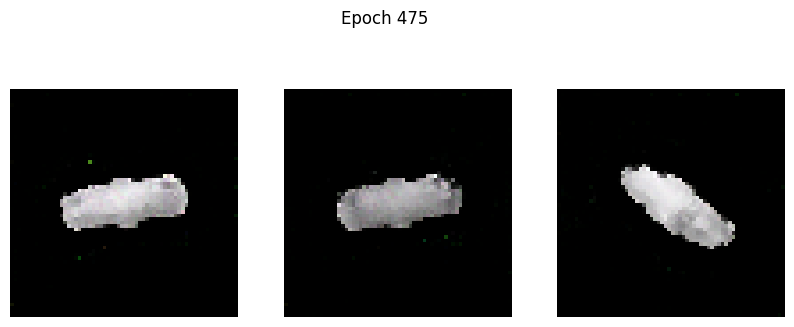

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1254 - g_loss: 6.5404
Epoch 476/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0953 - g_loss: 6.7519

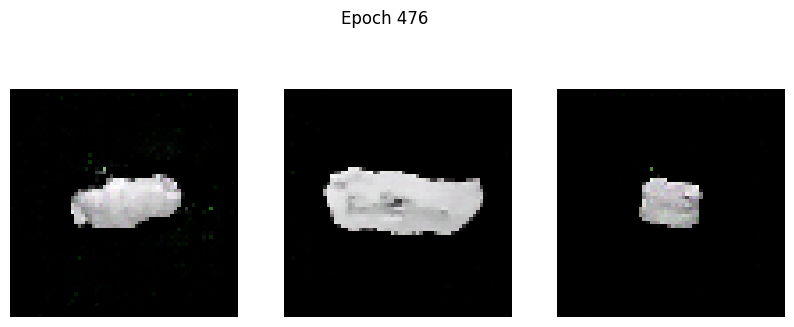

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0953 - g_loss: 6.7510
Epoch 477/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1536 - g_loss: 6.9307

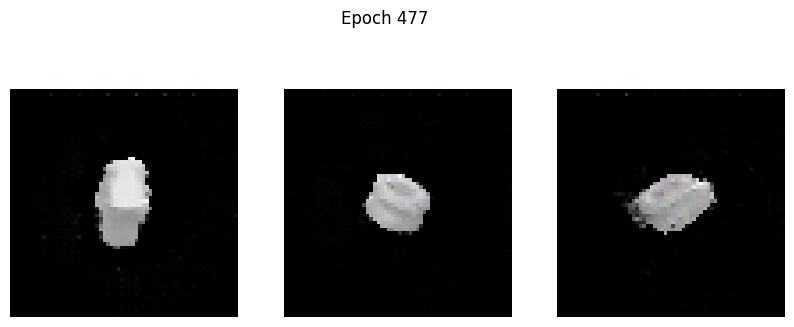

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1530 - g_loss: 6.9345
Epoch 478/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1027 - g_loss: 6.1405

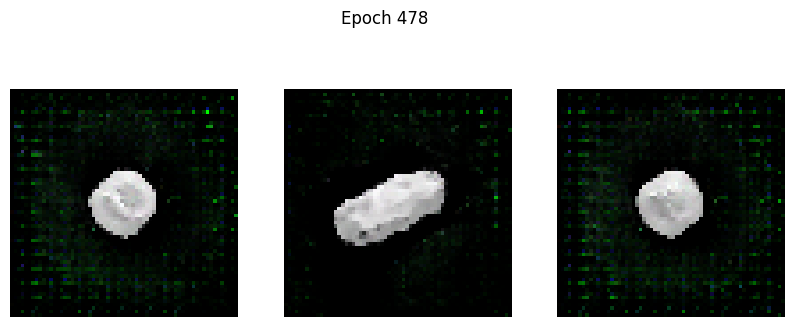

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1027 - g_loss: 6.1420
Epoch 479/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0670 - g_loss: 6.9696

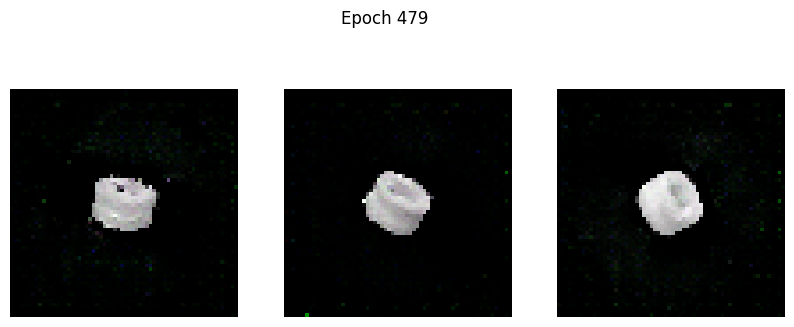

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0671 - g_loss: 6.9702
Epoch 480/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1240 - g_loss: 6.7241

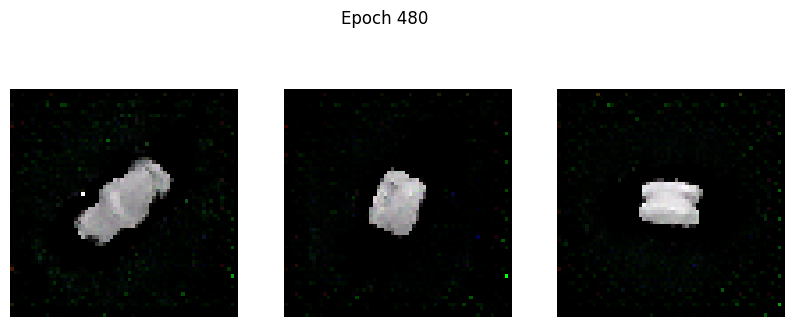

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1240 - g_loss: 6.7233
Epoch 481/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0782 - g_loss: 6.9398

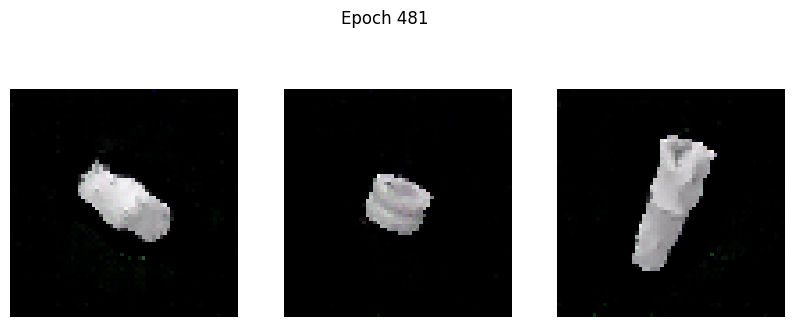

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0777 - g_loss: 6.9430
Epoch 482/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0977 - g_loss: 6.6054

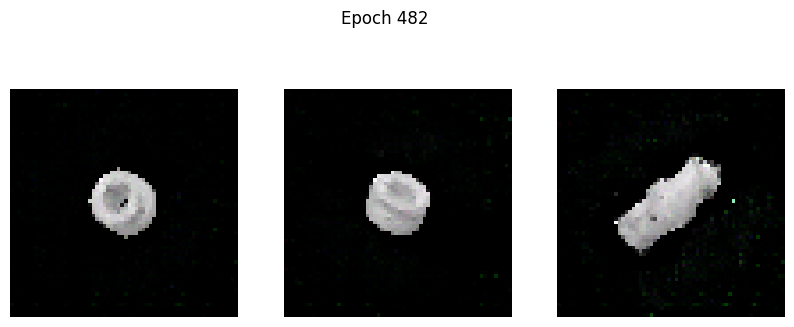

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - d_loss: -0.0982 - g_loss: 6.6041
Epoch 483/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: -0.1173 - g_loss: 6.7684

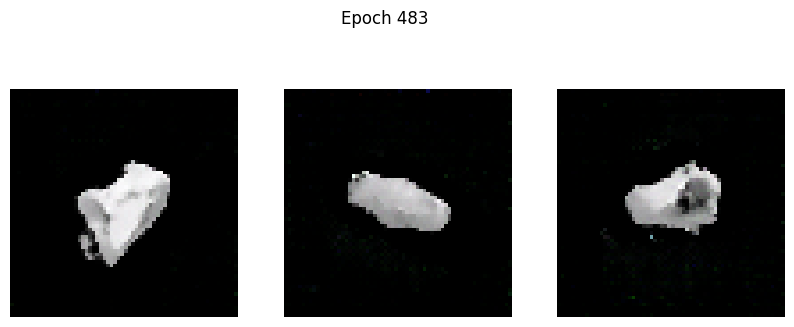

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.1170 - g_loss: 6.7680
Epoch 484/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: -0.1247 - g_loss: 6.8455

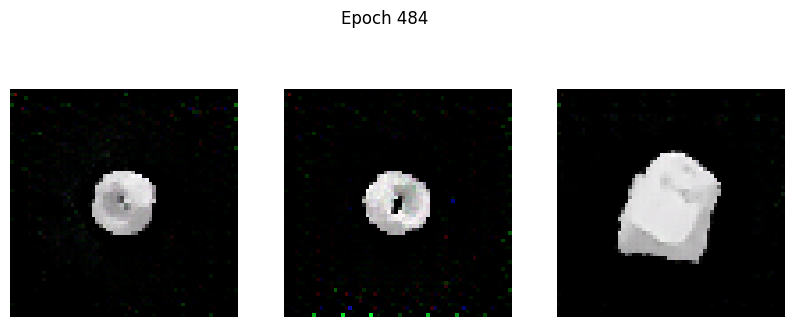

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.1247 - g_loss: 6.8467
Epoch 485/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1359 - g_loss: 6.7387

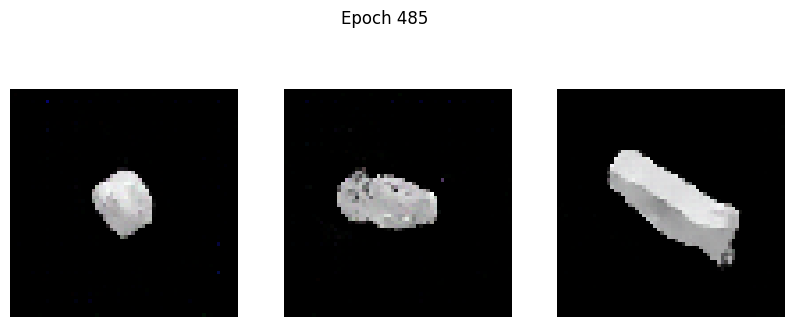

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1360 - g_loss: 6.7374
Epoch 486/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0969 - g_loss: 7.4273

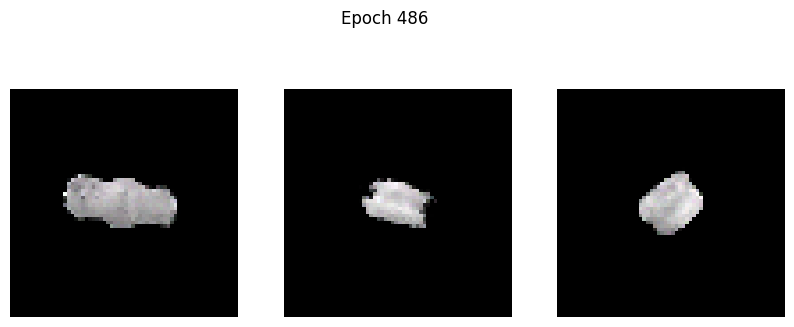

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0963 - g_loss: 7.4334
Epoch 487/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1631 - g_loss: 6.5699

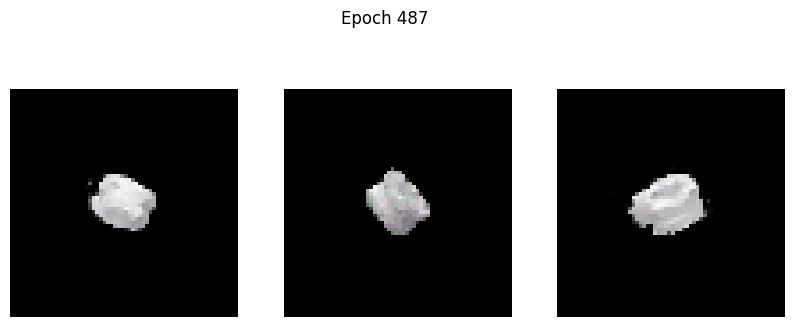

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1633 - g_loss: 6.5691
Epoch 488/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1111 - g_loss: 6.8785

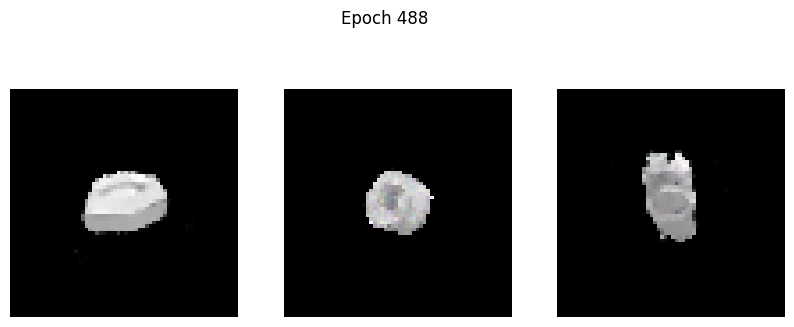

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1115 - g_loss: 6.8743
Epoch 489/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1489 - g_loss: 7.1072

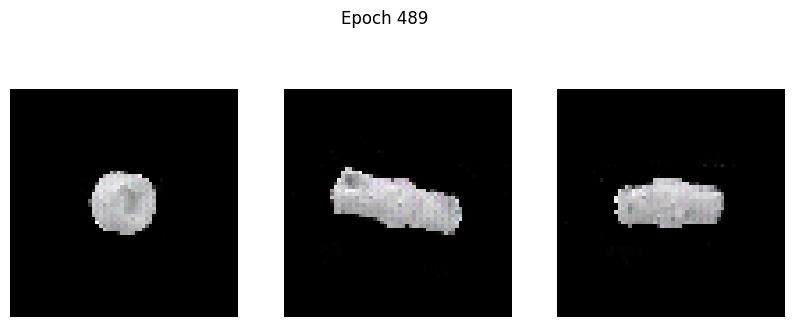

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1487 - g_loss: 7.1068
Epoch 490/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1517 - g_loss: 7.2420

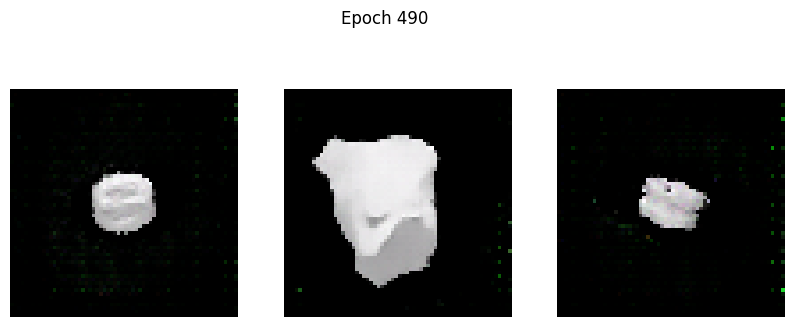

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1519 - g_loss: 7.2377
Epoch 491/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1504 - g_loss: 6.6931

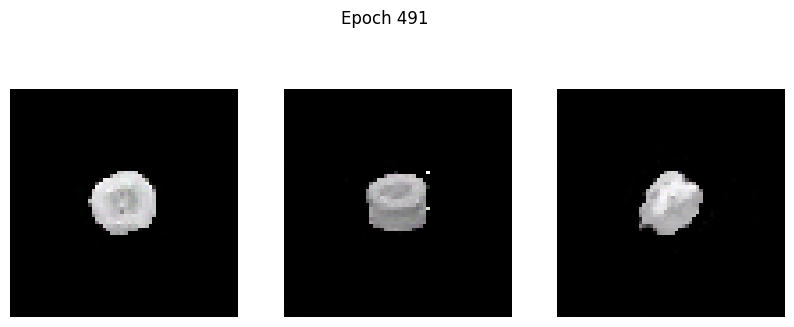

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1502 - g_loss: 6.6959
Epoch 492/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1271 - g_loss: 7.4773

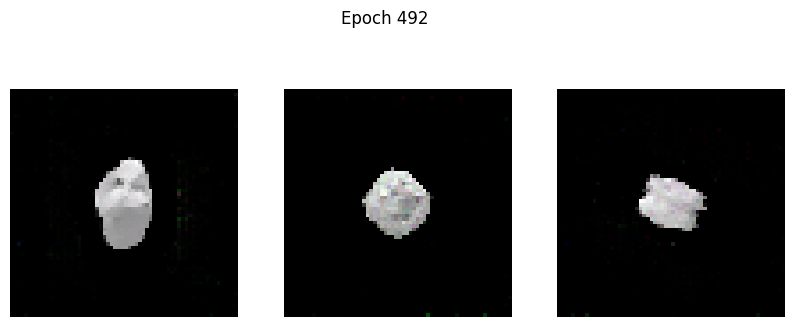

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1273 - g_loss: 7.4739
Epoch 493/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1016 - g_loss: 7.0952

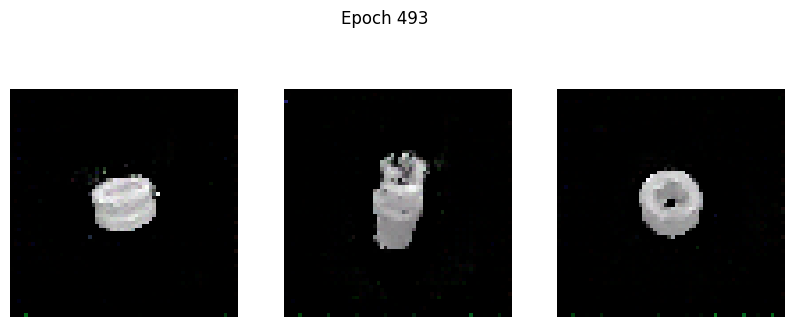

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1008 - g_loss: 7.1014
Epoch 494/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0604 - g_loss: 7.6772

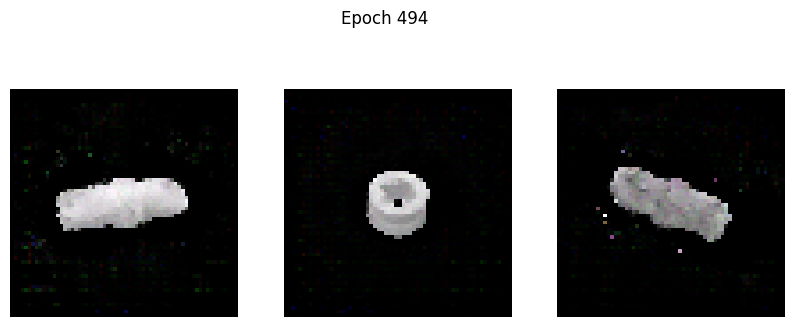

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0608 - g_loss: 7.6737
Epoch 495/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.2233 - g_loss: 6.8621

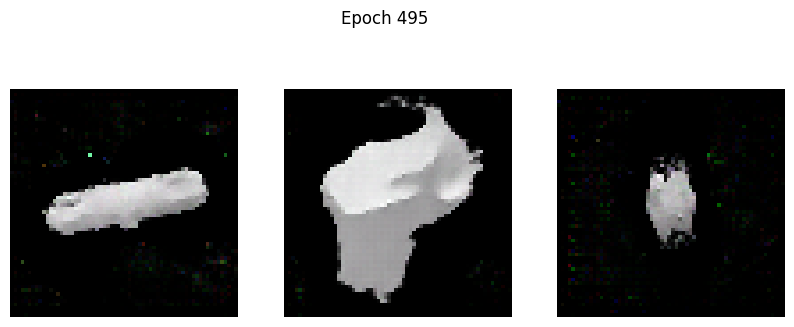

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.2228 - g_loss: 6.8651
Epoch 496/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0787 - g_loss: 7.4571

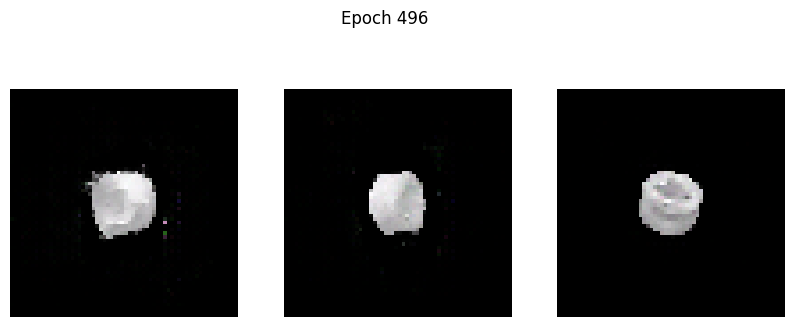

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - d_loss: -0.0791 - g_loss: 7.4549
Epoch 497/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: -0.2325 - g_loss: 6.7291

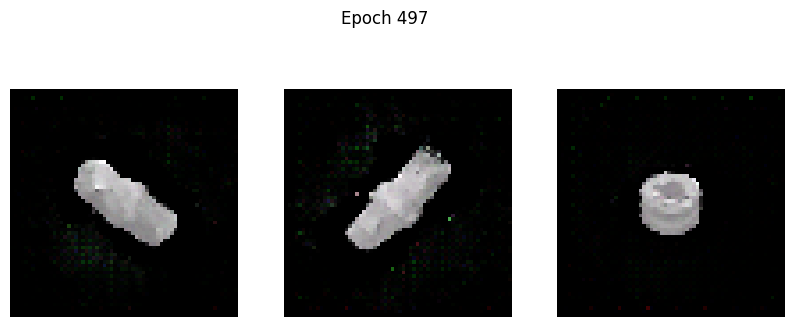

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.2325 - g_loss: 6.7309
Epoch 498/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - d_loss: -0.2102 - g_loss: 7.0243

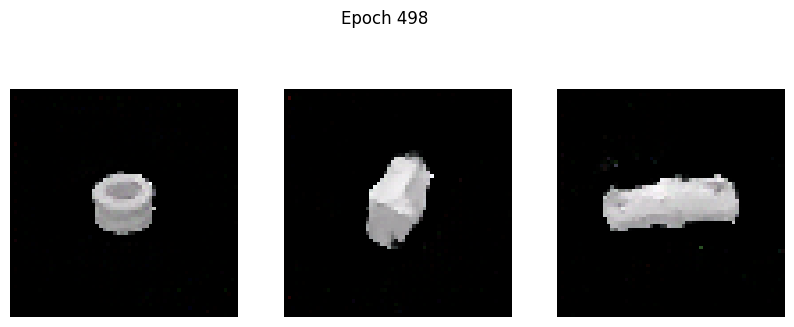

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - d_loss: -0.2101 - g_loss: 7.0224
Epoch 499/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1804 - g_loss: 7.0966

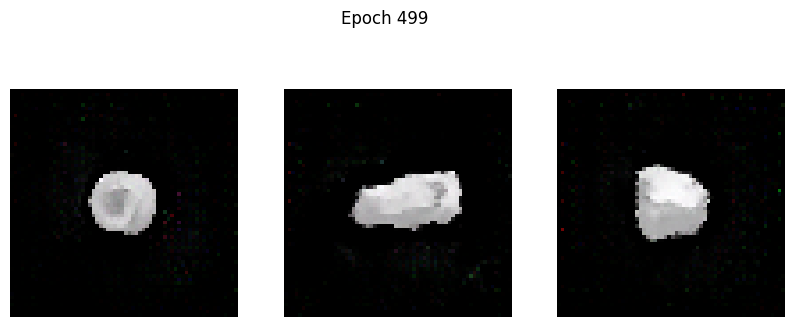

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1803 - g_loss: 7.0968
Epoch 500/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1503 - g_loss: 7.6329

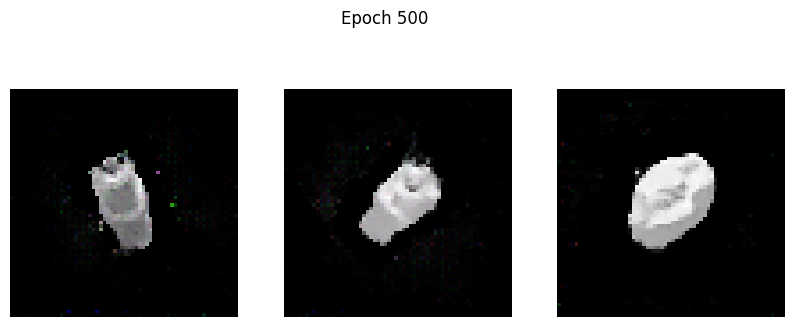

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1504 - g_loss: 7.6307


In [8]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

In [15]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

latent_dim = 128

In [16]:
# --- TUGAS 2: SIMPAN GENERATOR ---

# Menyimpan model generator ke dalam format .h5 atau .keras
# Pastikan variabel model generator-mu bernama 'generator'
generator.save('generator_dcgan_500epoch.h5')

print("Berhasil! Model Generator telah disimpan.")

Berhasil! Model Generator telah disimpan.


Menampilkan 5 gambar hasil generate:


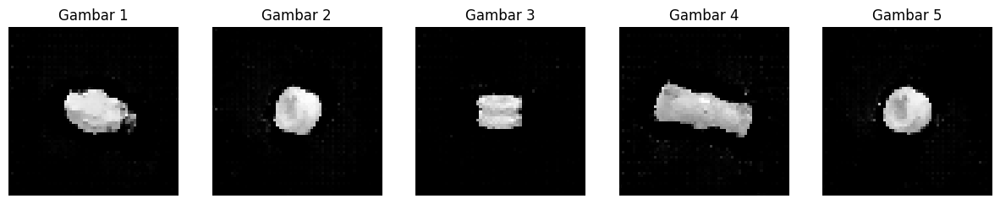

In [17]:
# --- TUGAS 3: GENERATE 5 GAMBAR BARU ---

def generate_and_show_images(model, num_images=5, noise_dim=100):
    # 1. Buat noise acak (latent vector)
    # noise_dim biasanya 100, sesuaikan dengan settingan trainingmu
    random_latent_vectors = tf.random.normal(shape=(num_images, noise_dim))

    # 2. Masukkan noise ke generator (training=False agar batchnorm jalan mode inferensi)
    generated_images = model(random_latent_vectors, training=False)

    # 3. Plotting (Menampilkan gambar)
    plt.figure(figsize=(15, 3))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        # Mengubah skala pixel dari [-1, 1] kembali ke [0, 1] untuk ditampilkan
        img = generated_images[i, :, :, 0] * 0.5 + 0.5
        plt.imshow(img, cmap='gray') # Gunakan cmap='gray' jika hitam putih
        plt.axis('off')
        plt.title(f"Gambar {i+1}")
    plt.show()

# Panggil fungsinya
print("Menampilkan 5 gambar hasil generate:")
generate_and_show_images(generator, num_images=5, noise_dim=latent_dim)

Menampilkan 5 gambar Latent Space Interpolation (Transisi):


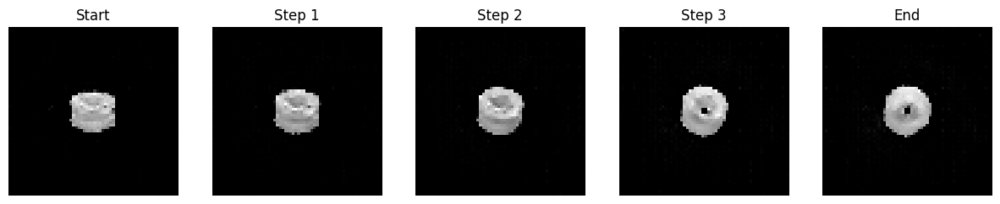

In [25]:
# --- TUGAS 4: LATENT SPACE INTERPOLATION ---

def interpolate_points(p1, p2, steps=5):
    # Fungsi untuk mencari titik-titik di antara p1 dan p2 (Linear Interpolation)
    ratios = np.linspace(0, 1, steps)
    vectors = []
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return np.array(vectors)

# 1. Tentukan 2 titik awal acak (Start dan End)
noise_dim = latent_dim # Sesuaikan dengan modelmu, gunakan latent_dim yang sudah didefinisikan
start_point = tf.random.normal(shape=(1, noise_dim))
end_point = tf.random.normal(shape=(1, noise_dim))

# 2. Buat interpolasi (5 langkah transisi)
interpolated_vectors = interpolate_points(start_point, end_point, steps=5)
# Bentuk ulang array agar sesuai input model (5, noise_dim)
interpolated_vectors = tf.reshape(interpolated_vectors, (5, noise_dim))

# 3. Generate gambar dari vektor interpolasi
interpolated_images = generator(interpolated_vectors, training=False)

# 4. Tampilkan Transisinya
plt.figure(figsize=(15, 3))
print("Menampilkan 5 gambar Latent Space Interpolation (Transisi):")
for i in range(5):
    plt.subplot(1, 5, i+1)
    img = interpolated_images[i, :, :, 0] * 0.5 + 0.5
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    if i == 0:
        plt.title("Start")
    elif i == 4:
        plt.title("End")
    else:
        plt.title(f"Step {i}")
plt.show()